In [1]:
import numpy as np
import pandas as pd

from matplotlib import rcParams

from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import feature_utils, dict_utils, evaluation_utils, train_utils, plot_utils
import os, warnings, time

c:\Users\lawna\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\lawna\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
c:\Users\lawna\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
import matplotlib.font_manager
from IPython.core.display import HTML

def make_html(fontname):
    return "<p>{font}: <span style='font-family:{font}; font-size: 24px;'>{font}</p>".format(font=fontname)

code = "\n".join([make_html(font) for font in sorted(set([f.name for f in matplotlib.font_manager.fontManager.ttflist]))])

HTML("<div style='column-count: 2;'>{}</div>".format(code))

rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = 'Verdana'

warnings.filterwarnings('ignore')

In [3]:
# Load the battery dictionary
battDict = np.load(os.path.join('.', 'batteryDictionary.npy'), allow_pickle=True).item()

In [4]:
# Create features from the battery dictionary
T_V = feature_utils.create_T_V(battDict = battDict, cycleList = [str(x) for x in range(2,111)], avgUpToCycle=110)
dTdV = feature_utils.create_dTdV(battDict = battDict, cycleList = [str(x) for x in range(2,111)], avgUpToCycle=110)

TVKeynameUnique = dict_utils.get_unique_keyname_tuple(T_V)
dTdVKeynameUnique = dict_utils.get_unique_keyname_tuple(dTdV)

In [5]:
# Set the markers automatically for train/test data, for plotting purposes
idx2C = []
idx3C = []

for i, cellNo in enumerate(battDict.keys()):
    if cellNo[0] == '2': idx2C.append(i)
    elif cellNo[0] == '3': idx3C.append(i)
        
train_index = np.array(idx3C)
test_index = np.array(idx2C)
markerArr = np.append(['v'] * len(idx3C), ['s'] * len(idx2C))

In [6]:
# Set y values as well as the splits based on batch
y_train = T_V['cycleLife'][train_index].reshape(-1, 1)
y_test = T_V['cycleLife'][test_index].reshape(-1, 1)
y_all = np.concatenate((y_train, y_test))

yScaler = MinMaxScaler().fit(y_train)
y_train_scaled = yScaler.transform(y_train)
y_test_scaled = yScaler.transform(y_test)
y_all_scaled = yScaler.transform(y_all)

lengthList = [len(train_index), len(train_index)+len(test_index)]

## Create dataframe


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -24.895953785710148
Cycle no: 2
Coefficient:
T_V('Charge', 'Variance', '2') : -0.04301668158741346
T_V('Charge', 'Mean', '2') : 0.1281909280535883
T_V('Charge', 'Skewness', '2') : 0.20848362236379409
dTdV('Charge', 'Maximum', '2') : 0.0006245481723844231
dTdV('Charge', 'Mean', '2') : -0.0
dTdV('Charge', 'Kurtosis', '2') : 0.060742787956023565

Intercept: 0.6202443280977314
MAE_all: 29.6
MAPE_all: 10.4 %
RMSE_all: 34.3
RMSPE_all: 12.0 %
MAE_train: 22.6
MAPE_train: 10.2 %
RMSE_train: 26.2
RMSPE_train: 12.4 %
MAE_test: 42.8
MAPE_test: 10.6 %
RMSE_test: 45.7
RMSPE_test: 11.3 %
R2 normal-scale scores
All data r2-score: 0.856
Train data r2-score: 0.843
Test data r2-score: -24.896

Normal-scale scores
All data score: 0.856
Train data score: 0.843
Test data score: -24.896


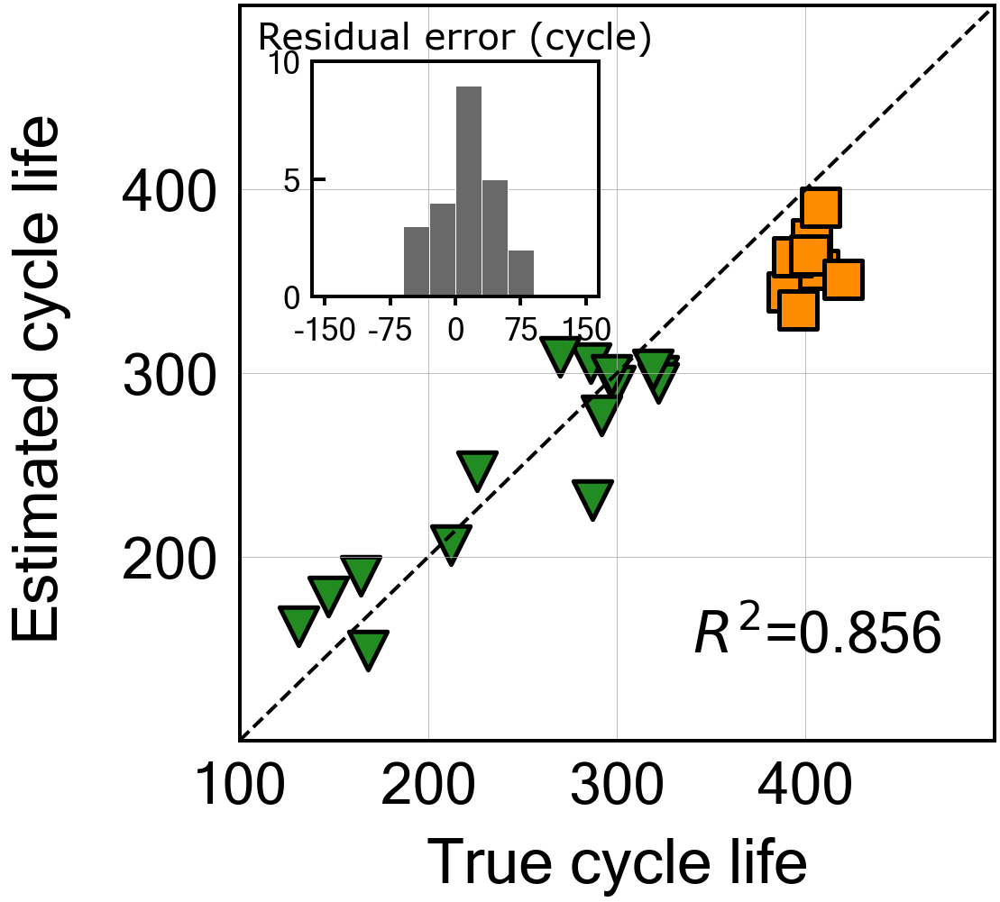


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -43.67499990338562
Cycle no: 3
Coefficient:
T_V('Charge', 'Variance', '3') : -0.0
T_V('Charge', 'Mean', '3') : 0.012637425397549555
T_V('Charge', 'Skewness', '3') : 0.2750666976324081
dTdV('Charge', 'Maximum', '3') : -0.0028098632536402474
dTdV('Charge', 'Mean', '3') : -0.0
dTdV('Charge', 'Kurtosis', '3') : -0.0

Intercept: 0.6202443280977314
MAE_all: 35.3
MAPE_all: 11.7 %
RMSE_all: 43.1
RMSPE_all: 14.7 %
MAE_train: 22.7
MAPE_train: 10.2 %
RMSE_train: 30.4
RMSPE_train: 14.6 %
MAE_test: 59.0
MAPE_test: 14.6 %
RMSE_test: 60.1
RMSPE_test: 14.8 %
R2 normal-scale scores
All data r2-score: 0.773
Train data r2-score: 0.788
Test data r2-score: -43.675

Normal-scale scores
All data score: 0.773
Train data score: 0.788
Test data score: -43.675


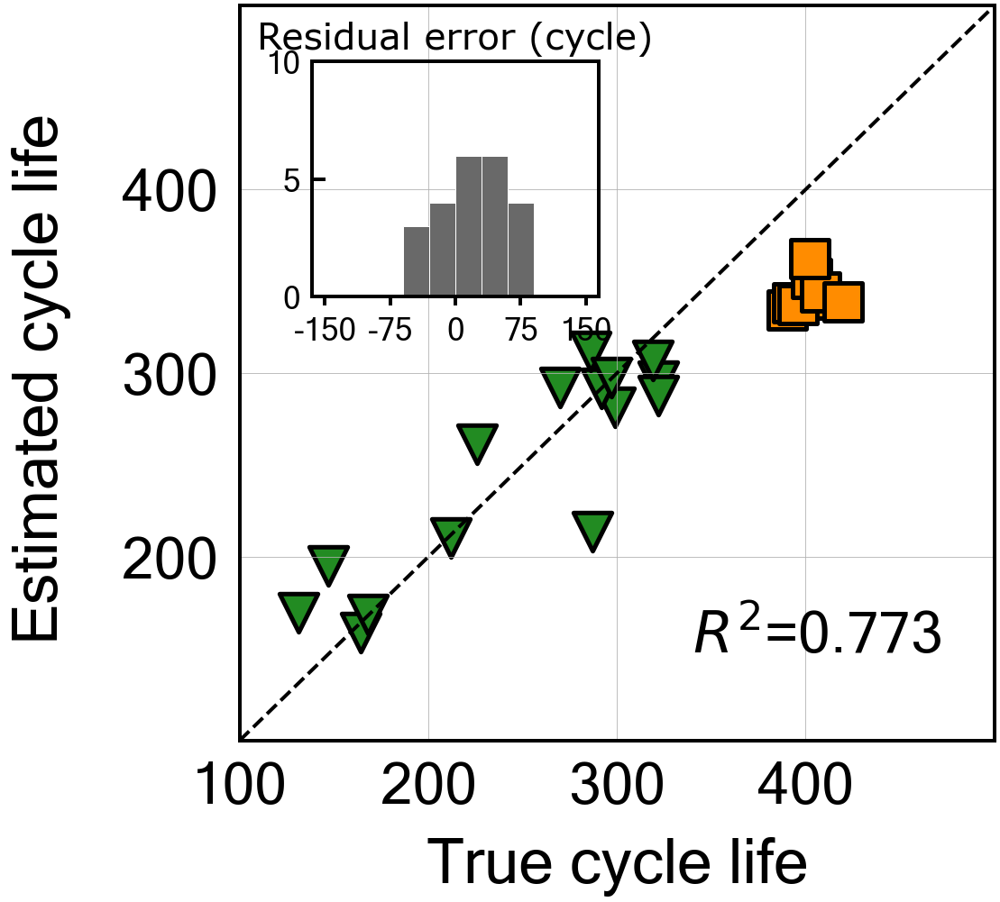


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -135.33920415274747
Cycle no: 4
Coefficient:
T_V('Charge', 'Variance', '4') : -1.1018574252965476
T_V('Charge', 'Mean', '4') : -0.34042032667019884
T_V('Charge', 'Skewness', '4') : 0.3684431693992535
dTdV('Charge', 'Maximum', '4') : -0.004471353664446499
dTdV('Charge', 'Mean', '4') : 1.2425476251988372
dTdV('Charge', 'Kurtosis', '4') : 0.043206909164337906

Intercept: 0.6202443280977339
MAE_all: 40.9
MAPE_all: 12.1 %
RMSE_all: 63.2
RMSPE_all: 16.9 %
MAE_train: 12.7
MAPE_train: 6.2 %
RMSE_train: 16.2
RMSPE_train: 8.7 %
MAE_test: 93.8
MAPE_test: 23.3 %
RMSE_test: 104.9
RMSPE_test: 26.1 %
R2 normal-scale scores
All data r2-score: 0.511
Train data r2-score: 0.940
Test data r2-score: -135.339

Normal-scale scores
All data score: 0.511
Train data score: 0.940
Test data score: -135.339


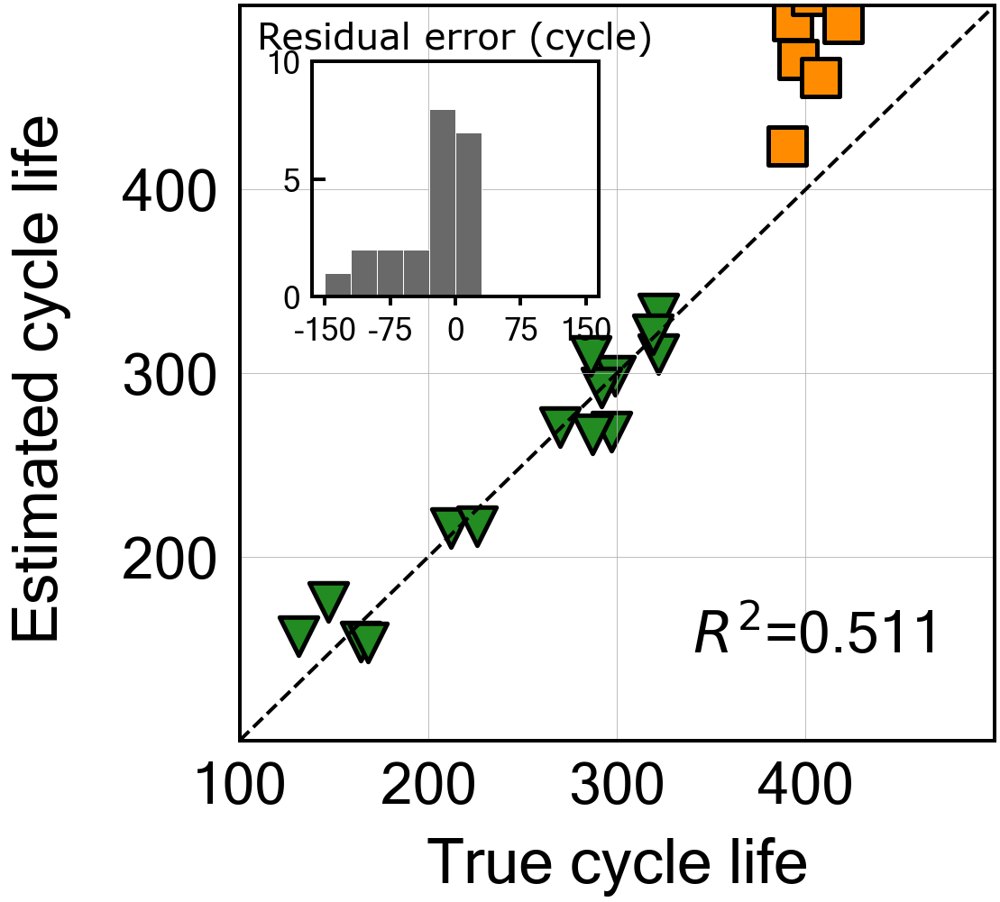


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -197.35345121140895
Cycle no: 5
Coefficient:
T_V('Charge', 'Variance', '5') : 0.007574547759491844
T_V('Charge', 'Mean', '5') : 0.12034379231220975
T_V('Charge', 'Skewness', '5') : 0.11001761985333547
dTdV('Charge', 'Maximum', '5') : -0.08692286707057237
dTdV('Charge', 'Mean', '5') : 0.07130618268571723
dTdV('Charge', 'Kurtosis', '5') : -0.029845868591342153

Intercept: 0.620244328097731
MAE_all: 59.0
MAPE_all: 18.0 %
RMSE_all: 78.6
RMSPE_all: 22.4 %
MAE_train: 23.9
MAPE_train: 11.2 %
RMSE_train: 30.6
RMSPE_train: 15.6 %
MAE_test: 124.7
MAPE_test: 30.9 %
RMSE_test: 126.5
RMSPE_test: 31.3 %
R2 normal-scale scores
All data r2-score: 0.244
Train data r2-score: 0.785
Test data r2-score: -197.353

Normal-scale scores
All data score: 0.244
Train data score: 0.785
Test data score: -197.353


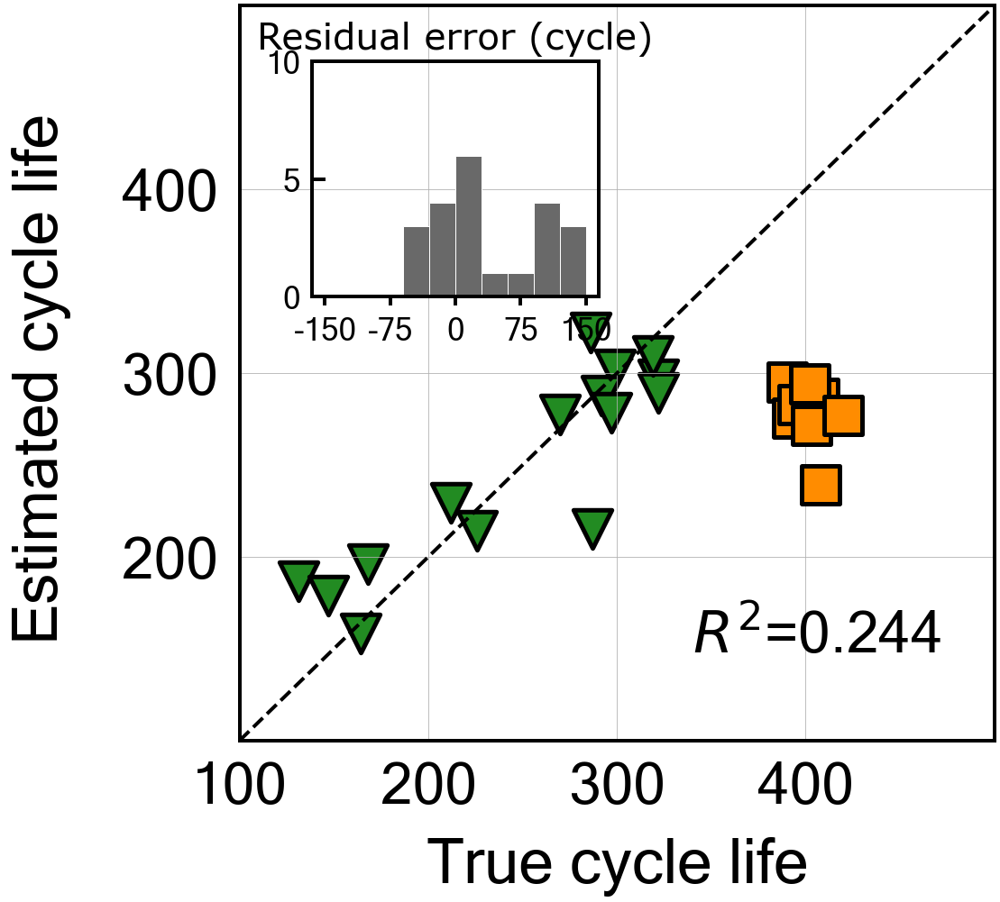


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -27.335429876660676
Cycle no: 6
Coefficient:
T_V('Charge', 'Variance', '6') : -0.0
T_V('Charge', 'Mean', '6') : 0.0
T_V('Charge', 'Skewness', '6') : 0.28005536305365036
dTdV('Charge', 'Maximum', '6') : 0.0
dTdV('Charge', 'Mean', '6') : -0.0
dTdV('Charge', 'Kurtosis', '6') : 0.0

Intercept: 0.6202443280977314
MAE_all: 30.0
MAPE_all: 10.4 %
RMSE_all: 36.4
RMSPE_all: 13.4 %
MAE_train: 21.2
MAPE_train: 9.7 %
RMSE_train: 28.6
RMSPE_train: 14.1 %
MAE_test: 46.6
MAPE_test: 11.5 %
RMSE_test: 47.8
RMSPE_test: 11.8 %
R2 normal-scale scores
All data r2-score: 0.838
Train data r2-score: 0.813
Test data r2-score: -27.335

Normal-scale scores
All data score: 0.838
Train data score: 0.813
Test data score: -27.335


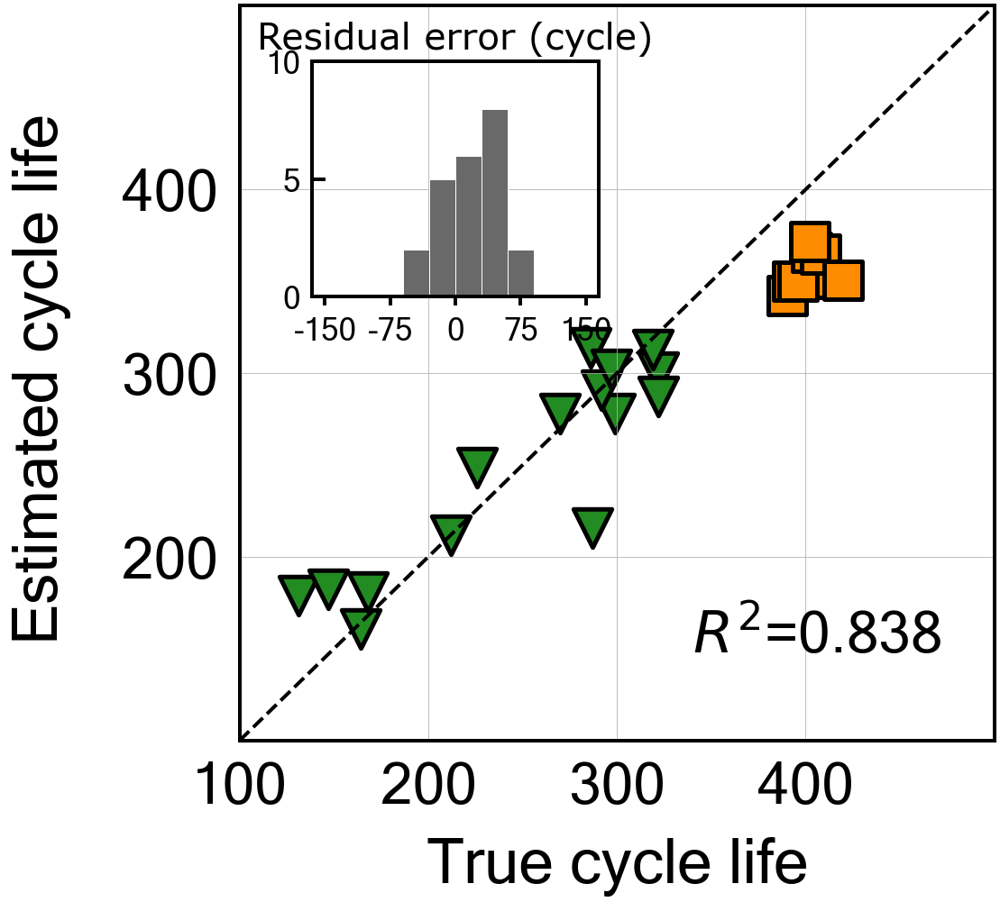


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -229.17291036193566
Cycle no: 7
Coefficient:
T_V('Charge', 'Variance', '7') : -0.0
T_V('Charge', 'Mean', '7') : 0.2818135729254281
T_V('Charge', 'Skewness', '7') : 0.025908187211532
dTdV('Charge', 'Maximum', '7') : 0.005838708070804673
dTdV('Charge', 'Mean', '7') : 0.0
dTdV('Charge', 'Kurtosis', '7') : 0.09642505896301325

Intercept: 0.6202443280977324
MAE_all: 62.6
MAPE_all: 18.9 %
RMSE_all: 83.8
RMSPE_all: 23.0 %
MAE_train: 24.0
MAPE_train: 11.2 %
RMSE_train: 29.1
RMSPE_train: 14.4 %
MAE_test: 134.8
MAPE_test: 33.4 %
RMSE_test: 136.3
RMSPE_test: 33.7 %
R2 normal-scale scores
All data r2-score: 0.142
Train data r2-score: 0.806
Test data r2-score: -229.173

Normal-scale scores
All data score: 0.142
Train data score: 0.806
Test data score: -229.173


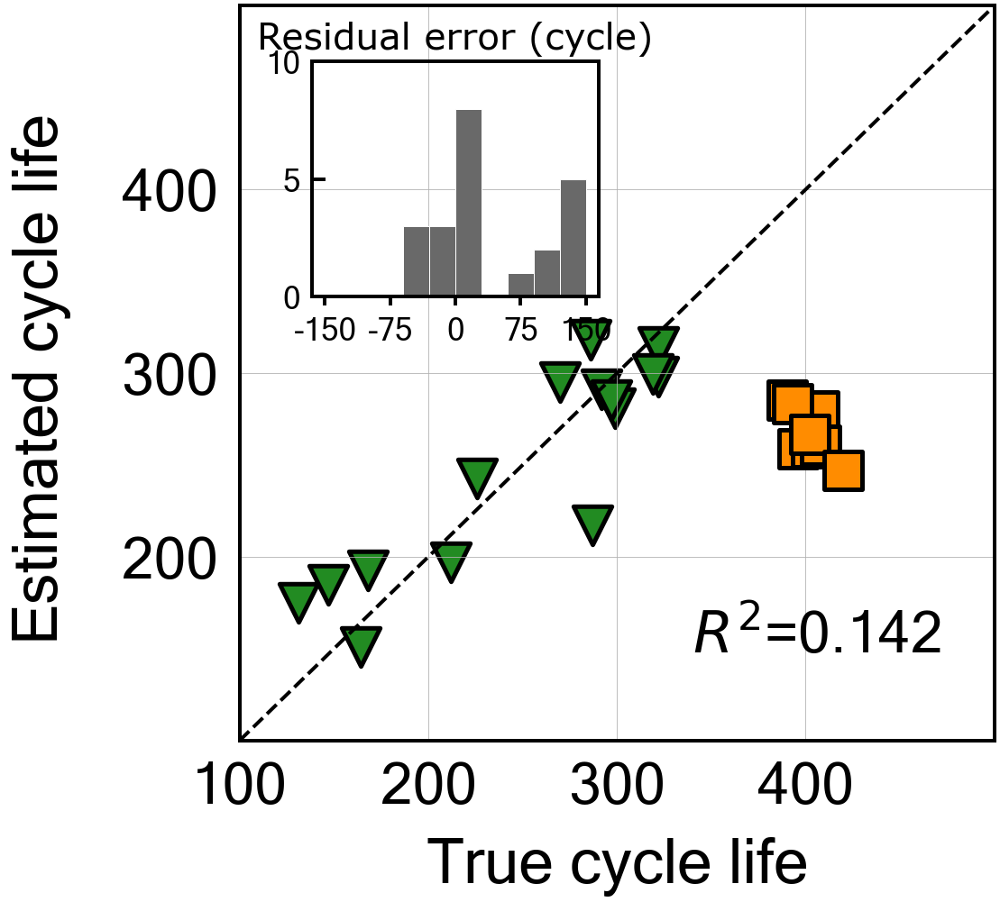


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -23.161290203246306
Cycle no: 8
Coefficient:
T_V('Charge', 'Variance', '8') : -0.06089531936776035
T_V('Charge', 'Mean', '8') : 0.11319943496479488
T_V('Charge', 'Skewness', '8') : 0.16907992358509122
dTdV('Charge', 'Maximum', '8') : 0.10246549821026305
dTdV('Charge', 'Mean', '8') : -0.031028982110240196
dTdV('Charge', 'Kurtosis', '8') : -0.008557303775789244

Intercept: 0.6202443280977317
MAE_all: 27.1
MAPE_all: 9.4 %
RMSE_all: 34.1
RMSPE_all: 12.8 %
MAE_train: 20.5
MAPE_train: 9.2 %
RMSE_train: 27.3
RMSPE_train: 13.7 %
MAE_test: 39.7
MAPE_test: 9.9 %
RMSE_test: 44.2
RMSPE_test: 11.0 %
R2 normal-scale scores
All data r2-score: 0.858
Train data r2-score: 0.829
Test data r2-score: -23.161

Normal-scale scores
All data score: 0.858
Train data score: 0.829
Test data score: -23.161


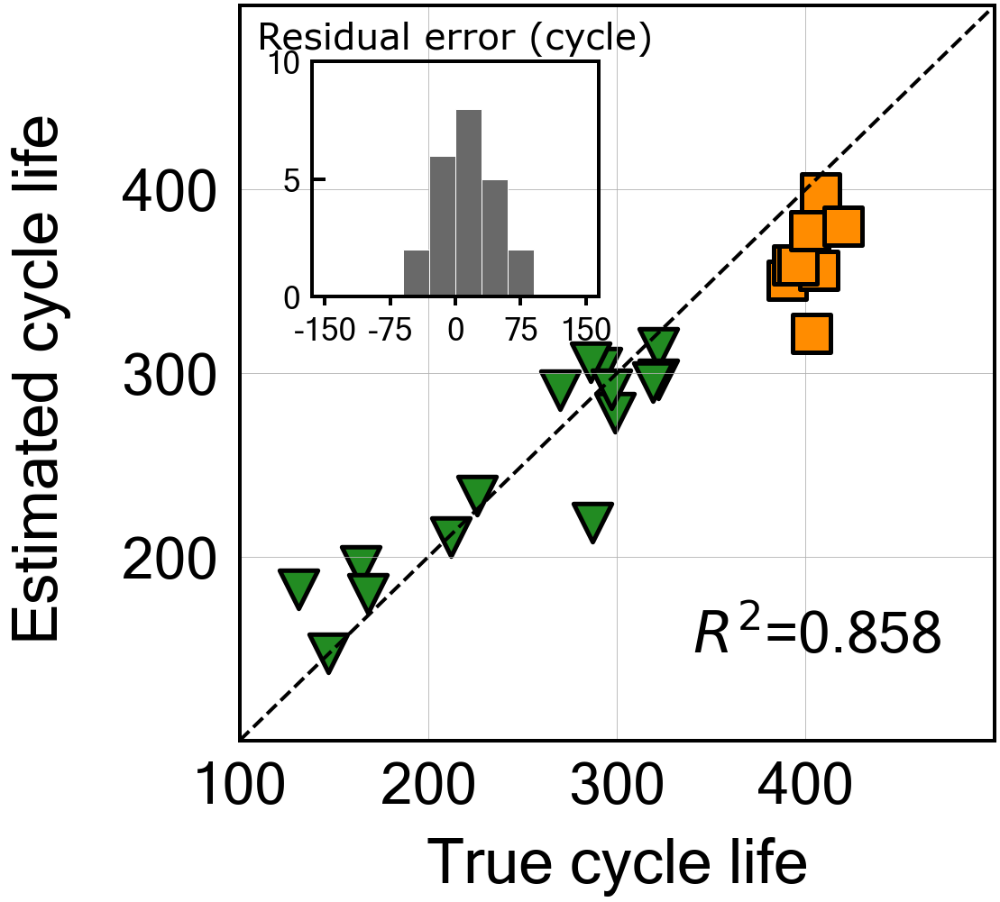


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -137.9169115958881
Cycle no: 9
Coefficient:
T_V('Charge', 'Variance', '9') : -0.0
T_V('Charge', 'Mean', '9') : 0.12781732466115464
T_V('Charge', 'Skewness', '9') : 0.11617953090548529
dTdV('Charge', 'Maximum', '9') : 0.0
dTdV('Charge', 'Mean', '9') : 0.0
dTdV('Charge', 'Kurtosis', '9') : -0.0

Intercept: 0.6202443280977312
MAE_all: 54.5
MAPE_all: 17.7 %
RMSE_all: 69.1
RMSPE_all: 22.0 %
MAE_train: 27.5
MAPE_train: 13.2 %
RMSE_train: 36.6
RMSPE_train: 19.3 %
MAE_test: 105.1
MAPE_test: 26.1 %
RMSE_test: 105.9
RMSPE_test: 26.2 %
R2 normal-scale scores
All data r2-score: 0.416
Train data r2-score: 0.692
Test data r2-score: -137.917

Normal-scale scores
All data score: 0.416
Train data score: 0.692
Test data score: -137.917


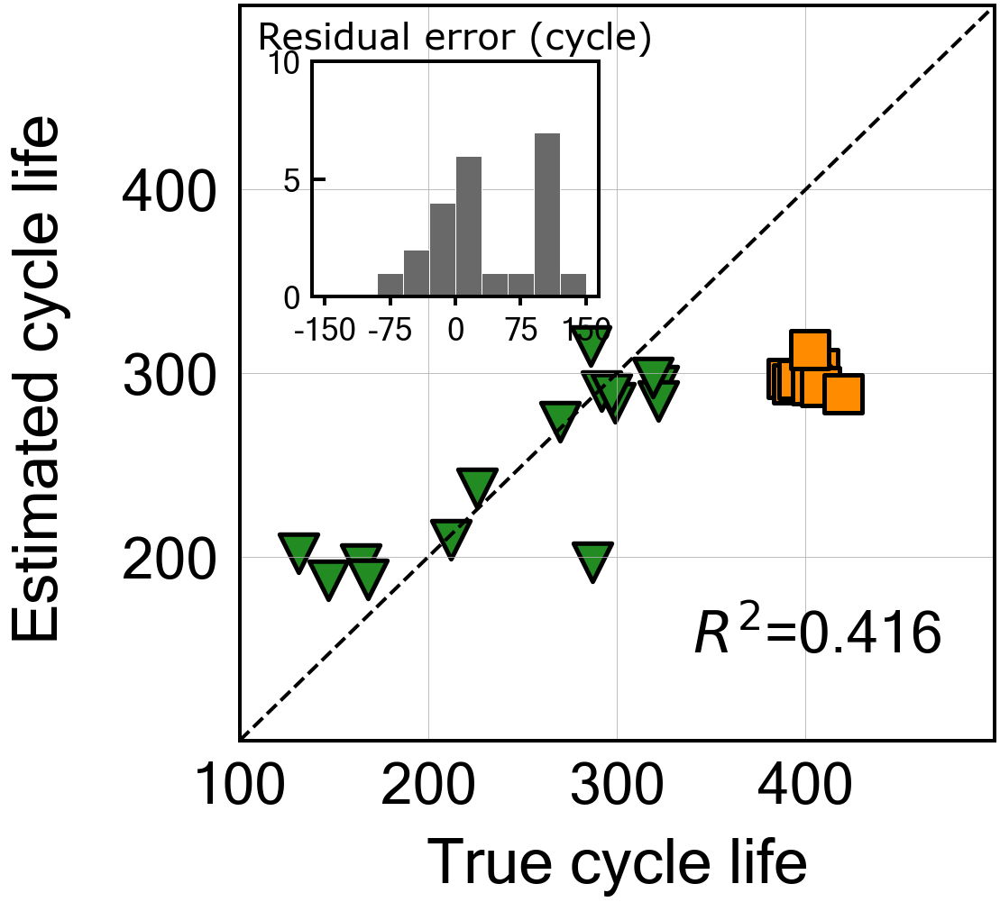


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -37.52327611479852
Cycle no: 10
Coefficient:
T_V('Charge', 'Variance', '10') : -0.0367220060978819
T_V('Charge', 'Mean', '10') : 0.060181276573633966
T_V('Charge', 'Skewness', '10') : 0.2330576964927437
dTdV('Charge', 'Maximum', '10') : 0.023546135621279597
dTdV('Charge', 'Mean', '10') : -0.0
dTdV('Charge', 'Kurtosis', '10') : 0.08582426687003253

Intercept: 0.6202443280977317
MAE_all: 30.3
MAPE_all: 10.0 %
RMSE_all: 38.5
RMSPE_all: 11.9 %
MAE_train: 20.1
MAPE_train: 8.8 %
RMSE_train: 24.9
RMSPE_train: 10.8 %
MAE_test: 49.5
MAPE_test: 12.3 %
RMSE_test: 55.8
RMSPE_test: 13.8 %
R2 normal-scale scores
All data r2-score: 0.818
Train data r2-score: 0.858
Test data r2-score: -37.523

Normal-scale scores
All data score: 0.818
Train data score: 0.858
Test data score: -37.523


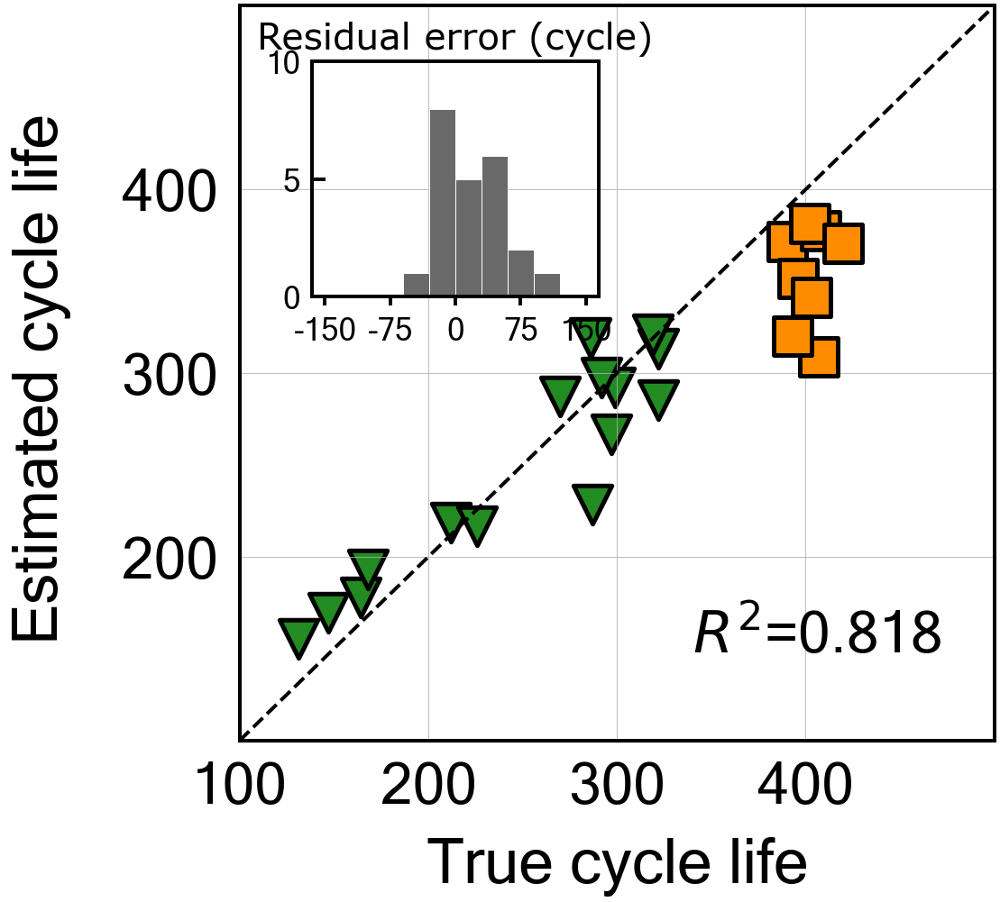


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -3.9346338543424872
Cycle no: 11
Coefficient:
T_V('Charge', 'Variance', '11') : -0.0
T_V('Charge', 'Mean', '11') : 0.0
T_V('Charge', 'Skewness', '11') : 0.29987401174867306
dTdV('Charge', 'Maximum', '11') : -0.054421290815983056
dTdV('Charge', 'Mean', '11') : -0.0
dTdV('Charge', 'Kurtosis', '11') : -0.0

Intercept: 0.6202443280977311
MAE_all: 18.6
MAPE_all: 7.6 %
RMSE_all: 25.5
RMSPE_all: 12.3 %
MAE_train: 19.5
MAPE_train: 9.4 %
RMSE_train: 28.0
RMSPE_train: 14.8 %
MAE_test: 17.0
MAPE_test: 4.2 %
RMSE_test: 20.0
RMSPE_test: 4.9 %
R2 normal-scale scores
All data r2-score: 0.921
Train data r2-score: 0.821
Test data r2-score: -3.935

Normal-scale scores
All data score: 0.921
Train data score: 0.821
Test data score: -3.935


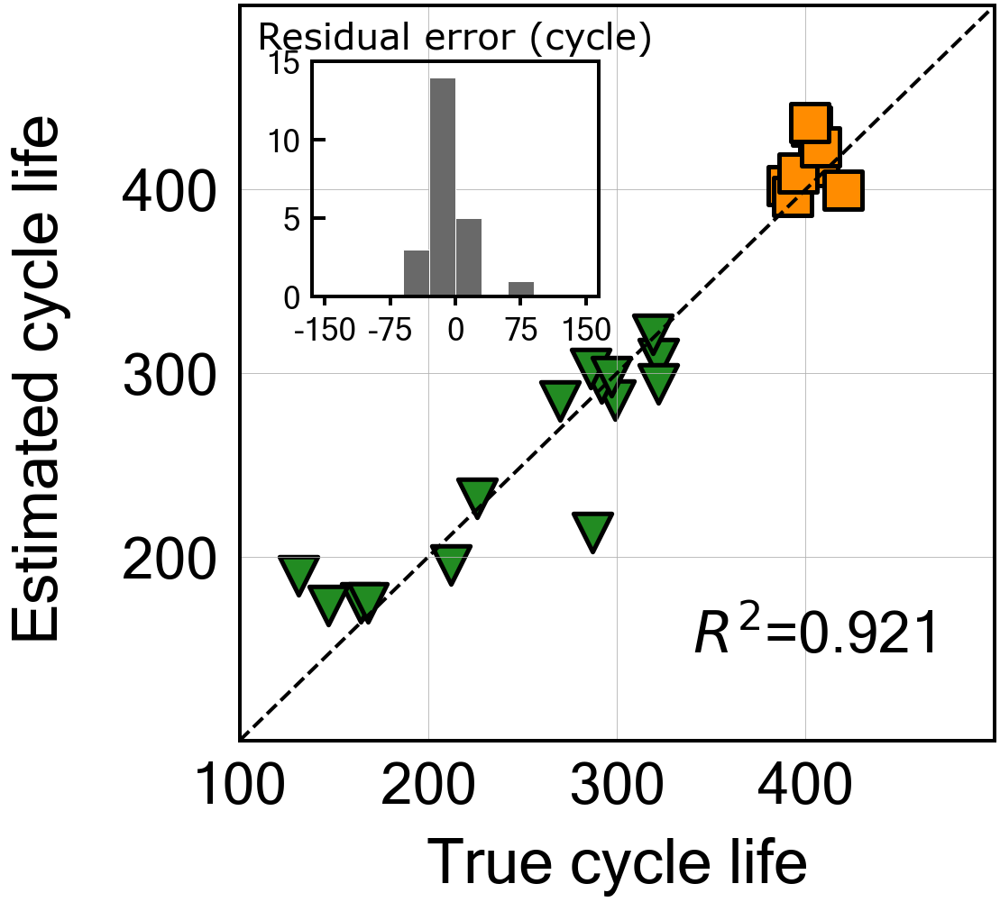


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -5.74432652322909
Cycle no: 12
Coefficient:
T_V('Charge', 'Variance', '12') : -0.021965886123252405
T_V('Charge', 'Mean', '12') : 0.0
T_V('Charge', 'Skewness', '12') : 0.2951282281244017
dTdV('Charge', 'Maximum', '12') : -0.019804525858385866
dTdV('Charge', 'Mean', '12') : -0.0
dTdV('Charge', 'Kurtosis', '12') : 0.030541526154166394

Intercept: 0.6202443280977312
MAE_all: 21.4
MAPE_all: 8.6 %
RMSE_all: 27.2
RMSPE_all: 12.8 %
MAE_train: 21.9
MAPE_train: 10.5 %
RMSE_train: 29.0
RMSPE_train: 15.3 %
MAE_test: 20.3
MAPE_test: 5.1 %
RMSE_test: 23.3
RMSPE_test: 5.8 %
R2 normal-scale scores
All data r2-score: 0.910
Train data r2-score: 0.807
Test data r2-score: -5.744

Normal-scale scores
All data score: 0.910
Train data score: 0.807
Test data score: -5.744


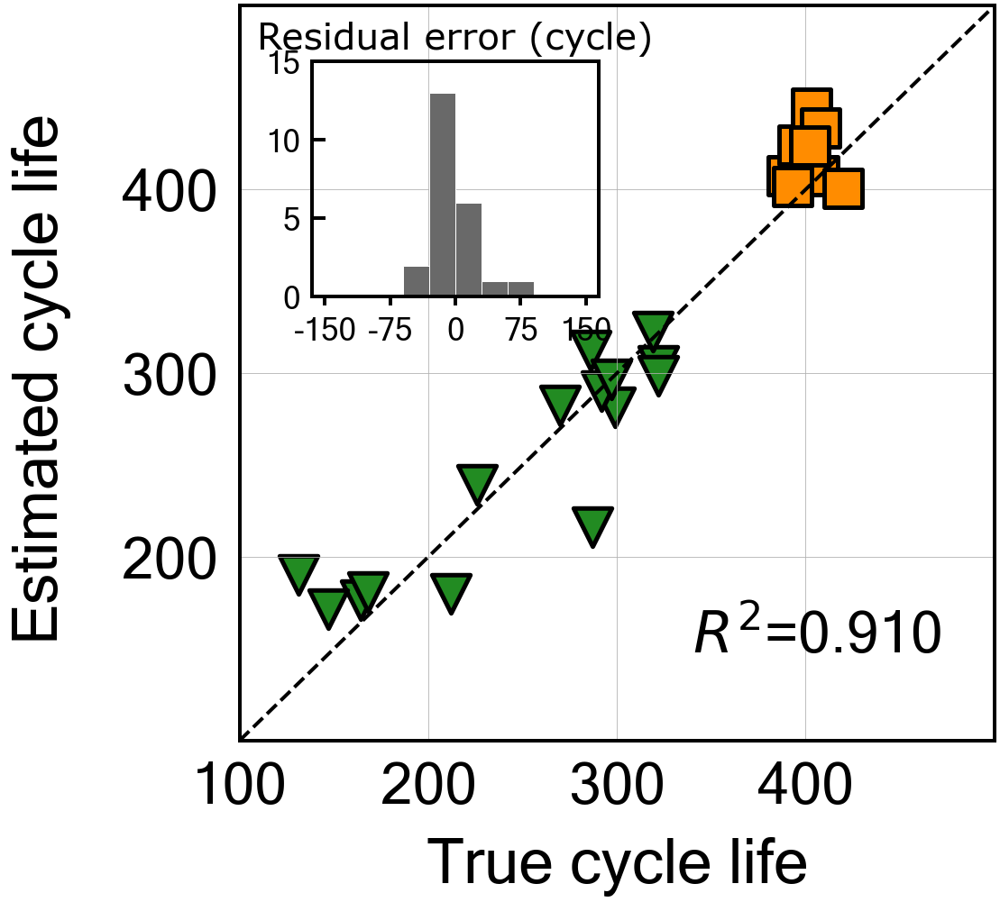


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -3.74768151319104
Cycle no: 13
Coefficient:
T_V('Charge', 'Variance', '13') : -0.008642093882492945
T_V('Charge', 'Mean', '13') : 0.0
T_V('Charge', 'Skewness', '13') : 0.284582870041948
dTdV('Charge', 'Maximum', '13') : -0.009759271195341604
dTdV('Charge', 'Mean', '13') : -0.0
dTdV('Charge', 'Kurtosis', '13') : 0.03054622628532606

Intercept: 0.6202443280977312
MAE_all: 18.6
MAPE_all: 7.4 %
RMSE_all: 24.4
RMSPE_all: 10.4 %
MAE_train: 20.1
MAPE_train: 9.3 %
RMSE_train: 26.6
RMSPE_train: 12.4 %
MAE_test: 15.6
MAPE_test: 3.9 %
RMSE_test: 19.6
RMSPE_test: 4.8 %
R2 normal-scale scores
All data r2-score: 0.927
Train data r2-score: 0.838
Test data r2-score: -3.748

Normal-scale scores
All data score: 0.927
Train data score: 0.838
Test data score: -3.748


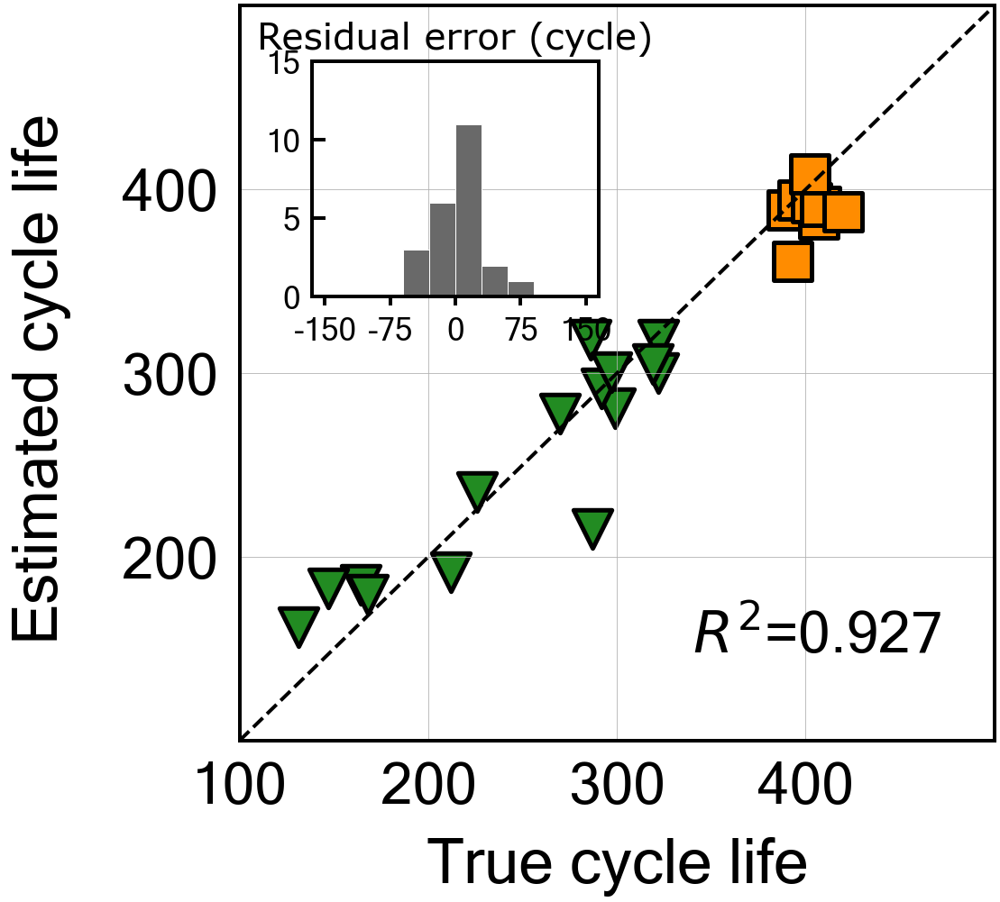


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -2.9796984836343783
Cycle no: 14
Coefficient:
T_V('Charge', 'Variance', '14') : -0.0008336157269236665
T_V('Charge', 'Mean', '14') : 0.00145599491549912
T_V('Charge', 'Skewness', '14') : 0.29630233407177325
dTdV('Charge', 'Maximum', '14') : -0.032827641890310025
dTdV('Charge', 'Mean', '14') : -0.0018085013596596219
dTdV('Charge', 'Kurtosis', '14') : -0.008963036774673484

Intercept: 0.6202443280977314
MAE_all: 19.4
MAPE_all: 8.1 %
RMSE_all: 27.2
RMSPE_all: 12.8 %
MAE_train: 22.5
MAPE_train: 10.6 %
RMSE_train: 31.1
RMSPE_train: 15.5 %
MAE_test: 13.4
MAPE_test: 3.3 %
RMSE_test: 17.9
RMSPE_test: 4.4 %
R2 normal-scale scores
All data r2-score: 0.909
Train data r2-score: 0.779
Test data r2-score: -2.980

Normal-scale scores
All data score: 0.909
Train data score: 0.779
Test data score: -2.980


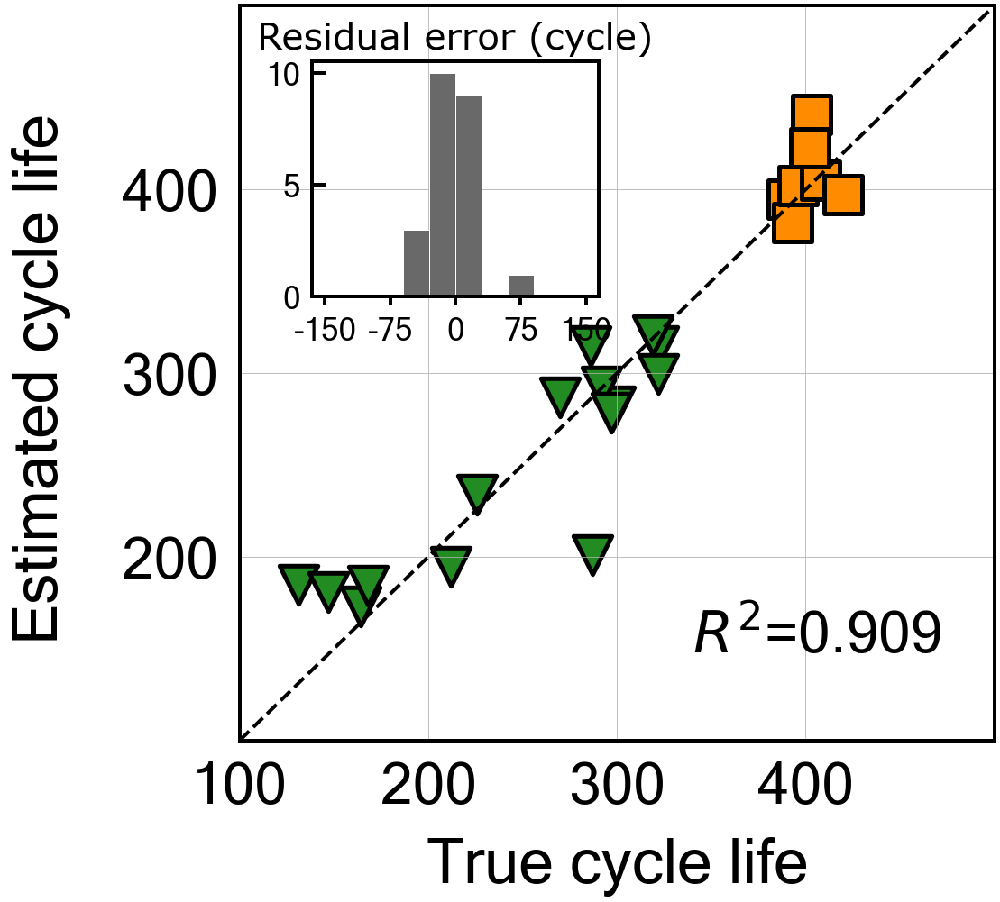


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -27.364578297902682
Cycle no: 15
Coefficient:
T_V('Charge', 'Variance', '15') : -0.0
T_V('Charge', 'Mean', '15') : 0.0
T_V('Charge', 'Skewness', '15') : 0.2672071590521166
dTdV('Charge', 'Maximum', '15') : -0.0
dTdV('Charge', 'Mean', '15') : -0.0
dTdV('Charge', 'Kurtosis', '15') : -0.0

Intercept: 0.6202443280977312
MAE_all: 31.6
MAPE_all: 11.1 %
RMSE_all: 37.2
RMSPE_all: 14.4 %
MAE_train: 23.6
MAPE_train: 10.9 %
RMSE_train: 30.0
RMSPE_train: 15.6 %
MAE_test: 46.7
MAPE_test: 11.6 %
RMSE_test: 47.9
RMSPE_test: 11.8 %
R2 normal-scale scores
All data r2-score: 0.831
Train data r2-score: 0.794
Test data r2-score: -27.365

Normal-scale scores
All data score: 0.831
Train data score: 0.794
Test data score: -27.365


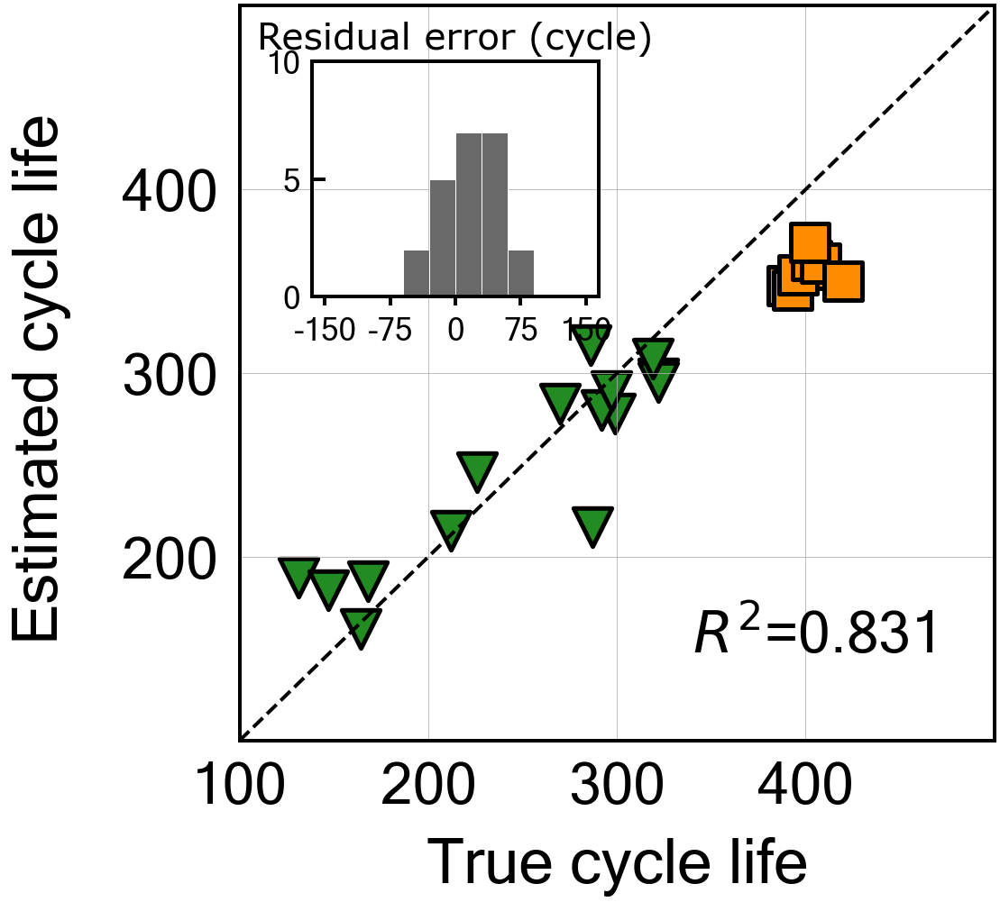


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -84.4389606506028
Cycle no: 16
Coefficient:
T_V('Charge', 'Variance', '16') : 0.0
T_V('Charge', 'Mean', '16') : 0.08918031269557211
T_V('Charge', 'Skewness', '16') : 0.13859872789361202
dTdV('Charge', 'Maximum', '16') : -0.04417777328087724
dTdV('Charge', 'Mean', '16') : 0.00240887985185264
dTdV('Charge', 'Kurtosis', '16') : -0.07882695404738654

Intercept: 0.6202443280977312
MAE_all: 42.3
MAPE_all: 13.6 %
RMSE_all: 54.0
RMSPE_all: 16.8 %
MAE_train: 20.8
MAPE_train: 9.9 %
RMSE_train: 28.2
RMSPE_train: 14.4 %
MAE_test: 82.6
MAPE_test: 20.5 %
RMSE_test: 83.1
RMSPE_test: 20.6 %
R2 normal-scale scores
All data r2-score: 0.643
Train data r2-score: 0.818
Test data r2-score: -84.439

Normal-scale scores
All data score: 0.643
Train data score: 0.818
Test data score: -84.439


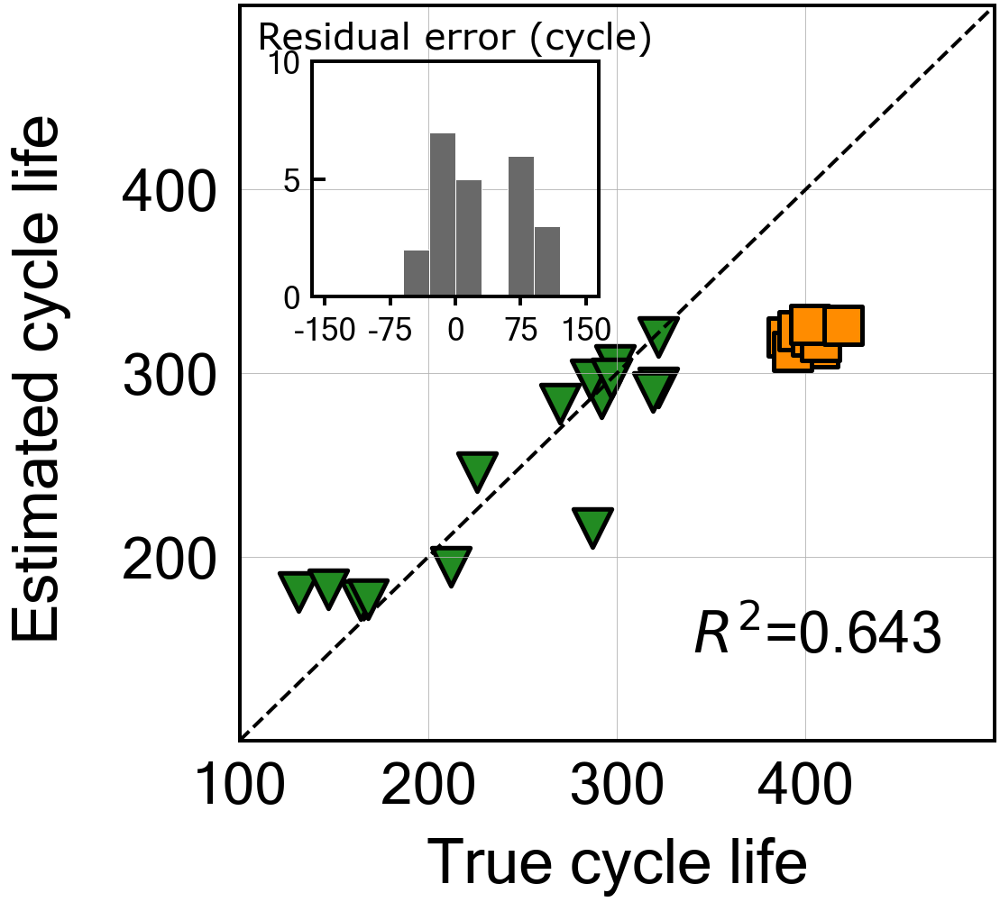


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -13.159390524206676
Cycle no: 17
Coefficient:
T_V('Charge', 'Variance', '17') : -0.0
T_V('Charge', 'Mean', '17') : 0.016740397946235604
T_V('Charge', 'Skewness', '17') : 0.278120921580818
dTdV('Charge', 'Maximum', '17') : -0.05117050933067931
dTdV('Charge', 'Mean', '17') : 0.0
dTdV('Charge', 'Kurtosis', '17') : -0.009973498709115855

Intercept: 0.6202443280977314
MAE_all: 21.6
MAPE_all: 8.4 %
RMSE_all: 31.4
RMSPE_all: 13.7 %
MAE_train: 19.4
MAPE_train: 9.5 %
RMSE_train: 30.0
RMSPE_train: 15.8 %
MAE_test: 25.5
MAPE_test: 6.3 %
RMSE_test: 33.8
RMSPE_test: 8.4 %
R2 normal-scale scores
All data r2-score: 0.880
Train data r2-score: 0.794
Test data r2-score: -13.159

Normal-scale scores
All data score: 0.880
Train data score: 0.794
Test data score: -13.159


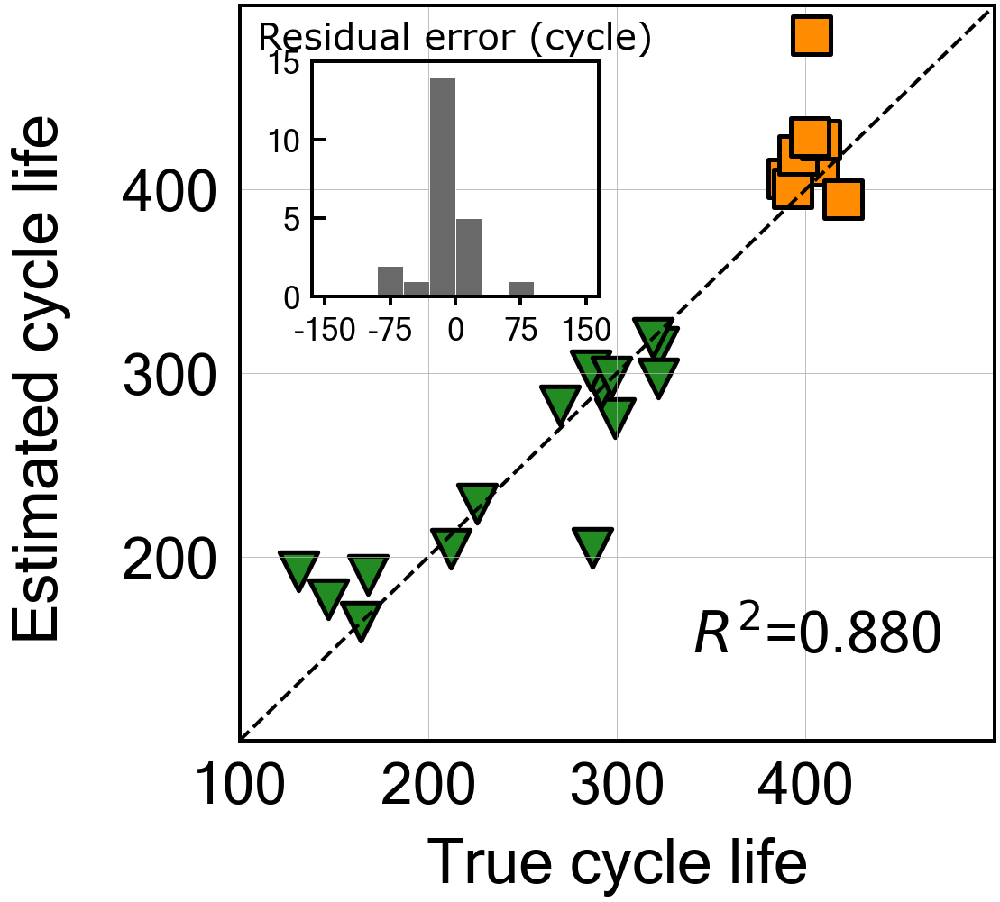


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -823.3354402462907
Cycle no: 18
Coefficient:
T_V('Charge', 'Variance', '18') : -0.7030316868339709
T_V('Charge', 'Mean', '18') : -0.6070075132348299
T_V('Charge', 'Skewness', '18') : 0.7887474970621047
dTdV('Charge', 'Maximum', '18') : -0.09781810143612289
dTdV('Charge', 'Mean', '18') : 0.8158362993880012
dTdV('Charge', 'Kurtosis', '18') : -0.16180750061502924

Intercept: 0.6202443280977286
MAE_all: 91.7
MAPE_all: 23.6 %
RMSE_all: 152.4
RMSPE_all: 38.0 %
MAE_train: 7.3
MAPE_train: 2.9 %
RMSE_train: 10.2
RMSPE_train: 4.1 %
MAE_test: 249.9
MAPE_test: 62.2 %
RMSE_test: 258.0
RMSPE_test: 64.2 %
R2 normal-scale scores
All data r2-score: -1.839
Train data r2-score: 0.976
Test data r2-score: -823.335

Normal-scale scores
All data score: -1.839
Train data score: 0.976
Test data score: -823.335


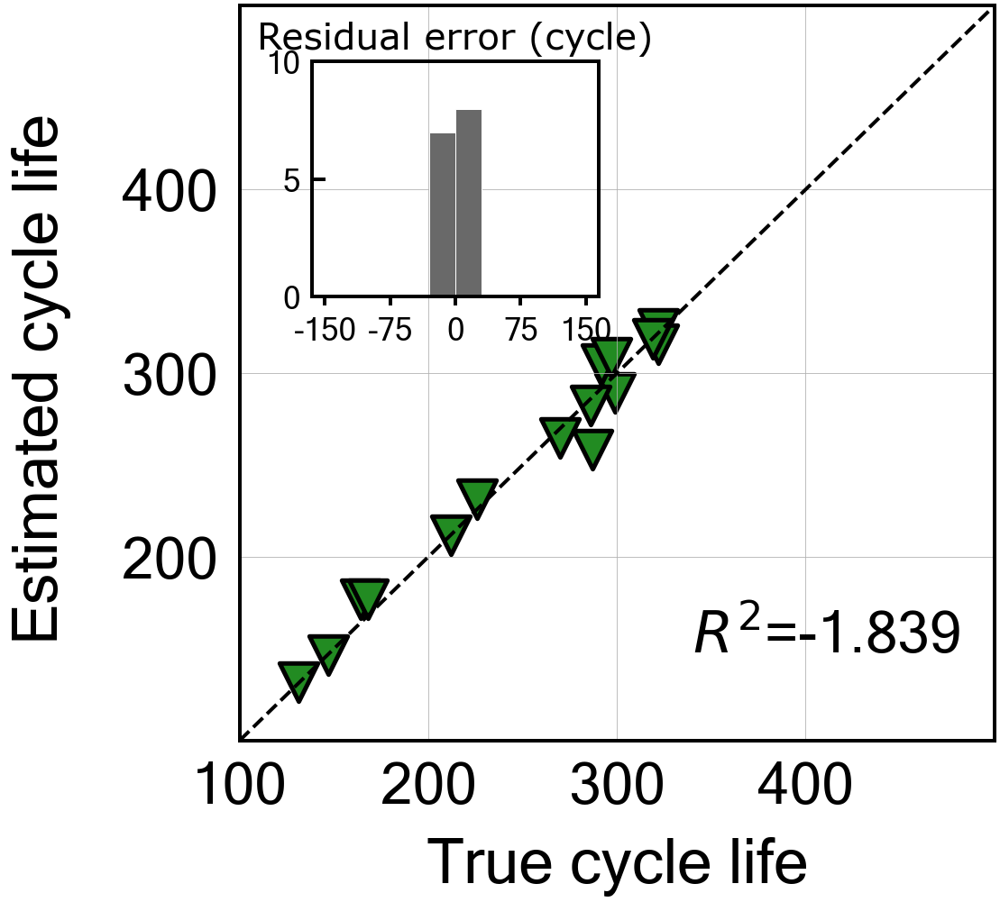


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -23.47018821387097
Cycle no: 19
Coefficient:
T_V('Charge', 'Variance', '19') : 0.0
T_V('Charge', 'Mean', '19') : -0.0
T_V('Charge', 'Skewness', '19') : 0.3006321033470099
dTdV('Charge', 'Maximum', '19') : -0.0983463010543402
dTdV('Charge', 'Mean', '19') : 0.07361007158869594
dTdV('Charge', 'Kurtosis', '19') : 0.08460012819922527

Intercept: 0.620244328097731
MAE_all: 22.3
MAPE_all: 7.9 %
RMSE_all: 33.2
RMSPE_all: 12.8 %
MAE_train: 16.6
MAPE_train: 7.8 %
RMSE_train: 25.3
RMSPE_train: 13.7 %
MAE_test: 33.0
MAPE_test: 8.2 %
RMSE_test: 44.4
RMSPE_test: 11.1 %
R2 normal-scale scores
All data r2-score: 0.865
Train data r2-score: 0.854
Test data r2-score: -23.470

Normal-scale scores
All data score: 0.865
Train data score: 0.854
Test data score: -23.470


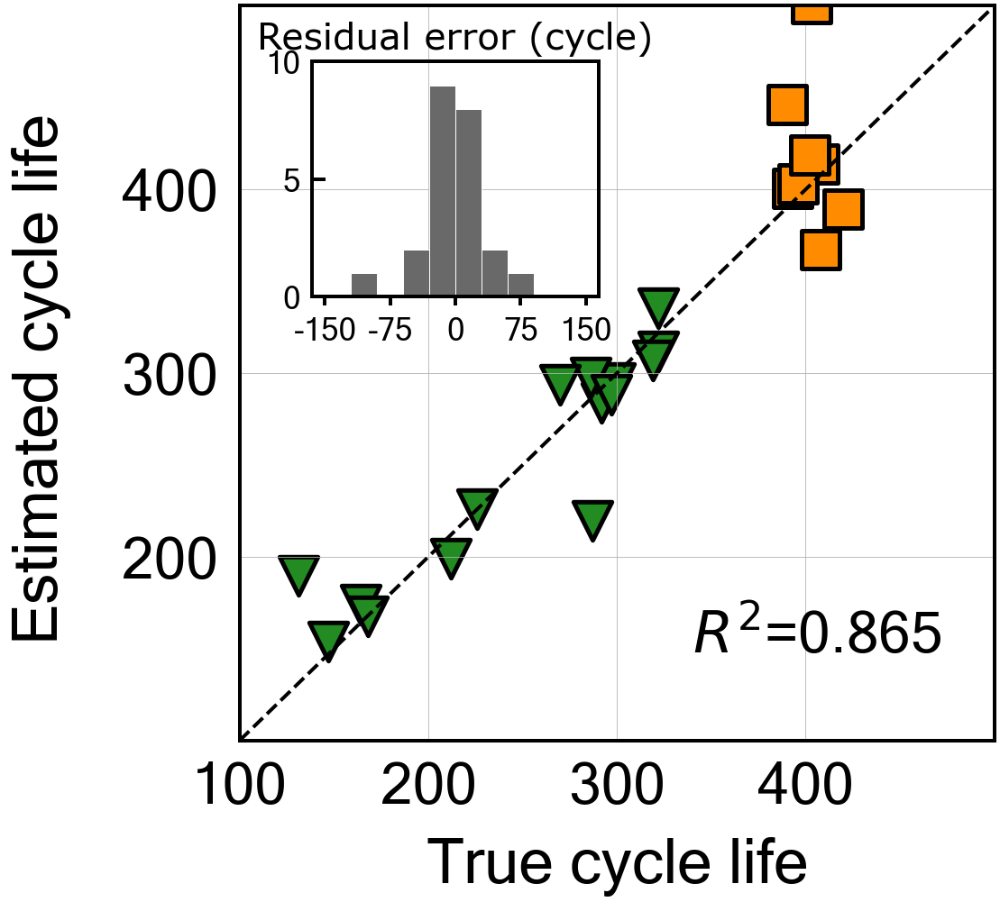


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -4.651182624724458
Cycle no: 20
Coefficient:
T_V('Charge', 'Variance', '20') : -0.062502789156572
T_V('Charge', 'Mean', '20') : 0.12247817785844155
T_V('Charge', 'Skewness', '20') : 0.1837821073749507
dTdV('Charge', 'Maximum', '20') : 0.06398957418332579
dTdV('Charge', 'Mean', '20') : -0.020886581855024056
dTdV('Charge', 'Kurtosis', '20') : 0.031626765003208324

Intercept: 0.6202443280977308
MAE_all: 20.6
MAPE_all: 8.7 %
RMSE_all: 28.9
RMSPE_all: 13.6 %
MAE_train: 23.7
MAPE_train: 11.4 %
RMSE_train: 32.3
RMSPE_train: 16.5 %
MAE_test: 14.8
MAPE_test: 3.6 %
RMSE_test: 21.4
RMSPE_test: 5.1 %
R2 normal-scale scores
All data r2-score: 0.898
Train data r2-score: 0.761
Test data r2-score: -4.651

Normal-scale scores
All data score: 0.898
Train data score: 0.761
Test data score: -4.651


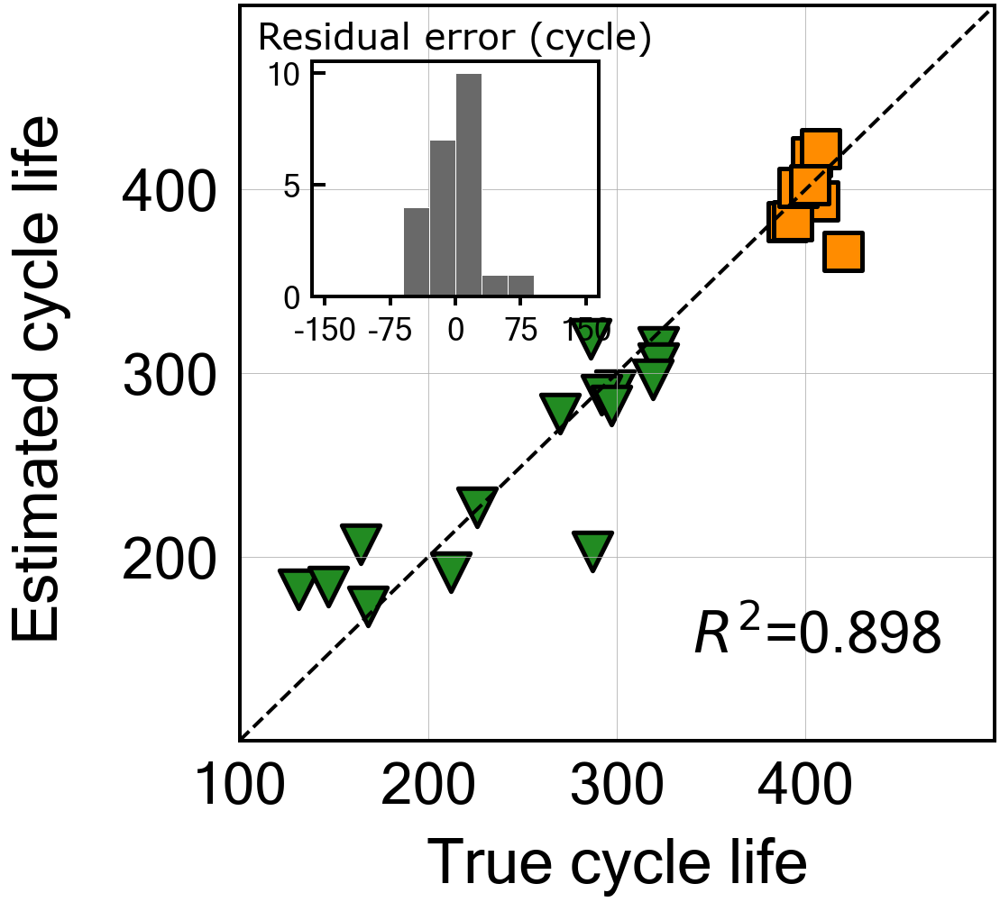


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -13.467339393480648
Cycle no: 21
Coefficient:
T_V('Charge', 'Variance', '21') : -0.0
T_V('Charge', 'Mean', '21') : 0.0
T_V('Charge', 'Skewness', '21') : 0.2569306273089086
dTdV('Charge', 'Maximum', '21') : 0.0
dTdV('Charge', 'Mean', '21') : -0.0
dTdV('Charge', 'Kurtosis', '21') : 0.0

Intercept: 0.6202443280977312
MAE_all: 27.9
MAPE_all: 10.7 %
RMSE_all: 34.0
RMSPE_all: 14.5 %
MAE_train: 26.5
MAPE_train: 12.4 %
RMSE_train: 33.9
RMSPE_train: 16.8 %
MAE_test: 30.4
MAPE_test: 7.5 %
RMSE_test: 34.2
RMSPE_test: 8.4 %
R2 normal-scale scores
All data r2-score: 0.859
Train data r2-score: 0.737
Test data r2-score: -13.467

Normal-scale scores
All data score: 0.859
Train data score: 0.737
Test data score: -13.467


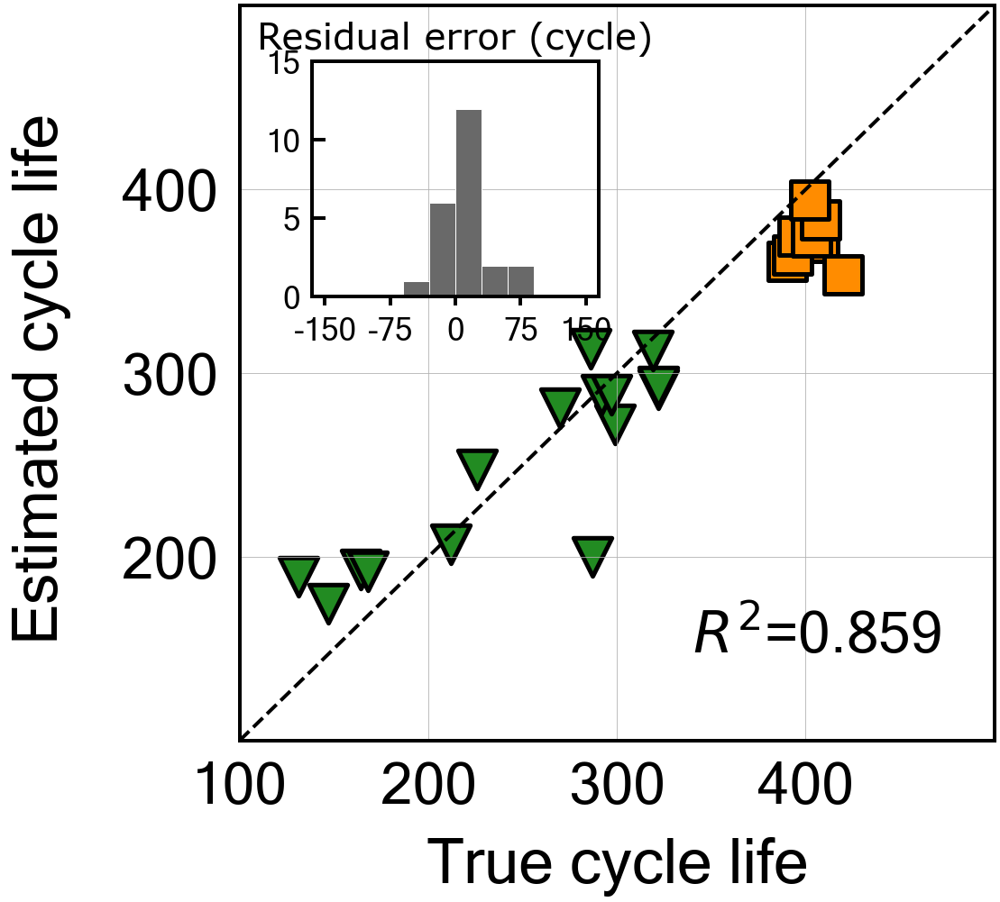


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.3
Best score obtained was: -68.74451220773672
Cycle no: 22
Coefficient:
T_V('Charge', 'Variance', '22') : -0.009361653259174065
T_V('Charge', 'Mean', '22') : 0.09981289232127717
T_V('Charge', 'Skewness', '22') : 0.14893084213908575
dTdV('Charge', 'Maximum', '22') : -0.0
dTdV('Charge', 'Mean', '22') : -0.0
dTdV('Charge', 'Kurtosis', '22') : 0.03546706099052181

Intercept: 0.6202443280977307
MAE_all: 42.6
MAPE_all: 14.3 %
RMSE_all: 52.0
RMSPE_all: 17.6 %
MAE_train: 26.0
MAPE_train: 12.1 %
RMSE_train: 33.8
RMSPE_train: 17.0 %
MAE_test: 73.7
MAPE_test: 18.3 %
RMSE_test: 75.0
RMSPE_test: 18.5 %
R2 normal-scale scores
All data r2-score: 0.669
Train data r2-score: 0.738
Test data r2-score: -68.745

Normal-scale scores
All data score: 0.669
Train data score: 0.738
Test data score: -68.745


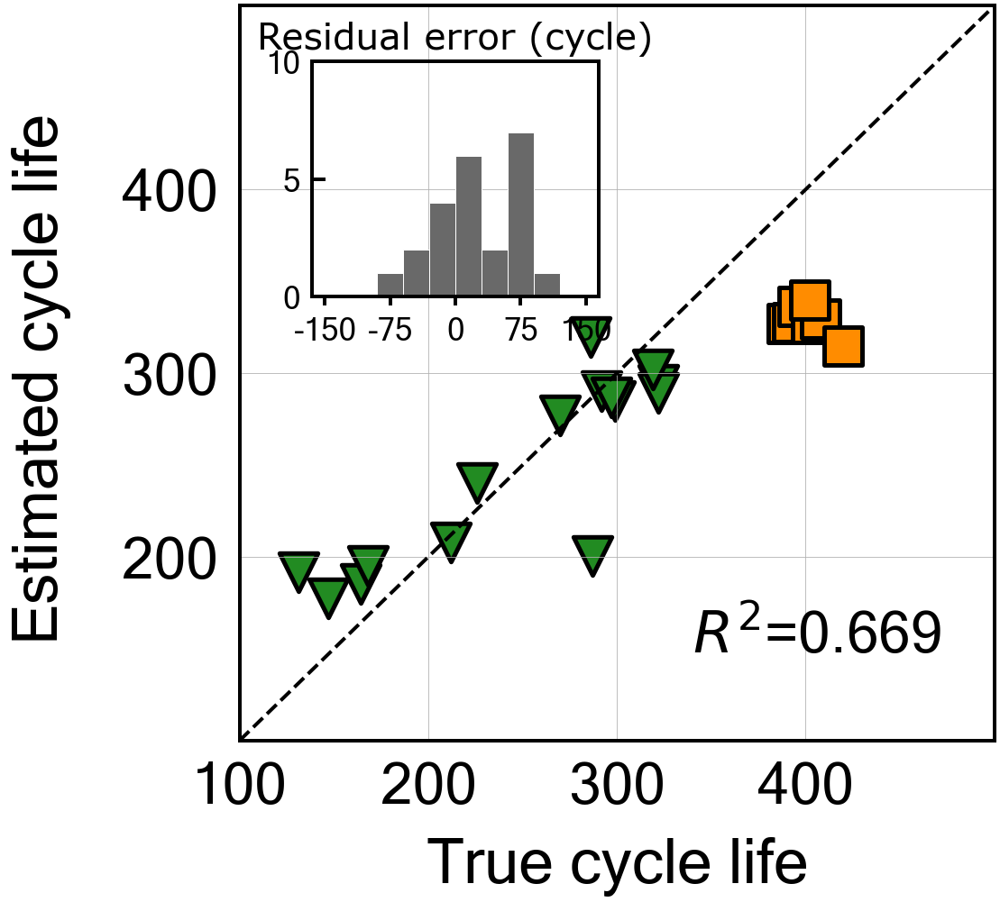


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -65.25355788025027
Cycle no: 23
Coefficient:
T_V('Charge', 'Variance', '23') : -0.0
T_V('Charge', 'Mean', '23') : 0.11888220429168389
T_V('Charge', 'Skewness', '23') : 0.13689642730488716
dTdV('Charge', 'Maximum', '23') : -0.023729750631340956
dTdV('Charge', 'Mean', '23') : 0.0
dTdV('Charge', 'Kurtosis', '23') : -0.006482939488038929

Intercept: 0.6202443280977316
MAE_all: 42.3
MAPE_all: 14.5 %
RMSE_all: 51.7
RMSPE_all: 18.3 %
MAE_train: 26.7
MAPE_train: 12.8 %
RMSE_train: 35.4
RMSPE_train: 18.4 %
MAE_test: 71.5
MAPE_test: 17.7 %
RMSE_test: 73.1
RMSPE_test: 18.0 %
R2 normal-scale scores
All data r2-score: 0.673
Train data r2-score: 0.713
Test data r2-score: -65.254

Normal-scale scores
All data score: 0.673
Train data score: 0.713
Test data score: -65.254


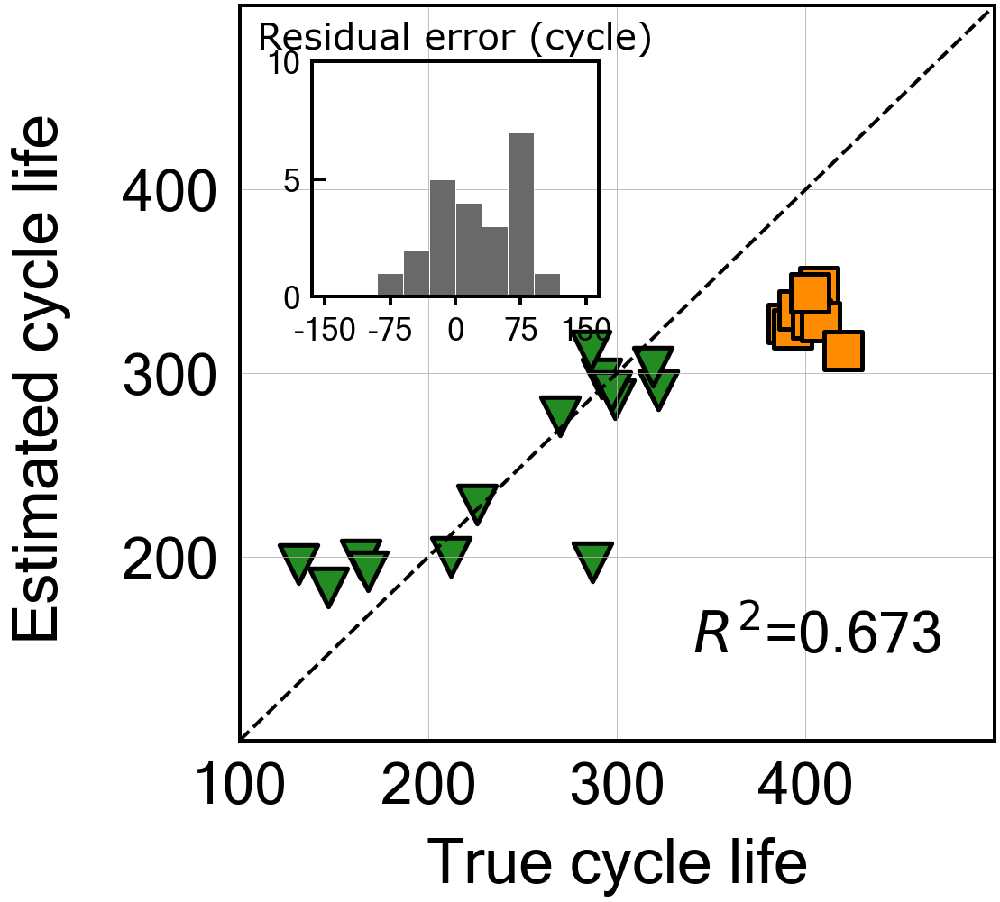


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.1
Best score obtained was: -64.8787350122516
Cycle no: 24
Coefficient:
T_V('Charge', 'Variance', '24') : 0.0002729545638236059
T_V('Charge', 'Mean', '24') : 0.10301897457935967
T_V('Charge', 'Skewness', '24') : 0.12185333733473092
dTdV('Charge', 'Maximum', '24') : -0.07714939646347624
dTdV('Charge', 'Mean', '24') : 0.020611161728207456
dTdV('Charge', 'Kurtosis', '24') : 0.046760134378021866

Intercept: 0.6202443280977316
MAE_all: 39.0
MAPE_all: 13.1 %
RMSE_all: 49.1
RMSPE_all: 16.3 %
MAE_train: 22.9
MAPE_train: 11.0 %
RMSE_train: 29.4
RMSPE_train: 15.4 %
MAE_test: 69.2
MAPE_test: 17.1 %
RMSE_test: 72.9
RMSPE_test: 18.0 %
R2 normal-scale scores
All data r2-score: 0.705
Train data r2-score: 0.803
Test data r2-score: -64.879

Normal-scale scores
All data score: 0.705
Train data score: 0.803
Test data score: -64.879


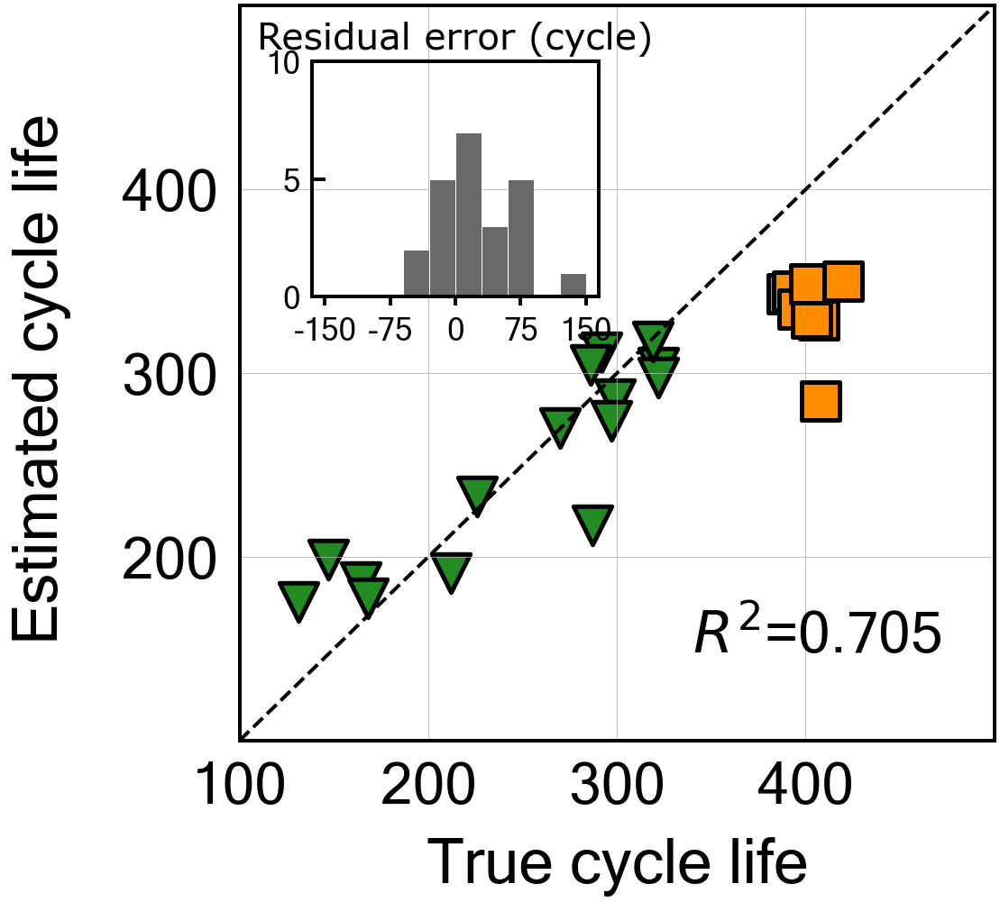


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -18.492535284111078
Cycle no: 25
Coefficient:
T_V('Charge', 'Variance', '25') : -0.0
T_V('Charge', 'Mean', '25') : 0.04054885130716606
T_V('Charge', 'Skewness', '25') : 0.2129232993256845
dTdV('Charge', 'Maximum', '25') : -0.02136663638937046
dTdV('Charge', 'Mean', '25') : -0.0
dTdV('Charge', 'Kurtosis', '25') : 0.01649271565806531

Intercept: 0.6202443280977313
MAE_all: 28.8
MAPE_all: 10.7 %
RMSE_all: 34.9
RMSPE_all: 14.3 %
MAE_train: 24.1
MAPE_train: 11.4 %
RMSE_train: 32.1
RMSPE_train: 16.2 %
MAE_test: 37.8
MAPE_test: 9.3 %
RMSE_test: 39.7
RMSPE_test: 9.7 %
R2 normal-scale scores
All data r2-score: 0.851
Train data r2-score: 0.764
Test data r2-score: -18.493

Normal-scale scores
All data score: 0.851
Train data score: 0.764
Test data score: -18.493


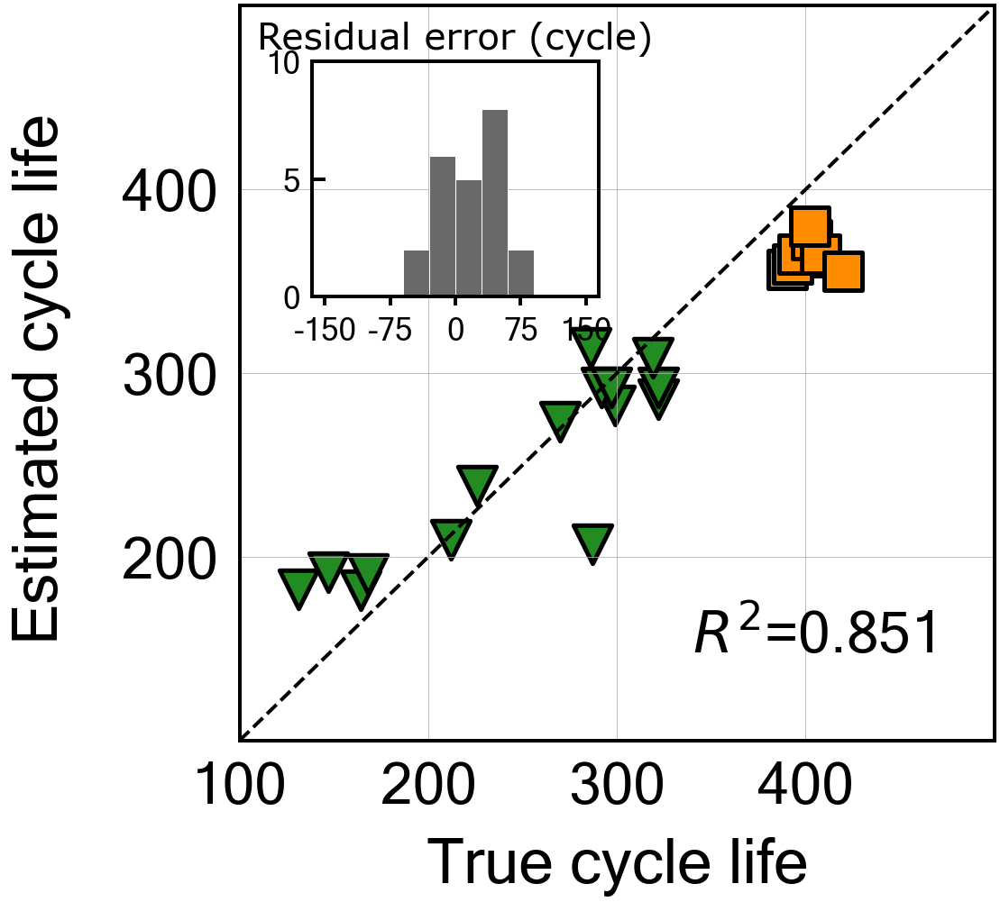


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -22.782605003241788
Cycle no: 26
Coefficient:
T_V('Charge', 'Variance', '26') : -0.0
T_V('Charge', 'Mean', '26') : 0.10948078991821161
T_V('Charge', 'Skewness', '26') : 0.16557676176706446
dTdV('Charge', 'Maximum', '26') : -0.03616771039323446
dTdV('Charge', 'Mean', '26') : 0.0
dTdV('Charge', 'Kurtosis', '26') : 0.01874184947901082

Intercept: 0.6202443280977314
MAE_all: 30.8
MAPE_all: 11.3 %
RMSE_all: 36.6
RMSPE_all: 14.5 %
MAE_train: 24.8
MAPE_train: 11.7 %
RMSE_train: 32.1
RMSPE_train: 16.1 %
MAE_test: 42.2
MAPE_test: 10.5 %
RMSE_test: 43.8
RMSPE_test: 10.9 %
R2 normal-scale scores
All data r2-score: 0.836
Train data r2-score: 0.763
Test data r2-score: -22.783

Normal-scale scores
All data score: 0.836
Train data score: 0.763
Test data score: -22.783


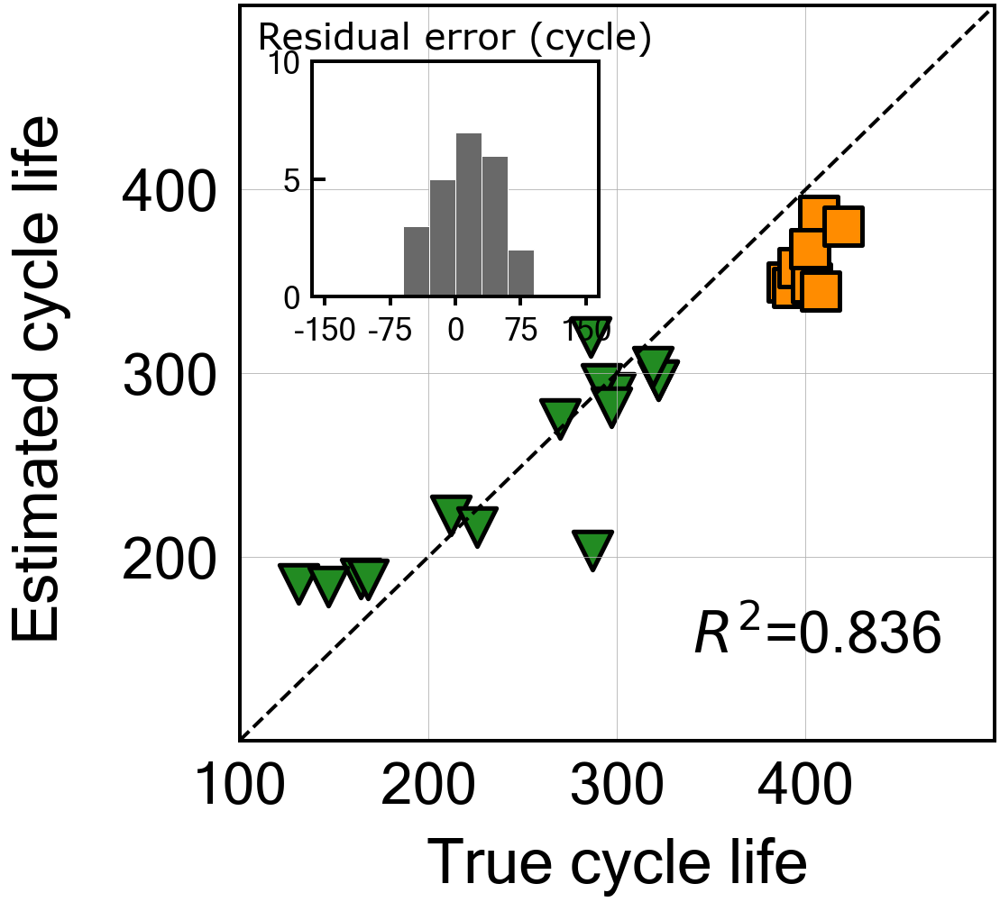


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -12.055574332853203
Cycle no: 27
Coefficient:
T_V('Charge', 'Variance', '27') : -0.001395064467623816
T_V('Charge', 'Mean', '27') : 0.0
T_V('Charge', 'Skewness', '27') : 0.2696390257191404
dTdV('Charge', 'Maximum', '27') : 0.0
dTdV('Charge', 'Mean', '27') : -0.0
dTdV('Charge', 'Kurtosis', '27') : -0.0

Intercept: 0.6202443280977312
MAE_all: 25.3
MAPE_all: 9.7 %
RMSE_all: 31.5
RMSPE_all: 13.2 %
MAE_train: 24.6
MAPE_train: 11.3 %
RMSE_train: 31.0
RMSPE_train: 15.3 %
MAE_test: 26.7
MAPE_test: 6.6 %
RMSE_test: 32.5
RMSPE_test: 7.9 %
R2 normal-scale scores
All data r2-score: 0.878
Train data r2-score: 0.779
Test data r2-score: -12.056

Normal-scale scores
All data score: 0.878
Train data score: 0.779
Test data score: -12.056


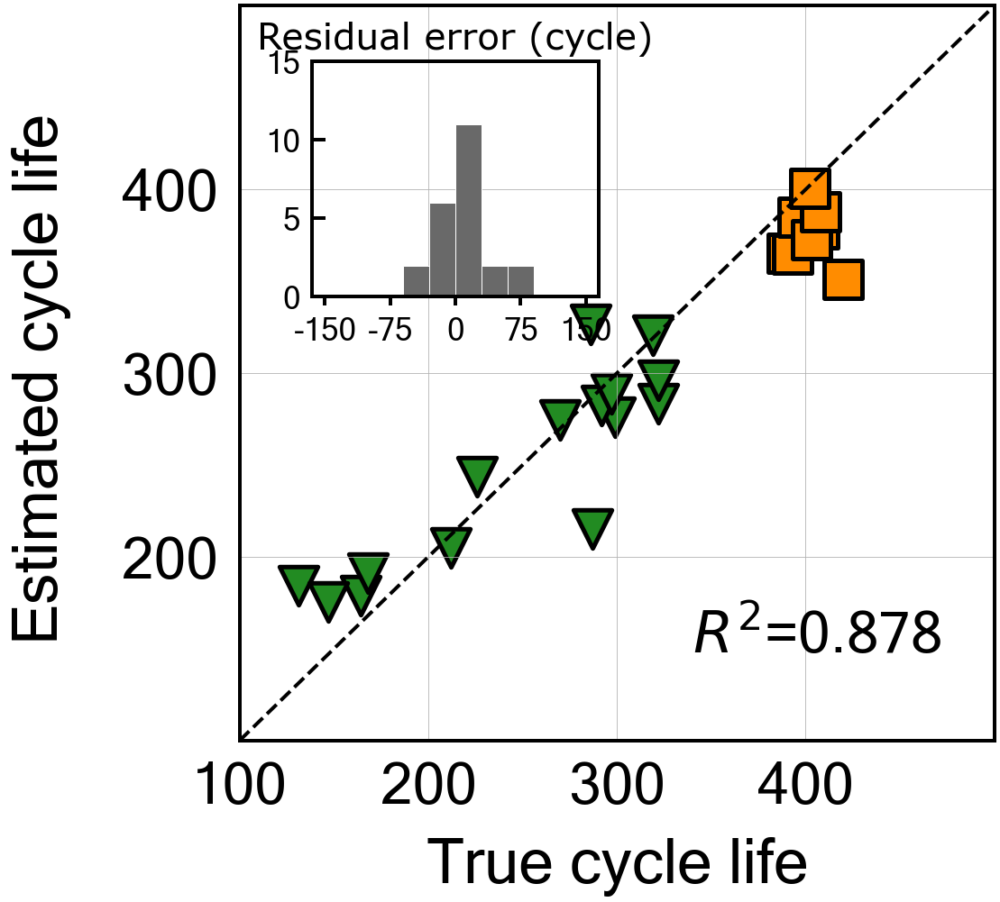


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.1
Best score obtained was: -32.48474919567023
Cycle no: 28
Coefficient:
T_V('Charge', 'Variance', '28') : -0.025847606940371783
T_V('Charge', 'Mean', '28') : 0.0
T_V('Charge', 'Skewness', '28') : 0.3146246897941638
dTdV('Charge', 'Maximum', '28') : -0.021891692392540435
dTdV('Charge', 'Mean', '28') : -0.004411225300298805
dTdV('Charge', 'Kurtosis', '28') : 0.0

Intercept: 0.6202443280977312
MAE_all: 30.7
MAPE_all: 10.3 %
RMSE_all: 37.3
RMSPE_all: 12.6 %
MAE_train: 20.4
MAPE_train: 9.2 %
RMSE_train: 26.2
RMSPE_train: 12.4 %
MAE_test: 50.2
MAPE_test: 12.5 %
RMSE_test: 52.0
RMSPE_test: 13.0 %
R2 normal-scale scores
All data r2-score: 0.830
Train data r2-score: 0.842
Test data r2-score: -32.485

Normal-scale scores
All data score: 0.830
Train data score: 0.842
Test data score: -32.485


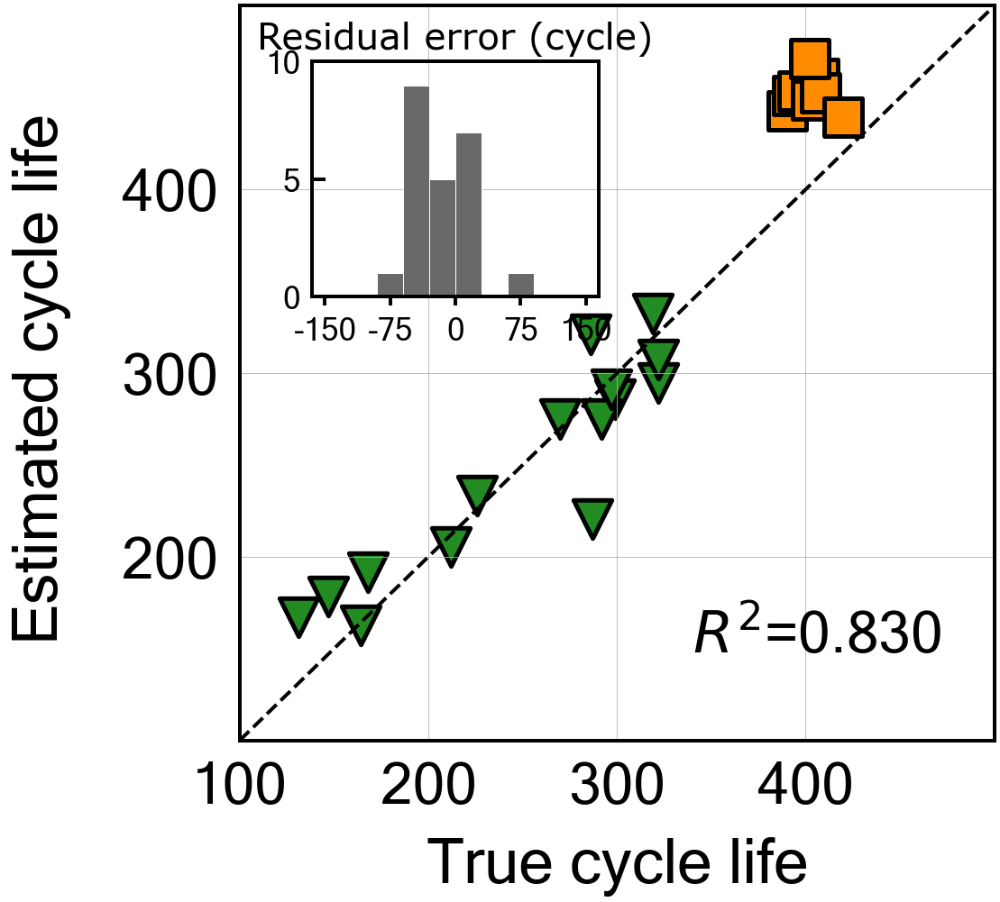


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -45.42306389764994
Cycle no: 29
Coefficient:
T_V('Charge', 'Variance', '29') : -0.11674929295095214
T_V('Charge', 'Mean', '29') : 0.16279849504003827
T_V('Charge', 'Skewness', '29') : 0.17773817687849114
dTdV('Charge', 'Maximum', '29') : 0.1704614704079473
dTdV('Charge', 'Mean', '29') : -0.06875169065176404
dTdV('Charge', 'Kurtosis', '29') : 0.021525808705177008

Intercept: 0.6202443280977312
MAE_all: 29.7
MAPE_all: 9.3 %
RMSE_all: 40.0
RMSPE_all: 12.1 %
MAE_train: 15.6
MAPE_train: 6.9 %
RMSE_train: 21.3
RMSPE_train: 10.2 %
MAE_test: 56.2
MAPE_test: 13.9 %
RMSE_test: 61.2
RMSPE_test: 15.2 %
R2 normal-scale scores
All data r2-score: 0.804
Train data r2-score: 0.896
Test data r2-score: -45.423

Normal-scale scores
All data score: 0.804
Train data score: 0.896
Test data score: -45.423


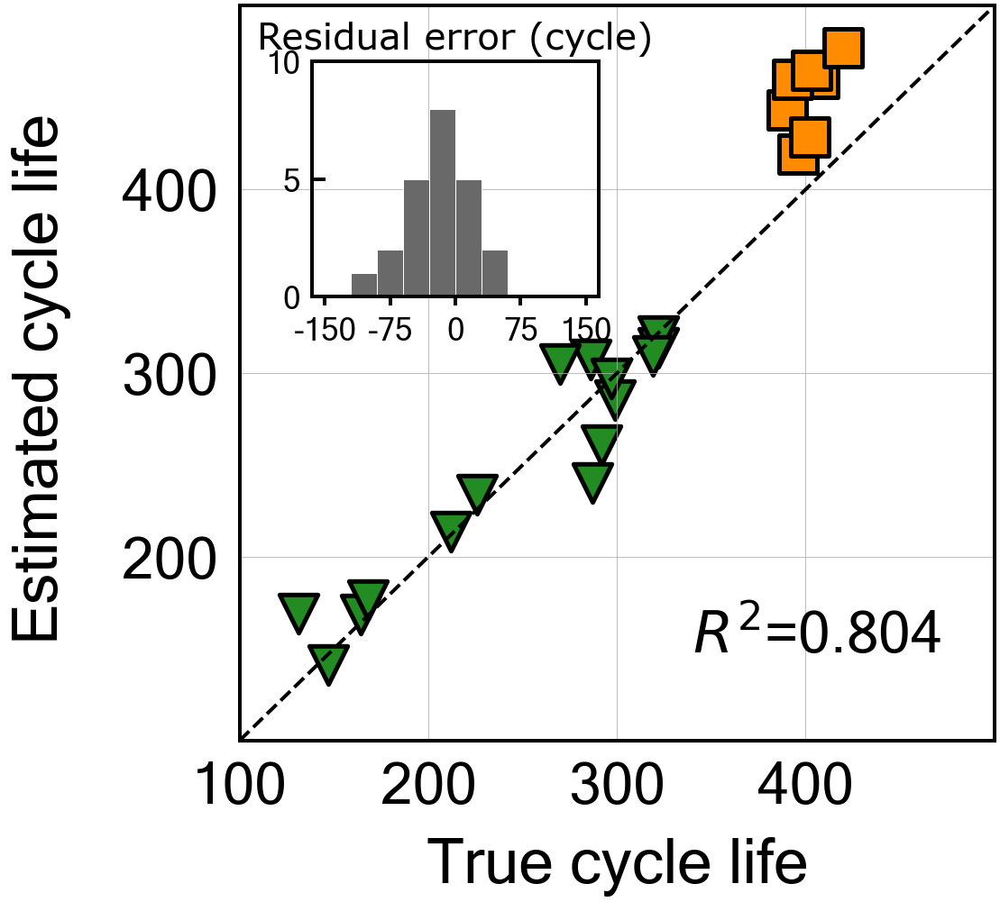

Found -inf in dT/dV ('Discharge', 'Maximum', '30')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -110.36578257537815
Cycle no: 30
Coefficient:
T_V('Charge', 'Variance', '30') : -0.0
T_V('Charge', 'Mean', '30') : 0.10830038943607342
T_V('Charge', 'Skewness', '30') : 0.13143584425342406
dTdV('Charge', 'Maximum', '30') : 0.0
dTdV('Charge', 'Mean', '30') : -0.0
dTdV('Charge', 'Kurtosis', '30') : -0.024604292698693814

Intercept: 0.6202443280977309
MAE_all: 50.8
MAPE_all: 16.6 %
RMSE_all: 62.7
RMSPE_all: 20.3 %
MAE_train: 28.0
MAPE_train: 13.1 %
RMSE_train: 35.2
RMSPE_train: 18.5 %
MAE_test: 93.6
MAPE_test: 23.2 %
RMSE_test: 94.8
RMSPE_test: 23.4 %
R2 normal-scale scores
All data r2-score: 0.519
Train data r2-score: 0.716
Test data r2-score: -110.366

Normal-scale scores
All data score: 0.519
Train data score: 0.716
Test data score: -110.366


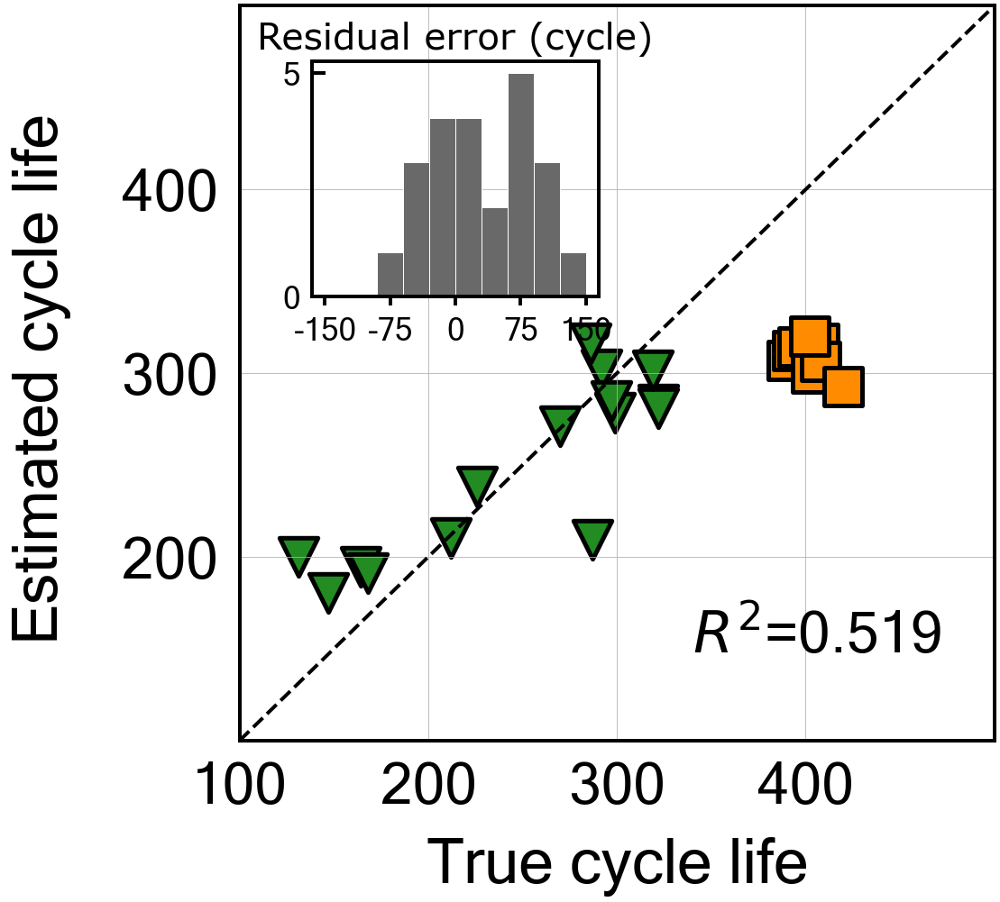


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -72.21722497703944
Cycle no: 31
Coefficient:
T_V('Charge', 'Variance', '31') : -0.0
T_V('Charge', 'Mean', '31') : 0.08104848049770165
T_V('Charge', 'Skewness', '31') : 0.1686067409179883
dTdV('Charge', 'Maximum', '31') : 0.0
dTdV('Charge', 'Mean', '31') : -0.0
dTdV('Charge', 'Kurtosis', '31') : -0.016863176568176024

Intercept: 0.6202443280977318
MAE_all: 42.9
MAPE_all: 14.4 %
RMSE_all: 53.3
RMSPE_all: 18.3 %
MAE_train: 25.4
MAPE_train: 12.0 %
RMSE_train: 34.6
RMSPE_train: 17.8 %
MAE_test: 75.6
MAPE_test: 18.8 %
RMSE_test: 76.9
RMSPE_test: 19.0 %
R2 normal-scale scores
All data r2-score: 0.653
Train data r2-score: 0.726
Test data r2-score: -72.217

Normal-scale scores
All data score: 0.653
Train data score: 0.726
Test data score: -72.217


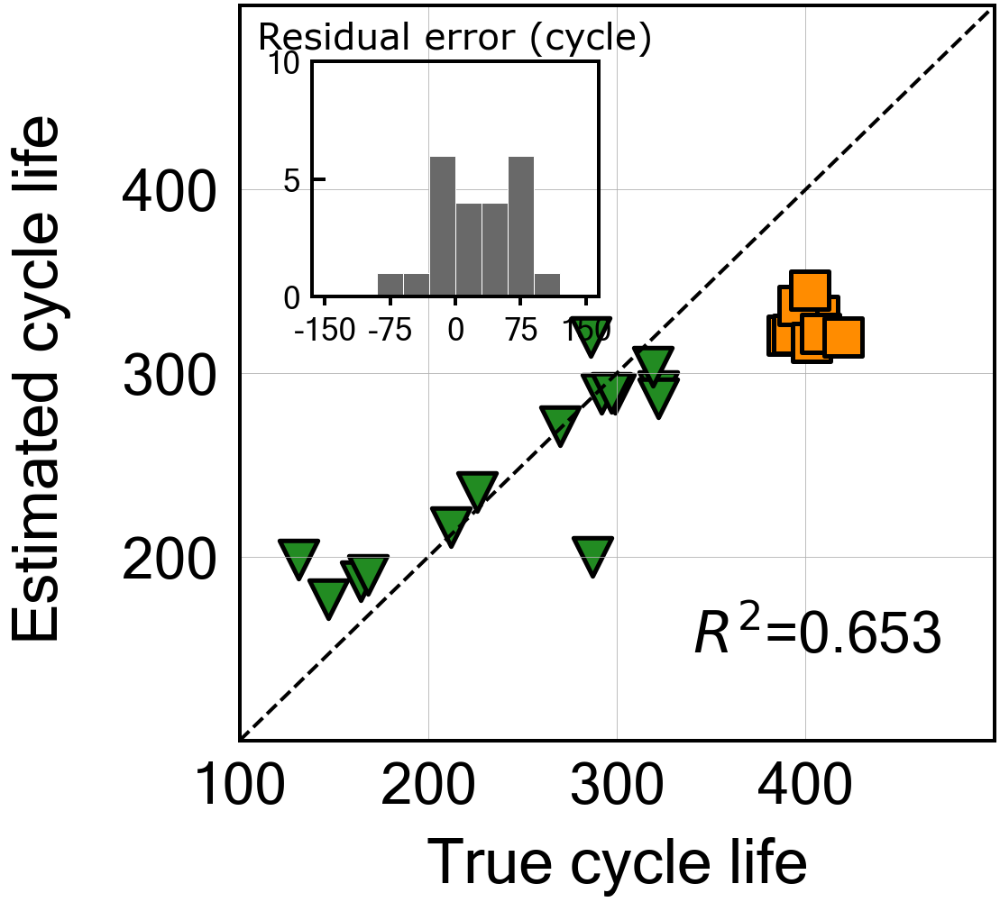


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -43.53021695840741
Cycle no: 32
Coefficient:
T_V('Charge', 'Variance', '32') : -0.0051576136967261075
T_V('Charge', 'Mean', '32') : 0.1028755925994173
T_V('Charge', 'Skewness', '32') : 0.15937676421756733
dTdV('Charge', 'Maximum', '32') : -0.014828930540034582
dTdV('Charge', 'Mean', '32') : -0.0
dTdV('Charge', 'Kurtosis', '32') : -0.0400526432027606

Intercept: 0.620244328097731
MAE_all: 35.3
MAPE_all: 12.2 %
RMSE_all: 43.7
RMSPE_all: 15.9 %
MAE_train: 23.1
MAPE_train: 11.0 %
RMSE_train: 31.9
RMSPE_train: 16.5 %
MAE_test: 58.2
MAPE_test: 14.4 %
RMSE_test: 60.0
RMSPE_test: 14.8 %
R2 normal-scale scores
All data r2-score: 0.766
Train data r2-score: 0.767
Test data r2-score: -43.530

Normal-scale scores
All data score: 0.766
Train data score: 0.767
Test data score: -43.530


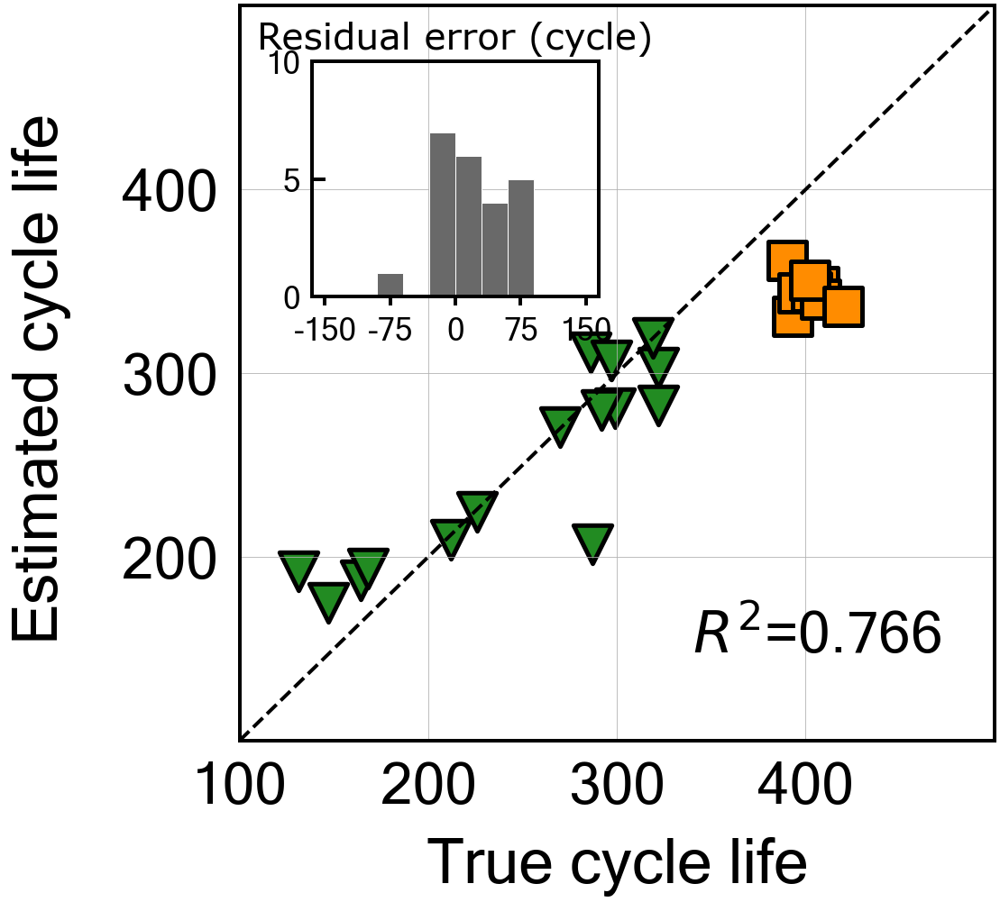


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -95.97923127294315
Cycle no: 33
Coefficient:
T_V('Charge', 'Variance', '33') : -0.0
T_V('Charge', 'Mean', '33') : 0.08425968002341146
T_V('Charge', 'Skewness', '33') : 0.14260803465640517
dTdV('Charge', 'Maximum', '33') : 0.0
dTdV('Charge', 'Mean', '33') : 0.0
dTdV('Charge', 'Kurtosis', '33') : 0.0

Intercept: 0.6202443280977316
MAE_all: 50.3
MAPE_all: 17.0 %
RMSE_all: 60.8
RMSPE_all: 21.1 %
MAE_train: 30.5
MAPE_train: 14.6 %
RMSE_train: 38.7
RMSPE_train: 20.7 %
MAE_test: 87.4
MAPE_test: 21.7 %
RMSE_test: 88.5
RMSPE_test: 21.9 %
R2 normal-scale scores
All data r2-score: 0.547
Train data r2-score: 0.656
Test data r2-score: -95.979

Normal-scale scores
All data score: 0.547
Train data score: 0.656
Test data score: -95.979


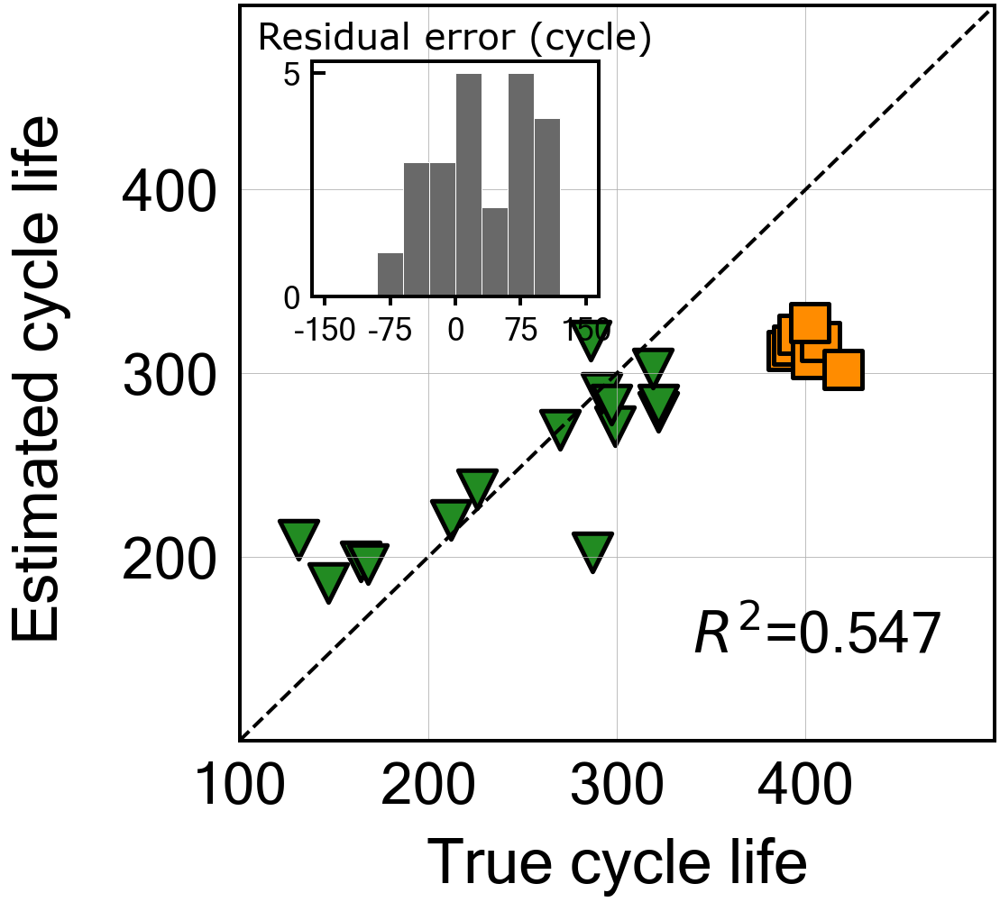


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -86.77652851386253
Cycle no: 34
Coefficient:
T_V('Charge', 'Variance', '34') : -0.039942100539528624
T_V('Charge', 'Mean', '34') : 0.11816634697523952
T_V('Charge', 'Skewness', '34') : 0.11035092992478605
dTdV('Charge', 'Maximum', '34') : 0.04842586824794762
dTdV('Charge', 'Mean', '34') : -0.003108964996099233
dTdV('Charge', 'Kurtosis', '34') : -0.04229328530619701

Intercept: 0.6202443280977319
MAE_all: 45.8
MAPE_all: 15.2 %
RMSE_all: 56.9
RMSPE_all: 18.5 %
MAE_train: 27.3
MAPE_train: 12.7 %
RMSE_train: 34.3
RMSPE_train: 17.2 %
MAE_test: 80.5
MAPE_test: 19.9 %
RMSE_test: 84.2
RMSPE_test: 20.7 %
R2 normal-scale scores
All data r2-score: 0.605
Train data r2-score: 0.730
Test data r2-score: -86.777

Normal-scale scores
All data score: 0.605
Train data score: 0.730
Test data score: -86.777


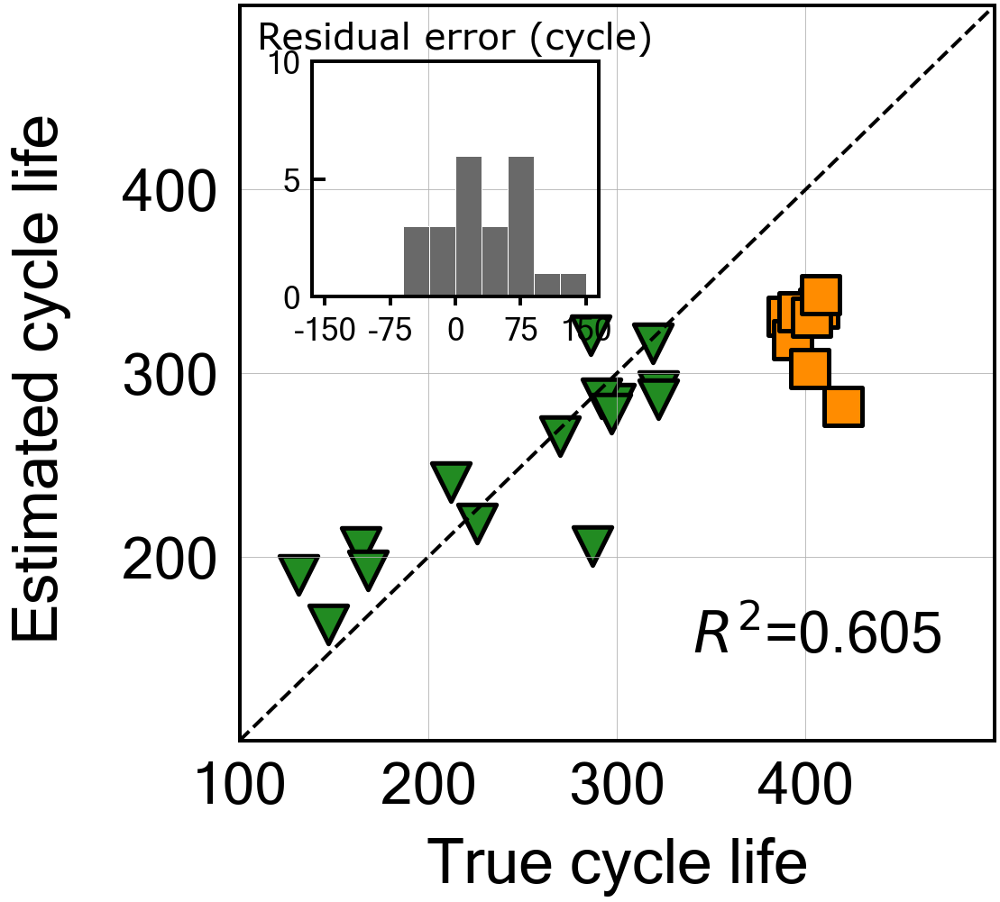


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -80.79785882534529
Cycle no: 35
Coefficient:
T_V('Charge', 'Variance', '35') : -0.0
T_V('Charge', 'Mean', '35') : 0.08790706645729024
T_V('Charge', 'Skewness', '35') : 0.15989504211788014
dTdV('Charge', 'Maximum', '35') : -0.0
dTdV('Charge', 'Mean', '35') : -0.0
dTdV('Charge', 'Kurtosis', '35') : 0.0

Intercept: 0.6202443280977319
MAE_all: 46.1
MAPE_all: 15.4 %
RMSE_all: 55.8
RMSPE_all: 18.6 %
MAE_train: 28.1
MAPE_train: 13.0 %
RMSE_train: 35.4
RMSPE_train: 17.8 %
MAE_test: 79.9
MAPE_test: 19.8 %
RMSE_test: 81.3
RMSPE_test: 20.1 %
R2 normal-scale scores
All data r2-score: 0.619
Train data r2-score: 0.712
Test data r2-score: -80.798

Normal-scale scores
All data score: 0.619
Train data score: 0.712
Test data score: -80.798


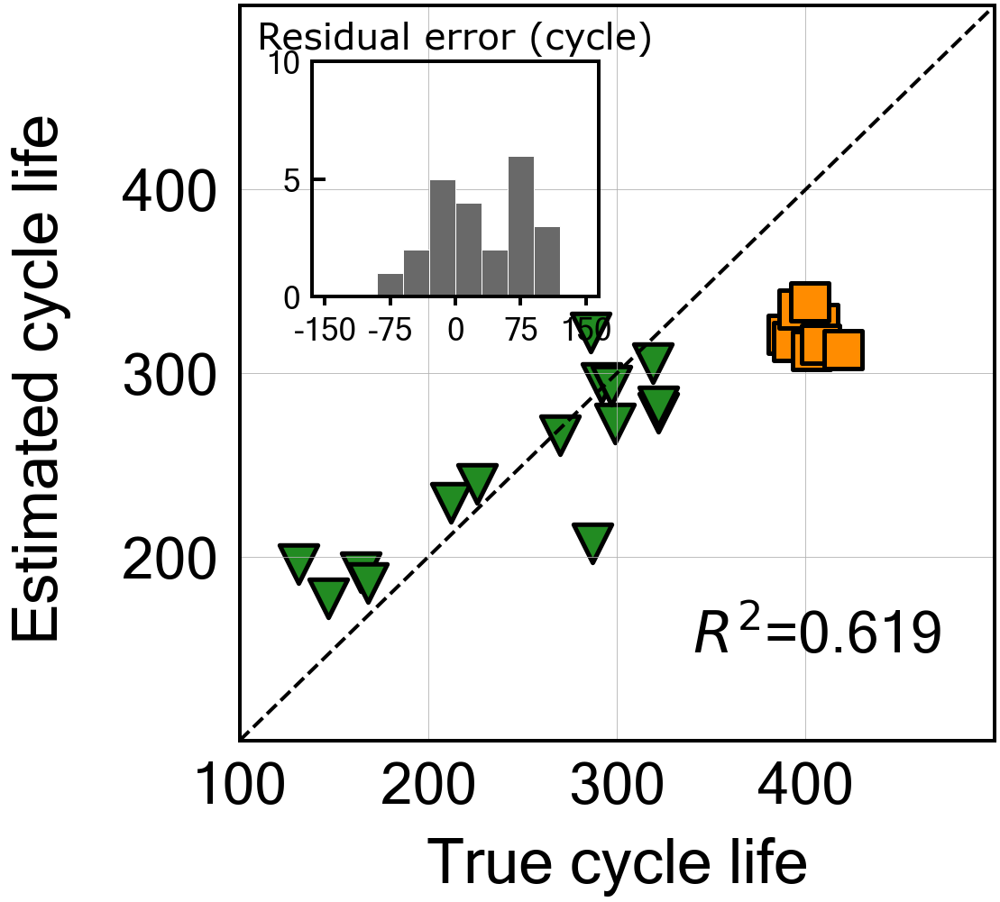


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.1
Best score obtained was: -106.79413116159547
Cycle no: 36
Coefficient:
T_V('Charge', 'Variance', '36') : -0.0
T_V('Charge', 'Mean', '36') : 0.10544708647190632
T_V('Charge', 'Skewness', '36') : 0.13466446710062793
dTdV('Charge', 'Maximum', '36') : -0.0
dTdV('Charge', 'Mean', '36') : -0.0
dTdV('Charge', 'Kurtosis', '36') : 0.021604963005770528

Intercept: 0.6202443280977313
MAE_all: 50.4
MAPE_all: 16.5 %
RMSE_all: 62.0
RMSPE_all: 20.1 %
MAE_train: 28.1
MAPE_train: 13.2 %
RMSE_train: 35.4
RMSPE_train: 18.3 %
MAE_test: 92.2
MAPE_test: 22.9 %
RMSE_test: 93.3
RMSPE_test: 23.1 %
R2 normal-scale scores
All data r2-score: 0.530
Train data r2-score: 0.712
Test data r2-score: -106.794

Normal-scale scores
All data score: 0.530
Train data score: 0.712
Test data score: -106.794


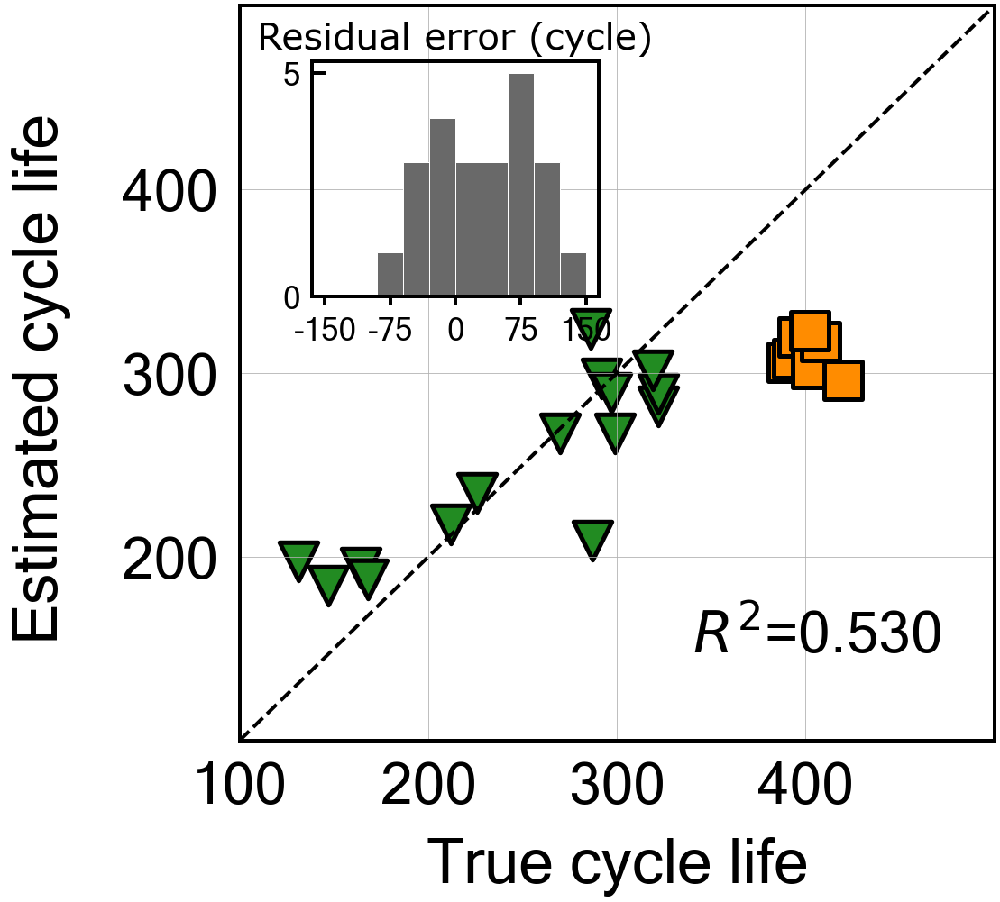


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -174.86186870682752
Cycle no: 37
Coefficient:
T_V('Charge', 'Variance', '37') : -0.12243404854045933
T_V('Charge', 'Mean', '37') : 0.021663023260372217
T_V('Charge', 'Skewness', '37') : 0.31518012082838176
dTdV('Charge', 'Maximum', '37') : 0.027043691561583375
dTdV('Charge', 'Mean', '37') : 0.03207253948186375
dTdV('Charge', 'Kurtosis', '37') : 0.0

Intercept: 0.6202443280977314
MAE_all: 53.1
MAPE_all: 15.3 %
RMSE_all: 73.3
RMSPE_all: 19.6 %
MAE_train: 18.7
MAPE_train: 7.9 %
RMSE_train: 25.6
RMSPE_train: 10.9 %
MAE_test: 117.5
MAPE_test: 29.2 %
RMSE_test: 119.2
RMSPE_test: 29.7 %
R2 normal-scale scores
All data r2-score: 0.344
Train data r2-score: 0.849
Test data r2-score: -174.862

Normal-scale scores
All data score: 0.344
Train data score: 0.849
Test data score: -174.862


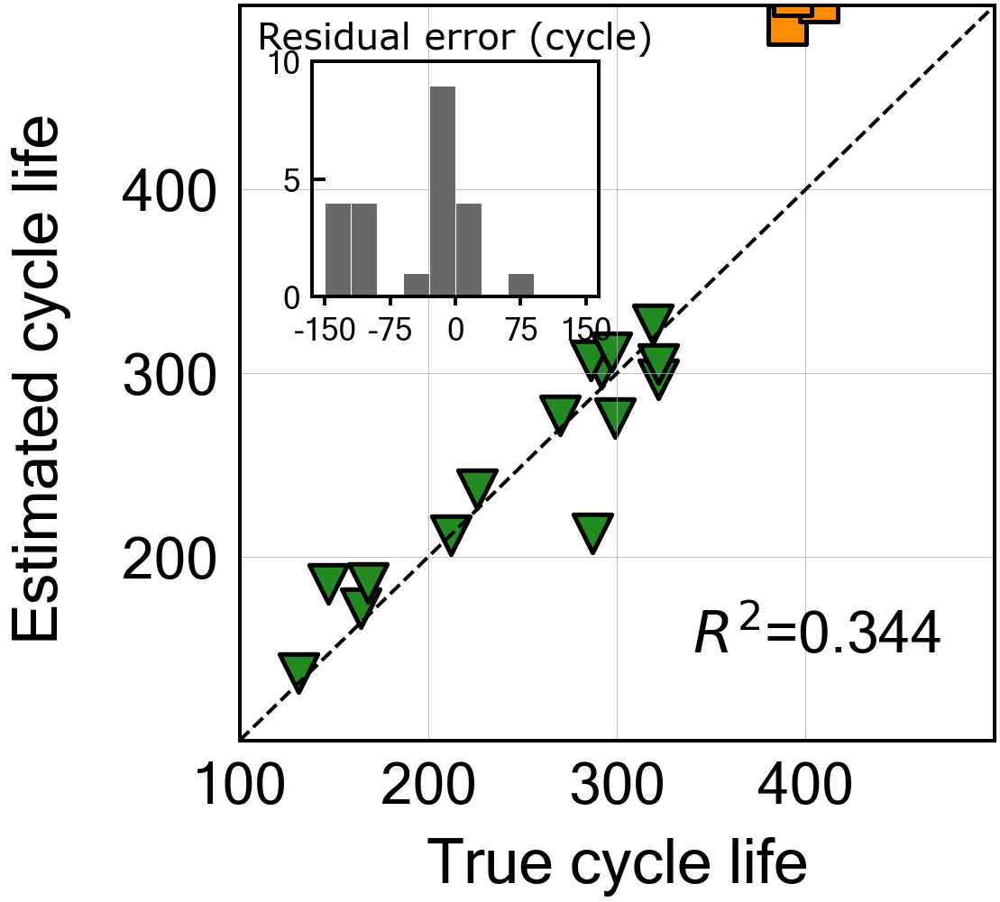


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -604.32440263336
Cycle no: 38
Coefficient:
T_V('Charge', 'Variance', '38') : 0.22990373372225392
T_V('Charge', 'Mean', '38') : 0.07437900381725206
T_V('Charge', 'Skewness', '38') : 0.2862399215750251
dTdV('Charge', 'Maximum', '38') : 0.2677359128014017
dTdV('Charge', 'Mean', '38') : -0.5393464925056485
dTdV('Charge', 'Kurtosis', '38') : 0.042269321023941

Intercept: 0.6202443280977271
MAE_all: 85.4
MAPE_all: 23.0 %
RMSE_all: 131.7
RMSPE_all: 33.1 %
MAE_train: 16.8
MAPE_train: 6.9 %
RMSE_train: 22.6
RMSPE_train: 8.9 %
MAE_test: 214.0
MAPE_test: 53.1 %
RMSE_test: 221.1
RMSPE_test: 54.8 %
R2 normal-scale scores
All data r2-score: -1.119
Train data r2-score: 0.883
Test data r2-score: -604.324

Normal-scale scores
All data score: -1.119
Train data score: 0.883
Test data score: -604.324


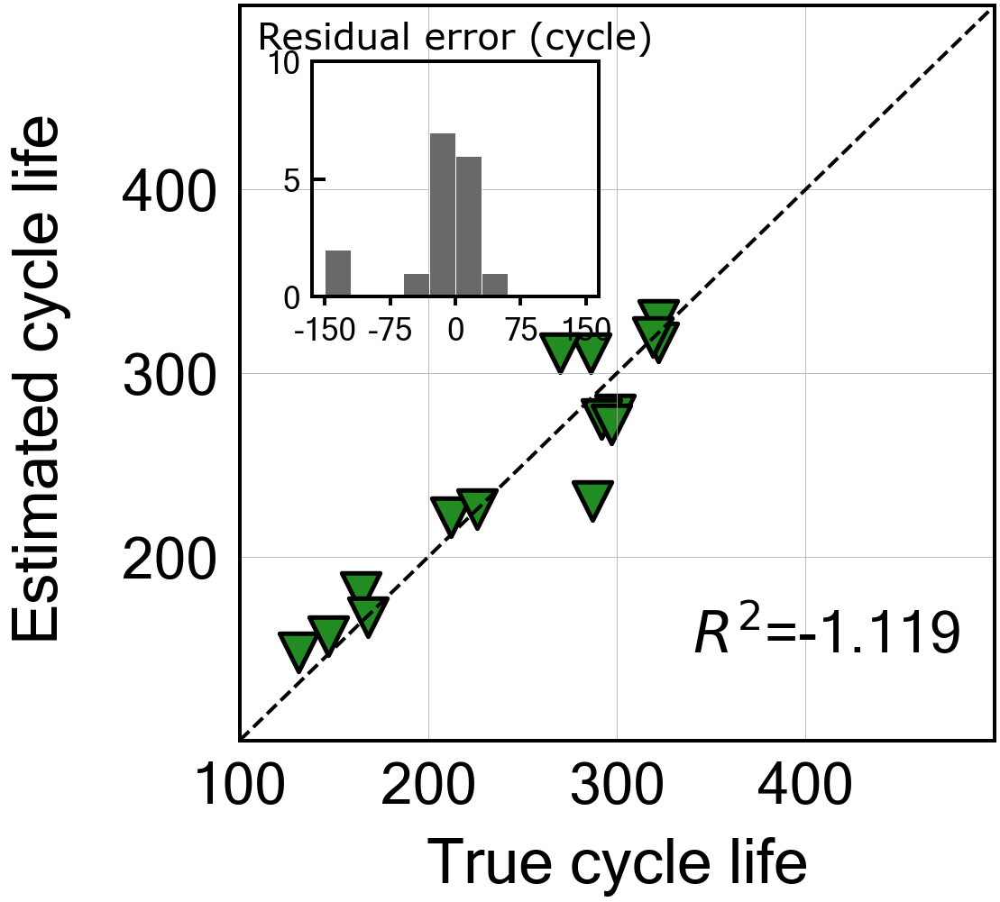


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -456.8927747022791
Cycle no: 39
Coefficient:
T_V('Charge', 'Variance', '39') : -0.16538956882124844
T_V('Charge', 'Mean', '39') : 0.08030693820164152
T_V('Charge', 'Skewness', '39') : 0.21557602044425933
dTdV('Charge', 'Maximum', '39') : 0.19123936883409628
dTdV('Charge', 'Mean', '39') : -0.05599533968338188
dTdV('Charge', 'Kurtosis', '39') : 0.017927528501224786

Intercept: 0.6202443280977326
MAE_all: 75.8
MAPE_all: 21.4 %
RMSE_all: 115.5
RMSPE_all: 30.1 %
MAE_train: 18.8
MAPE_train: 8.6 %
RMSE_train: 27.3
RMSPE_train: 12.8 %
MAE_test: 182.6
MAPE_test: 45.5 %
RMSE_test: 192.3
RMSPE_test: 48.0 %
R2 normal-scale scores
All data r2-score: -0.632
Train data r2-score: 0.829
Test data r2-score: -456.893

Normal-scale scores
All data score: -0.632
Train data score: 0.829
Test data score: -456.893


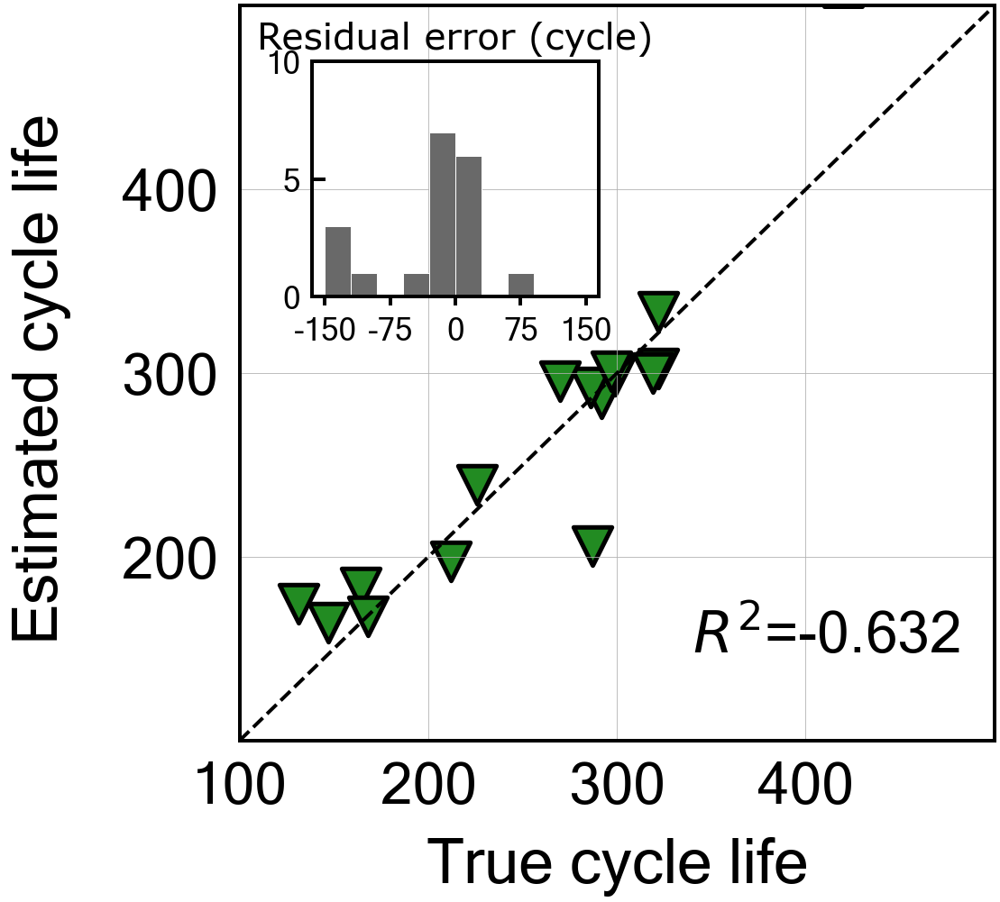


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -130.6864034301353
Cycle no: 40
Coefficient:
T_V('Charge', 'Variance', '40') : -0.0
T_V('Charge', 'Mean', '40') : 0.10995414892017807
T_V('Charge', 'Skewness', '40') : 0.12475707719075599
dTdV('Charge', 'Maximum', '40') : 0.0
dTdV('Charge', 'Mean', '40') : -0.0
dTdV('Charge', 'Kurtosis', '40') : -0.00026703031645842877

Intercept: 0.6202443280977312
MAE_all: 54.4
MAPE_all: 17.7 %
RMSE_all: 67.6
RMSPE_all: 21.4 %
MAE_train: 29.1
MAPE_train: 13.6 %
RMSE_train: 36.5
RMSPE_train: 18.8 %
MAE_test: 101.9
MAPE_test: 25.3 %
RMSE_test: 103.1
RMSPE_test: 25.5 %
R2 normal-scale scores
All data r2-score: 0.442
Train data r2-score: 0.695
Test data r2-score: -130.686

Normal-scale scores
All data score: 0.442
Train data score: 0.695
Test data score: -130.686


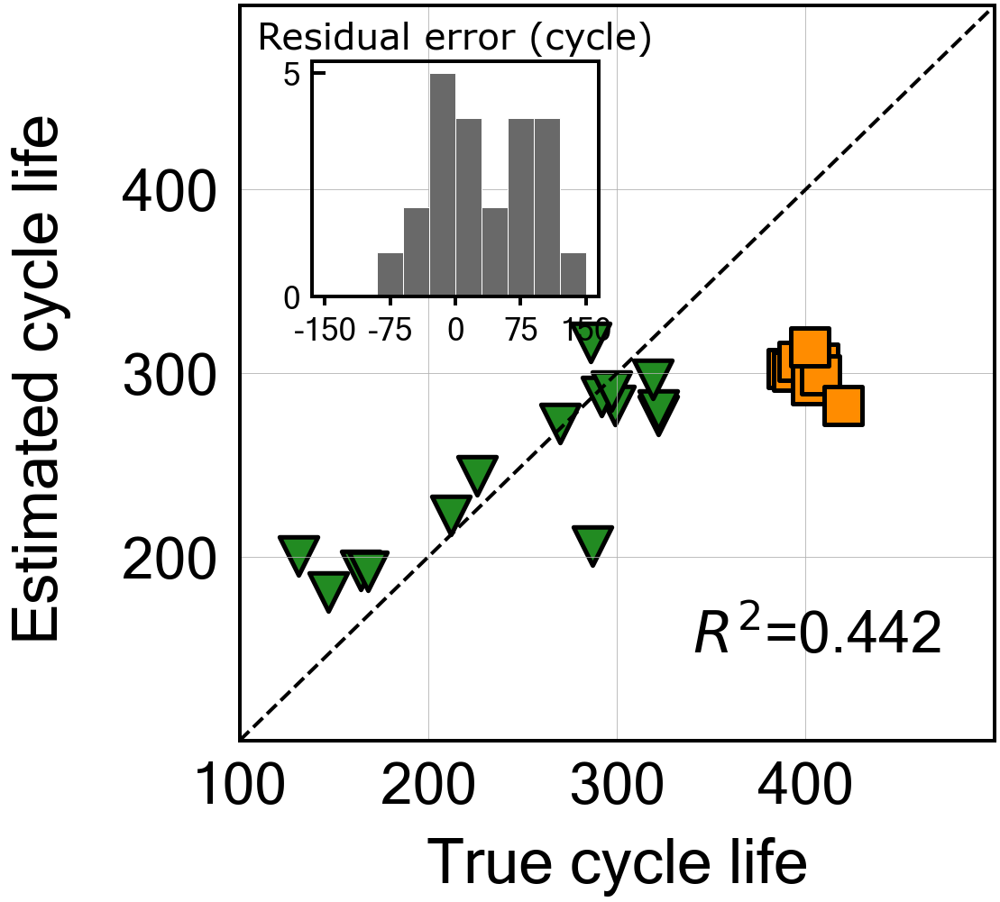


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -137.75252830280957
Cycle no: 41
Coefficient:
T_V('Charge', 'Variance', '41') : -0.0
T_V('Charge', 'Mean', '41') : 0.1362644160491868
T_V('Charge', 'Skewness', '41') : 0.1046408443364898
dTdV('Charge', 'Maximum', '41') : -0.003425478151183122
dTdV('Charge', 'Mean', '41') : -0.0
dTdV('Charge', 'Kurtosis', '41') : 0.0

Intercept: 0.6202443280977309
MAE_all: 55.2
MAPE_all: 17.8 %
RMSE_all: 69.1
RMSPE_all: 21.6 %
MAE_train: 28.8
MAPE_train: 13.5 %
RMSE_train: 36.6
RMSPE_train: 18.8 %
MAE_test: 104.7
MAPE_test: 25.9 %
RMSE_test: 105.8
RMSPE_test: 26.2 %
R2 normal-scale scores
All data r2-score: 0.417
Train data r2-score: 0.693
Test data r2-score: -137.753

Normal-scale scores
All data score: 0.417
Train data score: 0.693
Test data score: -137.753


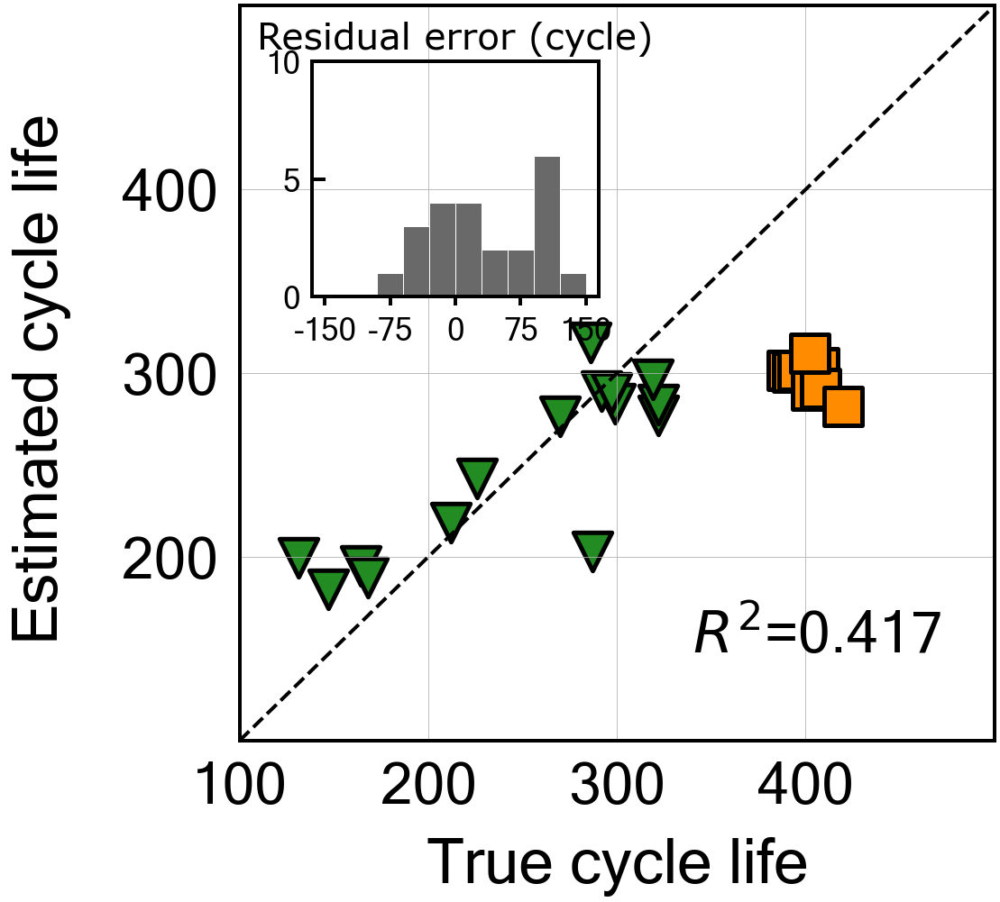


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -117.71333805612147
Cycle no: 42
Coefficient:
T_V('Charge', 'Variance', '42') : -0.0
T_V('Charge', 'Mean', '42') : 0.10030988729803508
T_V('Charge', 'Skewness', '42') : 0.1279305833995188
dTdV('Charge', 'Maximum', '42') : 0.0
dTdV('Charge', 'Mean', '42') : -0.0
dTdV('Charge', 'Kurtosis', '42') : 0.0

Intercept: 0.6202443280977308
MAE_all: 53.2
MAPE_all: 17.5 %
RMSE_all: 64.7
RMSPE_all: 20.8 %
MAE_train: 30.0
MAPE_train: 14.0 %
RMSE_train: 36.1
RMSPE_train: 18.8 %
MAE_test: 96.8
MAPE_test: 24.0 %
RMSE_test: 97.9
RMSPE_test: 24.2 %
R2 normal-scale scores
All data r2-score: 0.488
Train data r2-score: 0.701
Test data r2-score: -117.713

Normal-scale scores
All data score: 0.488
Train data score: 0.701
Test data score: -117.713


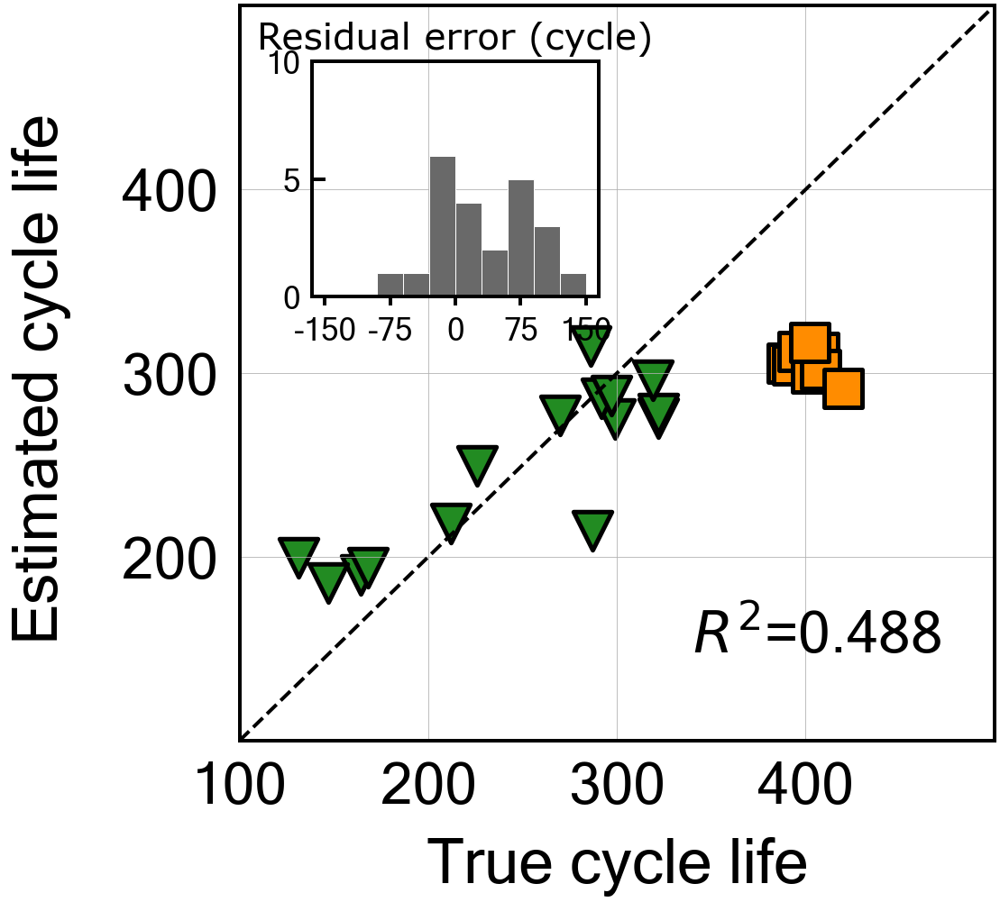


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -60.278208226326846
Cycle no: 43
Coefficient:
T_V('Charge', 'Variance', '43') : -0.010174177737048241
T_V('Charge', 'Mean', '43') : 0.10254348989959326
T_V('Charge', 'Skewness', '43') : 0.16171103650251928
dTdV('Charge', 'Maximum', '43') : 0.0
dTdV('Charge', 'Mean', '43') : -0.0
dTdV('Charge', 'Kurtosis', '43') : -0.009515255171736693

Intercept: 0.6202443280977307
MAE_all: 41.6
MAPE_all: 14.1 %
RMSE_all: 49.3
RMSPE_all: 16.9 %
MAE_train: 26.9
MAPE_train: 12.4 %
RMSE_train: 33.0
RMSPE_train: 16.6 %
MAE_test: 69.1
MAPE_test: 17.1 %
RMSE_test: 70.3
RMSPE_test: 17.4 %
R2 normal-scale scores
All data r2-score: 0.703
Train data r2-score: 0.751
Test data r2-score: -60.278

Normal-scale scores
All data score: 0.703
Train data score: 0.751
Test data score: -60.278


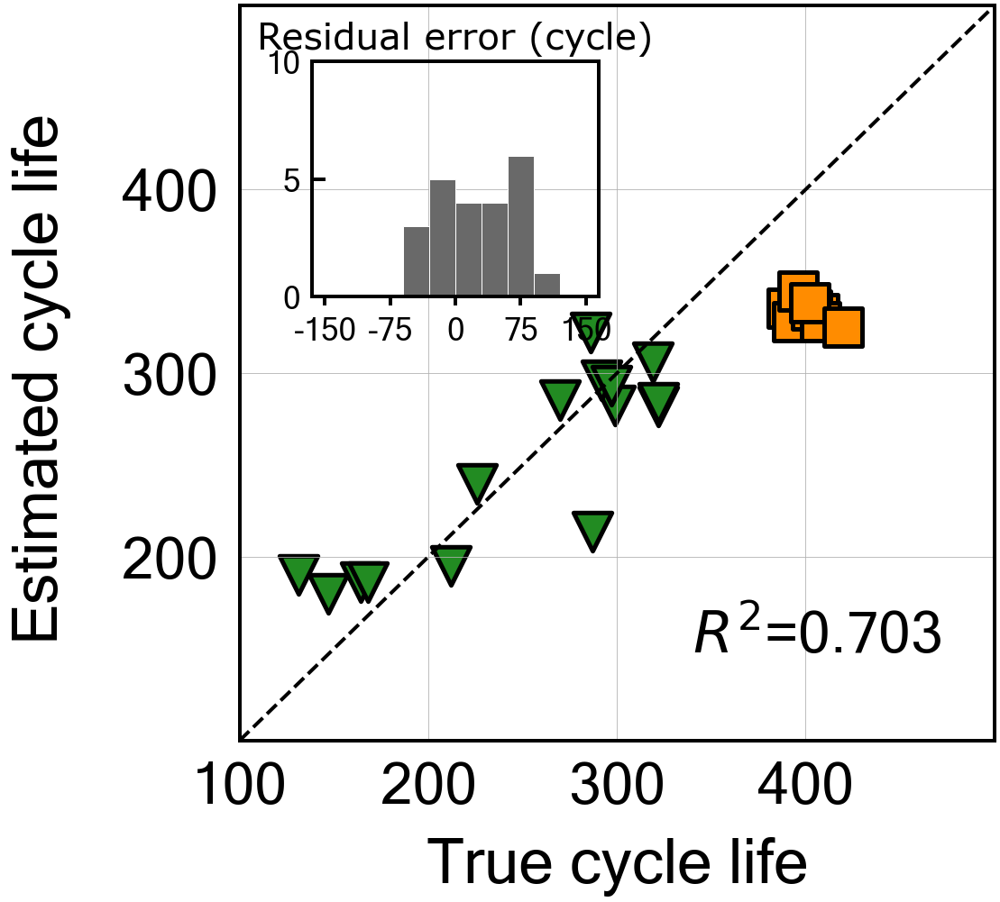


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -132.78918672789226
Cycle no: 44
Coefficient:
T_V('Charge', 'Variance', '44') : -0.0
T_V('Charge', 'Mean', '44') : 0.12405934332507301
T_V('Charge', 'Skewness', '44') : 0.12691750096173435
dTdV('Charge', 'Maximum', '44') : 0.0
dTdV('Charge', 'Mean', '44') : -0.0
dTdV('Charge', 'Kurtosis', '44') : -0.0

Intercept: 0.6202443280977317
MAE_all: 54.5
MAPE_all: 17.5 %
RMSE_all: 68.0
RMSPE_all: 21.2 %
MAE_train: 28.7
MAPE_train: 13.2 %
RMSE_train: 36.4
RMSPE_train: 18.3 %
MAE_test: 102.9
MAPE_test: 25.5 %
RMSE_test: 103.9
RMSPE_test: 25.7 %
R2 normal-scale scores
All data r2-score: 0.435
Train data r2-score: 0.697
Test data r2-score: -132.789

Normal-scale scores
All data score: 0.435
Train data score: 0.697
Test data score: -132.789


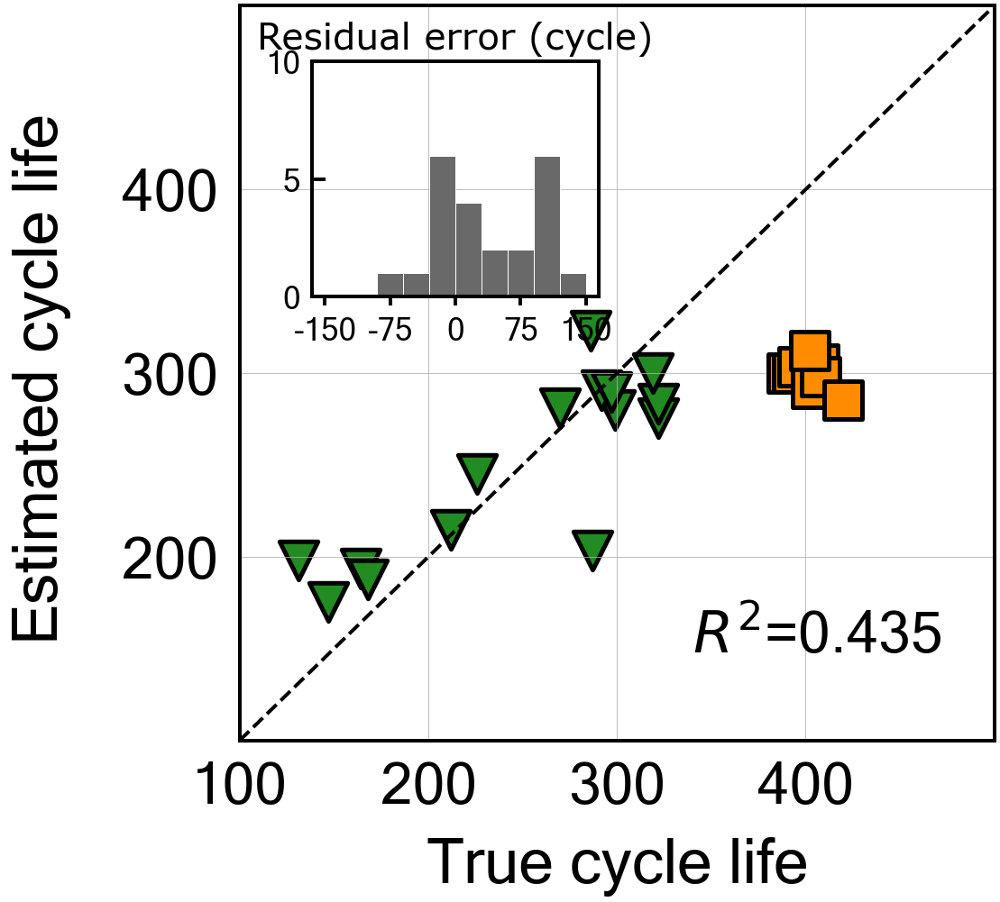


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -49.852890380674445
Cycle no: 45
Coefficient:
T_V('Charge', 'Variance', '45') : -0.024447501617949497
T_V('Charge', 'Mean', '45') : 0.11989769048427916
T_V('Charge', 'Skewness', '45') : 0.15062966651793447
dTdV('Charge', 'Maximum', '45') : -0.0
dTdV('Charge', 'Mean', '45') : -0.0
dTdV('Charge', 'Kurtosis', '45') : -0.04697497091568517

Intercept: 0.6202443280977314
MAE_all: 38.4
MAPE_all: 13.2 %
RMSE_all: 45.5
RMSPE_all: 16.0 %
MAE_train: 26.8
MAPE_train: 12.3 %
RMSE_train: 31.5
RMSPE_train: 16.2 %
MAE_test: 60.1
MAPE_test: 14.8 %
RMSE_test: 64.1
RMSPE_test: 15.7 %
R2 normal-scale scores
All data r2-score: 0.746
Train data r2-score: 0.773
Test data r2-score: -49.853

Normal-scale scores
All data score: 0.746
Train data score: 0.773
Test data score: -49.853


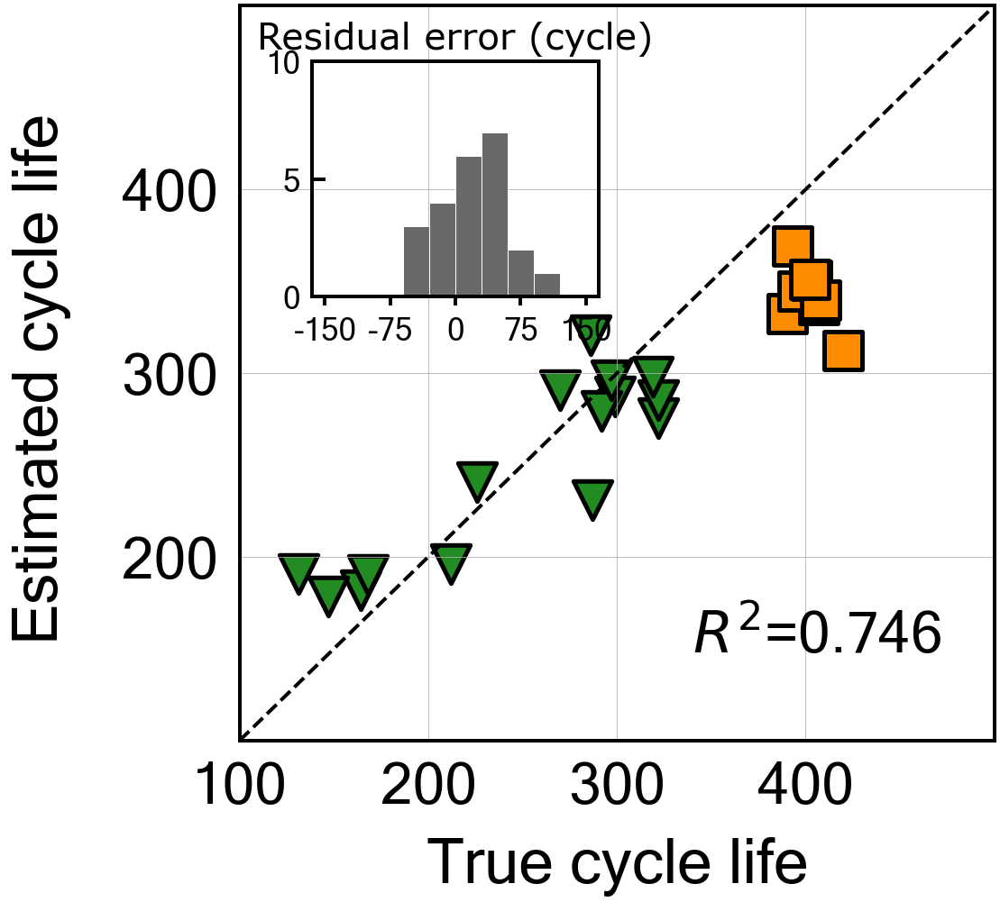


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.7
Best score obtained was: -99.45204980768443
Cycle no: 46
Coefficient:
T_V('Charge', 'Variance', '46') : -0.0
T_V('Charge', 'Mean', '46') : 0.08900748525973994
T_V('Charge', 'Skewness', '46') : 0.14882312284159413
dTdV('Charge', 'Maximum', '46') : -0.0
dTdV('Charge', 'Mean', '46') : -0.0
dTdV('Charge', 'Kurtosis', '46') : -0.0

Intercept: 0.6202443280977312
MAE_all: 50.6
MAPE_all: 16.8 %
RMSE_all: 61.1
RMSPE_all: 20.4 %
MAE_train: 30.2
MAPE_train: 14.1 %
RMSE_train: 37.4
RMSPE_train: 19.4 %
MAE_test: 88.8
MAPE_test: 22.0 %
RMSE_test: 90.1
RMSPE_test: 22.2 %
R2 normal-scale scores
All data r2-score: 0.544
Train data r2-score: 0.680
Test data r2-score: -99.452

Normal-scale scores
All data score: 0.544
Train data score: 0.680
Test data score: -99.452


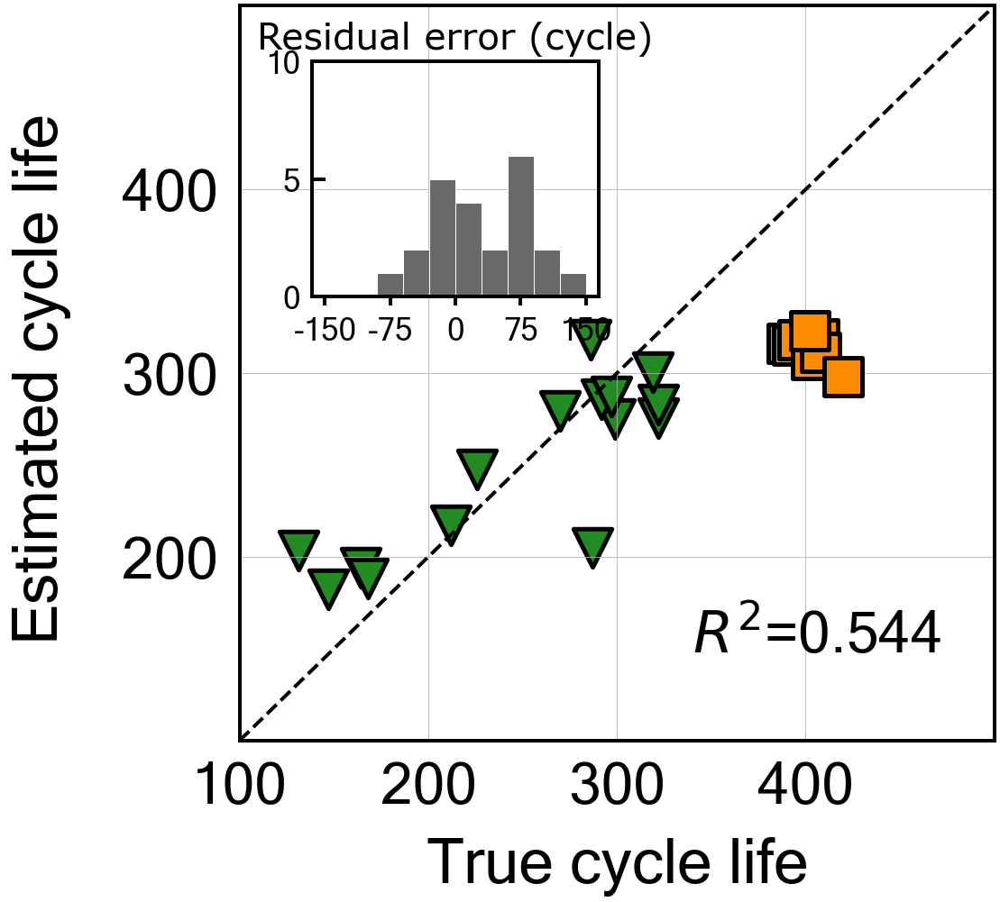


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 6.3
Best score obtained was: -73.71797961971974
Cycle no: 47
Coefficient:
T_V('Charge', 'Variance', '47') : -0.00578155694669173
T_V('Charge', 'Mean', '47') : 0.11436979013772587
T_V('Charge', 'Skewness', '47') : 0.14505464260903508
dTdV('Charge', 'Maximum', '47') : 0.0
dTdV('Charge', 'Mean', '47') : -0.009044989809291786
dTdV('Charge', 'Kurtosis', '47') : -0.01858014964854132

Intercept: 0.6202443280977308
MAE_all: 44.4
MAPE_all: 14.9 %
RMSE_all: 53.5
RMSPE_all: 18.0 %
MAE_train: 27.3
MAPE_train: 12.7 %
RMSE_train: 34.3
RMSPE_train: 17.3 %
MAE_test: 76.3
MAPE_test: 18.9 %
RMSE_test: 77.7
RMSPE_test: 19.2 %
R2 normal-scale scores
All data r2-score: 0.650
Train data r2-score: 0.731
Test data r2-score: -73.718

Normal-scale scores
All data score: 0.650
Train data score: 0.731
Test data score: -73.718


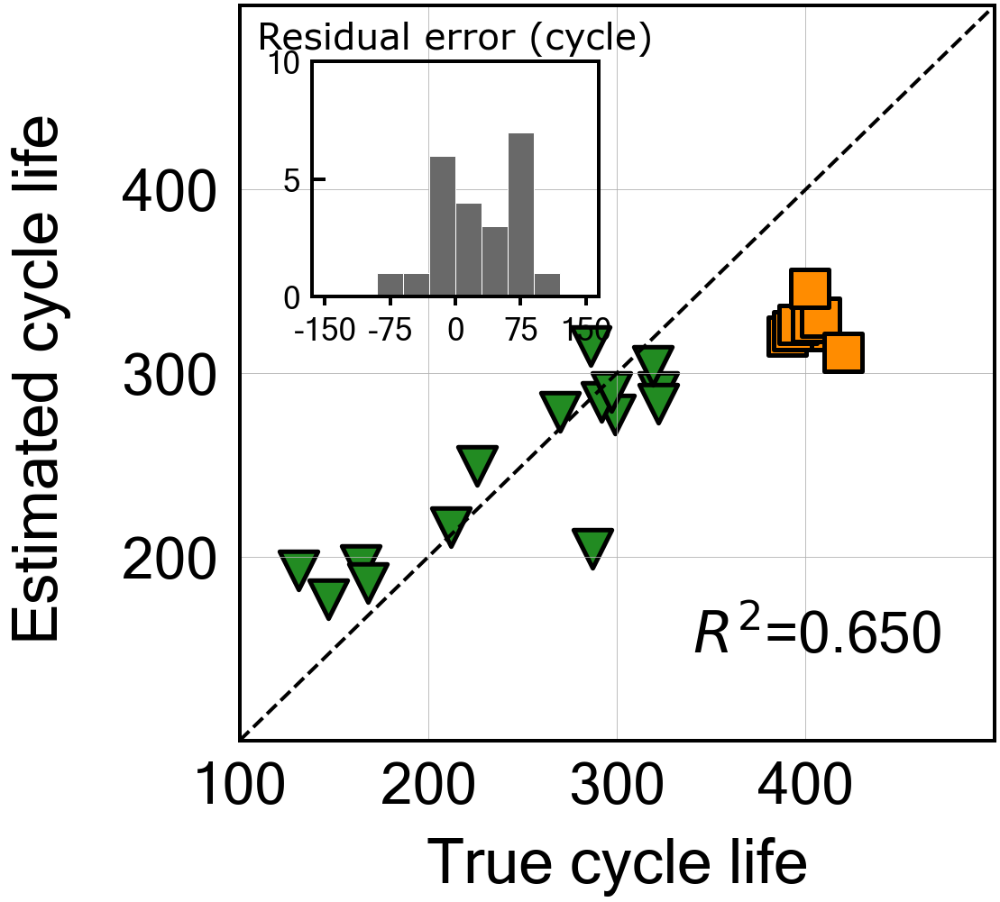


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.6
Best score obtained was: -374.10424985323573
Cycle no: 48
Coefficient:
T_V('Charge', 'Variance', '48') : -0.5577581503158259
T_V('Charge', 'Mean', '48') : 0.16873932093241778
T_V('Charge', 'Skewness', '48') : 0.15286267548006968
dTdV('Charge', 'Maximum', '48') : 0.1461639666127032
dTdV('Charge', 'Mean', '48') : 0.3478799109662334
dTdV('Charge', 'Kurtosis', '48') : 0.1528571949056776

Intercept: 0.6202443280977308
MAE_all: 69.5
MAPE_all: 18.9 %
RMSE_all: 103.8
RMSPE_all: 26.3 %
MAE_train: 15.0
MAPE_train: 6.3 %
RMSE_train: 19.6
RMSPE_train: 7.9 %
MAE_test: 171.6
MAPE_test: 42.7 %
RMSE_test: 174.0
RMSPE_test: 43.3 %
R2 normal-scale scores
All data r2-score: -0.319
Train data r2-score: 0.912
Test data r2-score: -374.104

Normal-scale scores
All data score: -0.319
Train data score: 0.912
Test data score: -374.104


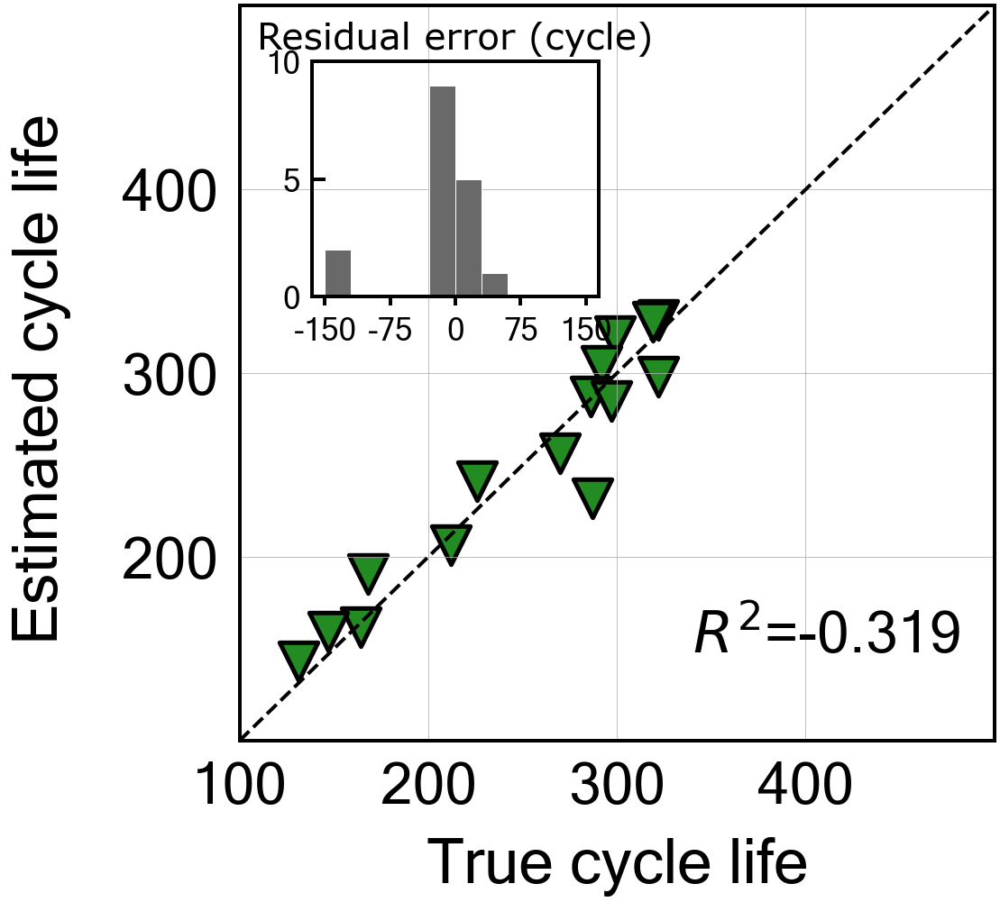


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -78.180901750405
Cycle no: 49
Coefficient:
T_V('Charge', 'Variance', '49') : -0.006784204178892377
T_V('Charge', 'Mean', '49') : 0.11909429821822398
T_V('Charge', 'Skewness', '49') : 0.13407443107867045
dTdV('Charge', 'Maximum', '49') : -0.0
dTdV('Charge', 'Mean', '49') : -0.0029903983589524338
dTdV('Charge', 'Kurtosis', '49') : 0.0

Intercept: 0.6202443280977317
MAE_all: 45.6
MAPE_all: 15.2 %
RMSE_all: 55.2
RMSPE_all: 18.6 %
MAE_train: 27.7
MAPE_train: 12.9 %
RMSE_train: 35.5
RMSPE_train: 18.0 %
MAE_test: 79.2
MAPE_test: 19.6 %
RMSE_test: 80.0
RMSPE_test: 19.8 %
R2 normal-scale scores
All data r2-score: 0.628
Train data r2-score: 0.712
Test data r2-score: -78.181

Normal-scale scores
All data score: 0.628
Train data score: 0.712
Test data score: -78.181


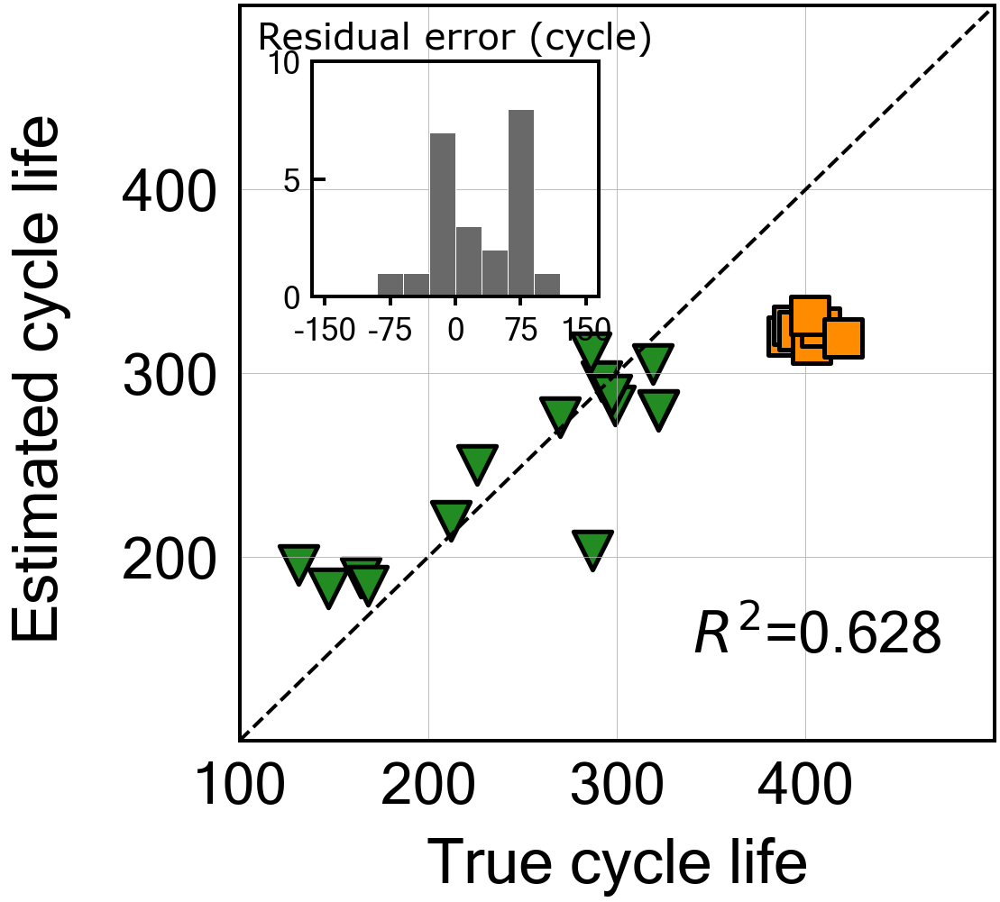


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.4
Best score obtained was: -64.81447649309544
Cycle no: 50
Coefficient:
T_V('Charge', 'Variance', '50') : -0.008495633402297215
T_V('Charge', 'Mean', '50') : 0.1236454300515267
T_V('Charge', 'Skewness', '50') : 0.13198026408138602
dTdV('Charge', 'Maximum', '50') : -0.01311395418840718
dTdV('Charge', 'Mean', '50') : -0.0
dTdV('Charge', 'Kurtosis', '50') : 0.009902721575587433

Intercept: 0.6202443280977301
MAE_all: 41.9
MAPE_all: 14.2 %
RMSE_all: 51.3
RMSPE_all: 18.2 %
MAE_train: 26.0
MAPE_train: 12.3 %
RMSE_train: 34.6
RMSPE_train: 18.3 %
MAE_test: 71.7
MAPE_test: 17.8 %
RMSE_test: 72.9
RMSPE_test: 18.0 %
R2 normal-scale scores
All data r2-score: 0.679
Train data r2-score: 0.726
Test data r2-score: -64.814

Normal-scale scores
All data score: 0.679
Train data score: 0.726
Test data score: -64.814


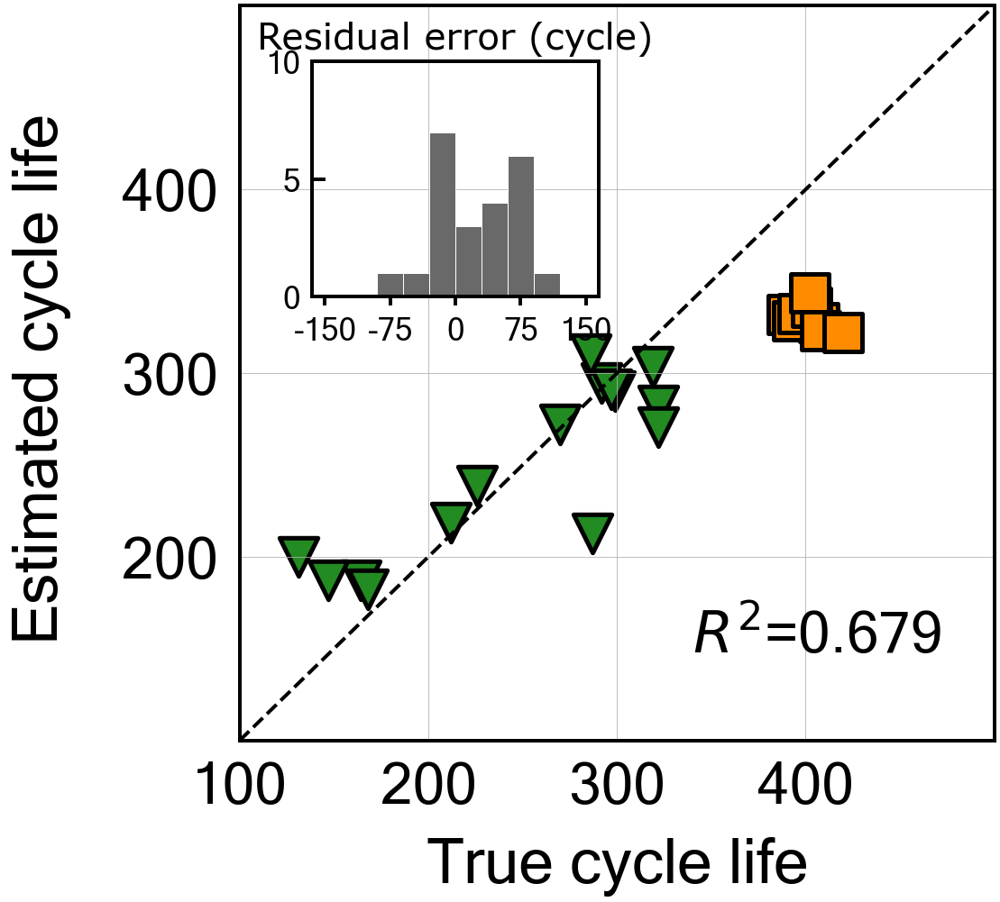


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.8
Best score obtained was: -48.33317373521248
Cycle no: 51
Coefficient:
T_V('Charge', 'Variance', '51') : -0.07281362828394584
T_V('Charge', 'Mean', '51') : 0.15048701903605868
T_V('Charge', 'Skewness', '51') : 0.11061696425180027
dTdV('Charge', 'Maximum', '51') : 0.07991462310747867
dTdV('Charge', 'Mean', '51') : -0.011570139470246108
dTdV('Charge', 'Kurtosis', '51') : -0.03908550373361195

Intercept: 0.6202443280977319
MAE_all: 34.2
MAPE_all: 11.7 %
RMSE_all: 44.3
RMSPE_all: 15.2 %
MAE_train: 22.5
MAPE_train: 10.5 %
RMSE_train: 29.8
RMSPE_train: 15.0 %
MAE_test: 56.2
MAPE_test: 14.0 %
RMSE_test: 63.1
RMSPE_test: 15.6 %
R2 normal-scale scores
All data r2-score: 0.760
Train data r2-score: 0.797
Test data r2-score: -48.333

Normal-scale scores
All data score: 0.760
Train data score: 0.797
Test data score: -48.333


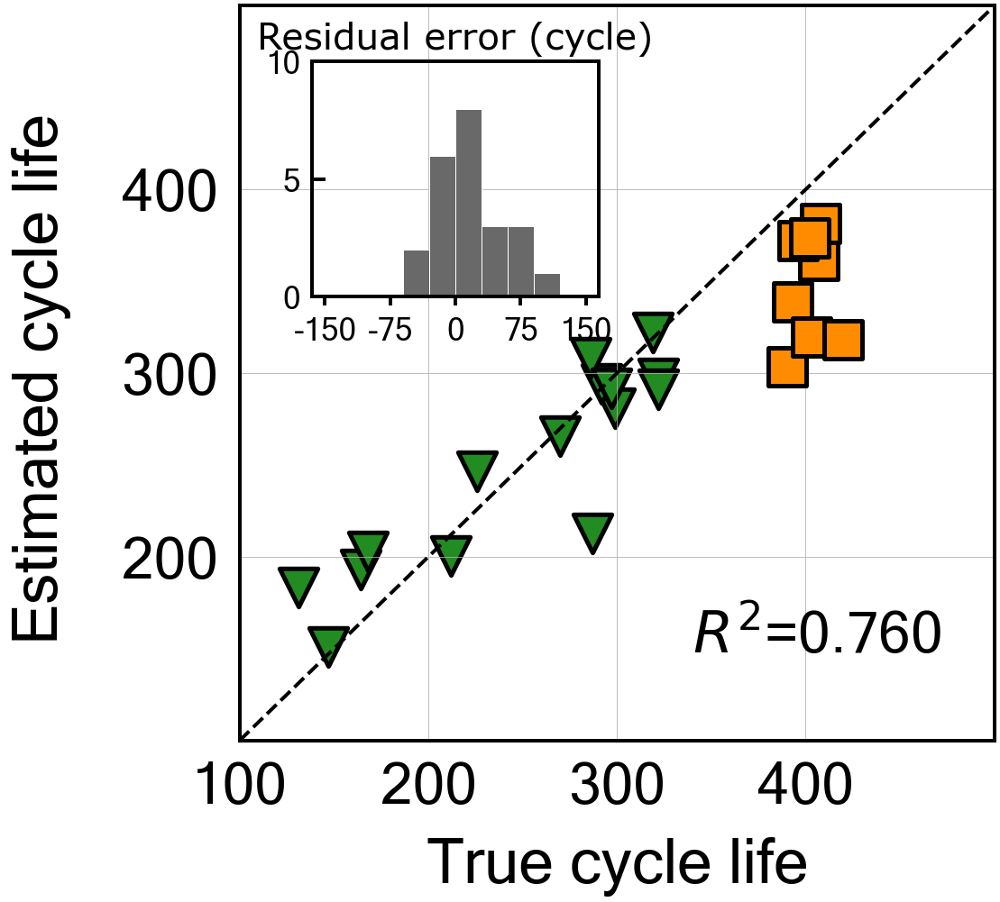


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -133.916745614357
Cycle no: 52
Coefficient:
T_V('Charge', 'Variance', '52') : -0.0
T_V('Charge', 'Mean', '52') : 0.10268973269686534
T_V('Charge', 'Skewness', '52') : 0.12972800629320466
dTdV('Charge', 'Maximum', '52') : -0.0
dTdV('Charge', 'Mean', '52') : -0.0
dTdV('Charge', 'Kurtosis', '52') : -0.0

Intercept: 0.620244328097732
MAE_all: 54.4
MAPE_all: 17.5 %
RMSE_all: 67.7
RMSPE_all: 21.0 %
MAE_train: 28.2
MAPE_train: 13.2 %
RMSE_train: 34.8
RMSPE_train: 17.8 %
MAE_test: 103.3
MAPE_test: 25.6 %
RMSE_test: 104.4
RMSPE_test: 25.8 %
R2 normal-scale scores
All data r2-score: 0.440
Train data r2-score: 0.722
Test data r2-score: -133.917

Normal-scale scores
All data score: 0.440
Train data score: 0.722
Test data score: -133.917


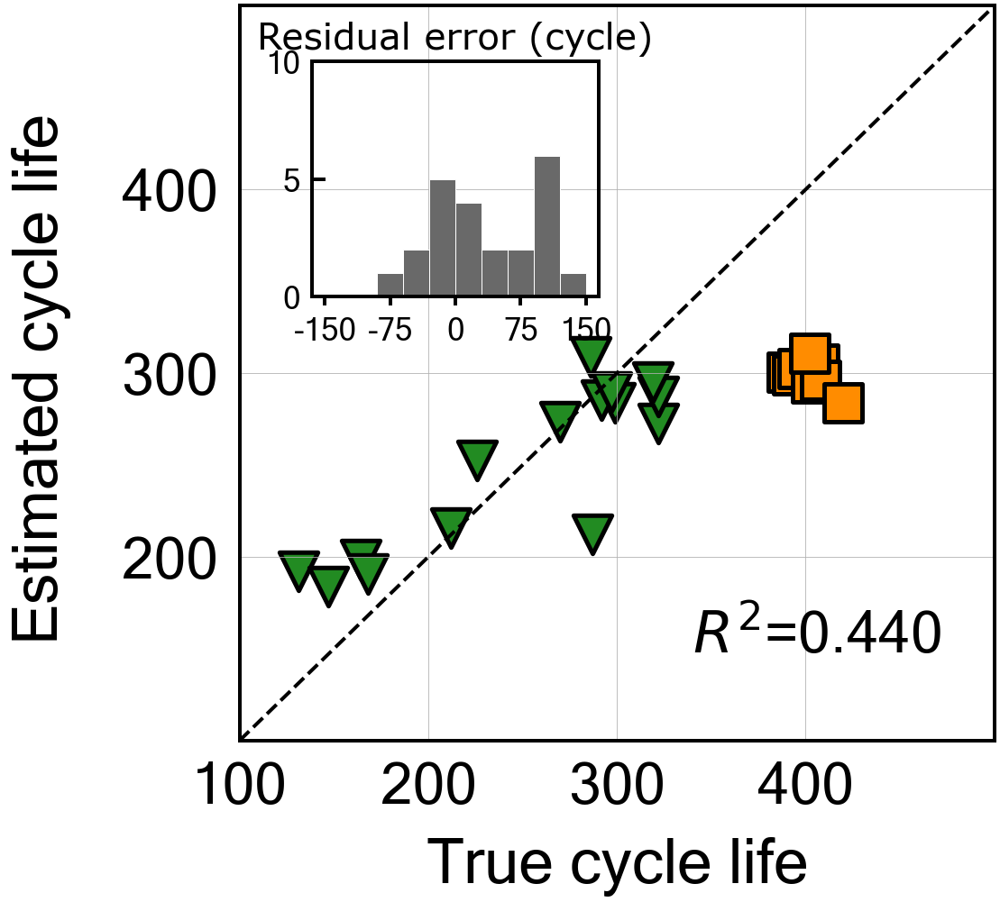


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -78.60445774867749
Cycle no: 53
Coefficient:
T_V('Charge', 'Variance', '53') : -0.00030768057662465277
T_V('Charge', 'Mean', '53') : 0.1507100041084067
T_V('Charge', 'Skewness', '53') : 0.12586643896666255
dTdV('Charge', 'Maximum', '53') : -0.045390094456285876
dTdV('Charge', 'Mean', '53') : 0.022243612979032493
dTdV('Charge', 'Kurtosis', '53') : -0.06523269815104385

Intercept: 0.620244328097731
MAE_all: 43.0
MAPE_all: 14.0 %
RMSE_all: 53.3
RMSPE_all: 17.0 %
MAE_train: 23.6
MAPE_train: 11.0 %
RMSE_train: 30.5
RMSPE_train: 15.2 %
MAE_test: 79.3
MAPE_test: 19.7 %
RMSE_test: 80.2
RMSPE_test: 19.9 %
R2 normal-scale scores
All data r2-score: 0.652
Train data r2-score: 0.787
Test data r2-score: -78.604

Normal-scale scores
All data score: 0.652
Train data score: 0.787
Test data score: -78.604


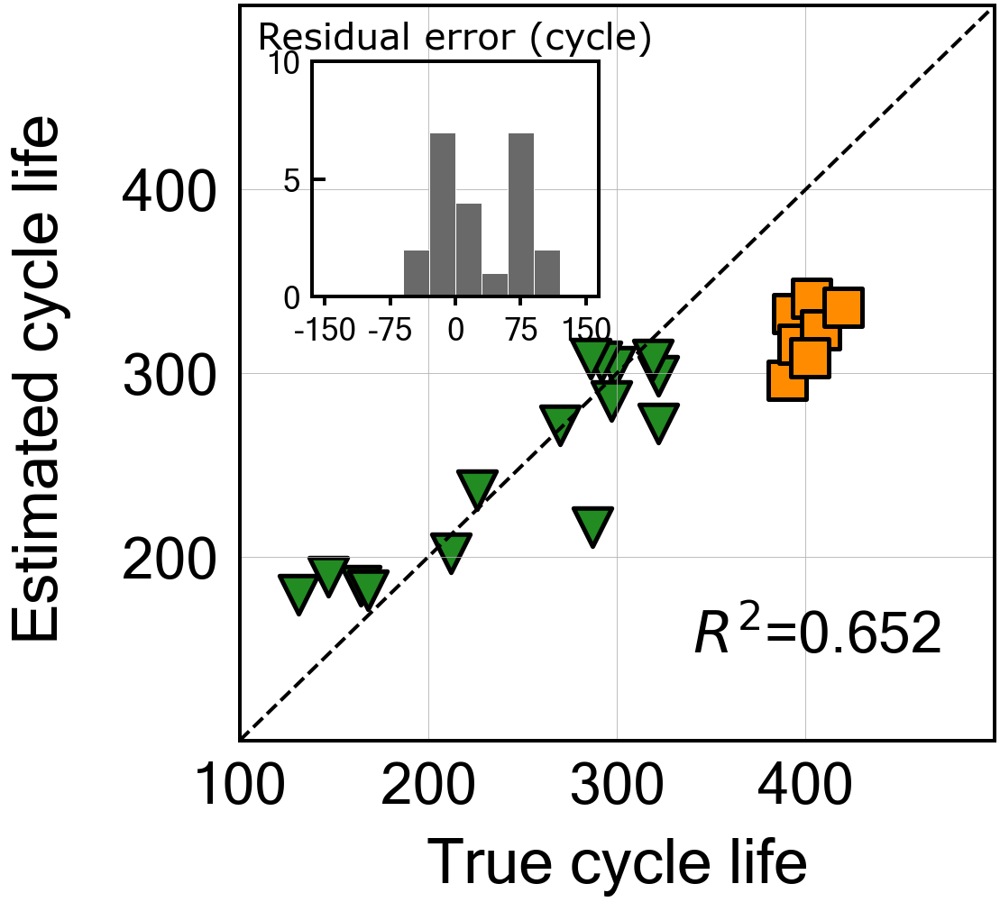


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -136.74500951738804
Cycle no: 54
Coefficient:
T_V('Charge', 'Variance', '54') : -0.0896365378379993
T_V('Charge', 'Mean', '54') : 0.22602499692456532
T_V('Charge', 'Skewness', '54') : 0.1341812257248294
dTdV('Charge', 'Maximum', '54') : 0.16027213086438888
dTdV('Charge', 'Mean', '54') : -0.11206814026293847
dTdV('Charge', 'Kurtosis', '54') : 0.07047749250104493

Intercept: 0.6202443280977304
MAE_all: 43.1
MAPE_all: 12.3 %
RMSE_all: 63.7
RMSPE_all: 16.5 %
MAE_train: 13.7
MAPE_train: 5.9 %
RMSE_train: 17.1
RMSPE_train: 7.5 %
MAE_test: 98.2
MAPE_test: 24.3 %
RMSE_test: 105.5
RMSPE_test: 26.0 %
R2 normal-scale scores
All data r2-score: 0.504
Train data r2-score: 0.933
Test data r2-score: -136.745

Normal-scale scores
All data score: 0.504
Train data score: 0.933
Test data score: -136.745


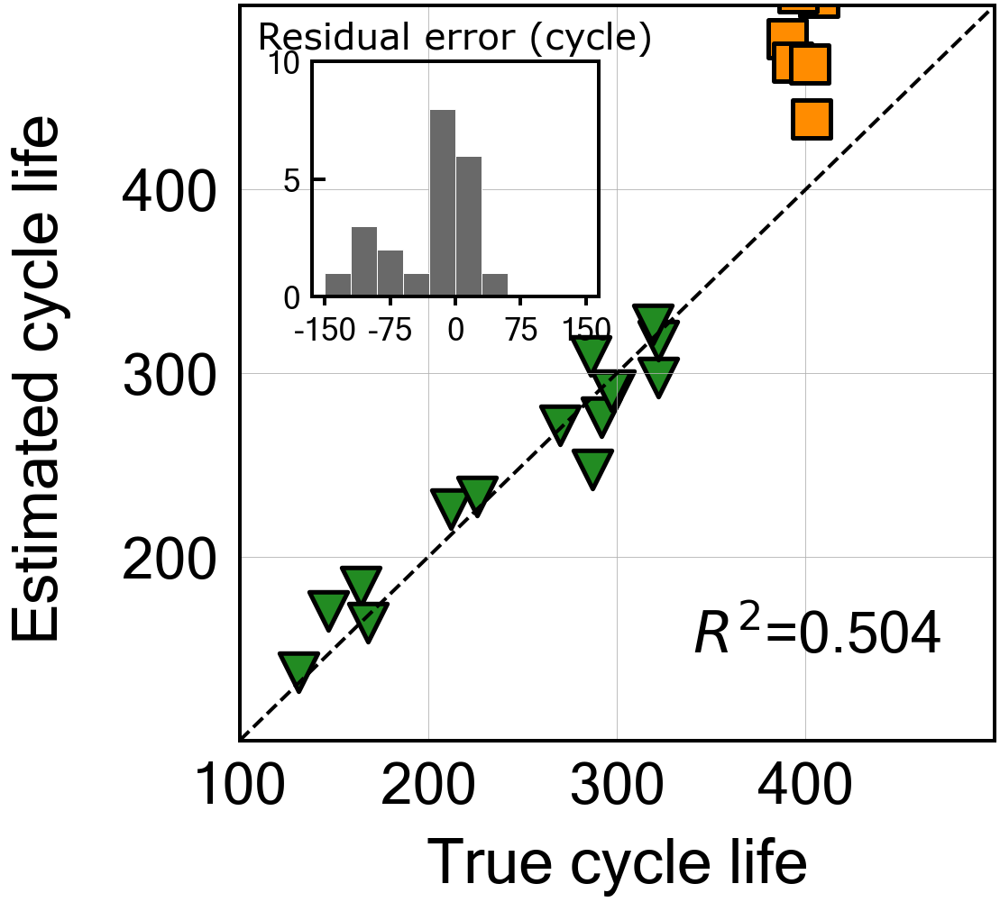


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -23.959171062745106
Cycle no: 55
Coefficient:
T_V('Charge', 'Variance', '55') : -0.00953978044620392
T_V('Charge', 'Mean', '55') : 0.15133739104014204
T_V('Charge', 'Skewness', '55') : 0.1718247112730567
dTdV('Charge', 'Maximum', '55') : 0.0
dTdV('Charge', 'Mean', '55') : -0.08328178311882037
dTdV('Charge', 'Kurtosis', '55') : -0.057108189580252516

Intercept: 0.620244328097731
MAE_all: 25.9
MAPE_all: 8.8 %
RMSE_all: 33.6
RMSPE_all: 11.1 %
MAE_train: 18.4
MAPE_train: 8.2 %
RMSE_train: 25.5
RMSPE_train: 11.1 %
MAE_test: 40.1
MAPE_test: 9.9 %
RMSE_test: 44.9
RMSPE_test: 11.1 %
R2 normal-scale scores
All data r2-score: 0.862
Train data r2-score: 0.851
Test data r2-score: -23.959

Normal-scale scores
All data score: 0.862
Train data score: 0.851
Test data score: -23.959


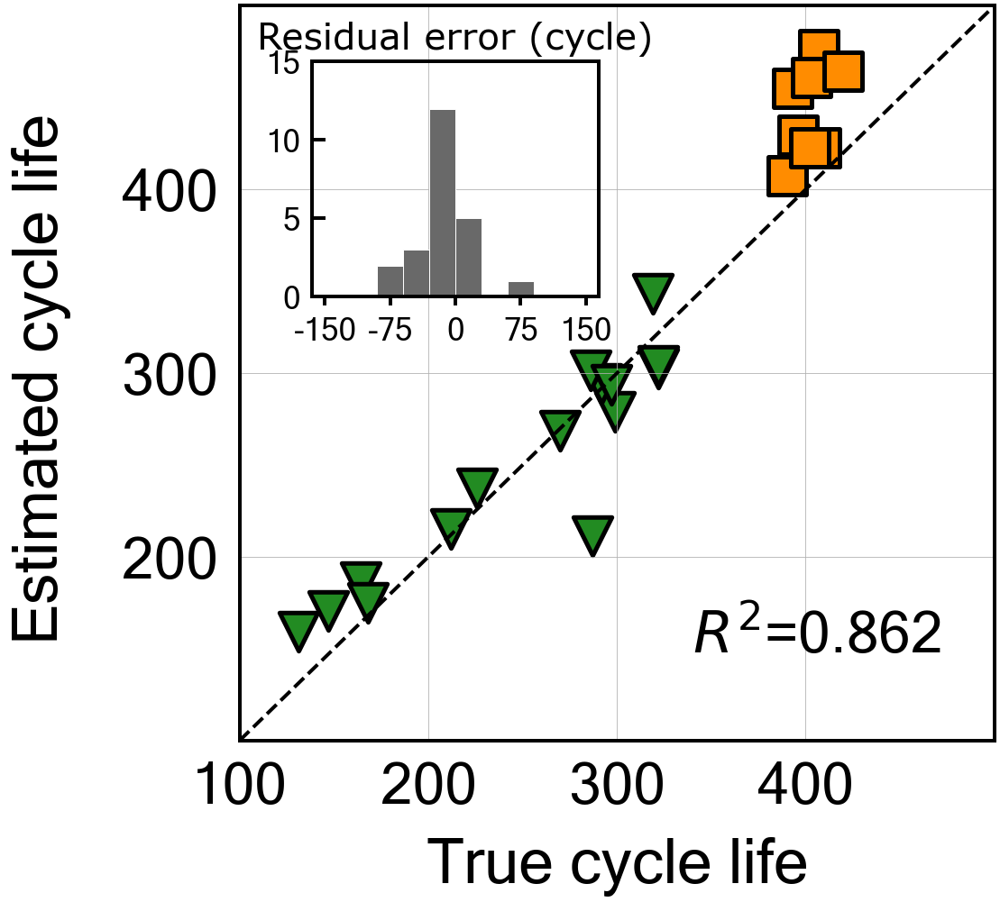


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -126.38728981488833
Cycle no: 56
Coefficient:
T_V('Charge', 'Variance', '56') : -0.0
T_V('Charge', 'Mean', '56') : 0.10985419911601578
T_V('Charge', 'Skewness', '56') : 0.12525921465453704
dTdV('Charge', 'Maximum', '56') : 0.0
dTdV('Charge', 'Mean', '56') : -0.0
dTdV('Charge', 'Kurtosis', '56') : 0.0

Intercept: 0.6202443280977321
MAE_all: 53.6
MAPE_all: 17.5 %
RMSE_all: 66.5
RMSPE_all: 21.3 %
MAE_train: 28.9
MAPE_train: 13.6 %
RMSE_train: 36.0
RMSPE_train: 19.1 %
MAE_test: 100.0
MAPE_test: 24.8 %
RMSE_test: 101.4
RMSPE_test: 25.0 %
R2 normal-scale scores
All data r2-score: 0.459
Train data r2-score: 0.703
Test data r2-score: -126.387

Normal-scale scores
All data score: 0.459
Train data score: 0.703
Test data score: -126.387


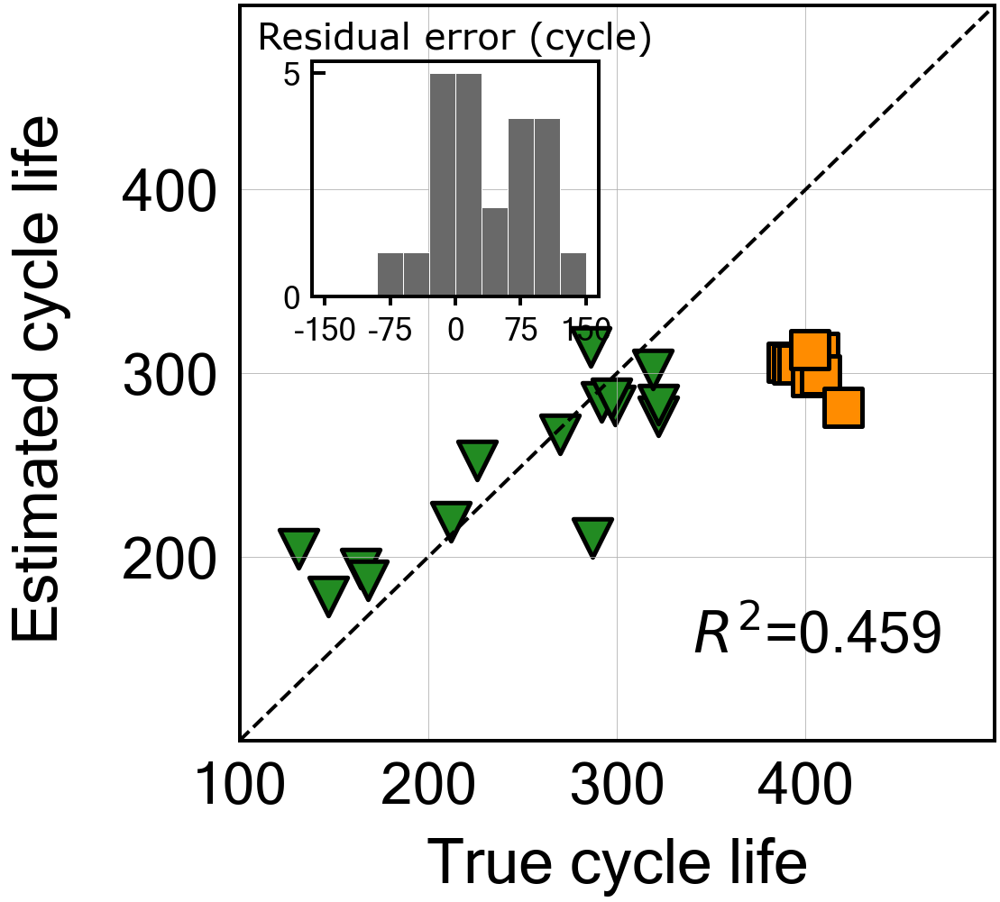


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -63.55878656959881
Cycle no: 57
Coefficient:
T_V('Charge', 'Variance', '57') : -0.003414979418367749
T_V('Charge', 'Mean', '57') : 0.1374909969169692
T_V('Charge', 'Skewness', '57') : 0.12992236213095232
dTdV('Charge', 'Maximum', '57') : -0.019171648221548345
dTdV('Charge', 'Mean', '57') : -0.0
dTdV('Charge', 'Kurtosis', '57') : -0.0

Intercept: 0.6202443280977306
MAE_all: 39.9
MAPE_all: 13.5 %
RMSE_all: 50.7
RMSPE_all: 17.6 %
MAE_train: 24.9
MAPE_train: 11.7 %
RMSE_train: 34.1
RMSPE_train: 17.5 %
MAE_test: 68.1
MAPE_test: 16.8 %
RMSE_test: 72.2
RMSPE_test: 17.8 %
R2 normal-scale scores
All data r2-score: 0.685
Train data r2-score: 0.733
Test data r2-score: -63.559

Normal-scale scores
All data score: 0.685
Train data score: 0.733
Test data score: -63.559


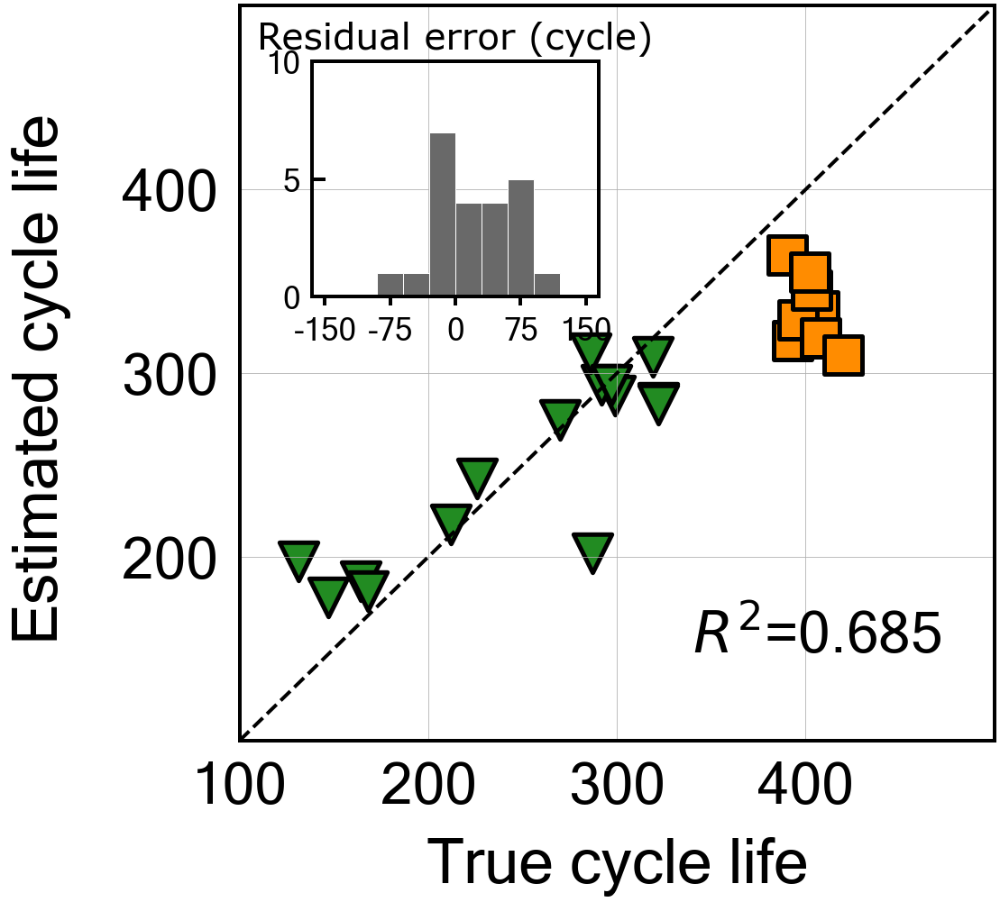


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -18.879365178547364
Cycle no: 58
Coefficient:
T_V('Charge', 'Variance', '58') : -0.0
T_V('Charge', 'Mean', '58') : 0.1409222044175888
T_V('Charge', 'Skewness', '58') : 0.17080834713668672
dTdV('Charge', 'Maximum', '58') : -0.06189762462407473
dTdV('Charge', 'Mean', '58') : -0.0
dTdV('Charge', 'Kurtosis', '58') : 0.017594101380199297

Intercept: 0.620244328097732
MAE_all: 25.1
MAPE_all: 9.2 %
RMSE_all: 33.2
RMSPE_all: 13.1 %
MAE_train: 20.8
MAPE_train: 9.7 %
RMSE_train: 28.9
RMSPE_train: 14.5 %
MAE_test: 33.3
MAPE_test: 8.2 %
RMSE_test: 40.1
RMSPE_test: 9.8 %
R2 normal-scale scores
All data r2-score: 0.865
Train data r2-score: 0.809
Test data r2-score: -18.879

Normal-scale scores
All data score: 0.865
Train data score: 0.809
Test data score: -18.879


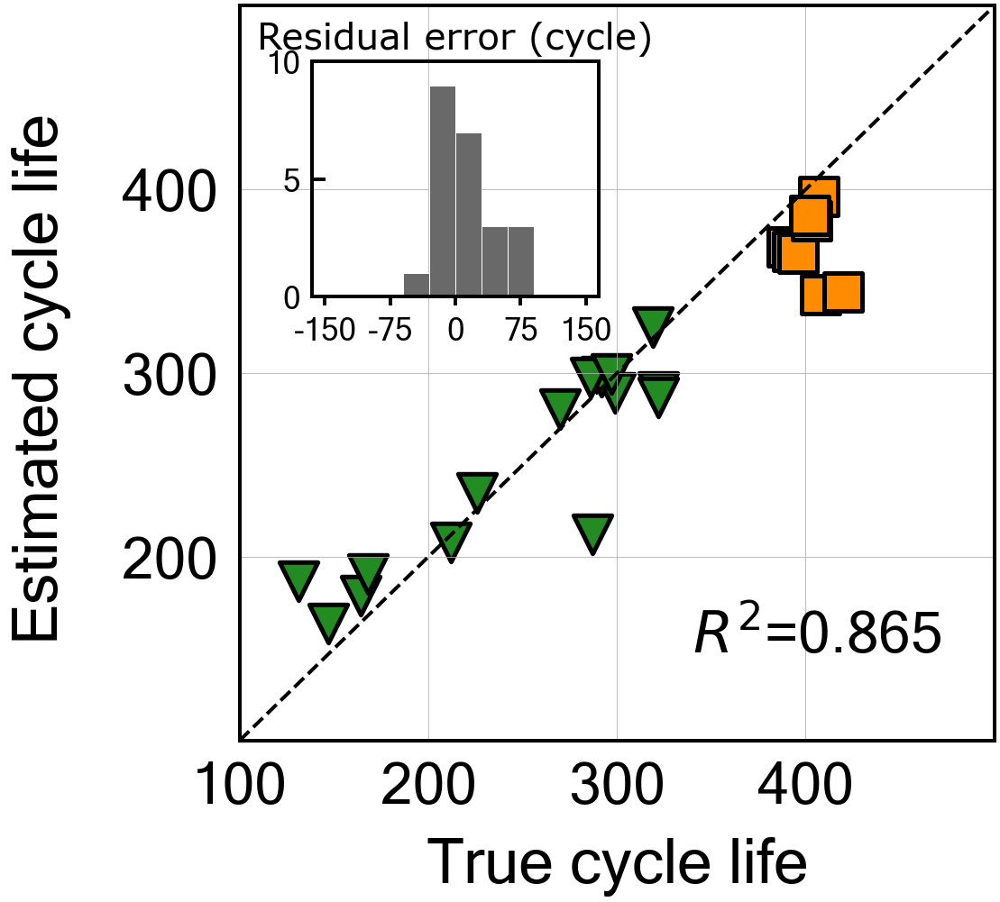


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -99.22324963694662
Cycle no: 59
Coefficient:
T_V('Charge', 'Variance', '59') : -0.0
T_V('Charge', 'Mean', '59') : 0.10577741499775564
T_V('Charge', 'Skewness', '59') : 0.1409001393129604
dTdV('Charge', 'Maximum', '59') : -0.0
dTdV('Charge', 'Mean', '59') : -0.0
dTdV('Charge', 'Kurtosis', '59') : -0.0

Intercept: 0.6202443280977307
MAE_all: 48.7
MAPE_all: 16.0 %
RMSE_all: 60.2
RMSPE_all: 19.2 %
MAE_train: 27.9
MAPE_train: 13.0 %
RMSE_train: 35.2
RMSPE_train: 17.5 %
MAE_test: 87.8
MAPE_test: 21.7 %
RMSE_test: 90.0
RMSPE_test: 22.2 %
R2 normal-scale scores
All data r2-score: 0.557
Train data r2-score: 0.716
Test data r2-score: -99.223

Normal-scale scores
All data score: 0.557
Train data score: 0.716
Test data score: -99.223


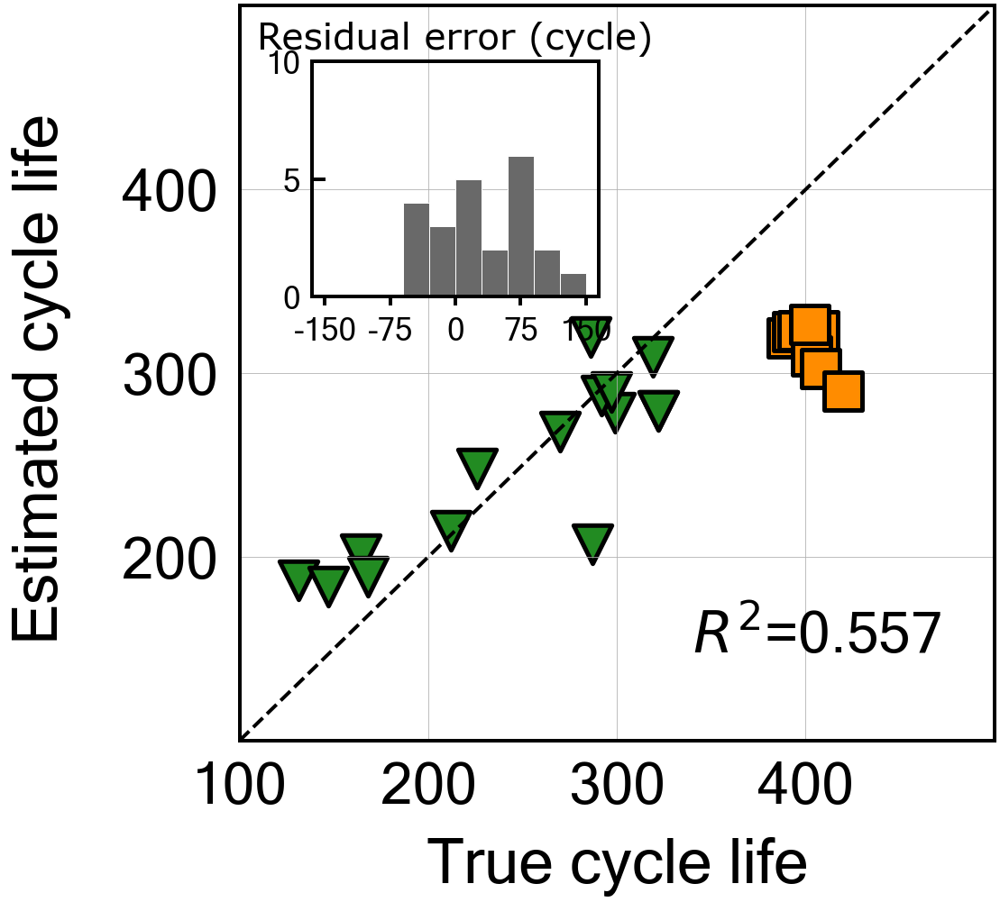


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -85.97912449298099
Cycle no: 60
Coefficient:
T_V('Charge', 'Variance', '60') : -0.006819155471480597
T_V('Charge', 'Mean', '60') : 0.11232750684058673
T_V('Charge', 'Skewness', '60') : 0.14179176787489425
dTdV('Charge', 'Maximum', '60') : -0.0
dTdV('Charge', 'Mean', '60') : -0.0
dTdV('Charge', 'Kurtosis', '60') : -0.0

Intercept: 0.6202443280977323
MAE_all: 47.1
MAPE_all: 15.6 %
RMSE_all: 57.0
RMSPE_all: 18.4 %
MAE_train: 28.4
MAPE_train: 13.0 %
RMSE_train: 35.2
RMSPE_train: 17.1 %
MAE_test: 82.3
MAPE_test: 20.4 %
RMSE_test: 83.8
RMSPE_test: 20.7 %
R2 normal-scale scores
All data r2-score: 0.603
Train data r2-score: 0.716
Test data r2-score: -85.979

Normal-scale scores
All data score: 0.603
Train data score: 0.716
Test data score: -85.979


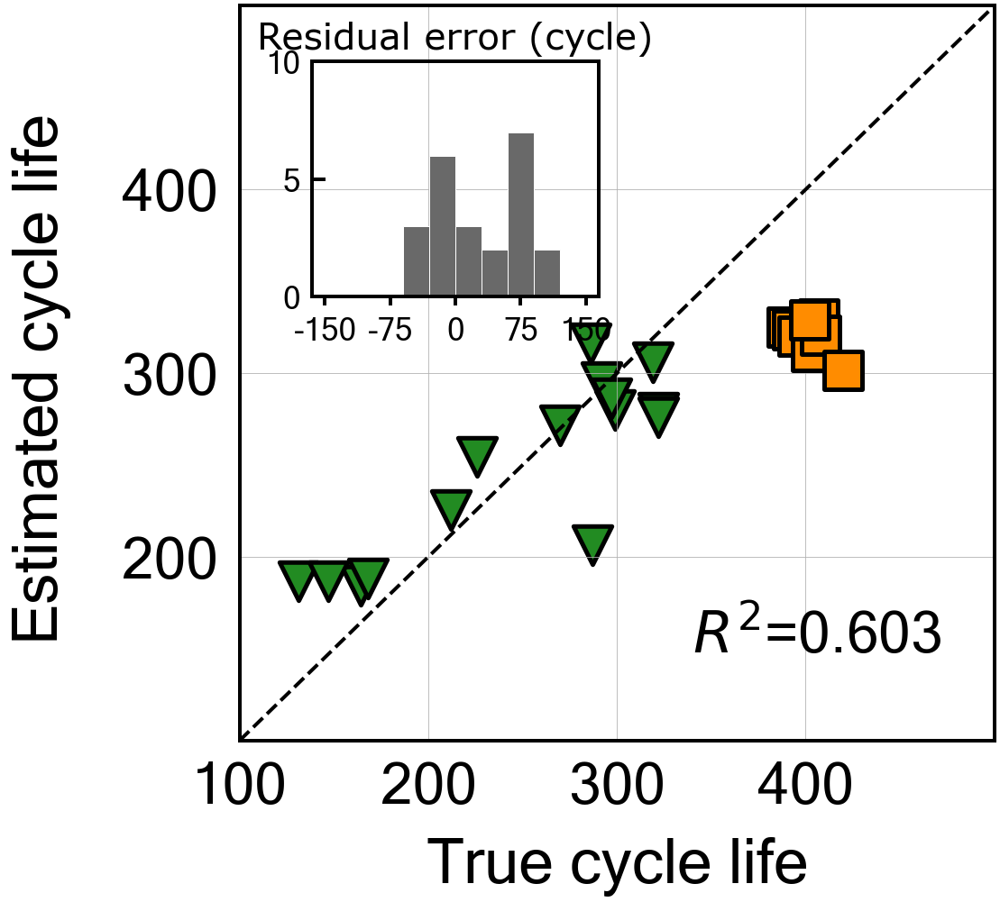


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -84.94270999884273
Cycle no: 61
Coefficient:
T_V('Charge', 'Variance', '61') : -0.0
T_V('Charge', 'Mean', '61') : 0.10515521748485251
T_V('Charge', 'Skewness', '61') : 0.1628871113693891
dTdV('Charge', 'Maximum', '61') : 0.0
dTdV('Charge', 'Mean', '61') : -0.0
dTdV('Charge', 'Kurtosis', '61') : 0.0

Intercept: 0.6202443280977313
MAE_all: 45.4
MAPE_all: 14.6 %
RMSE_all: 55.4
RMSPE_all: 17.1 %
MAE_train: 25.7
MAPE_train: 11.6 %
RMSE_train: 31.8
RMSPE_train: 14.8 %
MAE_test: 82.2
MAPE_test: 20.4 %
RMSE_test: 83.3
RMSPE_test: 20.6 %
R2 normal-scale scores
All data r2-score: 0.624
Train data r2-score: 0.768
Test data r2-score: -84.943

Normal-scale scores
All data score: 0.624
Train data score: 0.768
Test data score: -84.943


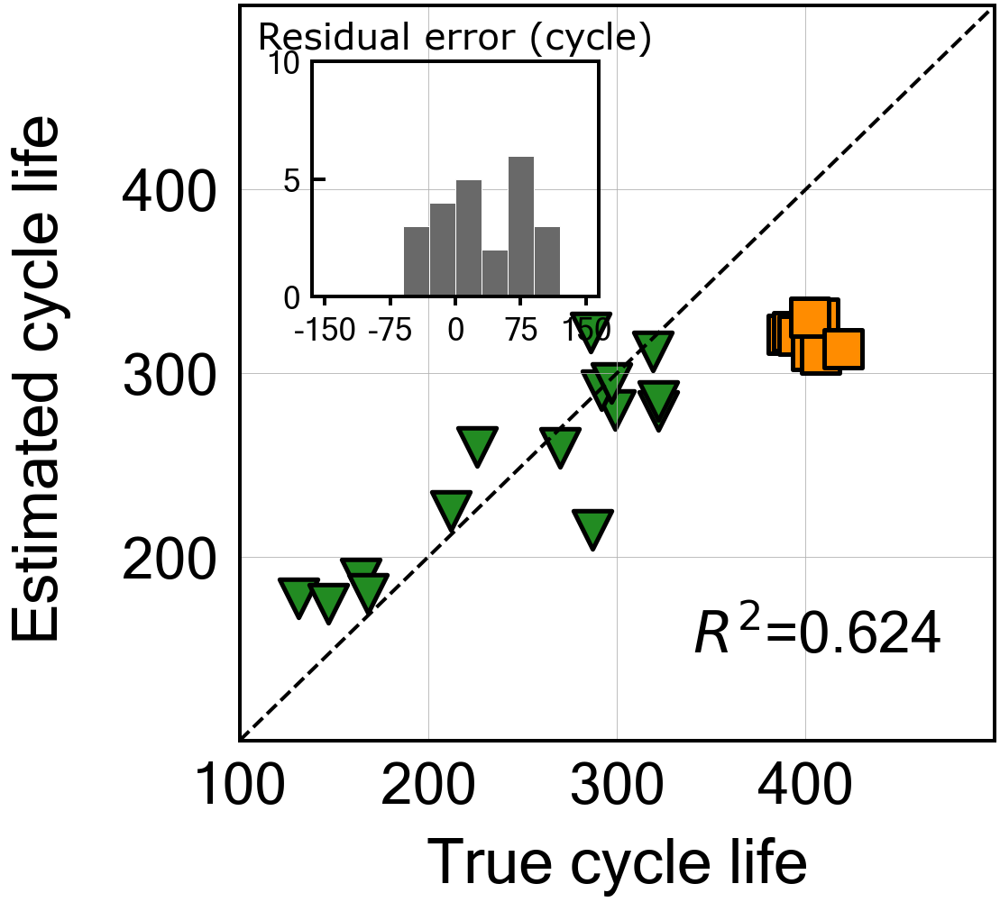


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -115.87517427713883
Cycle no: 62
Coefficient:
T_V('Charge', 'Variance', '62') : -0.0
T_V('Charge', 'Mean', '62') : 0.10492245157630098
T_V('Charge', 'Skewness', '62') : 0.1423106901540986
dTdV('Charge', 'Maximum', '62') : -0.0
dTdV('Charge', 'Mean', '62') : -0.0
dTdV('Charge', 'Kurtosis', '62') : -0.0

Intercept: 0.6202443280977306
MAE_all: 50.7
MAPE_all: 16.4 %
RMSE_all: 63.4
RMSPE_all: 19.8 %
MAE_train: 26.7
MAPE_train: 12.4 %
RMSE_train: 33.6
RMSPE_train: 17.1 %
MAE_test: 95.8
MAPE_test: 23.7 %
RMSE_test: 97.1
RMSPE_test: 24.0 %
R2 normal-scale scores
All data r2-score: 0.508
Train data r2-score: 0.741
Test data r2-score: -115.875

Normal-scale scores
All data score: 0.508
Train data score: 0.741
Test data score: -115.875


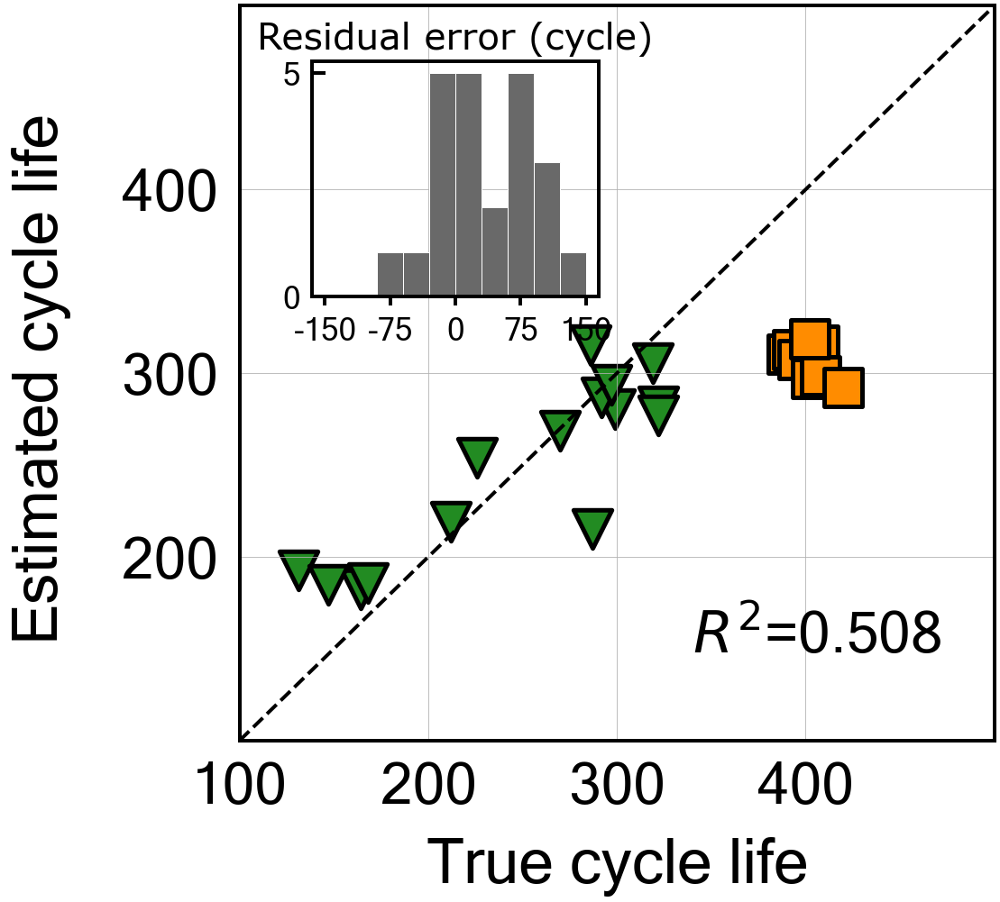


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -83.01562457270649
Cycle no: 63
Coefficient:
T_V('Charge', 'Variance', '63') : -0.05414344679309667
T_V('Charge', 'Mean', '63') : 0.1259123538501415
T_V('Charge', 'Skewness', '63') : 0.19761485069727902
dTdV('Charge', 'Maximum', '63') : 0.06938842219089045
dTdV('Charge', 'Mean', '63') : -0.05841294551683784
dTdV('Charge', 'Kurtosis', '63') : 0.0673267058972704

Intercept: 0.6202443280977316
MAE_all: 39.8
MAPE_all: 12.7 %
RMSE_all: 53.2
RMSPE_all: 15.9 %
MAE_train: 20.9
MAPE_train: 9.5 %
RMSE_train: 26.9
RMSPE_train: 12.8 %
MAE_test: 75.4
MAPE_test: 18.8 %
RMSE_test: 82.4
RMSPE_test: 20.6 %
R2 normal-scale scores
All data r2-score: 0.654
Train data r2-score: 0.834
Test data r2-score: -83.016

Normal-scale scores
All data score: 0.654
Train data score: 0.834
Test data score: -83.016


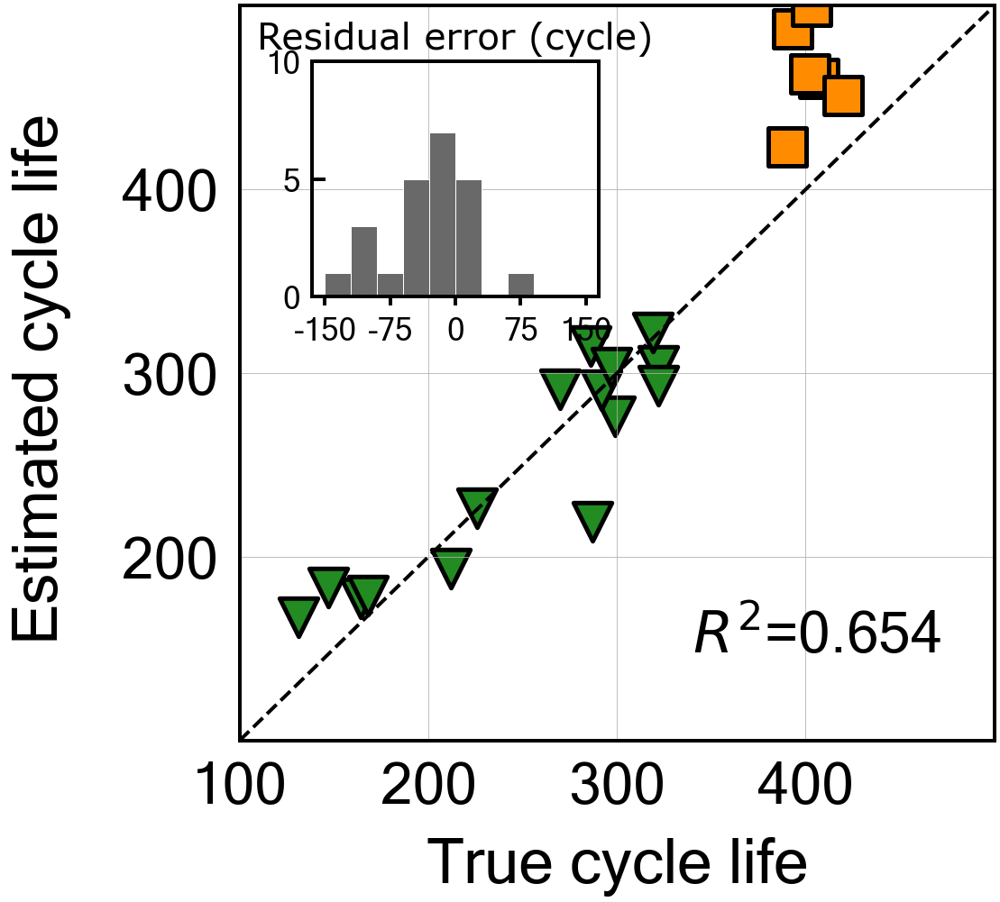


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -10.406382354741915
Cycle no: 64
Coefficient:
T_V('Charge', 'Variance', '64') : -0.02626000227952242
T_V('Charge', 'Mean', '64') : 0.14815710713140923
T_V('Charge', 'Skewness', '64') : 0.16203735340772468
dTdV('Charge', 'Maximum', '64') : 0.017708543392089392
dTdV('Charge', 'Mean', '64') : -0.0574167237910954
dTdV('Charge', 'Kurtosis', '64') : -0.04862339635046877

Intercept: 0.6202443280977317
MAE_all: 22.2
MAPE_all: 8.3 %
RMSE_all: 28.9
RMSPE_all: 11.4 %
MAE_train: 19.7
MAPE_train: 9.1 %
RMSE_train: 28.1
RMSPE_train: 13.0 %
MAE_test: 26.8
MAPE_test: 6.7 %
RMSE_test: 30.3
RMSPE_test: 7.5 %
R2 normal-scale scores
All data r2-score: 0.898
Train data r2-score: 0.819
Test data r2-score: -10.406

Normal-scale scores
All data score: 0.898
Train data score: 0.819
Test data score: -10.406


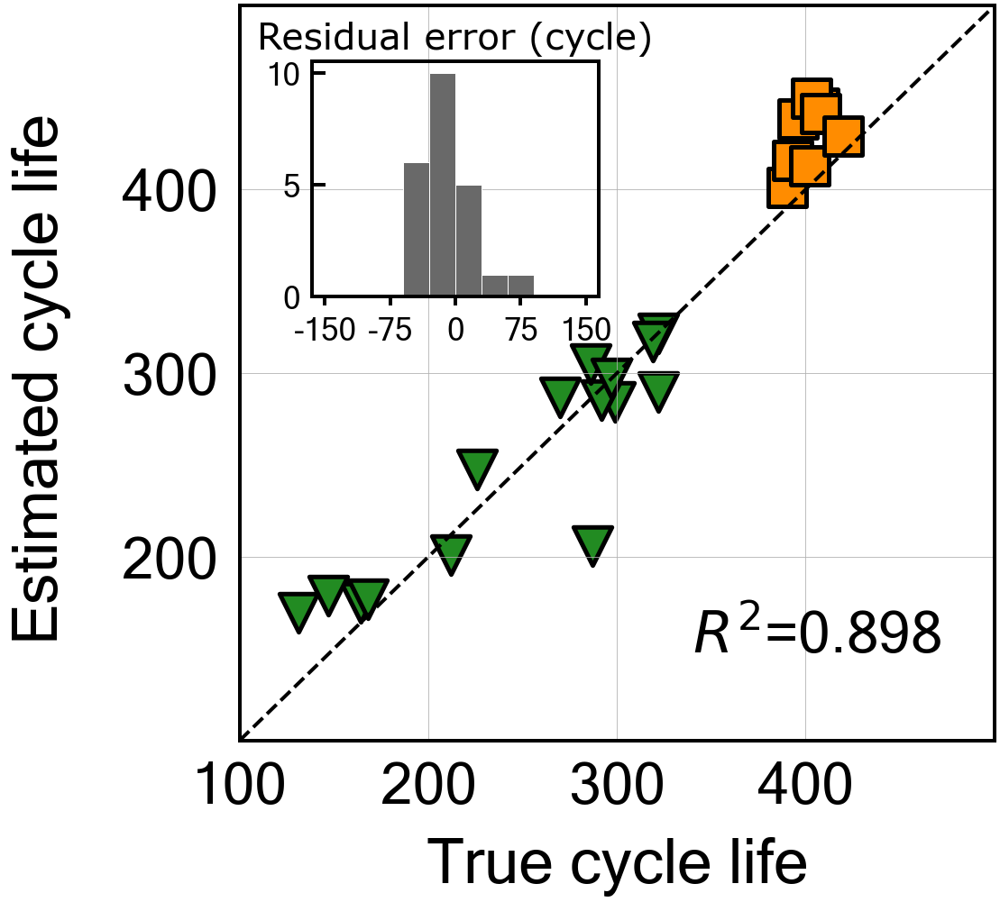


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -20.27263177449839
Cycle no: 65
Coefficient:
T_V('Charge', 'Variance', '65') : -0.04333785488182905
T_V('Charge', 'Mean', '65') : 0.13461038910718257
T_V('Charge', 'Skewness', '65') : 0.131673368828241
dTdV('Charge', 'Maximum', '65') : 0.10756846991175678
dTdV('Charge', 'Mean', '65') : -0.07354630762614908
dTdV('Charge', 'Kurtosis', '65') : -0.025255839465138746

Intercept: 0.6202443280977319
MAE_all: 25.4
MAPE_all: 9.1 %
RMSE_all: 32.5
RMSPE_all: 12.5 %
MAE_train: 19.7
MAPE_train: 9.2 %
RMSE_train: 26.4
RMSPE_train: 13.6 %
MAE_test: 36.2
MAPE_test: 8.9 %
RMSE_test: 41.4
RMSPE_test: 10.2 %
R2 normal-scale scores
All data r2-score: 0.871
Train data r2-score: 0.840
Test data r2-score: -20.273

Normal-scale scores
All data score: 0.871
Train data score: 0.840
Test data score: -20.273


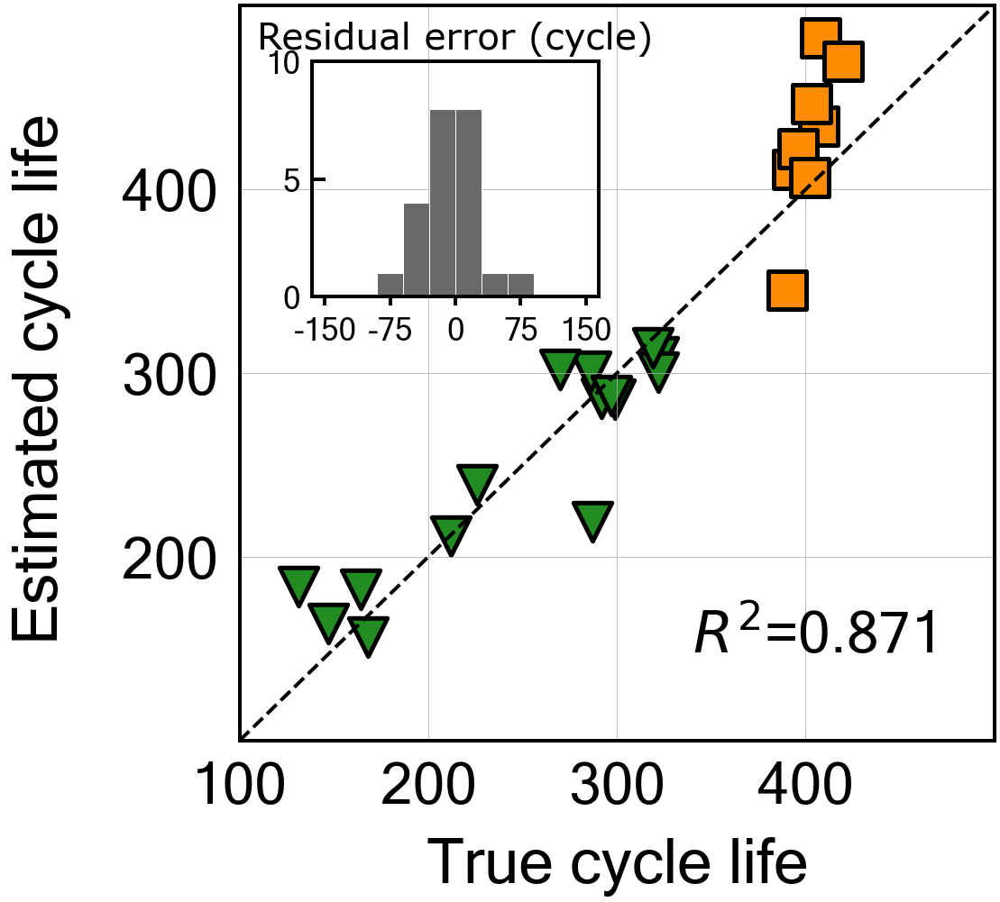


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -208.90711912845887
Cycle no: 66
Coefficient:
T_V('Charge', 'Variance', '66') : -0.0
T_V('Charge', 'Mean', '66') : 0.14244646568248354
T_V('Charge', 'Skewness', '66') : 0.08277646702198571
dTdV('Charge', 'Maximum', '66') : -0.0
dTdV('Charge', 'Mean', '66') : -0.0
dTdV('Charge', 'Kurtosis', '66') : -0.0

Intercept: 0.6202443280977321
MAE_all: 64.3
MAPE_all: 20.3 %
RMSE_all: 82.5
RMSPE_all: 24.9 %
MAE_train: 29.7
MAPE_train: 14.1 %
RMSE_train: 37.3
RMSPE_train: 20.0 %
MAE_test: 129.0
MAPE_test: 32.0 %
RMSE_test: 130.2
RMSPE_test: 32.2 %
R2 normal-scale scores
All data r2-score: 0.168
Train data r2-score: 0.682
Test data r2-score: -208.907

Normal-scale scores
All data score: 0.168
Train data score: 0.682
Test data score: -208.907


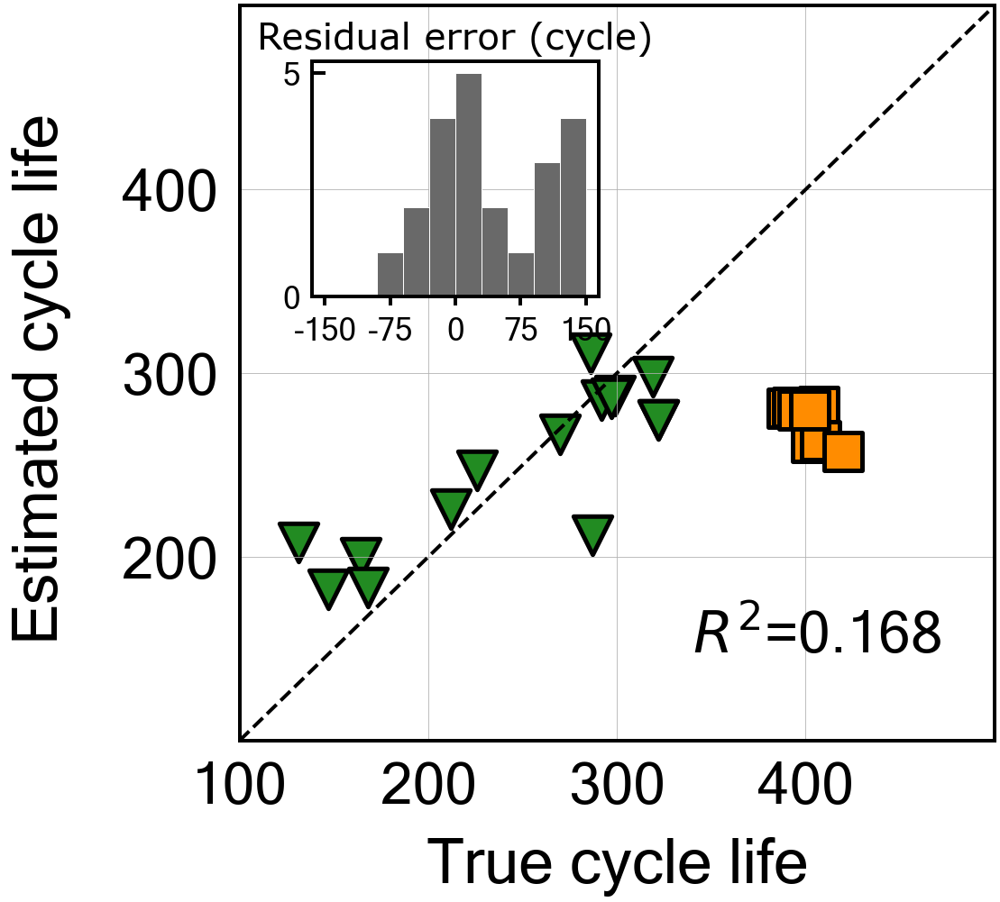


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -102.0076704287145
Cycle no: 67
Coefficient:
T_V('Charge', 'Variance', '67') : -0.008059260846812955
T_V('Charge', 'Mean', '67') : 0.13955628256223837
T_V('Charge', 'Skewness', '67') : 0.12782301333350993
dTdV('Charge', 'Maximum', '67') : -0.006047594715175009
dTdV('Charge', 'Mean', '67') : -0.004288945301153534
dTdV('Charge', 'Kurtosis', '67') : 0.03269057274103582

Intercept: 0.6202443280977301
MAE_all: 46.9
MAPE_all: 15.1 %
RMSE_all: 59.6
RMSPE_all: 18.9 %
MAE_train: 24.2
MAPE_train: 11.3 %
RMSE_train: 31.9
RMSPE_train: 16.6 %
MAE_test: 89.5
MAPE_test: 22.2 %
RMSE_test: 91.2
RMSPE_test: 22.6 %
R2 normal-scale scores
All data r2-score: 0.565
Train data r2-score: 0.767
Test data r2-score: -102.008

Normal-scale scores
All data score: 0.565
Train data score: 0.767
Test data score: -102.008


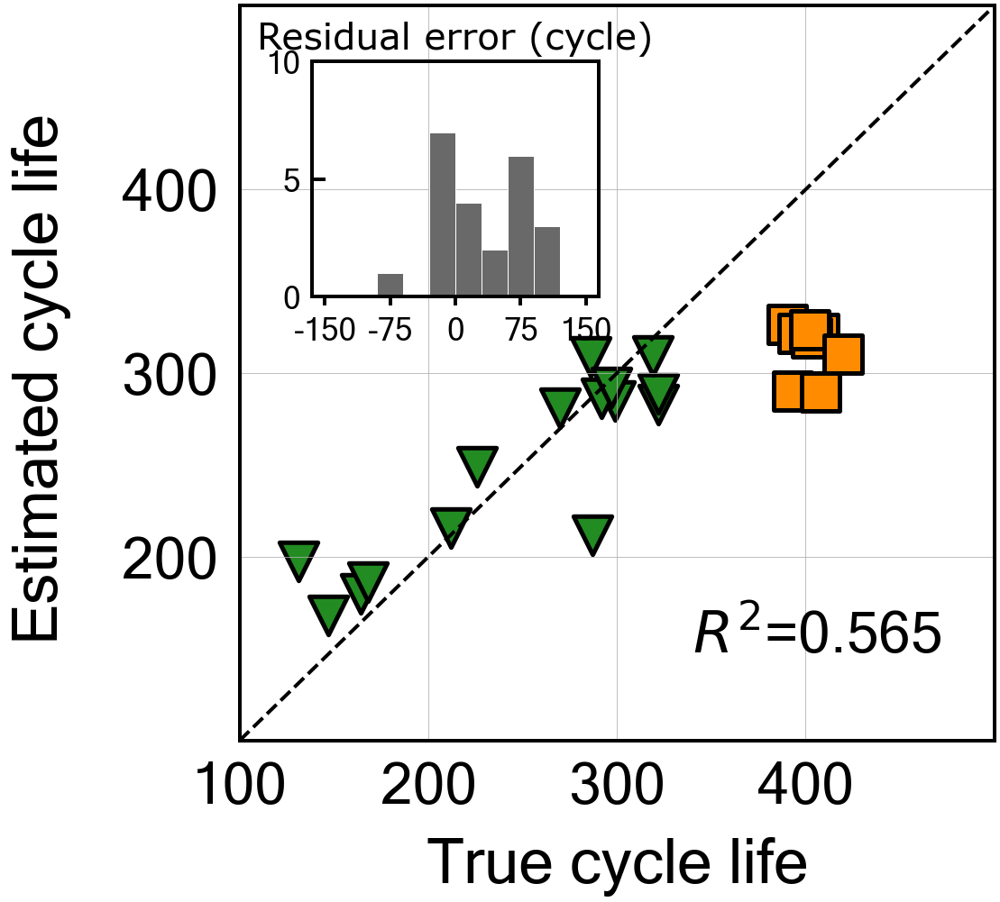


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -30.605993196978893
Cycle no: 68
Coefficient:
T_V('Charge', 'Variance', '68') : 0.1559607850447693
T_V('Charge', 'Mean', '68') : 0.19571561553648426
T_V('Charge', 'Skewness', '68') : 0.21436390079062048
dTdV('Charge', 'Maximum', '68') : -0.046249965780826116
dTdV('Charge', 'Mean', '68') : -0.22296629423065567
dTdV('Charge', 'Kurtosis', '68') : -0.10859066307524197

Intercept: 0.6202443280977312
MAE_all: 22.0
MAPE_all: 7.7 %
RMSE_all: 34.4
RMSPE_all: 12.3 %
MAE_train: 13.9
MAPE_train: 6.9 %
RMSE_train: 21.4
RMSPE_train: 12.2 %
MAE_test: 37.1
MAPE_test: 9.2 %
RMSE_test: 50.5
RMSPE_test: 12.5 %
R2 normal-scale scores
All data r2-score: 0.855
Train data r2-score: 0.895
Test data r2-score: -30.606

Normal-scale scores
All data score: 0.855
Train data score: 0.895
Test data score: -30.606


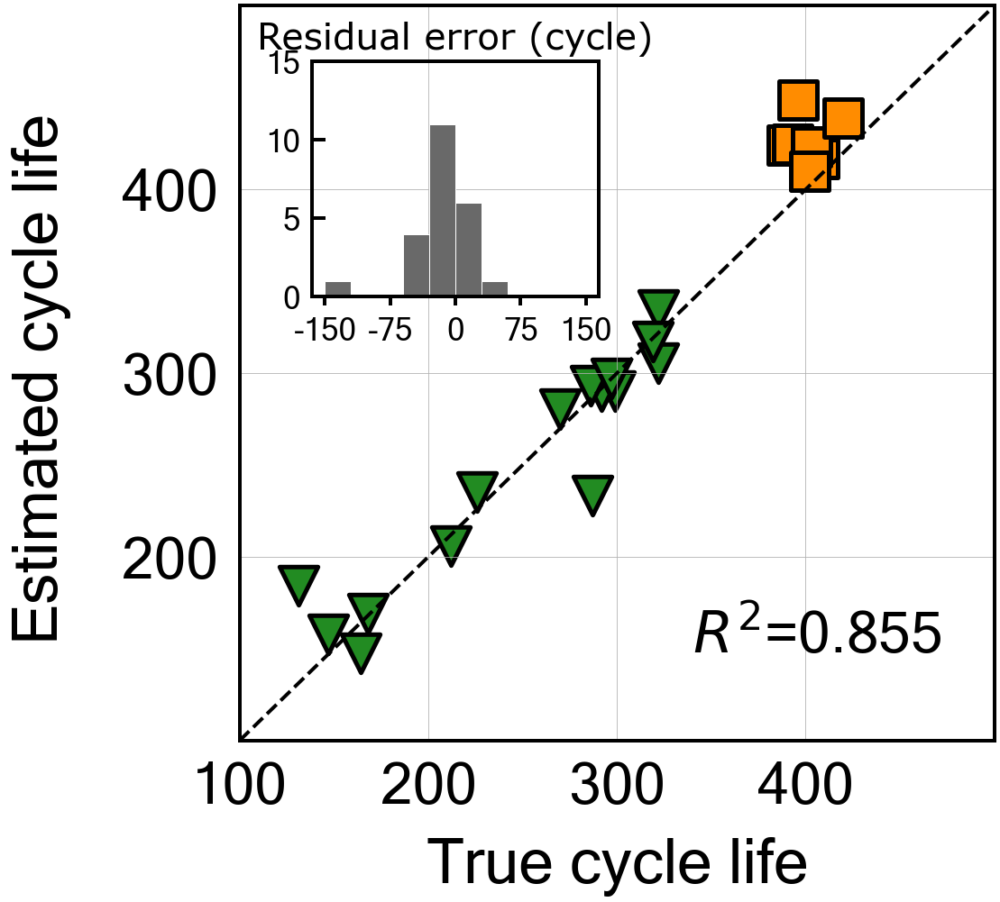


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -71.1834371379251
Cycle no: 69
Coefficient:
T_V('Charge', 'Variance', '69') : -0.022732959619254714
T_V('Charge', 'Mean', '69') : 0.11914227154558464
T_V('Charge', 'Skewness', '69') : 0.13846533219503745
dTdV('Charge', 'Maximum', '69') : 0.061694544153662385
dTdV('Charge', 'Mean', '69') : -0.03211727343012292
dTdV('Charge', 'Kurtosis', '69') : -0.014465697169197595

Intercept: 0.6202443280977317
MAE_all: 39.4
MAPE_all: 12.7 %
RMSE_all: 50.9
RMSPE_all: 16.1 %
MAE_train: 22.3
MAPE_train: 10.0 %
RMSE_train: 29.3
RMSPE_train: 14.3 %
MAE_test: 71.5
MAPE_test: 17.8 %
RMSE_test: 76.3
RMSPE_test: 18.9 %
R2 normal-scale scores
All data r2-score: 0.684
Train data r2-score: 0.803
Test data r2-score: -71.183

Normal-scale scores
All data score: 0.684
Train data score: 0.803
Test data score: -71.183


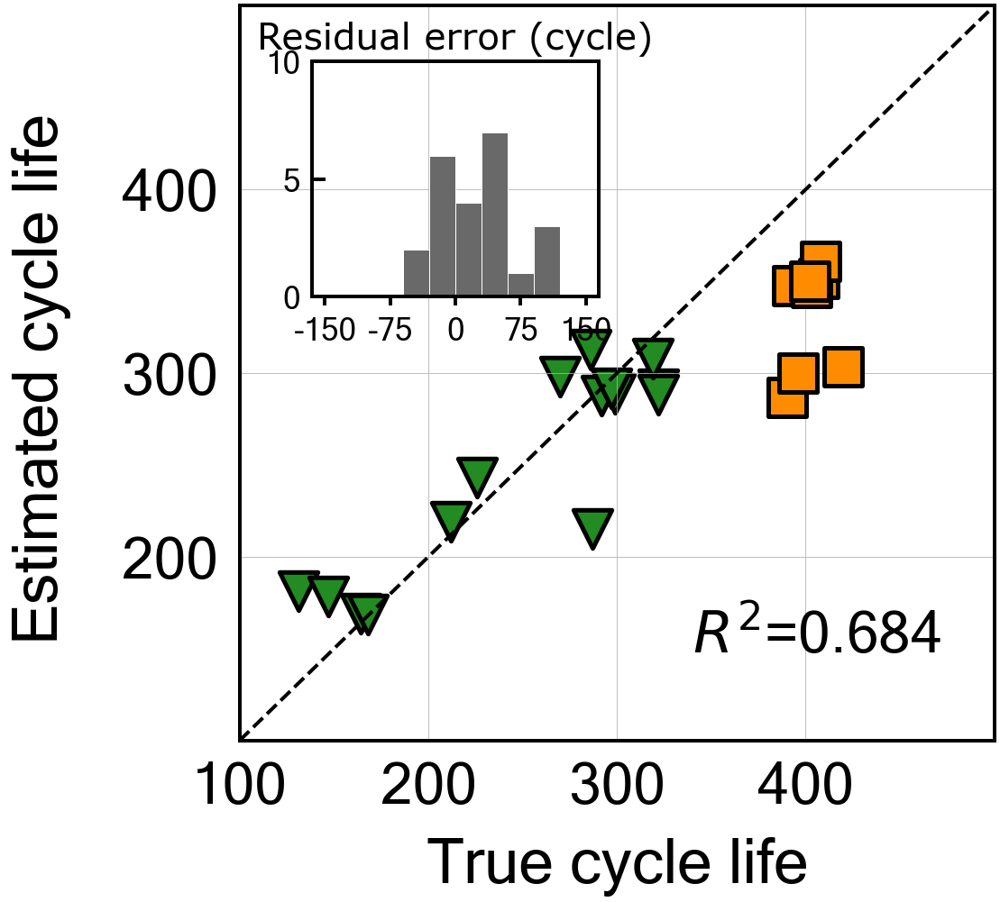


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -1.2507574668761352
Cycle no: 70
Coefficient:
T_V('Charge', 'Variance', '70') : -0.05265223068909878
T_V('Charge', 'Mean', '70') : 0.1432394666393501
T_V('Charge', 'Skewness', '70') : 0.15773138651324412
dTdV('Charge', 'Maximum', '70') : 0.02225473155309186
dTdV('Charge', 'Mean', '70') : -0.00401944677864306
dTdV('Charge', 'Kurtosis', '70') : 0.004637273472735147

Intercept: 0.6202443280977307
MAE_all: 18.2
MAPE_all: 7.5 %
RMSE_all: 25.3
RMSPE_all: 11.3 %
MAE_train: 22.2
MAPE_train: 10.0 %
RMSE_train: 29.8
RMSPE_train: 13.8 %
MAE_test: 10.9
MAPE_test: 2.7 %
RMSE_test: 13.5
RMSPE_test: 3.3 %
R2 normal-scale scores
All data r2-score: 0.921
Train data r2-score: 0.797
Test data r2-score: -1.251

Normal-scale scores
All data score: 0.921
Train data score: 0.797
Test data score: -1.251


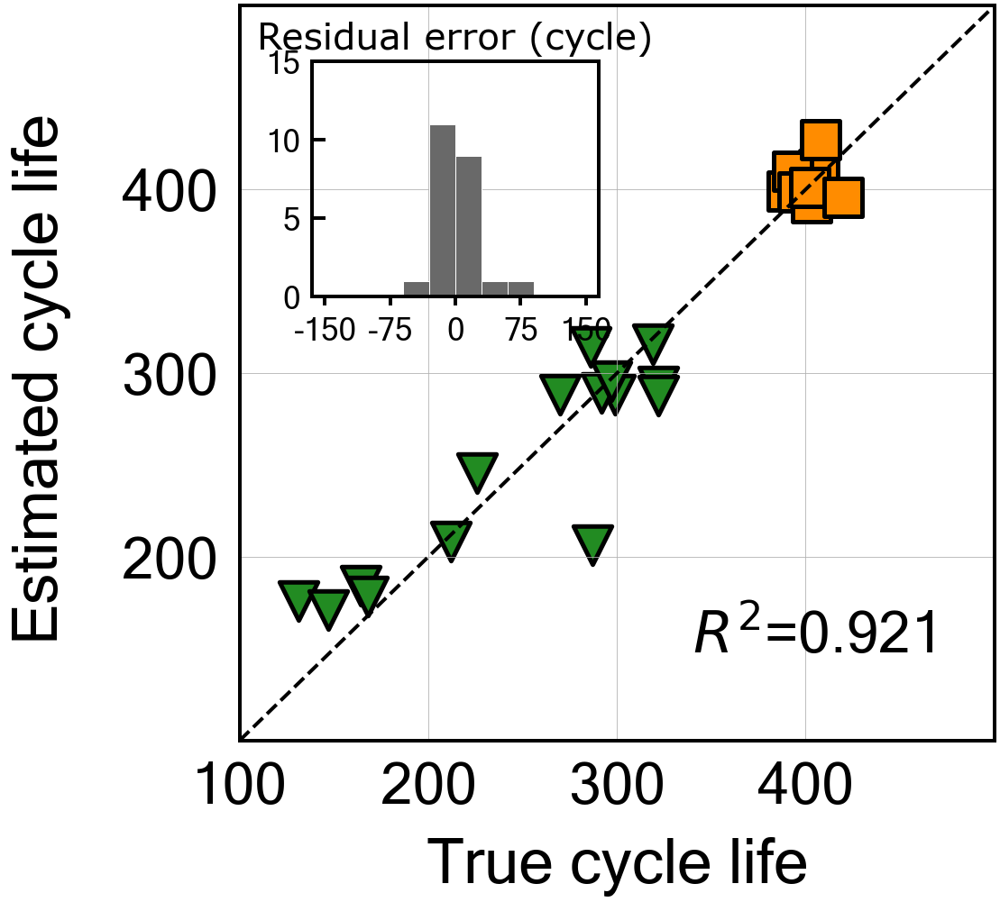


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -178.97693602510597
Cycle no: 71
Coefficient:
T_V('Charge', 'Variance', '71') : -0.07072053677253143
T_V('Charge', 'Mean', '71') : 0.14018799368397472
T_V('Charge', 'Skewness', '71') : 0.19900724559047045
dTdV('Charge', 'Maximum', '71') : -0.011304020384107466
dTdV('Charge', 'Mean', '71') : -0.03169533614054808
dTdV('Charge', 'Kurtosis', '71') : -0.09908985605588541

Intercept: 0.6202443280977328
MAE_all: 52.2
MAPE_all: 14.8 %
RMSE_all: 73.4
RMSPE_all: 19.2 %
MAE_train: 17.2
MAPE_train: 7.1 %
RMSE_train: 22.5
RMSPE_train: 9.4 %
MAE_test: 117.8
MAPE_test: 29.2 %
RMSE_test: 120.5
RMSPE_test: 29.9 %
R2 normal-scale scores
All data r2-score: 0.342
Train data r2-score: 0.884
Test data r2-score: -178.977

Normal-scale scores
All data score: 0.342
Train data score: 0.884
Test data score: -178.977


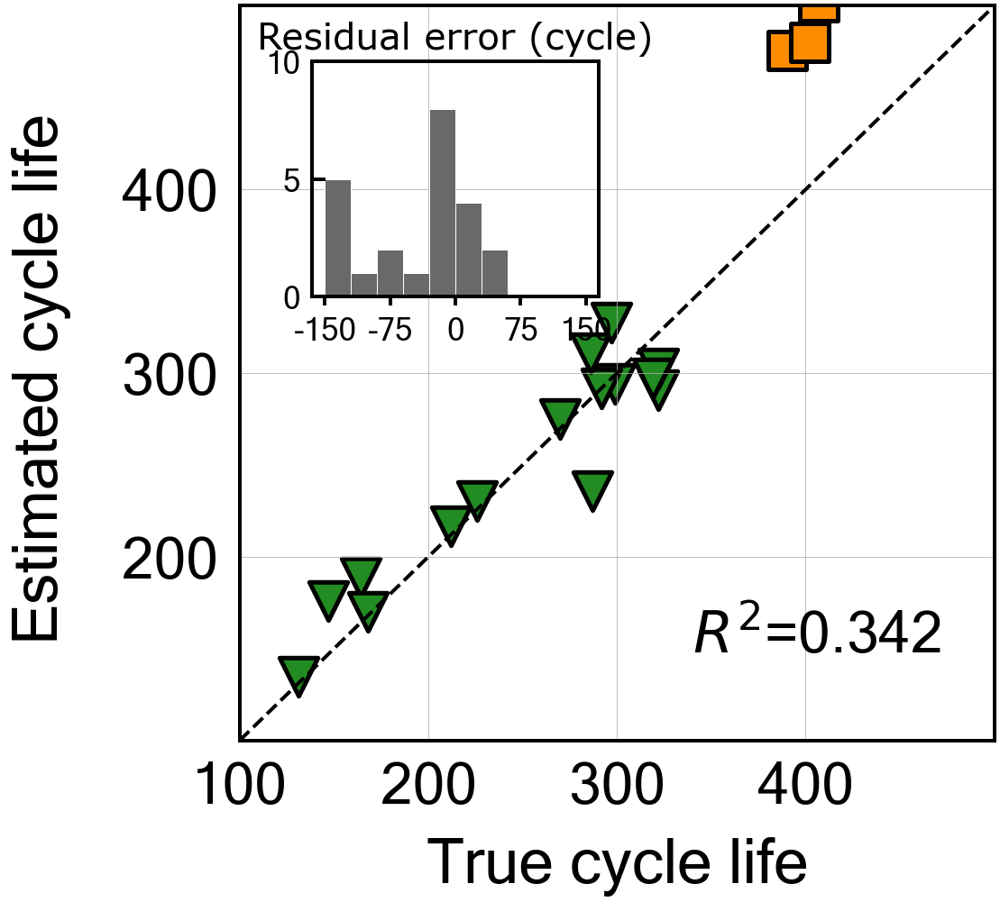


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -112.6729304114781
Cycle no: 72
Coefficient:
T_V('Charge', 'Variance', '72') : -0.0
T_V('Charge', 'Mean', '72') : 0.09233169433002034
T_V('Charge', 'Skewness', '72') : 0.13865070225454884
dTdV('Charge', 'Maximum', '72') : -0.0
dTdV('Charge', 'Mean', '72') : -0.0
dTdV('Charge', 'Kurtosis', '72') : -0.03644033668333626

Intercept: 0.6202443280977307
MAE_all: 49.8
MAPE_all: 16.2 %
RMSE_all: 62.9
RMSPE_all: 20.0 %
MAE_train: 26.0
MAPE_train: 12.3 %
RMSE_train: 34.3
RMSPE_train: 17.7 %
MAE_test: 94.5
MAPE_test: 23.4 %
RMSE_test: 95.8
RMSPE_test: 23.7 %
R2 normal-scale scores
All data r2-score: 0.516
Train data r2-score: 0.731
Test data r2-score: -112.673

Normal-scale scores
All data score: 0.516
Train data score: 0.731
Test data score: -112.673


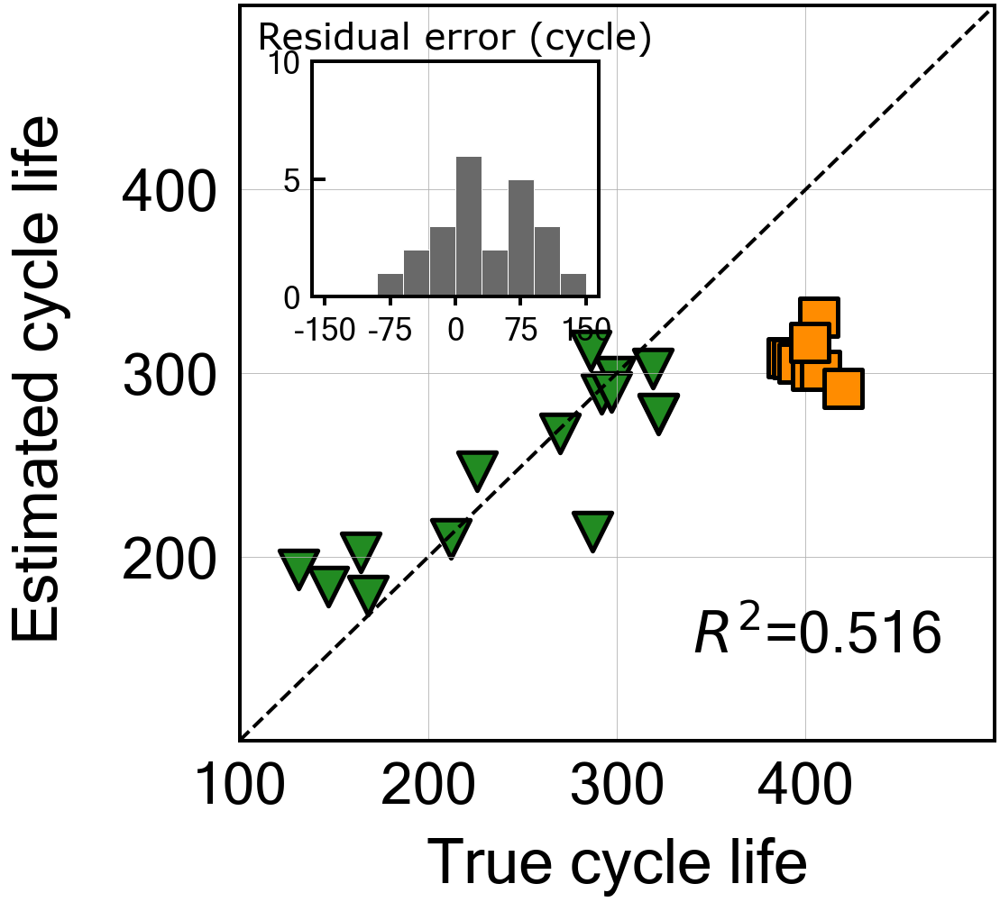


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -55.474166534628736
Cycle no: 73
Coefficient:
T_V('Charge', 'Variance', '73') : -0.0
T_V('Charge', 'Mean', '73') : 0.09510330055452076
T_V('Charge', 'Skewness', '73') : 0.16284665802327272
dTdV('Charge', 'Maximum', '73') : 0.0
dTdV('Charge', 'Mean', '73') : -0.007516843301905204
dTdV('Charge', 'Kurtosis', '73') : -0.0044434295405866315

Intercept: 0.6202443280977317
MAE_all: 40.8
MAPE_all: 13.8 %
RMSE_all: 48.1
RMSPE_all: 16.3 %
MAE_train: 27.1
MAPE_train: 12.3 %
RMSE_train: 33.4
RMSPE_train: 16.1 %
MAE_test: 66.5
MAPE_test: 16.5 %
RMSE_test: 67.5
RMSPE_test: 16.7 %
R2 normal-scale scores
All data r2-score: 0.717
Train data r2-score: 0.744
Test data r2-score: -55.474

Normal-scale scores
All data score: 0.717
Train data score: 0.744
Test data score: -55.474


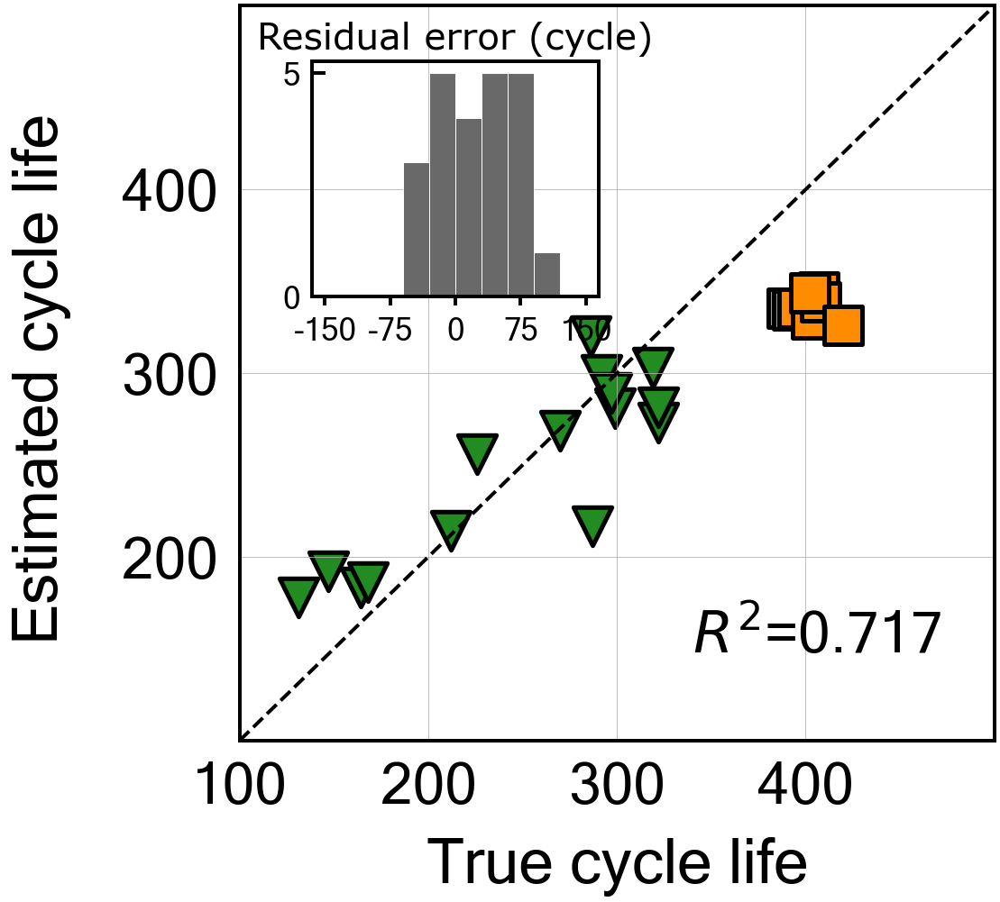


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -6.649082996210579
Cycle no: 74
Coefficient:
T_V('Charge', 'Variance', '74') : -0.005622547809163495
T_V('Charge', 'Mean', '74') : 0.0
T_V('Charge', 'Skewness', '74') : 0.3165073335657304
dTdV('Charge', 'Maximum', '74') : -0.0
dTdV('Charge', 'Mean', '74') : -0.0
dTdV('Charge', 'Kurtosis', '74') : 0.08954687502251141

Intercept: 0.6202443280977311
MAE_all: 20.5
MAPE_all: 7.4 %
RMSE_all: 24.9
RMSPE_all: 9.1 %
MAE_train: 21.9
MAPE_train: 9.0 %
RMSE_train: 24.9
RMSPE_train: 10.3 %
MAE_test: 17.8
MAPE_test: 4.4 %
RMSE_test: 24.9
RMSPE_test: 6.2 %
R2 normal-scale scores
All data r2-score: 0.924
Train data r2-score: 0.858
Test data r2-score: -6.649

Normal-scale scores
All data score: 0.924
Train data score: 0.858
Test data score: -6.649


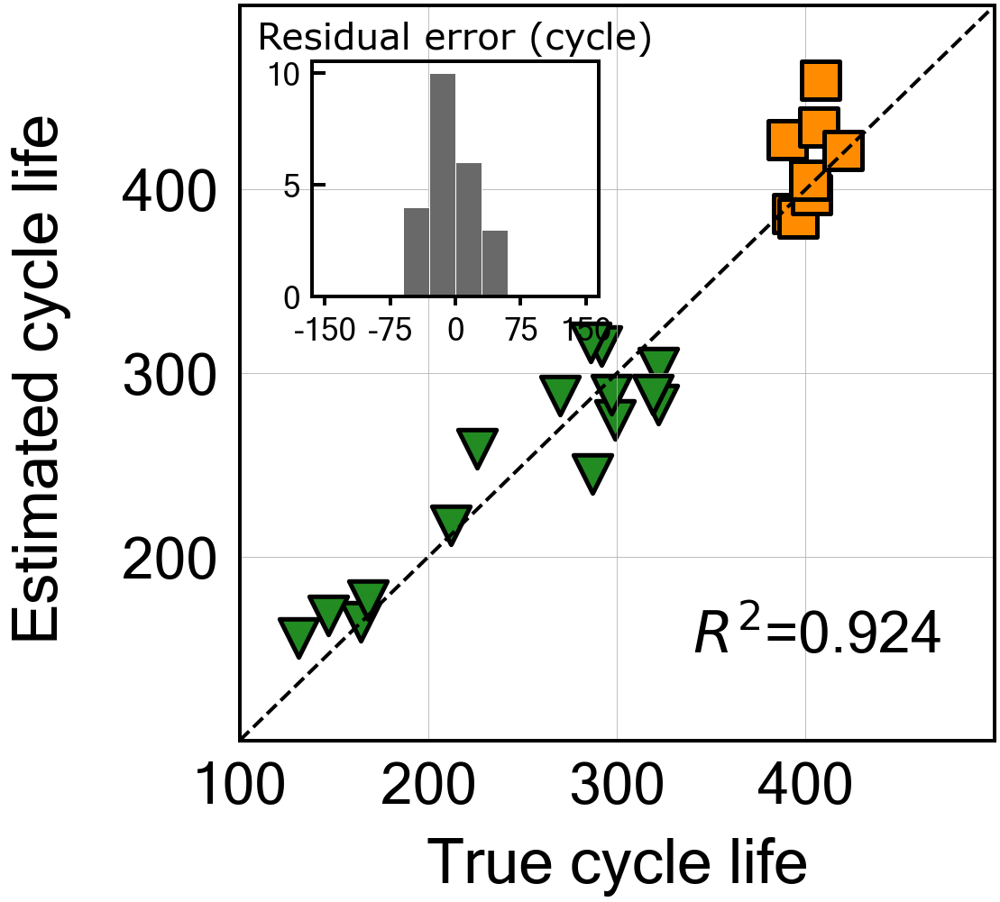


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -41.48459405666807
Cycle no: 75
Coefficient:
T_V('Charge', 'Variance', '75') : -0.0
T_V('Charge', 'Mean', '75') : 0.03188323089838849
T_V('Charge', 'Skewness', '75') : 0.2164546452952798
dTdV('Charge', 'Maximum', '75') : 0.0
dTdV('Charge', 'Mean', '75') : -0.0
dTdV('Charge', 'Kurtosis', '75') : -0.0

Intercept: 0.6202443280977314
MAE_all: 38.2
MAPE_all: 13.1 %
RMSE_all: 43.9
RMSPE_all: 15.6 %
MAE_train: 27.9
MAPE_train: 12.5 %
RMSE_train: 33.5
RMSPE_train: 16.2 %
MAE_test: 57.6
MAPE_test: 14.3 %
RMSE_test: 58.6
RMSPE_test: 14.5 %
R2 normal-scale scores
All data r2-score: 0.765
Train data r2-score: 0.743
Test data r2-score: -41.485

Normal-scale scores
All data score: 0.765
Train data score: 0.743
Test data score: -41.485


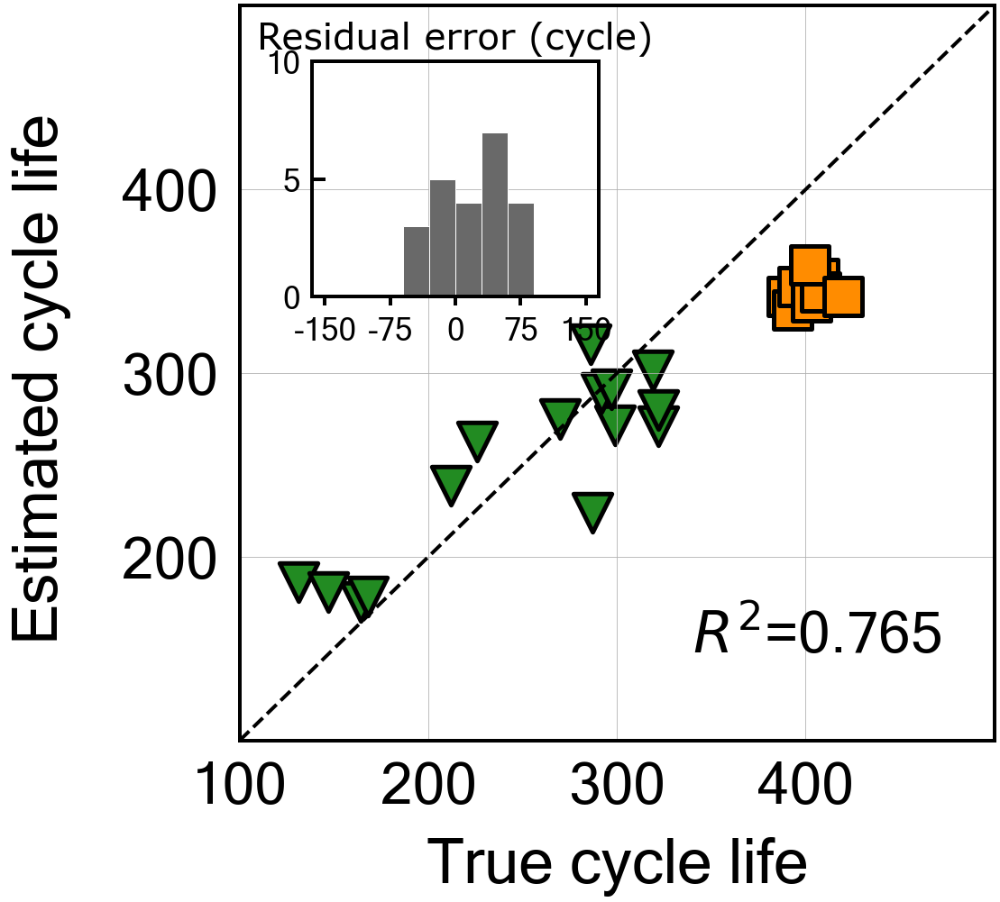


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -34.441594627639105
Cycle no: 76
Coefficient:
T_V('Charge', 'Variance', '76') : 0.0
T_V('Charge', 'Mean', '76') : 0.0947838889129207
T_V('Charge', 'Skewness', '76') : 0.20134847185106713
dTdV('Charge', 'Maximum', '76') : -0.03715825800315181
dTdV('Charge', 'Mean', '76') : 0.0
dTdV('Charge', 'Kurtosis', '76') : -0.08189905685226812

Intercept: 0.6202443280977314
MAE_all: 26.5
MAPE_all: 8.9 %
RMSE_all: 36.7
RMSPE_all: 12.0 %
MAE_train: 16.8
MAPE_train: 7.8 %
RMSE_train: 23.3
RMSPE_train: 11.4 %
MAE_test: 44.7
MAPE_test: 11.0 %
RMSE_test: 53.5
RMSPE_test: 13.0 %
R2 normal-scale scores
All data r2-score: 0.835
Train data r2-score: 0.876
Test data r2-score: -34.442

Normal-scale scores
All data score: 0.835
Train data score: 0.876
Test data score: -34.442


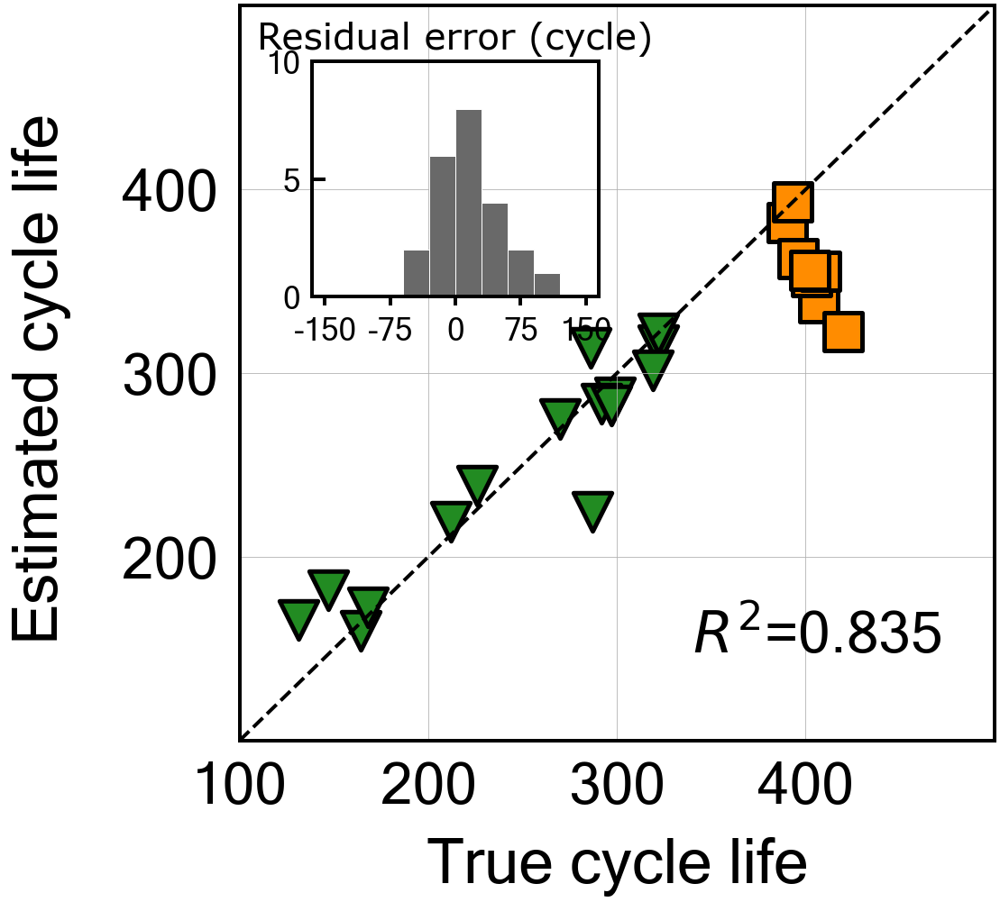

Found -inf in dT/dV ('Discharge', 'Maximum', '77')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -57.09022164192697
Cycle no: 77
Coefficient:
T_V('Charge', 'Variance', '77') : -0.01521383748219844
T_V('Charge', 'Mean', '77') : 0.09793346098877277
T_V('Charge', 'Skewness', '77') : 0.14752641393276106
dTdV('Charge', 'Maximum', '77') : -0.0
dTdV('Charge', 'Mean', '77') : -0.003063374650723323
dTdV('Charge', 'Kurtosis', '77') : -0.06554308256249458

Intercept: 0.6202443280977318
MAE_all: 36.6
MAPE_all: 11.9 %
RMSE_all: 46.4
RMSPE_all: 14.8 %
MAE_train: 20.2
MAPE_train: 9.4 %
RMSE_train: 28.2
RMSPE_train: 13.6 %
MAE_test: 67.2
MAPE_test: 16.7 %
RMSE_test: 68.5
RMSPE_test: 17.0 %
R2 normal-scale scores
All data r2-score: 0.737
Train data r2-score: 0.818
Test data r2-score: -57.090

Normal-scale scores
All data score: 0.737
Train data score: 0.818
Test data score: -57.090


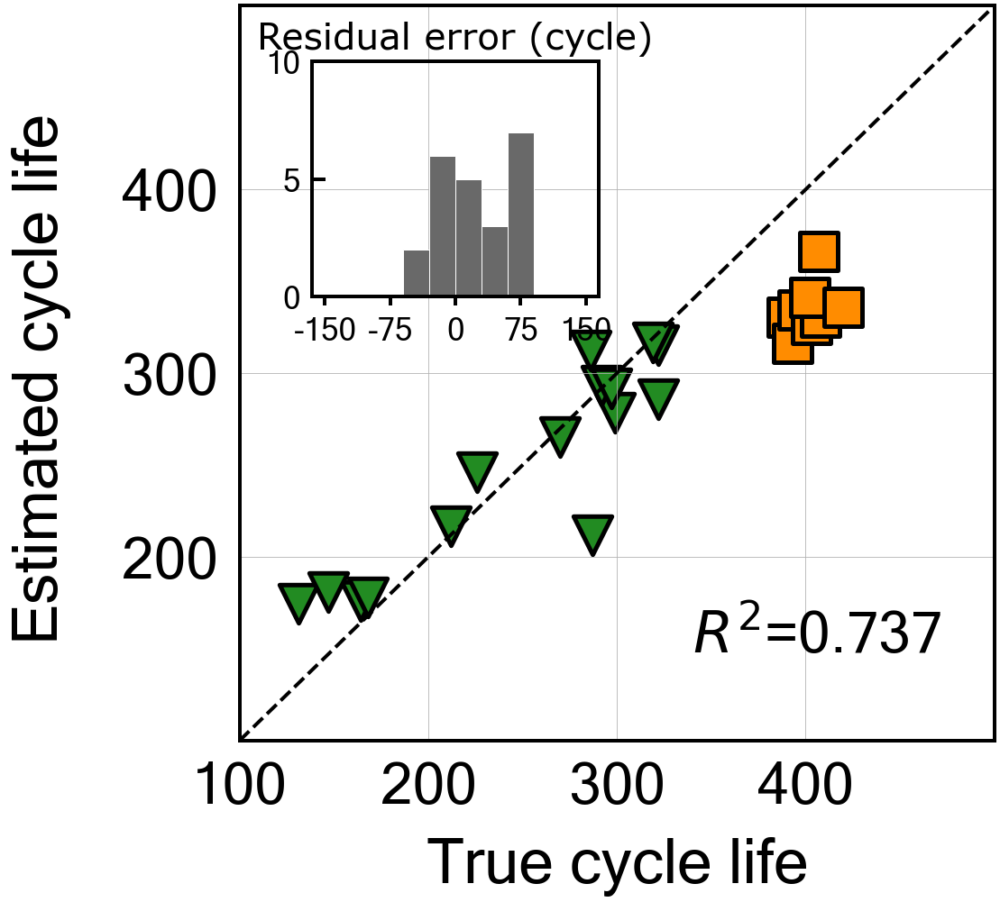


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -3.353623950347032
Cycle no: 78
Coefficient:
T_V('Charge', 'Variance', '78') : -0.03960288206412424
T_V('Charge', 'Mean', '78') : 0.1523572916275589
T_V('Charge', 'Skewness', '78') : 0.17466442195392054
dTdV('Charge', 'Maximum', '78') : -0.024692783601454958
dTdV('Charge', 'Mean', '78') : -0.0
dTdV('Charge', 'Kurtosis', '78') : -0.05049738870762338

Intercept: 0.6202443280977316
MAE_all: 16.1
MAPE_all: 6.0 %
RMSE_all: 20.9
RMSPE_all: 8.3 %
MAE_train: 17.0
MAPE_train: 7.3 %
RMSE_train: 22.0
RMSPE_train: 9.6 %
MAE_test: 14.6
MAPE_test: 3.6 %
RMSE_test: 18.7
RMSPE_test: 4.7 %
R2 normal-scale scores
All data r2-score: 0.946
Train data r2-score: 0.889
Test data r2-score: -3.354

Normal-scale scores
All data score: 0.946
Train data score: 0.889
Test data score: -3.354


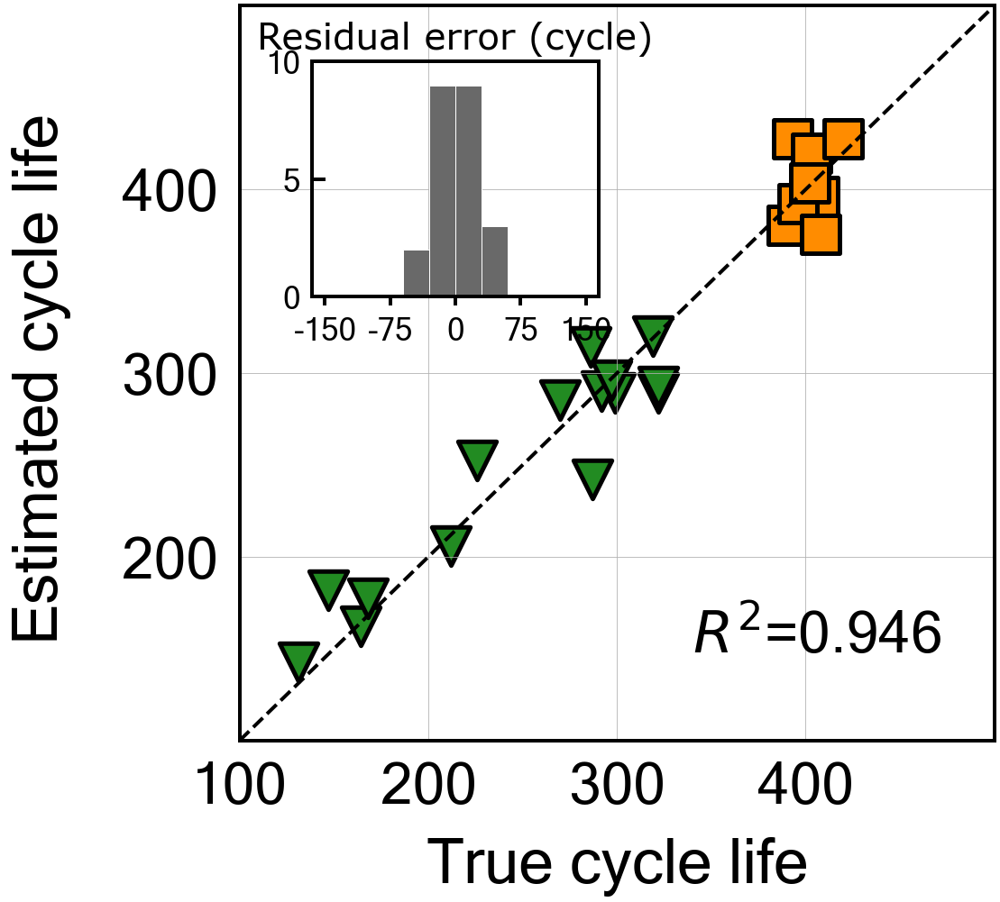


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -150.28254971151975
Cycle no: 79
Coefficient:
T_V('Charge', 'Variance', '79') : -0.0
T_V('Charge', 'Mean', '79') : 0.11601839000091171
T_V('Charge', 'Skewness', '79') : 0.13577508320121512
dTdV('Charge', 'Maximum', '79') : -0.0
dTdV('Charge', 'Mean', '79') : -0.0
dTdV('Charge', 'Kurtosis', '79') : 0.0

Intercept: 0.6202443280977316
MAE_all: 55.2
MAPE_all: 17.3 %
RMSE_all: 70.3
RMSPE_all: 20.7 %
MAE_train: 26.3
MAPE_train: 12.1 %
RMSE_train: 32.5
RMSPE_train: 16.0 %
MAE_test: 109.5
MAPE_test: 27.1 %
RMSE_test: 110.5
RMSPE_test: 27.3 %
R2 normal-scale scores
All data r2-score: 0.396
Train data r2-score: 0.758
Test data r2-score: -150.283

Normal-scale scores
All data score: 0.396
Train data score: 0.758
Test data score: -150.283


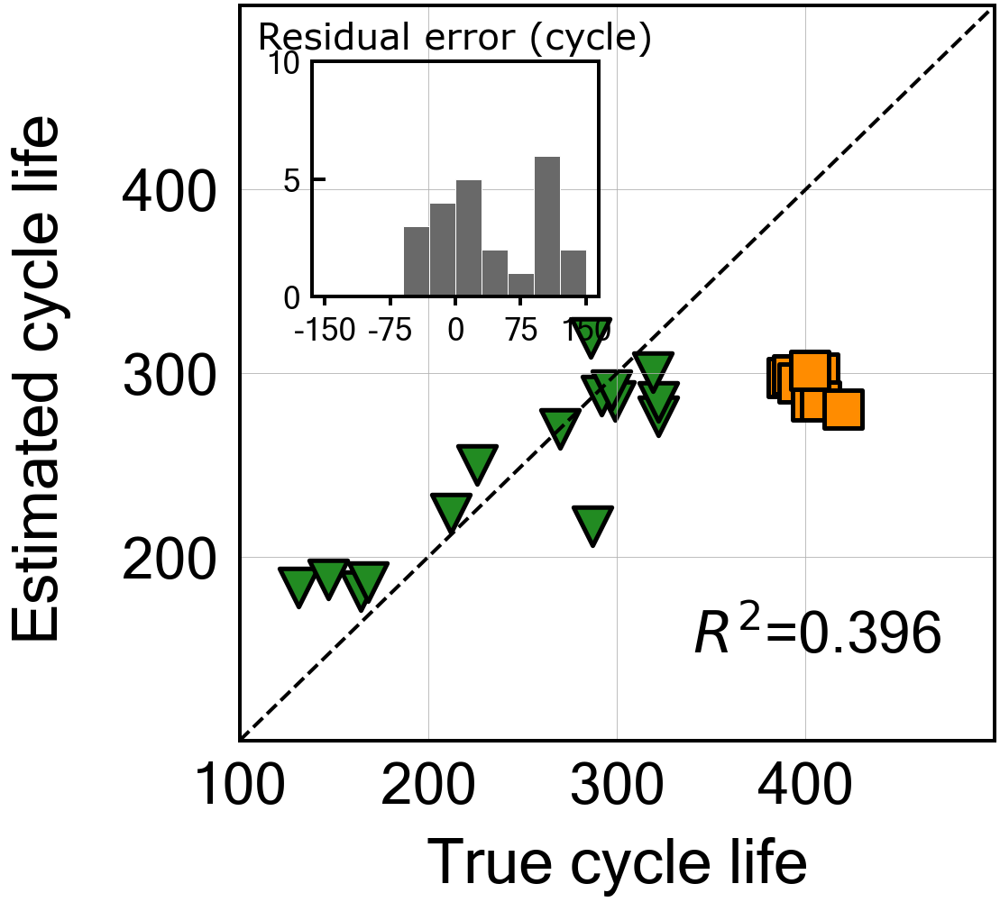


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -185.6653708964607
Cycle no: 80
Coefficient:
T_V('Charge', 'Variance', '80') : -0.28517866571697237
T_V('Charge', 'Mean', '80') : 0.0830547683134456
T_V('Charge', 'Skewness', '80') : 0.2540703824601956
dTdV('Charge', 'Maximum', '80') : 0.10618497527593584
dTdV('Charge', 'Mean', '80') : 0.15698608160210595
dTdV('Charge', 'Kurtosis', '80') : 0.048420725392990825

Intercept: 0.6202443280977329
MAE_all: 52.1
MAPE_all: 15.0 %
RMSE_all: 74.3
RMSPE_all: 19.8 %
MAE_train: 15.6
MAPE_train: 6.9 %
RMSE_train: 20.8
RMSPE_train: 10.0 %
MAE_test: 120.6
MAPE_test: 30.0 %
RMSE_test: 122.8
RMSPE_test: 30.6 %
R2 normal-scale scores
All data r2-score: 0.324
Train data r2-score: 0.900
Test data r2-score: -185.665

Normal-scale scores
All data score: 0.324
Train data score: 0.900
Test data score: -185.665


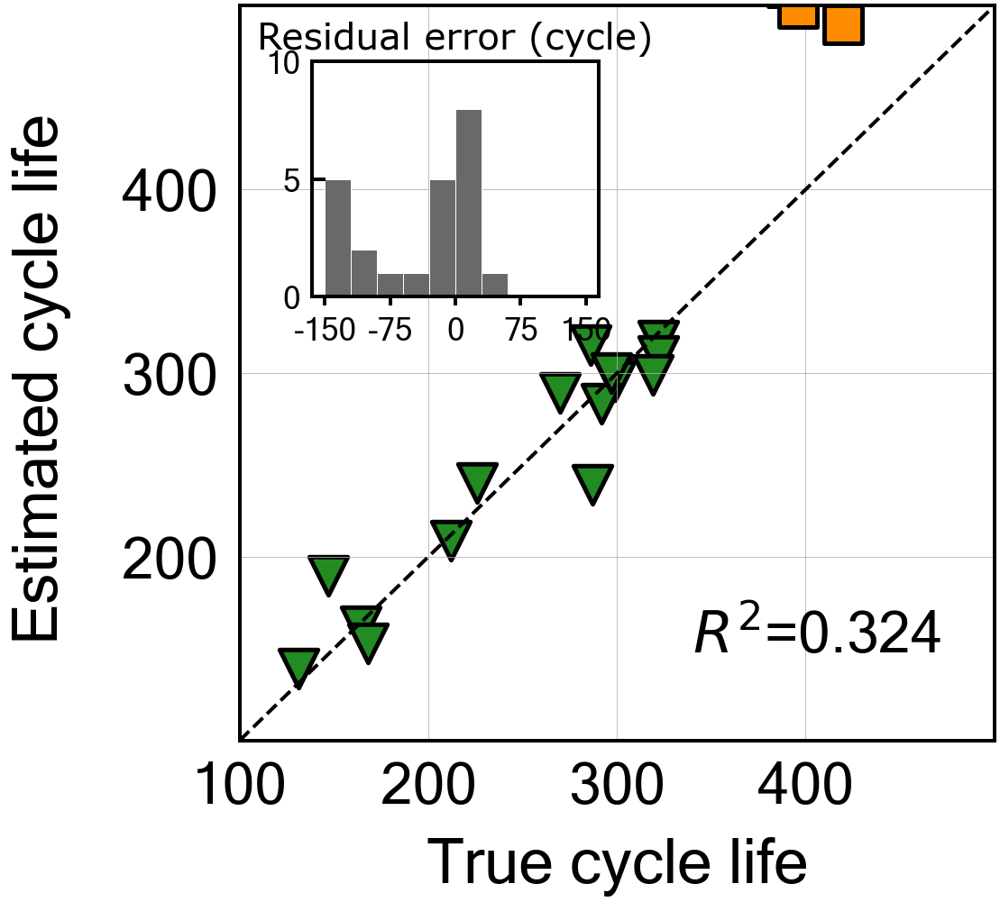


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -90.87817818011004
Cycle no: 81
Coefficient:
T_V('Charge', 'Variance', '81') : -0.0
T_V('Charge', 'Mean', '81') : 0.07661442941037866
T_V('Charge', 'Skewness', '81') : 0.17716650227531525
dTdV('Charge', 'Maximum', '81') : 0.0
dTdV('Charge', 'Mean', '81') : -0.0
dTdV('Charge', 'Kurtosis', '81') : -0.0

Intercept: 0.6202443280977312
MAE_all: 46.5
MAPE_all: 14.9 %
RMSE_all: 56.4
RMSPE_all: 17.1 %
MAE_train: 25.7
MAPE_train: 11.6 %
RMSE_train: 30.3
RMSPE_train: 14.3 %
MAE_test: 85.4
MAPE_test: 21.2 %
RMSE_test: 86.1
RMSPE_test: 21.3 %
R2 normal-scale scores
All data r2-score: 0.611
Train data r2-score: 0.790
Test data r2-score: -90.878

Normal-scale scores
All data score: 0.611
Train data score: 0.790
Test data score: -90.878


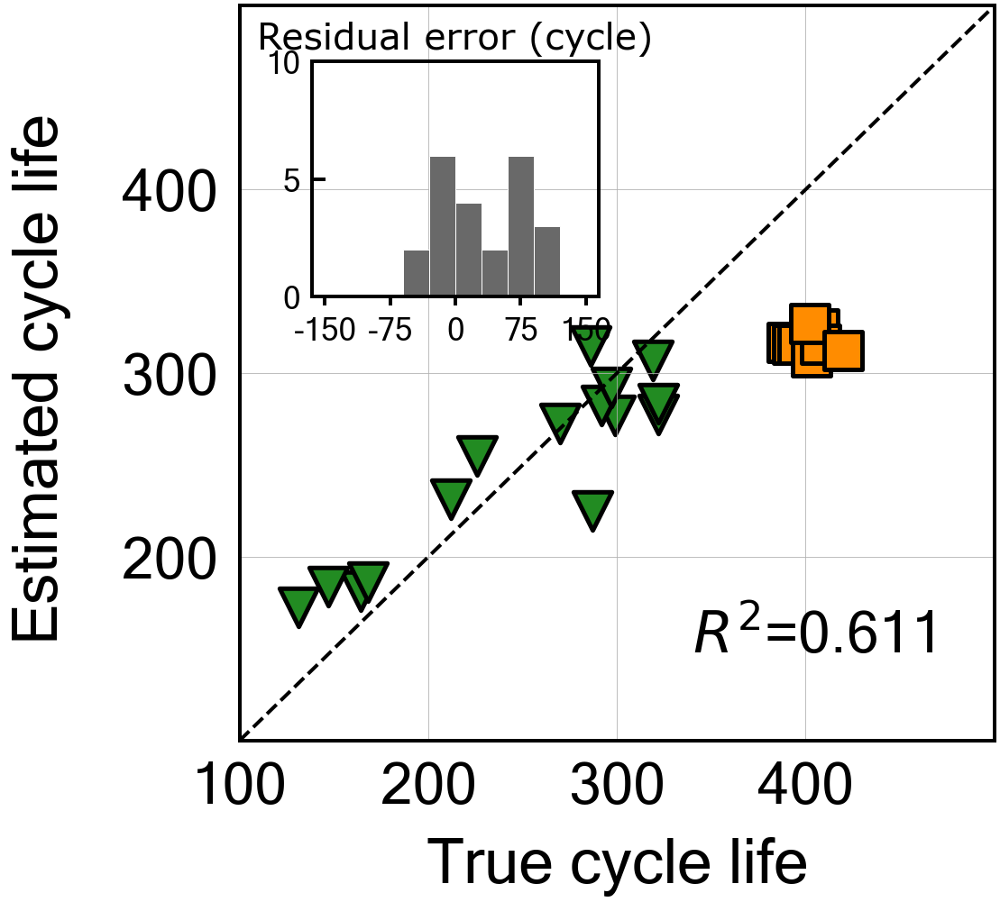


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -16.026699968671437
Cycle no: 82
Coefficient:
T_V('Charge', 'Variance', '82') : -0.05217087513948159
T_V('Charge', 'Mean', '82') : 0.08044255742874838
T_V('Charge', 'Skewness', '82') : 0.2492940220526672
dTdV('Charge', 'Maximum', '82') : -0.0
dTdV('Charge', 'Mean', '82') : -0.0
dTdV('Charge', 'Kurtosis', '82') : 9.837811231103166e-05

Intercept: 0.6202443280977311
MAE_all: 24.6
MAPE_all: 8.5 %
RMSE_all: 29.1
RMSPE_all: 9.9 %
MAE_train: 18.7
MAPE_train: 8.3 %
RMSE_train: 23.8
RMSPE_train: 10.3 %
MAE_test: 35.7
MAPE_test: 8.9 %
RMSE_test: 37.1
RMSPE_test: 9.2 %
R2 normal-scale scores
All data r2-score: 0.896
Train data r2-score: 0.870
Test data r2-score: -16.027

Normal-scale scores
All data score: 0.896
Train data score: 0.870
Test data score: -16.027


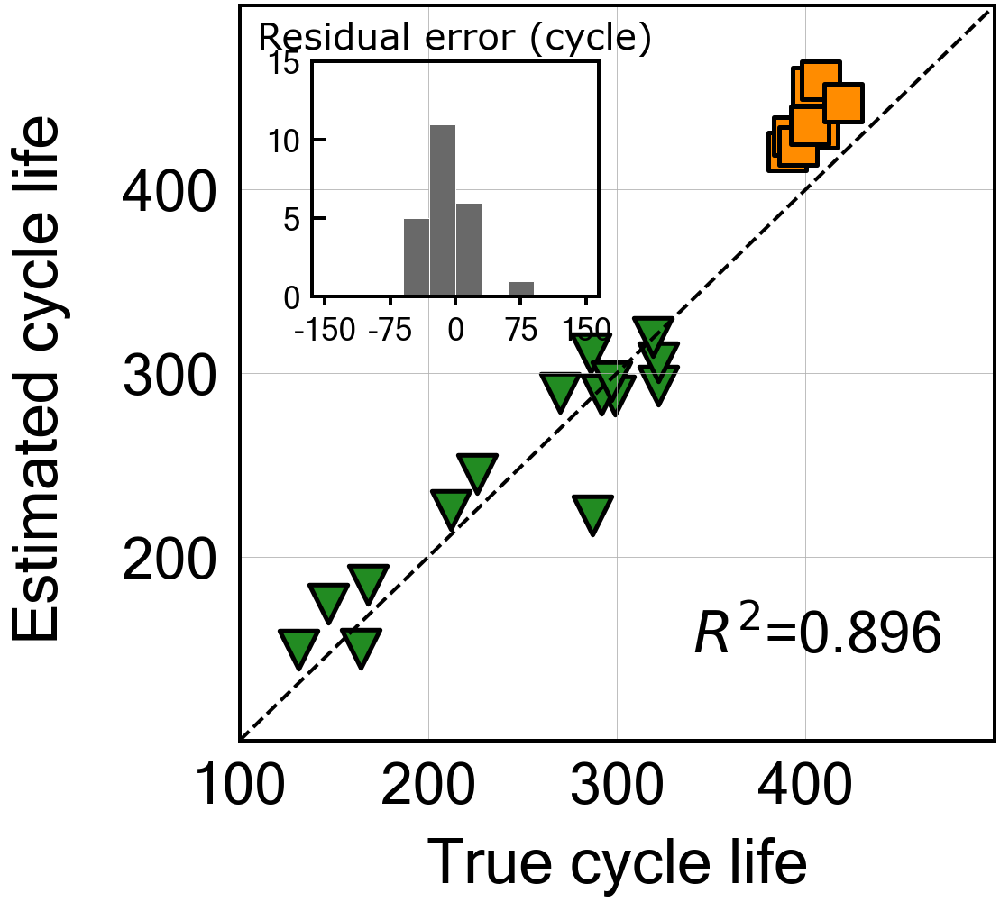


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -436.4219432491455
Cycle no: 83
Coefficient:
T_V('Charge', 'Variance', '83') : -0.16039327293756203
T_V('Charge', 'Mean', '83') : 0.05579164151300928
T_V('Charge', 'Skewness', '83') : 0.2682176615912851
dTdV('Charge', 'Maximum', '83') : 0.1616462590662683
dTdV('Charge', 'Mean', '83') : -0.02070923570970043
dTdV('Charge', 'Kurtosis', '83') : 0.0694276258334112

Intercept: 0.6202443280977321
MAE_all: 67.0
MAPE_all: 17.6 %
RMSE_all: 111.3
RMSPE_all: 27.7 %
MAE_train: 10.5
MAPE_train: 4.2 %
RMSE_train: 12.9
RMSPE_train: 4.9 %
MAE_test: 172.9
MAPE_test: 42.9 %
RMSE_test: 187.9
RMSPE_test: 46.5 %
R2 normal-scale scores
All data r2-score: -0.515
Train data r2-score: 0.962
Test data r2-score: -436.422

Normal-scale scores
All data score: -0.515
Train data score: 0.962
Test data score: -436.422


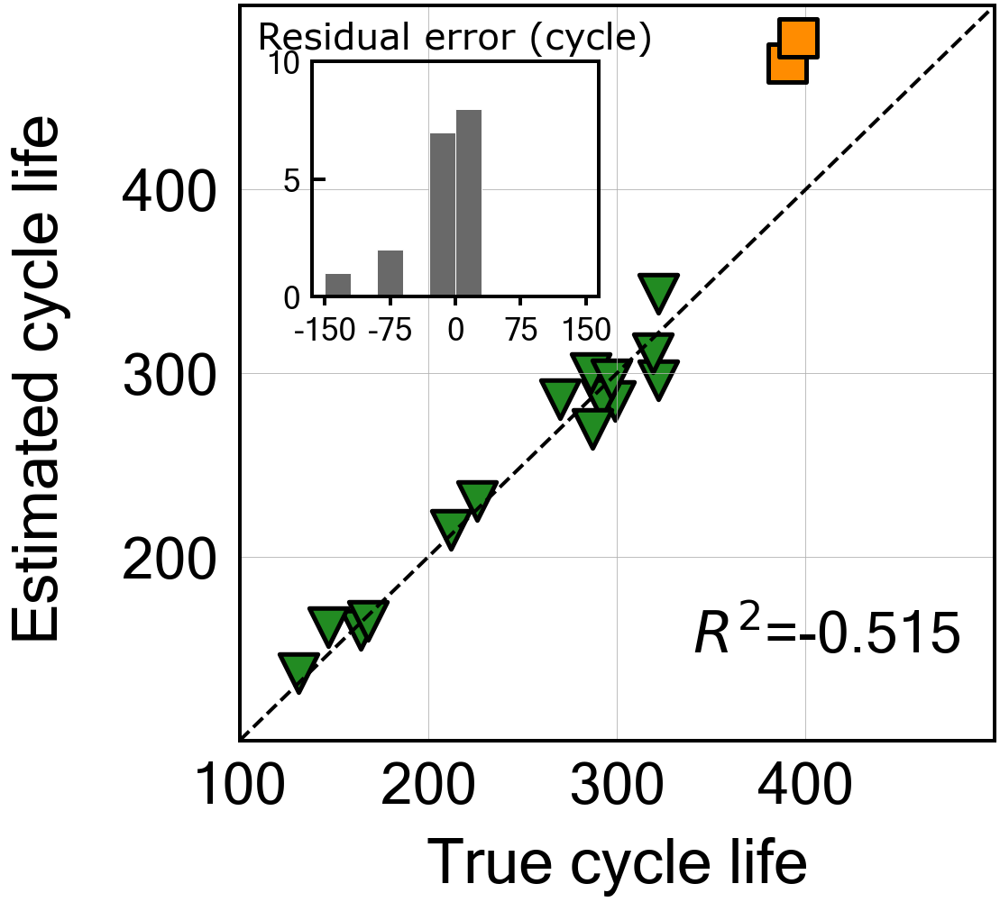


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -89.02409553961837
Cycle no: 84
Coefficient:
T_V('Charge', 'Variance', '84') : 0.3652280555918259
T_V('Charge', 'Mean', '84') : 0.22903745828654506
T_V('Charge', 'Skewness', '84') : 0.1327904798572373
dTdV('Charge', 'Maximum', '84') : -0.008165547888572555
dTdV('Charge', 'Mean', '84') : -0.43256389838807224
dTdV('Charge', 'Kurtosis', '84') : -0.018603013465812224

Intercept: 0.6202443280977331
MAE_all: 37.8
MAPE_all: 11.2 %
RMSE_all: 52.9
RMSPE_all: 14.4 %
MAE_train: 13.9
MAPE_train: 6.1 %
RMSE_train: 20.5
RMSPE_train: 8.7 %
MAE_test: 82.7
MAPE_test: 20.6 %
RMSE_test: 85.3
RMSPE_test: 21.2 %
R2 normal-scale scores
All data r2-score: 0.657
Train data r2-score: 0.904
Test data r2-score: -89.024

Normal-scale scores
All data score: 0.657
Train data score: 0.904
Test data score: -89.024


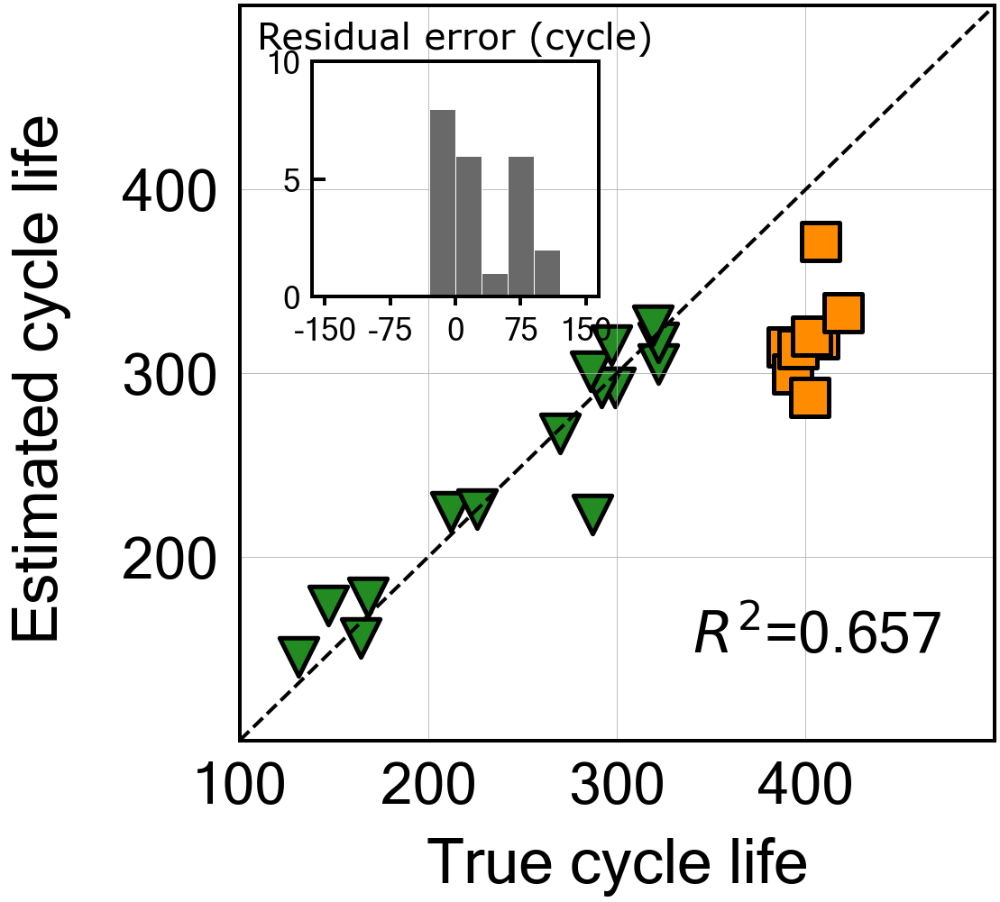


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -3.741371091559955
Cycle no: 85
Coefficient:
T_V('Charge', 'Variance', '85') : -0.014984438840232416
T_V('Charge', 'Mean', '85') : 0.03390240566583456
T_V('Charge', 'Skewness', '85') : 0.30351301662138486
dTdV('Charge', 'Maximum', '85') : -0.019769374283507144
dTdV('Charge', 'Mean', '85') : -0.0
dTdV('Charge', 'Kurtosis', '85') : 0.040352894677038155

Intercept: 0.6202443280977313
MAE_all: 18.1
MAPE_all: 6.5 %
RMSE_all: 23.0
RMSPE_all: 8.5 %
MAE_train: 17.8
MAPE_train: 7.5 %
RMSE_train: 24.7
RMSPE_train: 9.8 %
MAE_test: 18.9
MAPE_test: 4.7 %
RMSE_test: 19.6
RMSPE_test: 4.9 %
R2 normal-scale scores
All data r2-score: 0.935
Train data r2-score: 0.861
Test data r2-score: -3.741

Normal-scale scores
All data score: 0.935
Train data score: 0.861
Test data score: -3.741


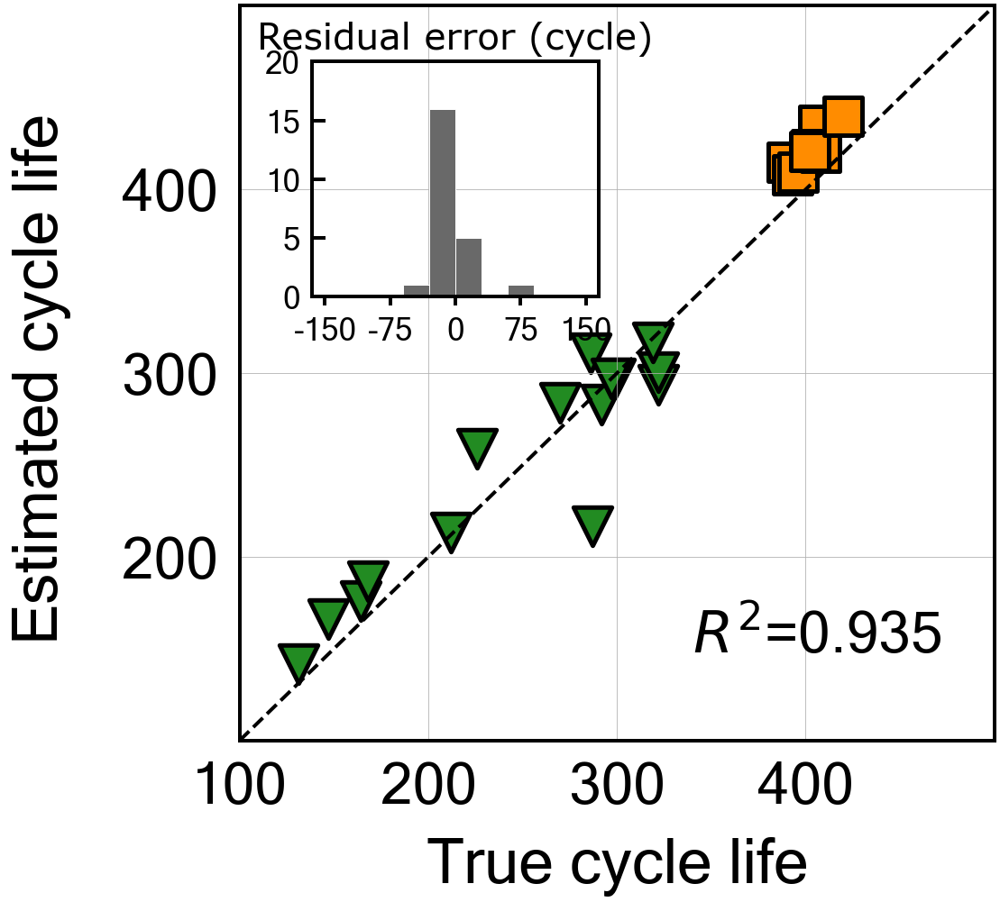


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -3.9904720047149125
Cycle no: 86
Coefficient:
T_V('Charge', 'Variance', '86') : -0.027844020892305445
T_V('Charge', 'Mean', '86') : 0.10047950122948375
T_V('Charge', 'Skewness', '86') : 0.1671006475301233
dTdV('Charge', 'Maximum', '86') : 0.043277321790173254
dTdV('Charge', 'Mean', '86') : -0.03282874809822525
dTdV('Charge', 'Kurtosis', '86') : -0.006828869890478424

Intercept: 0.6202443280977313
MAE_all: 20.1
MAPE_all: 8.1 %
RMSE_all: 26.4
RMSPE_all: 11.4 %
MAE_train: 23.6
MAPE_train: 10.6 %
RMSE_train: 29.2
RMSPE_train: 13.7 %
MAE_test: 13.7
MAPE_test: 3.4 %
RMSE_test: 20.1
RMSPE_test: 4.9 %
R2 normal-scale scores
All data r2-score: 0.915
Train data r2-score: 0.804
Test data r2-score: -3.990

Normal-scale scores
All data score: 0.915
Train data score: 0.804
Test data score: -3.990


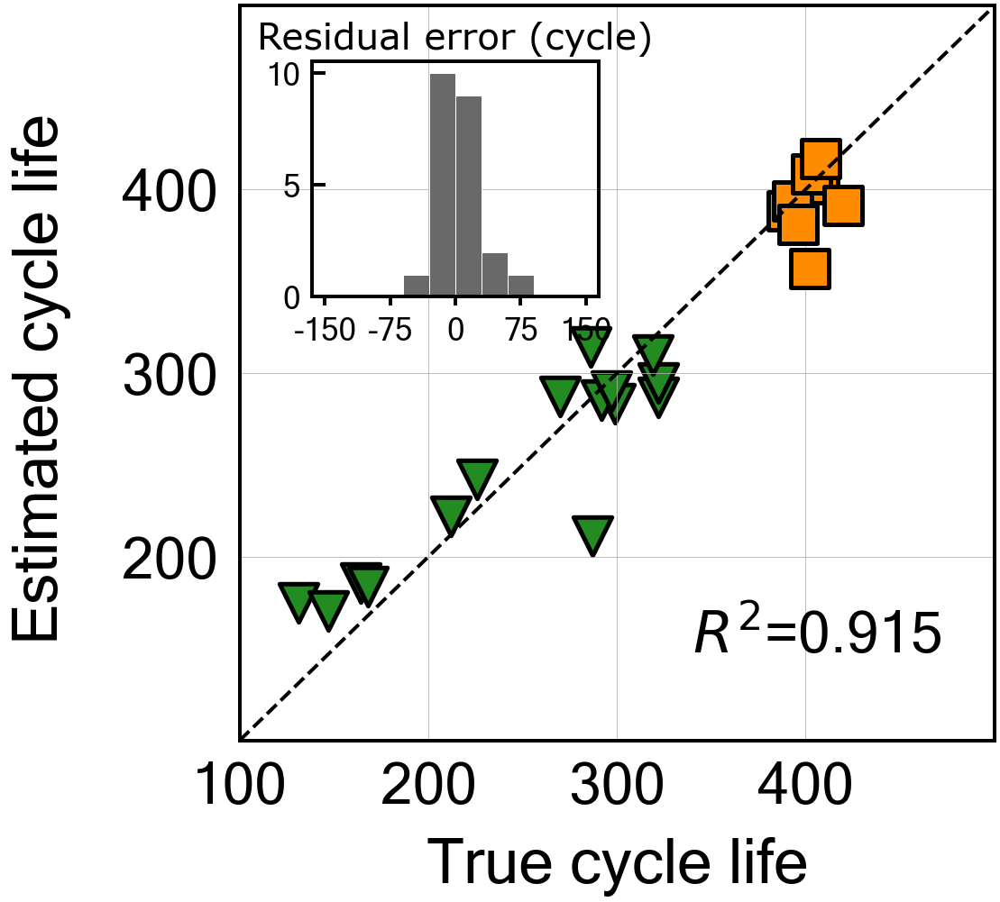


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -3.6702119495433987
Cycle no: 87
Coefficient:
T_V('Charge', 'Variance', '87') : -0.034458721926547434
T_V('Charge', 'Mean', '87') : 0.09769730748058361
T_V('Charge', 'Skewness', '87') : 0.1970709952252227
dTdV('Charge', 'Maximum', '87') : 0.04054905347172004
dTdV('Charge', 'Mean', '87') : -0.0328701127756304
dTdV('Charge', 'Kurtosis', '87') : -0.0

Intercept: 0.620244328097731
MAE_all: 19.4
MAPE_all: 7.4 %
RMSE_all: 23.8
RMSPE_all: 9.5 %
MAE_train: 20.8
MAPE_train: 9.1 %
RMSE_train: 25.8
RMSPE_train: 11.2 %
MAE_test: 16.7
MAPE_test: 4.1 %
RMSE_test: 19.4
RMSPE_test: 4.8 %
R2 normal-scale scores
All data r2-score: 0.931
Train data r2-score: 0.848
Test data r2-score: -3.670

Normal-scale scores
All data score: 0.931
Train data score: 0.848
Test data score: -3.670


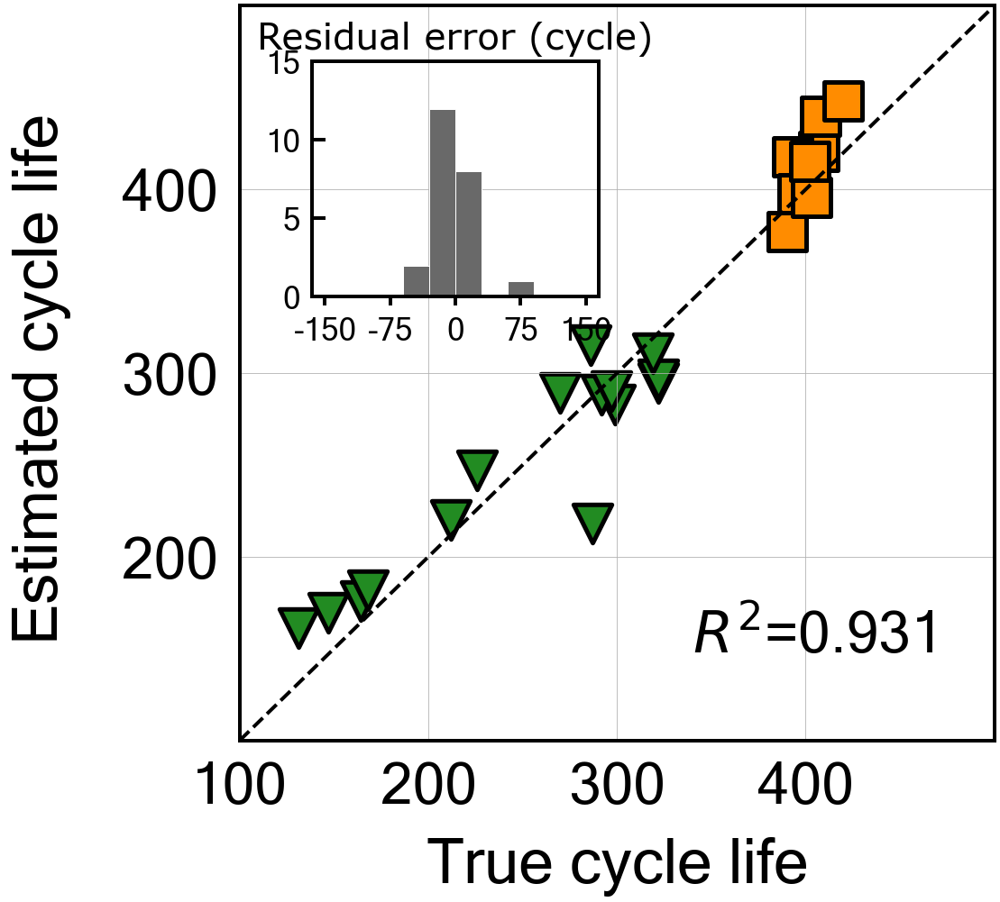


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.1
Best score obtained was: -4.0591640184438615
Cycle no: 88
Coefficient:
T_V('Charge', 'Variance', '88') : -0.03208317058744457
T_V('Charge', 'Mean', '88') : 0.02888458391295996
T_V('Charge', 'Skewness', '88') : 0.27522303030999234
dTdV('Charge', 'Maximum', '88') : 0.0
dTdV('Charge', 'Mean', '88') : -0.0
dTdV('Charge', 'Kurtosis', '88') : 0.0

Intercept: 0.6202443280977316
MAE_all: 20.1
MAPE_all: 7.4 %
RMSE_all: 24.2
RMSPE_all: 9.1 %
MAE_train: 20.8
MAPE_train: 8.8 %
RMSE_train: 26.1
RMSPE_train: 10.7 %
MAE_test: 18.9
MAPE_test: 4.7 %
RMSE_test: 20.2
RMSPE_test: 5.0 %
R2 normal-scale scores
All data r2-score: 0.928
Train data r2-score: 0.844
Test data r2-score: -4.059

Normal-scale scores
All data score: 0.928
Train data score: 0.844
Test data score: -4.059


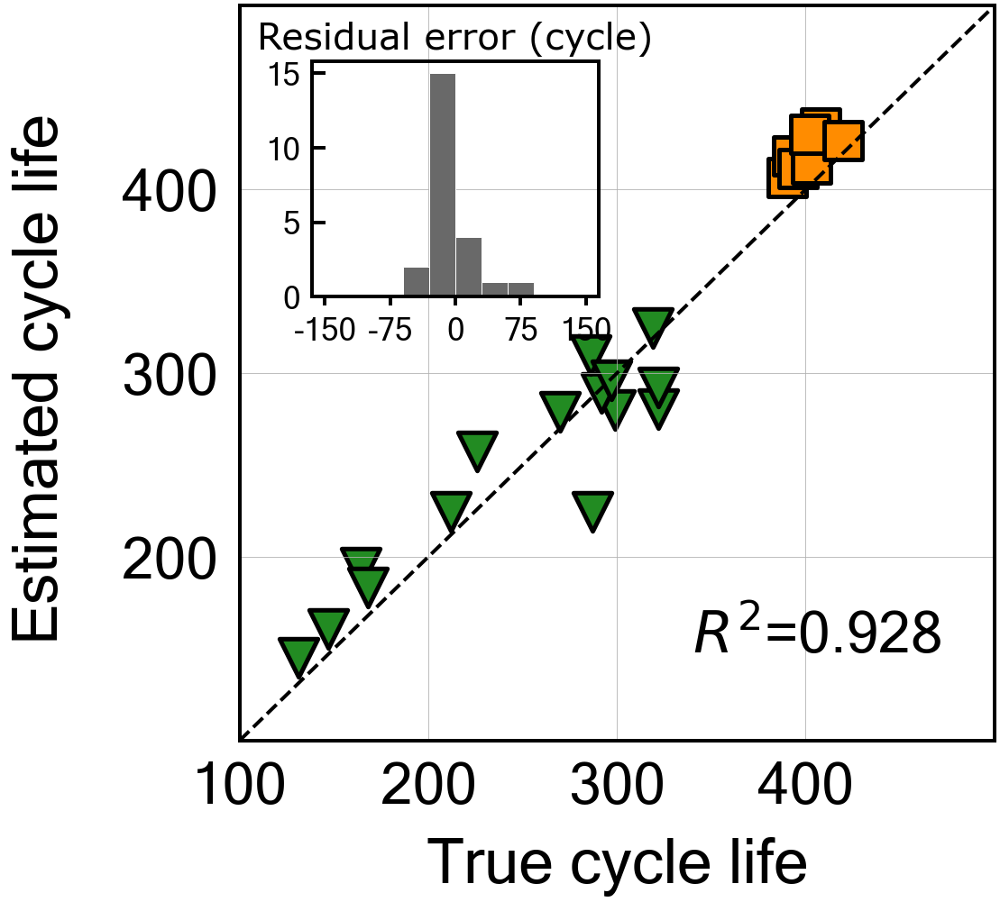


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.1
Best score obtained was: -20.161131775701577
Cycle no: 89
Coefficient:
T_V('Charge', 'Variance', '89') : -0.0
T_V('Charge', 'Mean', '89') : 0.010423076253214559
T_V('Charge', 'Skewness', '89') : 0.26691756435216896
dTdV('Charge', 'Maximum', '89') : -0.0
dTdV('Charge', 'Mean', '89') : -0.0
dTdV('Charge', 'Kurtosis', '89') : -0.0

Intercept: 0.6202443280977313
MAE_all: 29.7
MAPE_all: 10.2 %
RMSE_all: 34.2
RMSPE_all: 11.7 %
MAE_train: 24.3
MAPE_train: 10.4 %
RMSE_train: 29.8
RMSPE_train: 12.4 %
MAE_test: 39.8
MAPE_test: 9.9 %
RMSE_test: 41.3
RMSPE_test: 10.2 %
R2 normal-scale scores
All data r2-score: 0.857
Train data r2-score: 0.797
Test data r2-score: -20.161

Normal-scale scores
All data score: 0.857
Train data score: 0.797
Test data score: -20.161


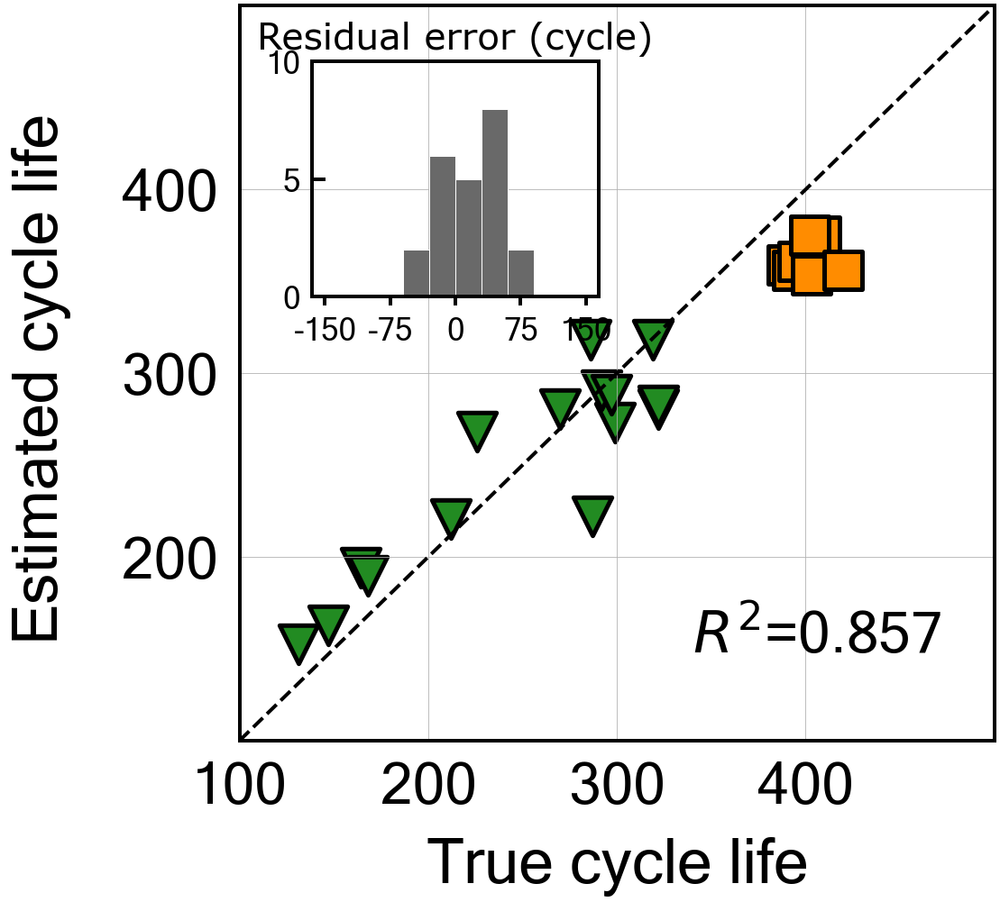


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.2
Best score obtained was: -206.26079269492115
Cycle no: 90
Coefficient:
T_V('Charge', 'Variance', '90') : -0.10926405199033229
T_V('Charge', 'Mean', '90') : 0.08548308774022363
T_V('Charge', 'Skewness', '90') : 0.24451849500700437
dTdV('Charge', 'Maximum', '90') : 0.10901160111180704
dTdV('Charge', 'Mean', '90') : -0.021063970216342546
dTdV('Charge', 'Kurtosis', '90') : 0.035894052558152416

Intercept: 0.6202443280977318
MAE_all: 52.2
MAPE_all: 14.7 %
RMSE_all: 78.2
RMSPE_all: 20.1 %
MAE_train: 15.2
MAPE_train: 6.5 %
RMSE_train: 21.1
RMSPE_train: 8.7 %
MAE_test: 121.7
MAPE_test: 30.2 %
RMSE_test: 129.4
RMSPE_test: 32.0 %
R2 normal-scale scores
All data r2-score: 0.253
Train data r2-score: 0.898
Test data r2-score: -206.261

Normal-scale scores
All data score: 0.253
Train data score: 0.898
Test data score: -206.261


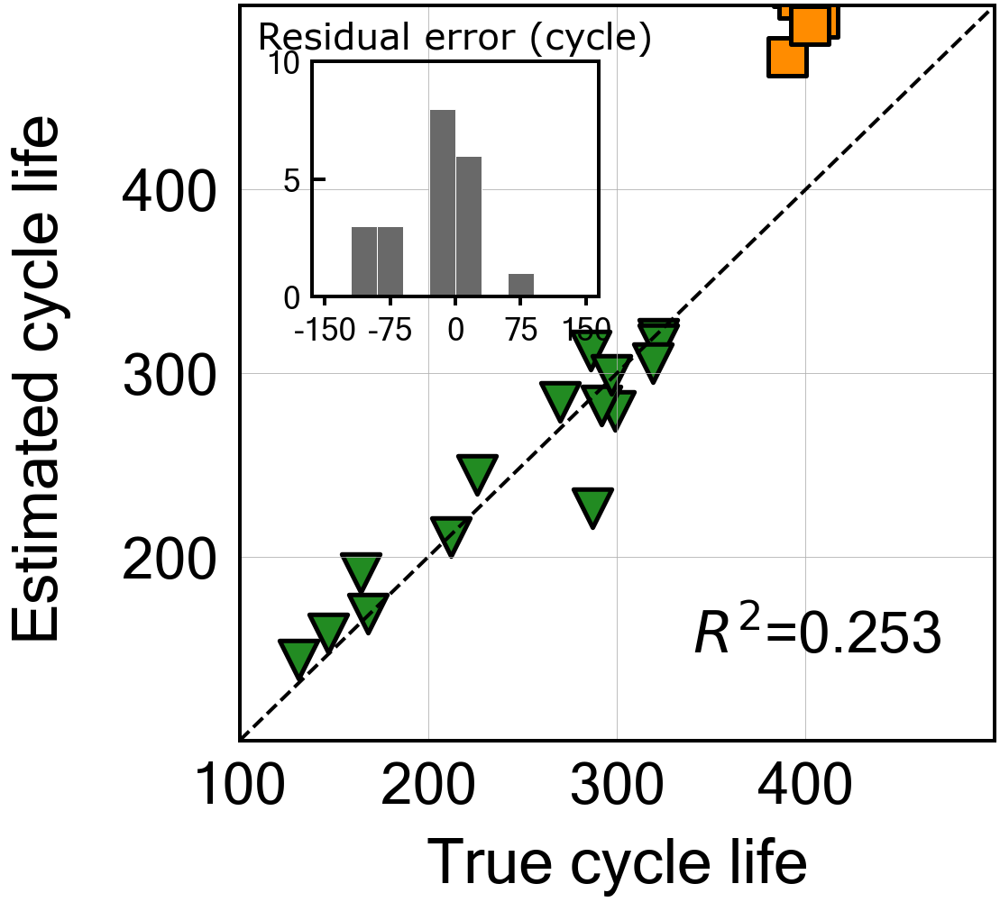


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.1
Best score obtained was: -20.046478334061057
Cycle no: 91
Coefficient:
T_V('Charge', 'Variance', '91') : -0.033608396887457904
T_V('Charge', 'Mean', '91') : 0.10669853763248266
T_V('Charge', 'Skewness', '91') : 0.1663288132263056
dTdV('Charge', 'Maximum', '91') : 0.04451320293773807
dTdV('Charge', 'Mean', '91') : -0.023181519121284213
dTdV('Charge', 'Kurtosis', '91') : -0.016822116011526462

Intercept: 0.6202443280977322
MAE_all: 26.6
MAPE_all: 9.3 %
RMSE_all: 32.1
RMSPE_all: 11.5 %
MAE_train: 20.2
MAPE_train: 9.1 %
RMSE_train: 25.9
RMSPE_train: 12.0 %
MAE_test: 38.7
MAPE_test: 9.6 %
RMSE_test: 41.2
RMSPE_test: 10.2 %
R2 normal-scale scores
All data r2-score: 0.874
Train data r2-score: 0.846
Test data r2-score: -20.046

Normal-scale scores
All data score: 0.874
Train data score: 0.846
Test data score: -20.046


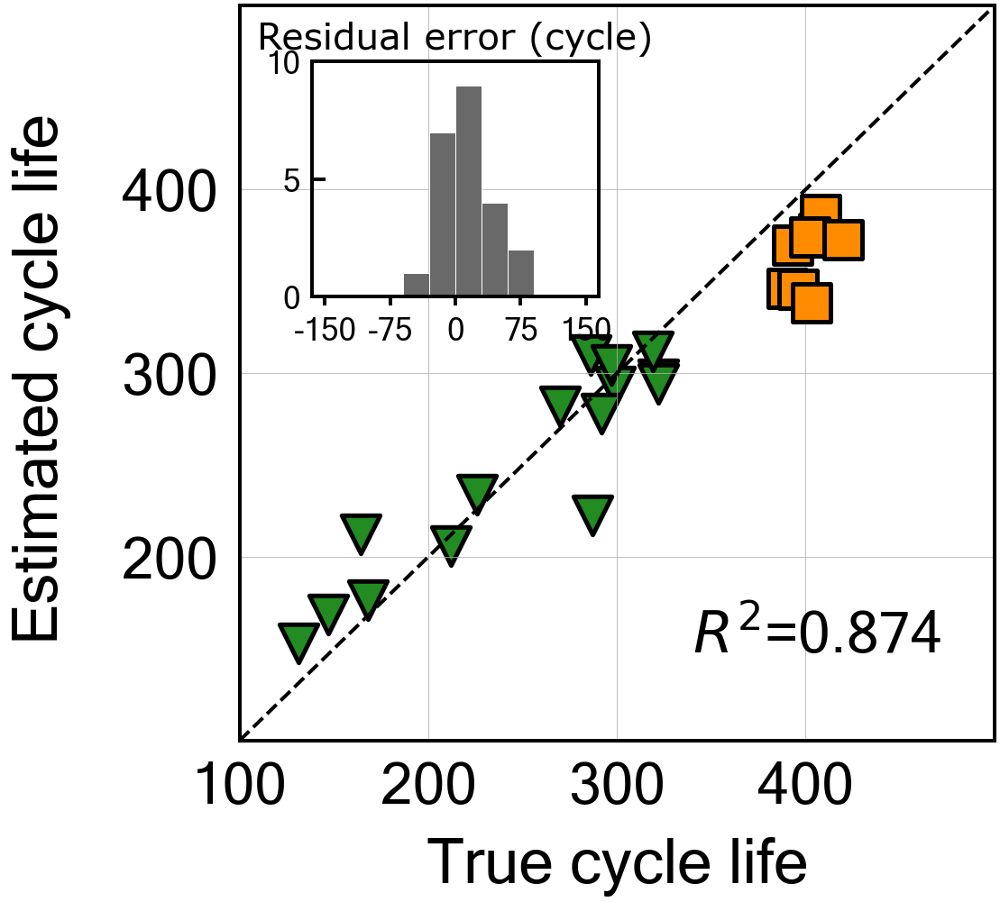


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.2
Best score obtained was: -165.03290069548444
Cycle no: 92
Coefficient:
T_V('Charge', 'Variance', '92') : -0.16603749978845578
T_V('Charge', 'Mean', '92') : 0.07411777042434567
T_V('Charge', 'Skewness', '92') : 0.2629563752523712
dTdV('Charge', 'Maximum', '92') : 0.09059699353249265
dTdV('Charge', 'Mean', '92') : 0.05122926489239556
dTdV('Charge', 'Kurtosis', '92') : 0.03899132506102717

Intercept: 0.6202443280977318
MAE_all: 48.7
MAPE_all: 13.6 %
RMSE_all: 70.1
RMSPE_all: 18.0 %
MAE_train: 15.5
MAPE_train: 6.1 %
RMSE_train: 19.5
RMSPE_train: 7.6 %
MAE_test: 111.0
MAPE_test: 27.6 %
RMSE_test: 115.8
RMSPE_test: 28.7 %
R2 normal-scale scores
All data r2-score: 0.400
Train data r2-score: 0.913
Test data r2-score: -165.033

Normal-scale scores
All data score: 0.400
Train data score: 0.913
Test data score: -165.033


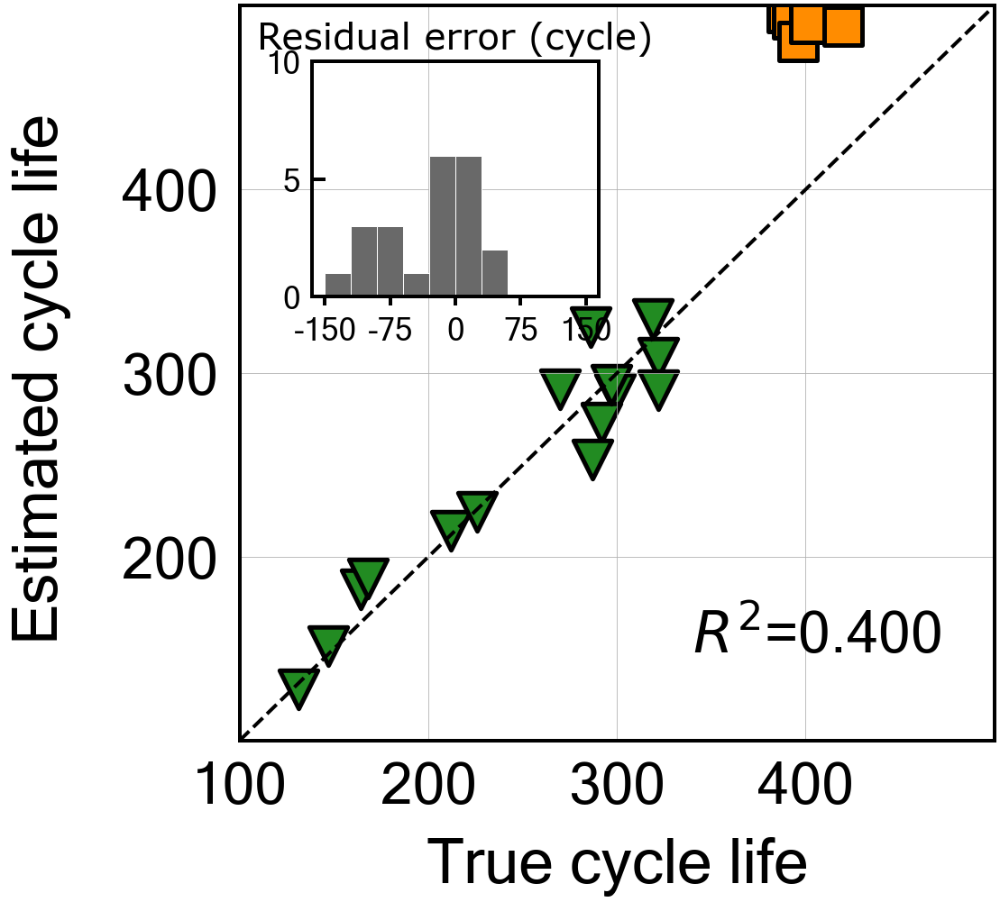


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -11.124931436753895
Cycle no: 93
Coefficient:
T_V('Charge', 'Variance', '93') : -0.04771532964135514
T_V('Charge', 'Mean', '93') : 0.1365981144146269
T_V('Charge', 'Skewness', '93') : 0.16950017234898698
dTdV('Charge', 'Maximum', '93') : 0.09094077852753166
dTdV('Charge', 'Mean', '93') : -0.05074324217218403
dTdV('Charge', 'Kurtosis', '93') : 0.04732938405824442

Intercept: 0.6202443280977313
MAE_all: 19.7
MAPE_all: 6.7 %
RMSE_all: 23.7
RMSPE_all: 7.7 %
MAE_train: 15.6
MAPE_train: 6.6 %
RMSE_train: 18.5
RMSPE_train: 7.7 %
MAE_test: 27.4
MAPE_test: 6.8 %
RMSE_test: 31.3
RMSPE_test: 7.8 %
R2 normal-scale scores
All data r2-score: 0.931
Train data r2-score: 0.922
Test data r2-score: -11.125

Normal-scale scores
All data score: 0.931
Train data score: 0.922
Test data score: -11.125


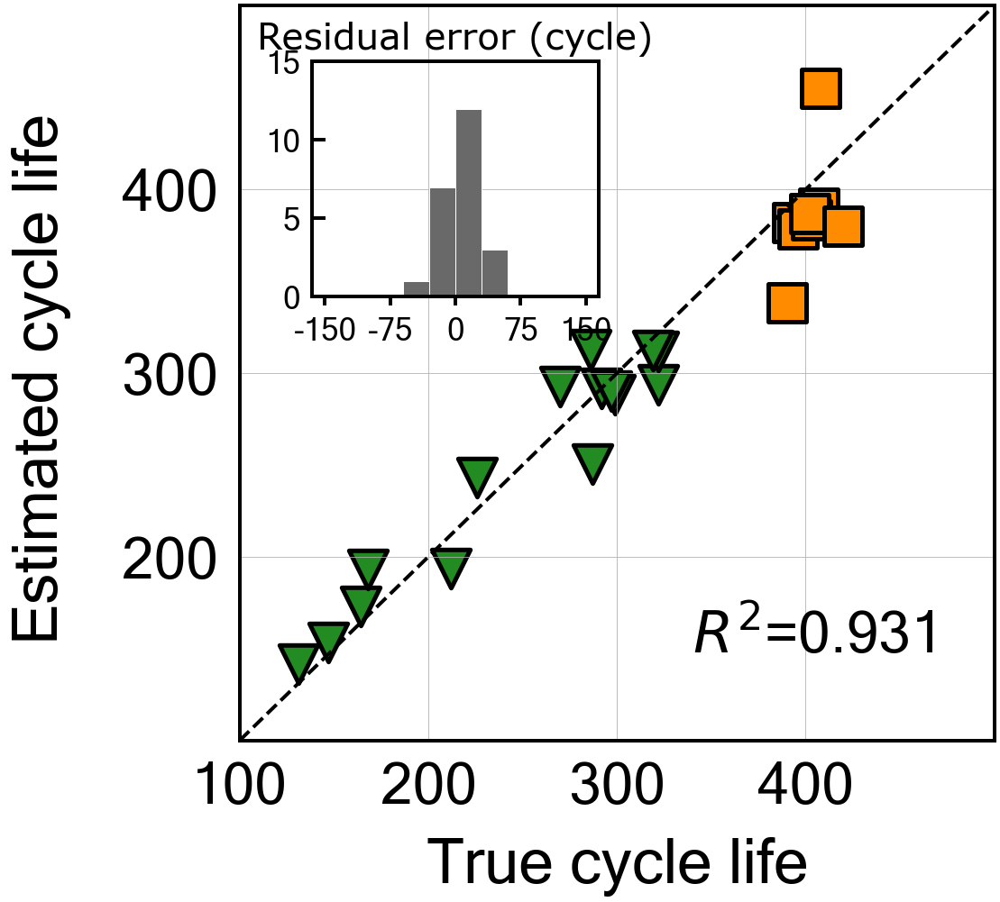


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -29.11129449187673
Cycle no: 94
Coefficient:
T_V('Charge', 'Variance', '94') : -0.028145324383339214
T_V('Charge', 'Mean', '94') : 0.11122371759739666
T_V('Charge', 'Skewness', '94') : 0.22350033825838667
dTdV('Charge', 'Maximum', '94') : 0.08772389703206847
dTdV('Charge', 'Mean', '94') : -0.08867066759019726
dTdV('Charge', 'Kurtosis', '94') : 0.011016591694336626

Intercept: 0.6202443280977319
MAE_all: 24.7
MAPE_all: 7.7 %
RMSE_all: 32.5
RMSPE_all: 9.2 %
MAE_train: 14.8
MAPE_train: 6.2 %
RMSE_train: 17.9
RMSPE_train: 7.2 %
MAE_test: 43.3
MAPE_test: 10.7 %
RMSE_test: 49.3
RMSPE_test: 12.1 %
R2 normal-scale scores
All data r2-score: 0.871
Train data r2-score: 0.927
Test data r2-score: -29.111

Normal-scale scores
All data score: 0.871
Train data score: 0.927
Test data score: -29.111


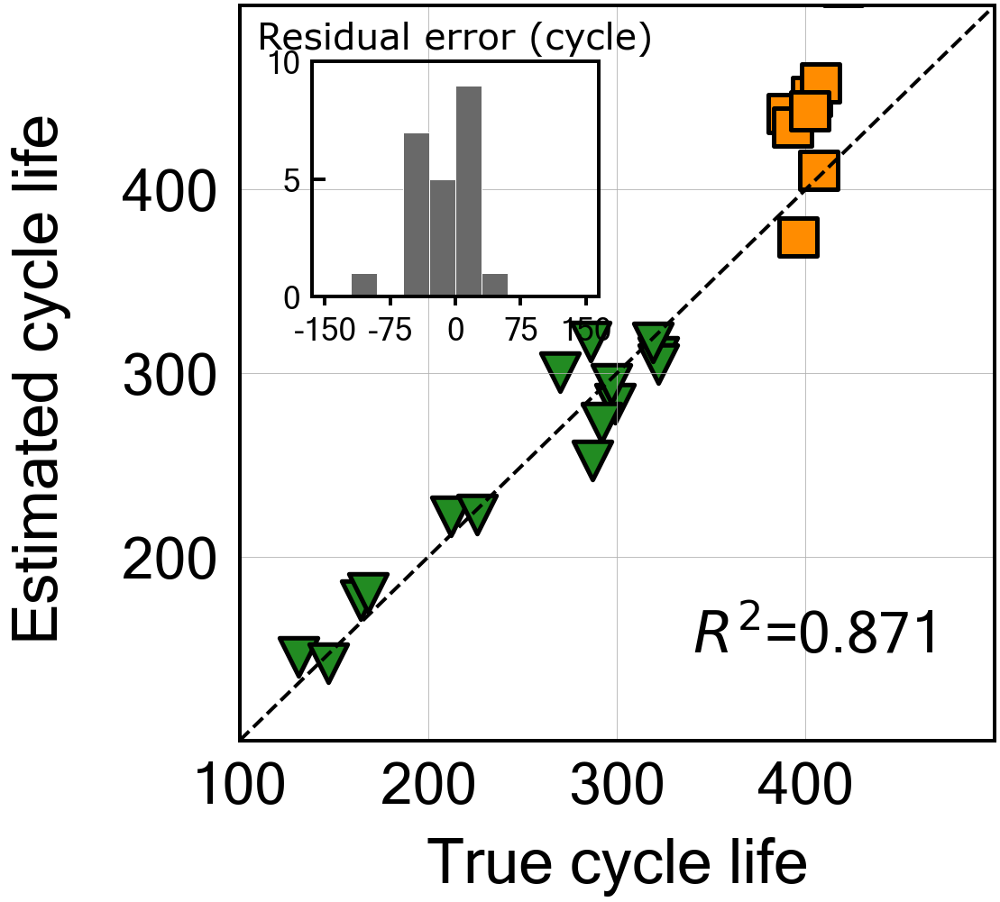


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -44.515767322511046
Cycle no: 95
Coefficient:
T_V('Charge', 'Variance', '95') : -0.0
T_V('Charge', 'Mean', '95') : 0.1366231892031638
T_V('Charge', 'Skewness', '95') : 0.16684298056723376
dTdV('Charge', 'Maximum', '95') : 0.0
dTdV('Charge', 'Mean', '95') : -0.027740158864974402
dTdV('Charge', 'Kurtosis', '95') : -0.029771763318549617

Intercept: 0.6202443280977322
MAE_all: 33.2
MAPE_all: 10.5 %
RMSE_all: 40.9
RMSPE_all: 12.1 %
MAE_train: 18.9
MAPE_train: 8.2 %
RMSE_train: 24.7
RMSPE_train: 10.3 %
MAE_test: 59.9
MAPE_test: 14.9 %
RMSE_test: 60.6
RMSPE_test: 15.0 %
R2 normal-scale scores
All data r2-score: 0.795
Train data r2-score: 0.861
Test data r2-score: -44.516

Normal-scale scores
All data score: 0.795
Train data score: 0.861
Test data score: -44.516


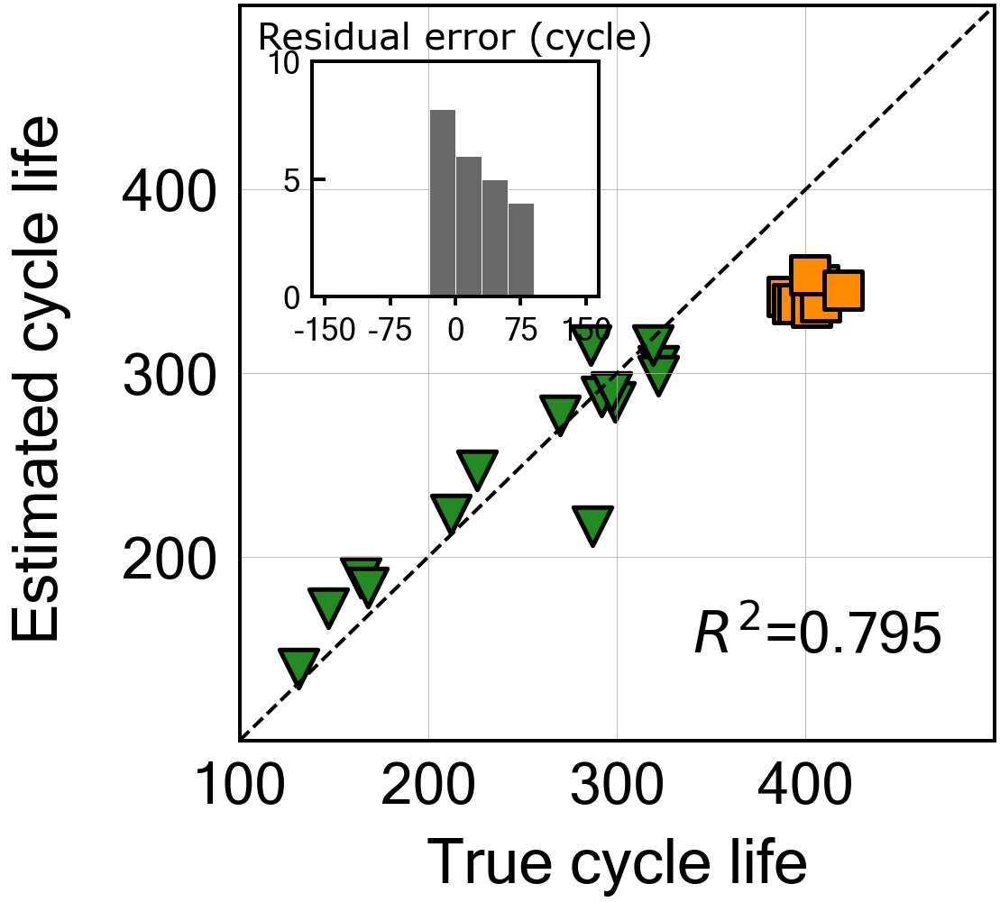


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -4.5479079427373446
Cycle no: 96
Coefficient:
T_V('Charge', 'Variance', '96') : -0.03579837925974065
T_V('Charge', 'Mean', '96') : 0.10132999519960856
T_V('Charge', 'Skewness', '96') : 0.20734854962236682
dTdV('Charge', 'Maximum', '96') : 0.0
dTdV('Charge', 'Mean', '96') : -0.0011276284761058278
dTdV('Charge', 'Kurtosis', '96') : -0.04768830689113608

Intercept: 0.6202443280977319
MAE_all: 16.9
MAPE_all: 6.2 %
RMSE_all: 20.3
RMSPE_all: 7.8 %
MAE_train: 16.1
MAPE_train: 7.1 %
RMSE_train: 19.8
RMSPE_train: 8.9 %
MAE_test: 18.5
MAPE_test: 4.6 %
RMSE_test: 21.2
RMSPE_test: 5.2 %
R2 normal-scale scores
All data r2-score: 0.950
Train data r2-score: 0.910
Test data r2-score: -4.548

Normal-scale scores
All data score: 0.950
Train data score: 0.910
Test data score: -4.548


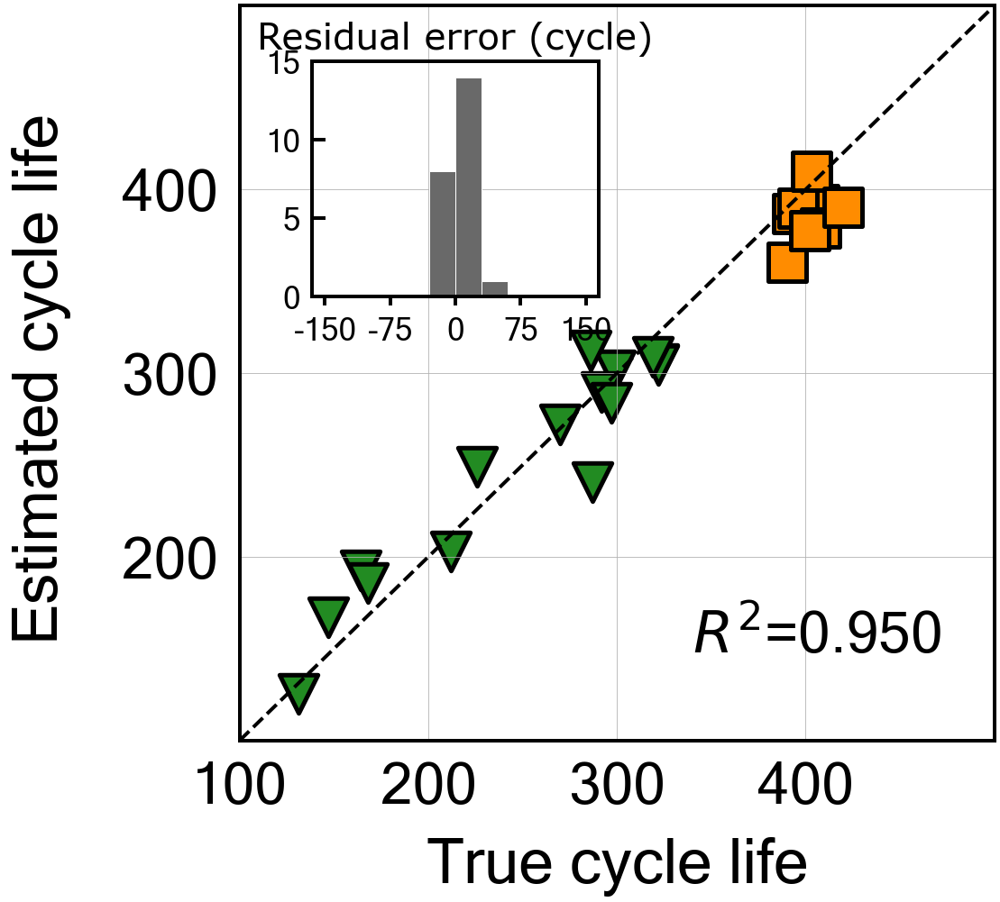


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -122.60274823444443
Cycle no: 97
Coefficient:
T_V('Charge', 'Variance', '97') : -0.015172757237561351
T_V('Charge', 'Mean', '97') : 0.08951959589459367
T_V('Charge', 'Skewness', '97') : 0.14201128636764065
dTdV('Charge', 'Maximum', '97') : 0.02238107667118118
dTdV('Charge', 'Mean', '97') : -0.0
dTdV('Charge', 'Kurtosis', '97') : -0.06723197041926758

Intercept: 0.6202443280977309
MAE_all: 47.7
MAPE_all: 14.4 %
RMSE_all: 62.4
RMSPE_all: 17.3 %
MAE_train: 20.1
MAPE_train: 8.9 %
RMSE_train: 25.6
RMSPE_train: 11.4 %
MAE_test: 99.2
MAPE_test: 24.6 %
RMSE_test: 99.9
RMSPE_test: 24.8 %
R2 normal-scale scores
All data r2-score: 0.523
Train data r2-score: 0.850
Test data r2-score: -122.603

Normal-scale scores
All data score: 0.523
Train data score: 0.850
Test data score: -122.603


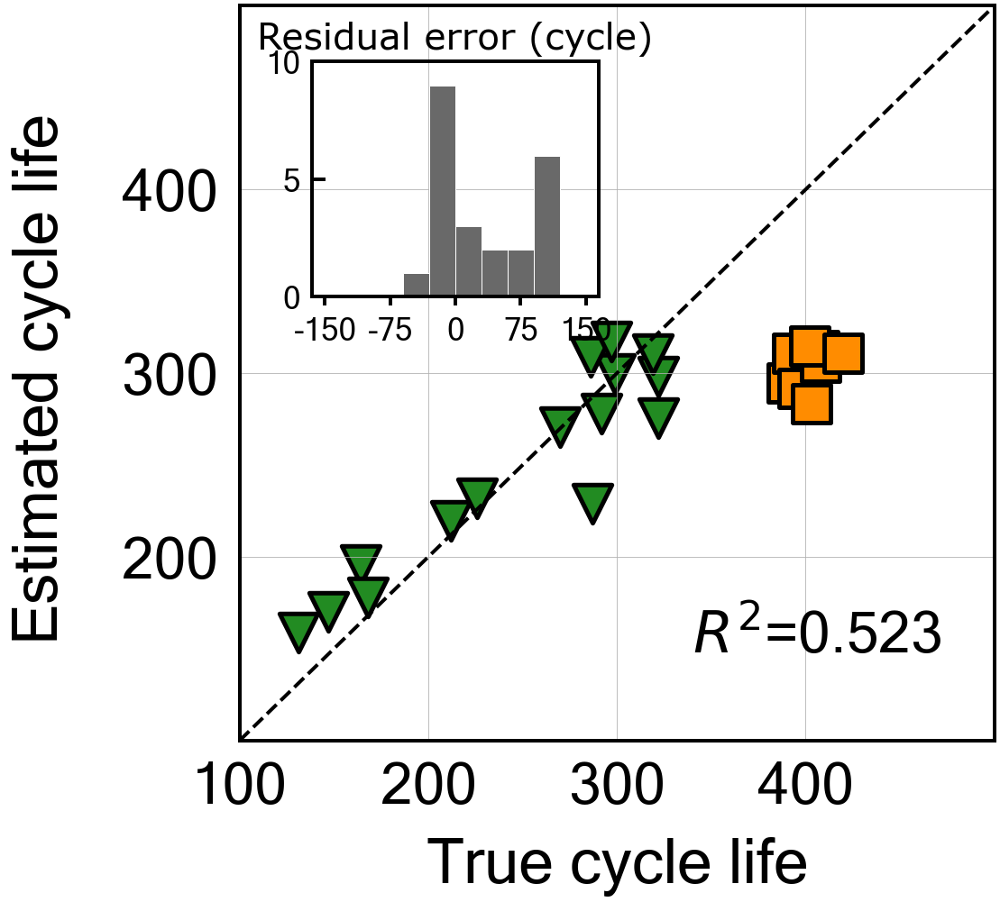


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.2
Best score obtained was: -132.8922447401963
Cycle no: 98
Coefficient:
T_V('Charge', 'Variance', '98') : -0.0
T_V('Charge', 'Mean', '98') : 0.11004965001914908
T_V('Charge', 'Skewness', '98') : 0.1599162739493778
dTdV('Charge', 'Maximum', '98') : 0.0
dTdV('Charge', 'Mean', '98') : -0.0
dTdV('Charge', 'Kurtosis', '98') : -0.0

Intercept: 0.6202443280977318
MAE_all: 51.9
MAPE_all: 16.0 %
RMSE_all: 65.8
RMSPE_all: 18.5 %
MAE_train: 24.5
MAPE_train: 10.9 %
RMSE_train: 29.5
RMSPE_train: 13.2 %
MAE_test: 103.2
MAPE_test: 25.6 %
RMSE_test: 104.0
RMSPE_test: 25.7 %
R2 normal-scale scores
All data r2-score: 0.471
Train data r2-score: 0.800
Test data r2-score: -132.892

Normal-scale scores
All data score: 0.471
Train data score: 0.800
Test data score: -132.892


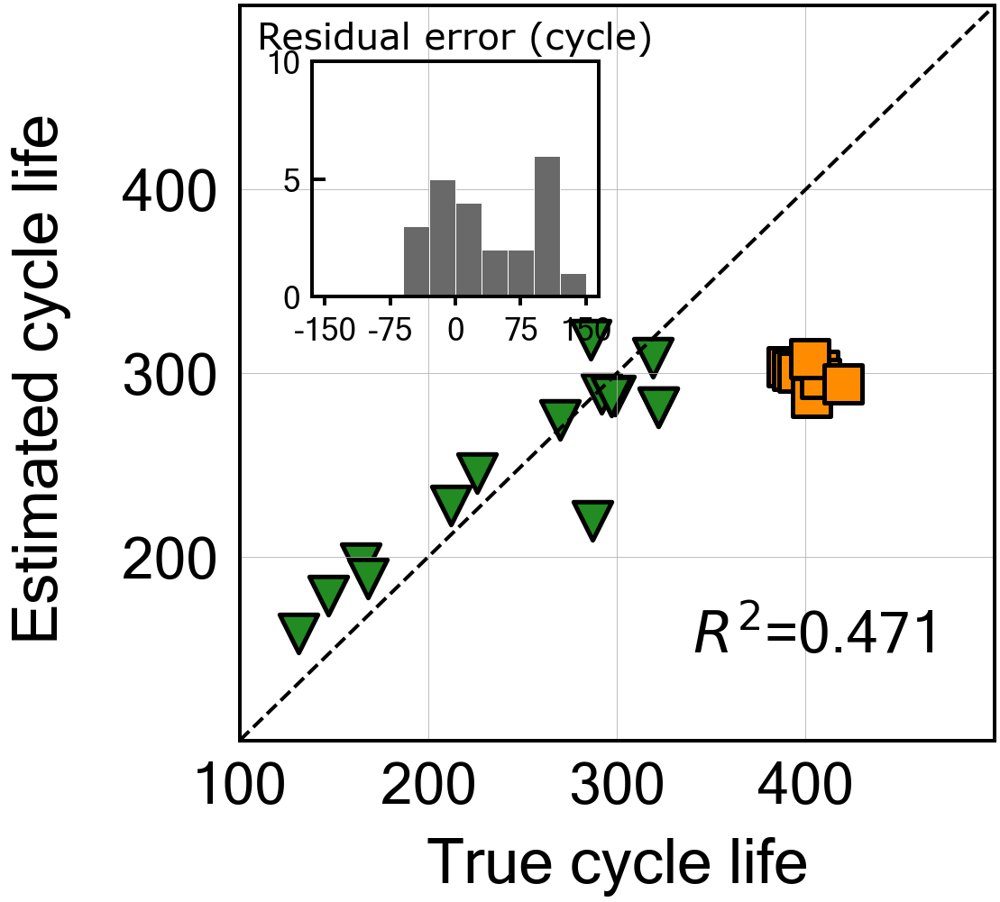


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.5
Best score obtained was: -150.51468738319178
Cycle no: 99
Coefficient:
T_V('Charge', 'Variance', '99') : 0.0
T_V('Charge', 'Mean', '99') : 0.10595524465062242
T_V('Charge', 'Skewness', '99') : 0.14492020099737474
dTdV('Charge', 'Maximum', '99') : 0.0037373297603098274
dTdV('Charge', 'Mean', '99') : 0.0
dTdV('Charge', 'Kurtosis', '99') : 0.02327438195961403

Intercept: 0.6202443280977311
MAE_all: 55.3
MAPE_all: 17.1 %
RMSE_all: 69.9
RMSPE_all: 19.7 %
MAE_train: 26.3
MAPE_train: 11.8 %
RMSE_train: 30.9
RMSPE_train: 14.1 %
MAE_test: 109.7
MAPE_test: 27.2 %
RMSE_test: 110.6
RMSPE_test: 27.4 %
R2 normal-scale scores
All data r2-score: 0.403
Train data r2-score: 0.781
Test data r2-score: -150.515

Normal-scale scores
All data score: 0.403
Train data score: 0.781
Test data score: -150.515


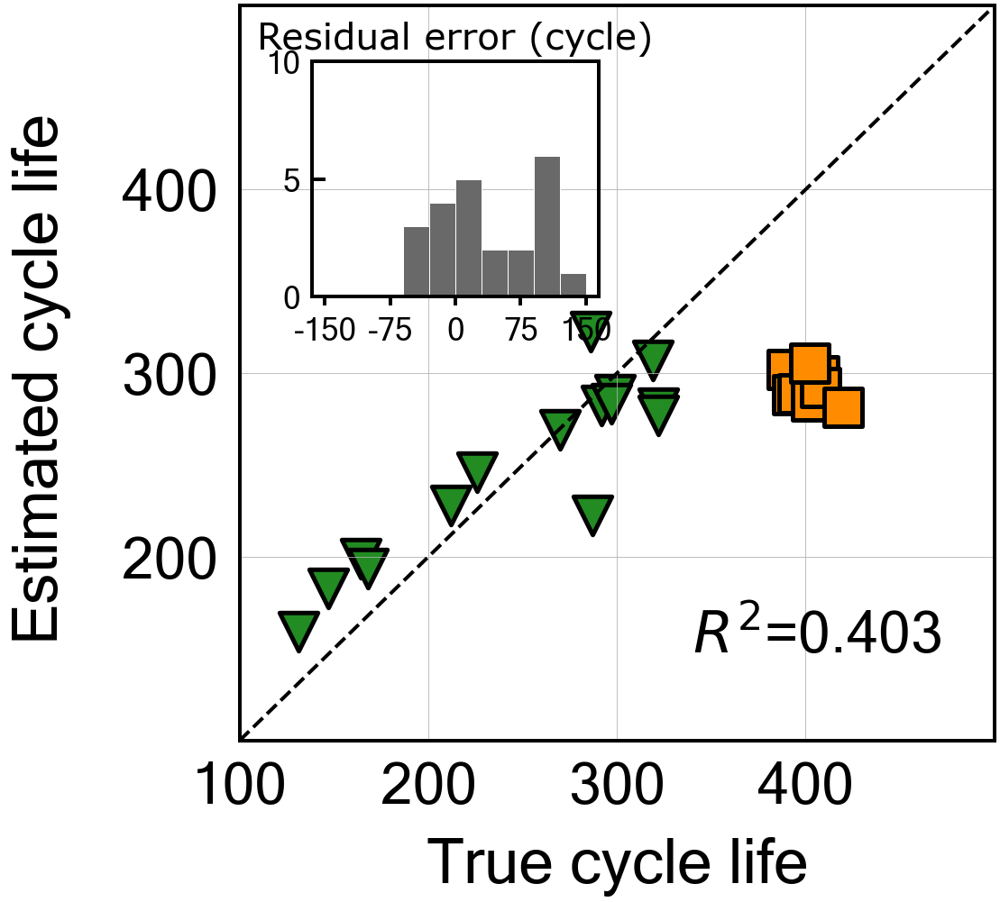


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -140.44009540941627
Cycle no: 100
Coefficient:
T_V('Charge', 'Variance', '100') : 0.026419966108607487
T_V('Charge', 'Mean', '100') : 0.010579272859150064
T_V('Charge', 'Skewness', '100') : 0.3537222343395827
dTdV('Charge', 'Maximum', '100') : -0.1632271994618767
dTdV('Charge', 'Mean', '100') : 0.08662032731288696
dTdV('Charge', 'Kurtosis', '100') : 0.0562488645413292

Intercept: 0.620244328097731
MAE_all: 46.5
MAPE_all: 13.3 %
RMSE_all: 65.7
RMSPE_all: 17.2 %
MAE_train: 16.6
MAPE_train: 6.7 %
RMSE_train: 23.2
RMSPE_train: 9.0 %
MAE_test: 102.6
MAPE_test: 25.5 %
RMSE_test: 106.9
RMSPE_test: 26.5 %
R2 normal-scale scores
All data r2-score: 0.471
Train data r2-score: 0.877
Test data r2-score: -140.440

Normal-scale scores
All data score: 0.471
Train data score: 0.877
Test data score: -140.440


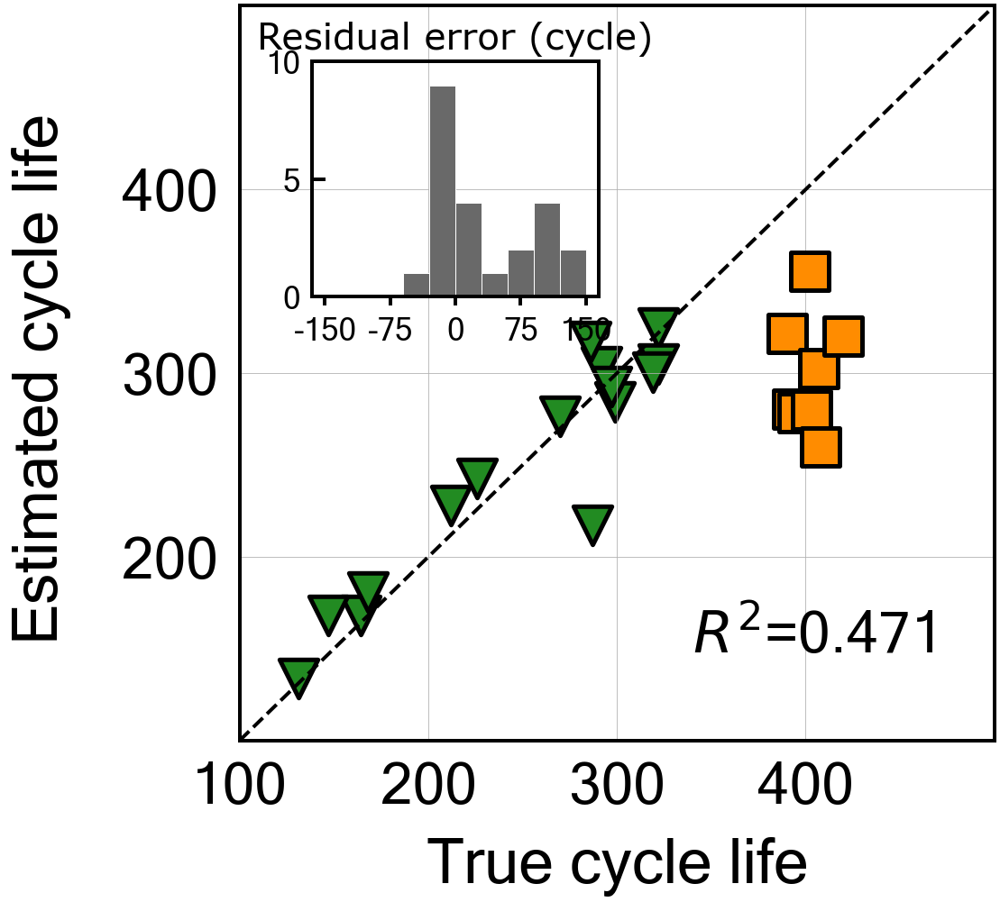


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -52.7089344533857
Cycle no: 101
Coefficient:
T_V('Charge', 'Variance', '101') : -0.0070574575431807665
T_V('Charge', 'Mean', '101') : 0.07387741596800317
T_V('Charge', 'Skewness', '101') : 0.22805423502563393
dTdV('Charge', 'Maximum', '101') : 0.0
dTdV('Charge', 'Mean', '101') : -0.0
dTdV('Charge', 'Kurtosis', '101') : -0.0

Intercept: 0.6202443280977316
MAE_all: 37.0
MAPE_all: 11.6 %
RMSE_all: 44.7
RMSPE_all: 13.0 %
MAE_train: 21.9
MAPE_train: 9.1 %
RMSE_train: 27.4
RMSPE_train: 10.9 %
MAE_test: 65.4
MAPE_test: 16.2 %
RMSE_test: 65.8
RMSPE_test: 16.3 %
R2 normal-scale scores
All data r2-score: 0.756
Train data r2-score: 0.828
Test data r2-score: -52.709

Normal-scale scores
All data score: 0.756
Train data score: 0.828
Test data score: -52.709


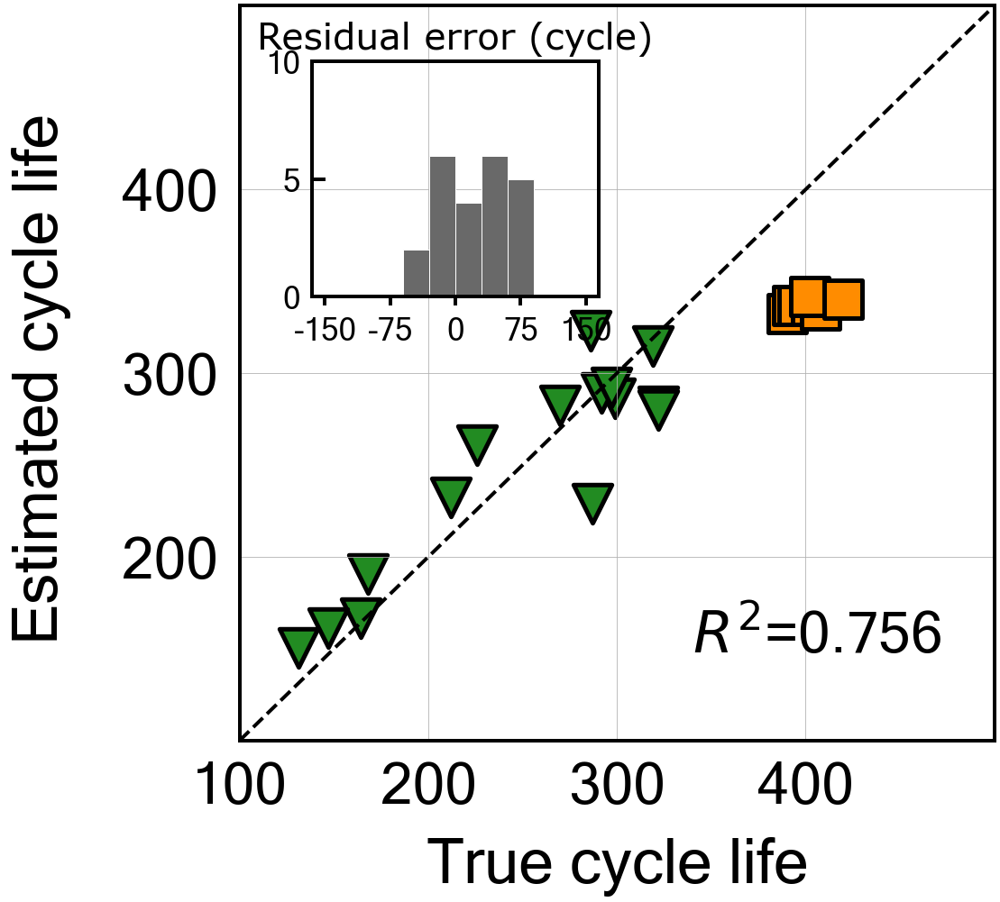


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -27.230234441164175
Cycle no: 102
Coefficient:
T_V('Charge', 'Variance', '102') : -0.03163190271638775
T_V('Charge', 'Mean', '102') : 0.12699350959571015
T_V('Charge', 'Skewness', '102') : 0.20734644187016324
dTdV('Charge', 'Maximum', '102') : 0.0
dTdV('Charge', 'Mean', '102') : -0.0
dTdV('Charge', 'Kurtosis', '102') : 0.0

Intercept: 0.6202443280977321
MAE_all: 27.9
MAPE_all: 8.8 %
RMSE_all: 33.6
RMSPE_all: 10.0 %
MAE_train: 17.8
MAPE_train: 7.3 %
RMSE_train: 22.6
RMSPE_train: 9.0 %
MAE_test: 46.8
MAPE_test: 11.6 %
RMSE_test: 47.7
RMSPE_test: 11.8 %
R2 normal-scale scores
All data r2-score: 0.862
Train data r2-score: 0.883
Test data r2-score: -27.230

Normal-scale scores
All data score: 0.862
Train data score: 0.883
Test data score: -27.230


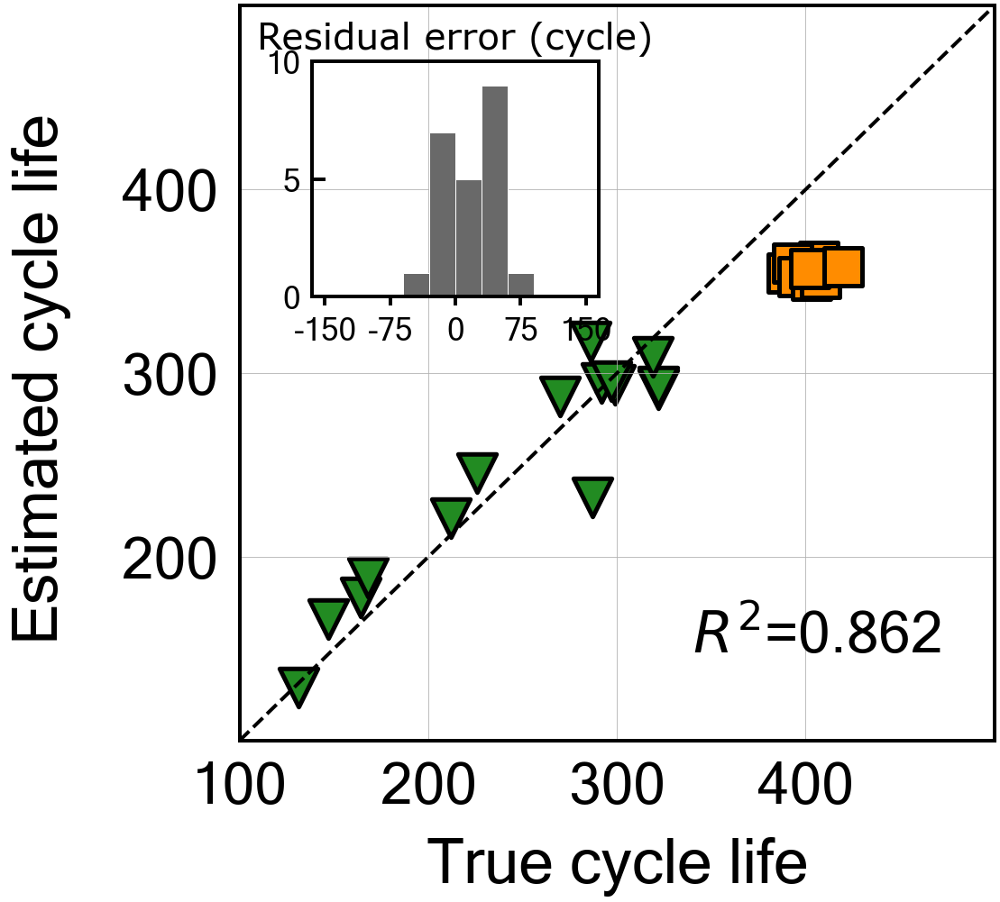


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -41.53266452399312
Cycle no: 103
Coefficient:
T_V('Charge', 'Variance', '103') : -0.010729771399072007
T_V('Charge', 'Mean', '103') : 0.13103999629039517
T_V('Charge', 'Skewness', '103') : 0.1903151235348327
dTdV('Charge', 'Maximum', '103') : -0.0
dTdV('Charge', 'Mean', '103') : -0.021962031325865907
dTdV('Charge', 'Kurtosis', '103') : -0.0144459856573502

Intercept: 0.6202443280977323
MAE_all: 32.7
MAPE_all: 10.2 %
RMSE_all: 39.5
RMSPE_all: 11.4 %
MAE_train: 19.1
MAPE_train: 7.9 %
RMSE_train: 23.6
RMSPE_train: 9.3 %
MAE_test: 58.2
MAPE_test: 14.4 %
RMSE_test: 58.6
RMSPE_test: 14.5 %
R2 normal-scale scores
All data r2-score: 0.810
Train data r2-score: 0.872
Test data r2-score: -41.533

Normal-scale scores
All data score: 0.810
Train data score: 0.872
Test data score: -41.533


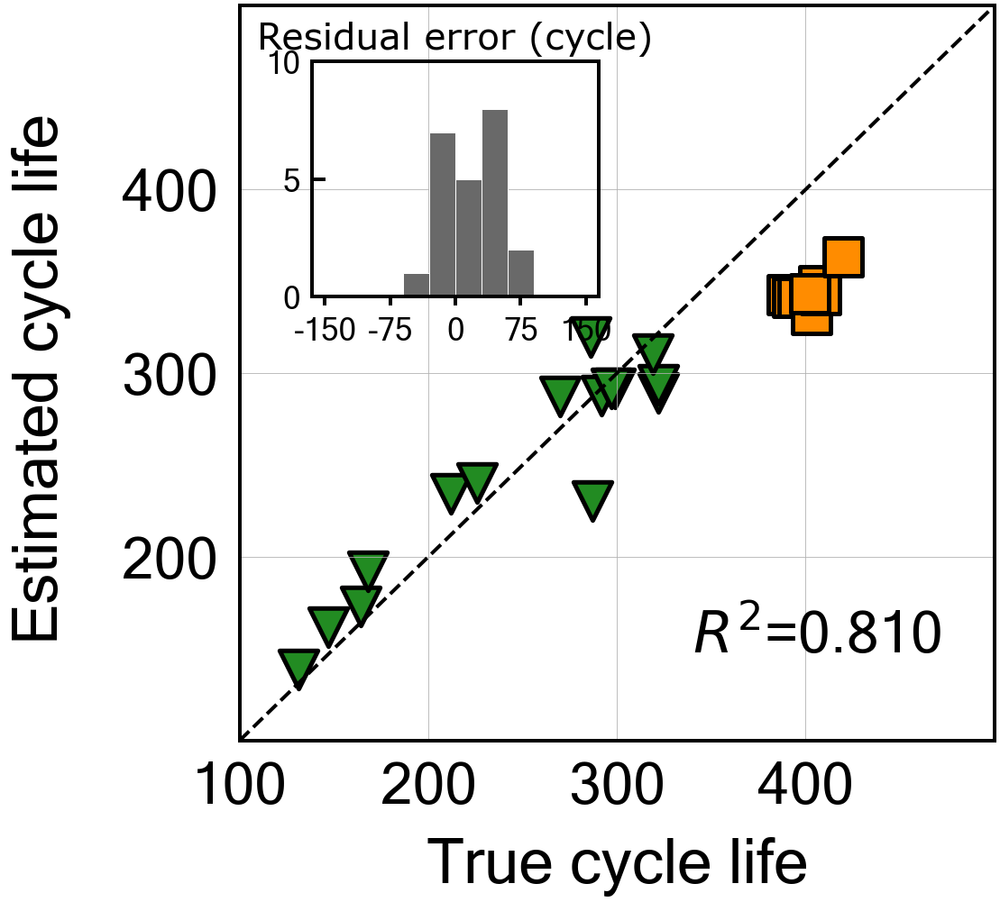


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -7.779996316576913
Cycle no: 104
Coefficient:
T_V('Charge', 'Variance', '104') : -0.34006303028178053
T_V('Charge', 'Mean', '104') : 0.1505494018156168
T_V('Charge', 'Skewness', '104') : 0.1834115270198884
dTdV('Charge', 'Maximum', '104') : 0.05233474533125808
dTdV('Charge', 'Mean', '104') : 0.2486053823266296
dTdV('Charge', 'Kurtosis', '104') : -0.012514489332192371

Intercept: 0.6202443280977304
MAE_all: 17.4
MAPE_all: 5.9 %
RMSE_all: 23.4
RMSPE_all: 7.6 %
MAE_train: 16.1
MAPE_train: 6.3 %
RMSE_train: 21.5
RMSPE_train: 8.1 %
MAE_test: 20.0
MAPE_test: 5.0 %
RMSE_test: 26.6
RMSPE_test: 6.6 %
R2 normal-scale scores
All data r2-score: 0.933
Train data r2-score: 0.894
Test data r2-score: -7.780

Normal-scale scores
All data score: 0.933
Train data score: 0.894
Test data score: -7.780


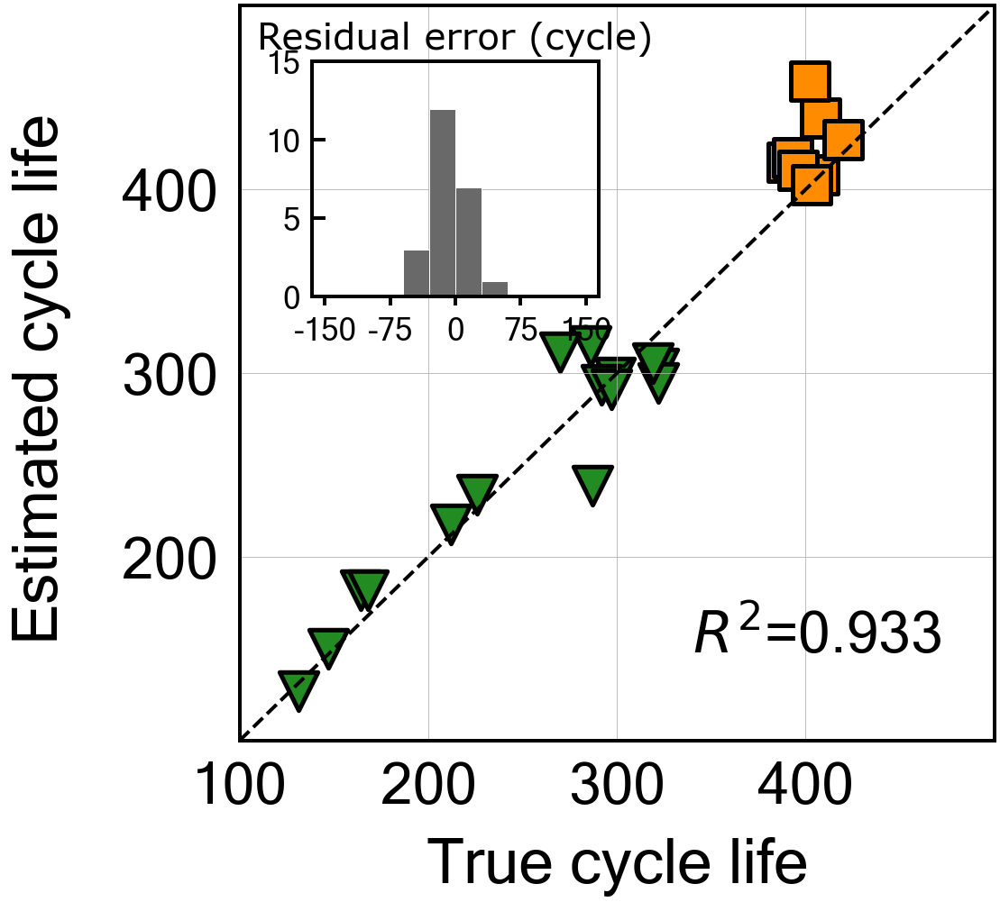


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -98.69049575985667
Cycle no: 105
Coefficient:
T_V('Charge', 'Variance', '105') : -0.14546970041796636
T_V('Charge', 'Mean', '105') : 0.16403777382232698
T_V('Charge', 'Skewness', '105') : 0.18523280009165044
dTdV('Charge', 'Maximum', '105') : 0.1744825940883798
dTdV('Charge', 'Mean', '105') : -0.04347032094371807
dTdV('Charge', 'Kurtosis', '105') : -0.012199042318537858

Intercept: 0.6202443280977341
MAE_all: 32.9
MAPE_all: 9.4 %
RMSE_all: 53.8
RMSPE_all: 13.9 %
MAE_train: 9.4
MAPE_train: 4.1 %
RMSE_train: 12.1
RMSPE_train: 5.4 %
MAE_test: 77.0
MAPE_test: 19.2 %
RMSE_test: 89.7
RMSPE_test: 22.3 %
R2 normal-scale scores
All data r2-score: 0.646
Train data r2-score: 0.966
Test data r2-score: -98.690

Normal-scale scores
All data score: 0.646
Train data score: 0.966
Test data score: -98.690


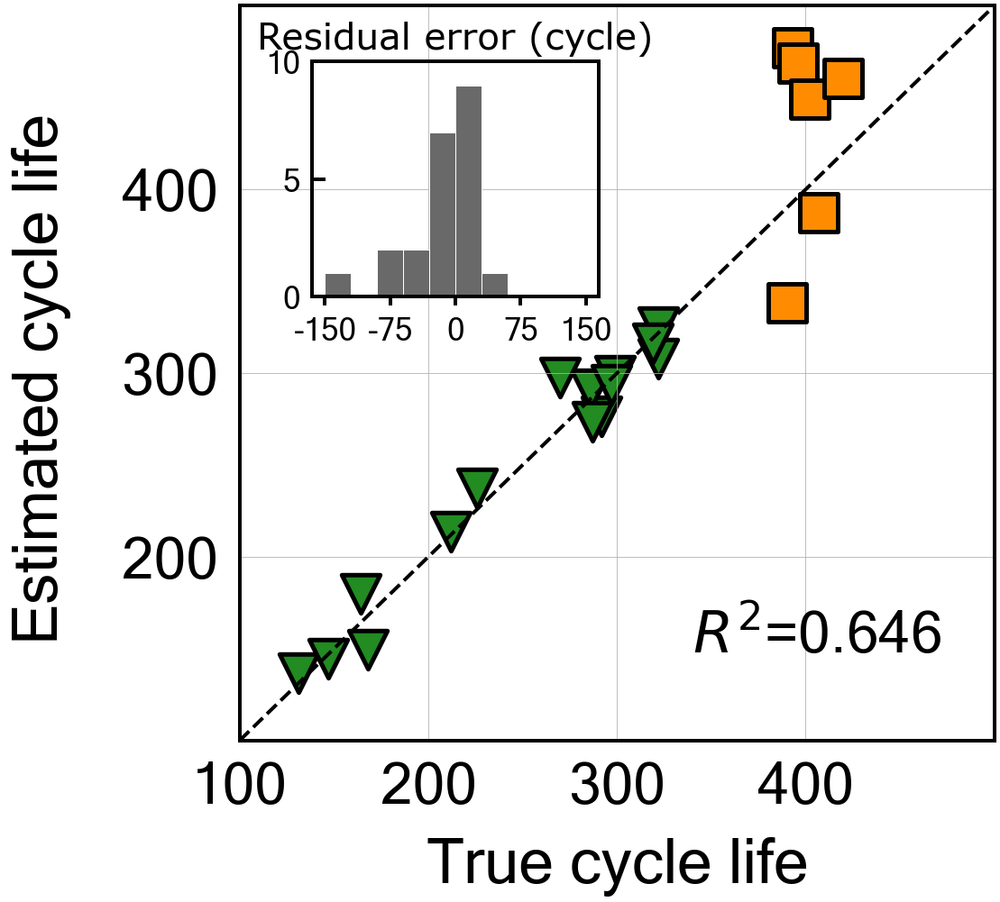


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -77.88023027902547
Cycle no: 106
Coefficient:
T_V('Charge', 'Variance', '106') : -0.003321432847011611
T_V('Charge', 'Mean', '106') : 0.06819670490961818
T_V('Charge', 'Skewness', '106') : 0.22716164705211078
dTdV('Charge', 'Maximum', '106') : -0.0
dTdV('Charge', 'Mean', '106') : -0.0028810049510162796
dTdV('Charge', 'Kurtosis', '106') : -0.051746793619611334

Intercept: 0.620244328097731
MAE_all: 39.8
MAPE_all: 11.9 %
RMSE_all: 50.5
RMSPE_all: 13.6 %
MAE_train: 19.3
MAPE_train: 7.8 %
RMSE_train: 22.7
RMSPE_train: 8.8 %
MAE_test: 78.4
MAPE_test: 19.5 %
RMSE_test: 79.8
RMSPE_test: 19.8 %
R2 normal-scale scores
All data r2-score: 0.688
Train data r2-score: 0.882
Test data r2-score: -77.880

Normal-scale scores
All data score: 0.688
Train data score: 0.882
Test data score: -77.880


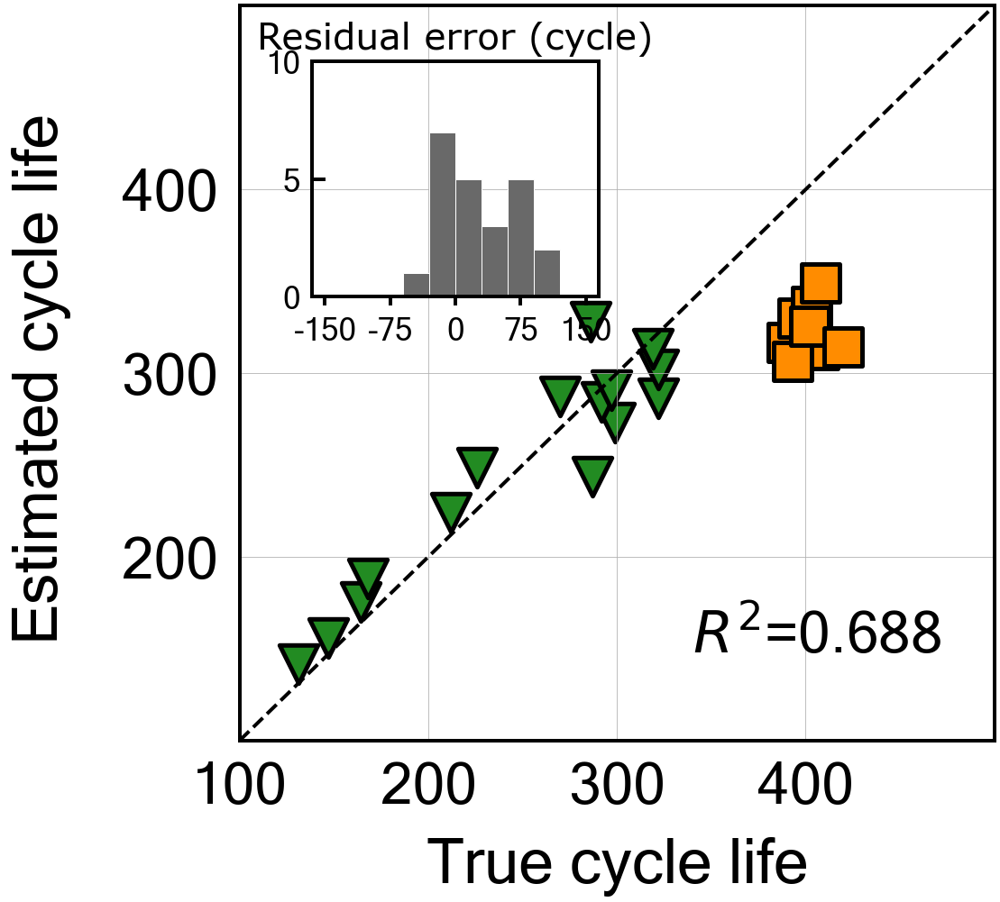


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -29.4709947896028
Cycle no: 107
Coefficient:
T_V('Charge', 'Variance', '107') : 0.015305235091119269
T_V('Charge', 'Mean', '107') : 0.10296710132466404
T_V('Charge', 'Skewness', '107') : 0.2564628630805734
dTdV('Charge', 'Maximum', '107') : -0.1304087910854855
dTdV('Charge', 'Mean', '107') : 0.03796941666191028
dTdV('Charge', 'Kurtosis', '107') : 0.09873004880625429

Intercept: 0.6202443280977303
MAE_all: 23.5
MAPE_all: 7.1 %
RMSE_all: 32.1
RMSPE_all: 9.0 %
MAE_train: 12.6
MAPE_train: 5.1 %
RMSE_train: 16.4
RMSPE_train: 6.8 %
MAE_test: 44.0
MAPE_test: 10.9 %
RMSE_test: 49.6
RMSPE_test: 12.2 %
R2 normal-scale scores
All data r2-score: 0.874
Train data r2-score: 0.939
Test data r2-score: -29.471

Normal-scale scores
All data score: 0.874
Train data score: 0.939
Test data score: -29.471


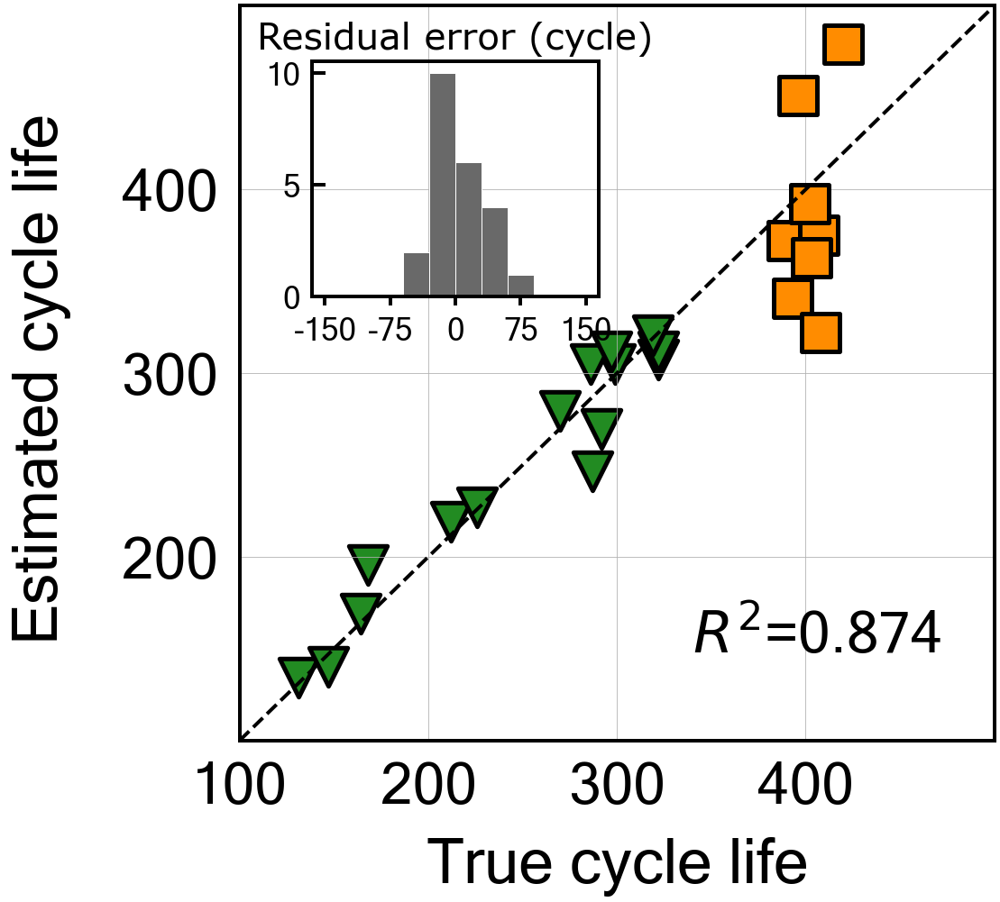


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -28.174026938507502
Cycle no: 108
Coefficient:
T_V('Charge', 'Variance', '108') : 0.0
T_V('Charge', 'Mean', '108') : 0.1336460981348075
T_V('Charge', 'Skewness', '108') : 0.20647327402393237
dTdV('Charge', 'Maximum', '108') : -0.06853944123924278
dTdV('Charge', 'Mean', '108') : -0.003530606227084237
dTdV('Charge', 'Kurtosis', '108') : -0.018124818767874914

Intercept: 0.6202443280977302
MAE_all: 24.3
MAPE_all: 7.7 %
RMSE_all: 32.9
RMSPE_all: 9.8 %
MAE_train: 14.6
MAPE_train: 6.2 %
RMSE_train: 20.1
RMSPE_train: 8.6 %
MAE_test: 42.4
MAPE_test: 10.4 %
RMSE_test: 48.5
RMSPE_test: 11.8 %
R2 normal-scale scores
All data r2-score: 0.868
Train data r2-score: 0.907
Test data r2-score: -28.174

Normal-scale scores
All data score: 0.868
Train data score: 0.907
Test data score: -28.174


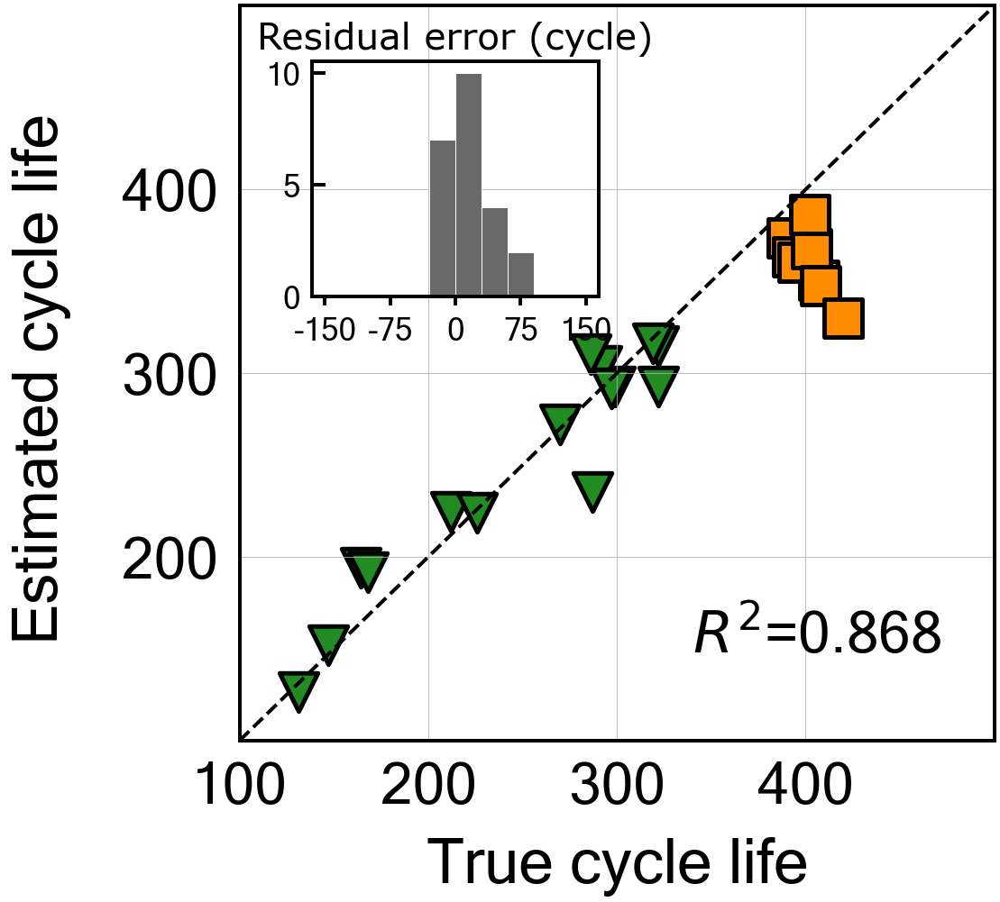


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -52.50346927146745
Cycle no: 109
Coefficient:
T_V('Charge', 'Variance', '109') : -0.03584094701607415
T_V('Charge', 'Mean', '109') : 0.16976544490130213
T_V('Charge', 'Skewness', '109') : 0.12831907353635974
dTdV('Charge', 'Maximum', '109') : 0.013041478893200231
dTdV('Charge', 'Mean', '109') : -0.004682405258813802
dTdV('Charge', 'Kurtosis', '109') : -0.07407385619141024

Intercept: 0.6202443280977319
MAE_all: 33.1
MAPE_all: 10.1 %
RMSE_all: 42.2
RMSPE_all: 11.8 %
MAE_train: 15.9
MAPE_train: 6.8 %
RMSE_train: 20.5
RMSPE_train: 8.5 %
MAE_test: 65.4
MAPE_test: 16.3 %
RMSE_test: 65.7
RMSPE_test: 16.3 %
R2 normal-scale scores
All data r2-score: 0.783
Train data r2-score: 0.903
Test data r2-score: -52.503

Normal-scale scores
All data score: 0.783
Train data score: 0.903
Test data score: -52.503


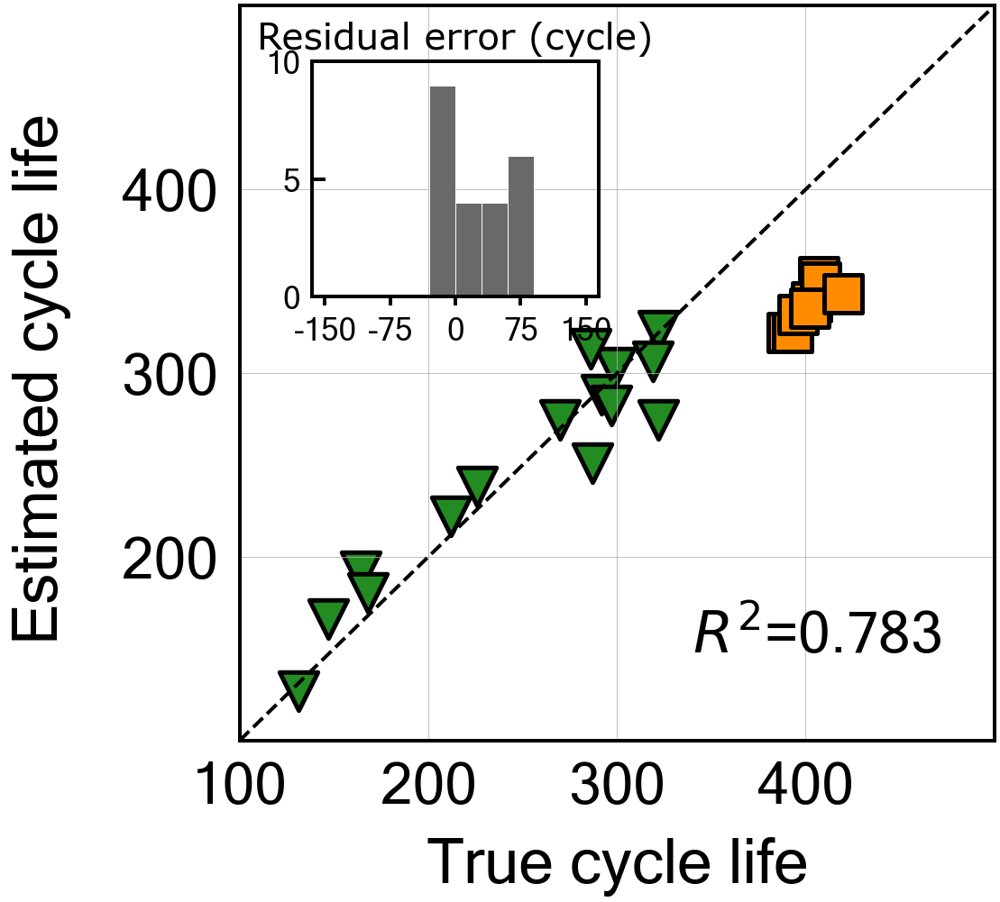


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.2
Best score obtained was: -164.42123850461618
Cycle no: 110
Coefficient:
T_V('Charge', 'Variance', '110') : -0.0
T_V('Charge', 'Mean', '110') : 0.17068998029657123
T_V('Charge', 'Skewness', '110') : 0.1608640588668218
dTdV('Charge', 'Maximum', '110') : -0.020903793742316268
dTdV('Charge', 'Mean', '110') : -0.0
dTdV('Charge', 'Kurtosis', '110') : -0.00393955592813564

Intercept: 0.6202443280977327
MAE_all: 52.4
MAPE_all: 15.2 %
RMSE_all: 71.2
RMSPE_all: 18.9 %
MAE_train: 19.6
MAPE_train: 8.2 %
RMSE_train: 25.3
RMSPE_train: 10.5 %
MAE_test: 113.9
MAPE_test: 28.2 %
RMSE_test: 115.6
RMSPE_test: 28.6 %
R2 normal-scale scores
All data r2-score: 0.381
Train data r2-score: 0.853
Test data r2-score: -164.421

Normal-scale scores
All data score: 0.381
Train data score: 0.853
Test data score: -164.421


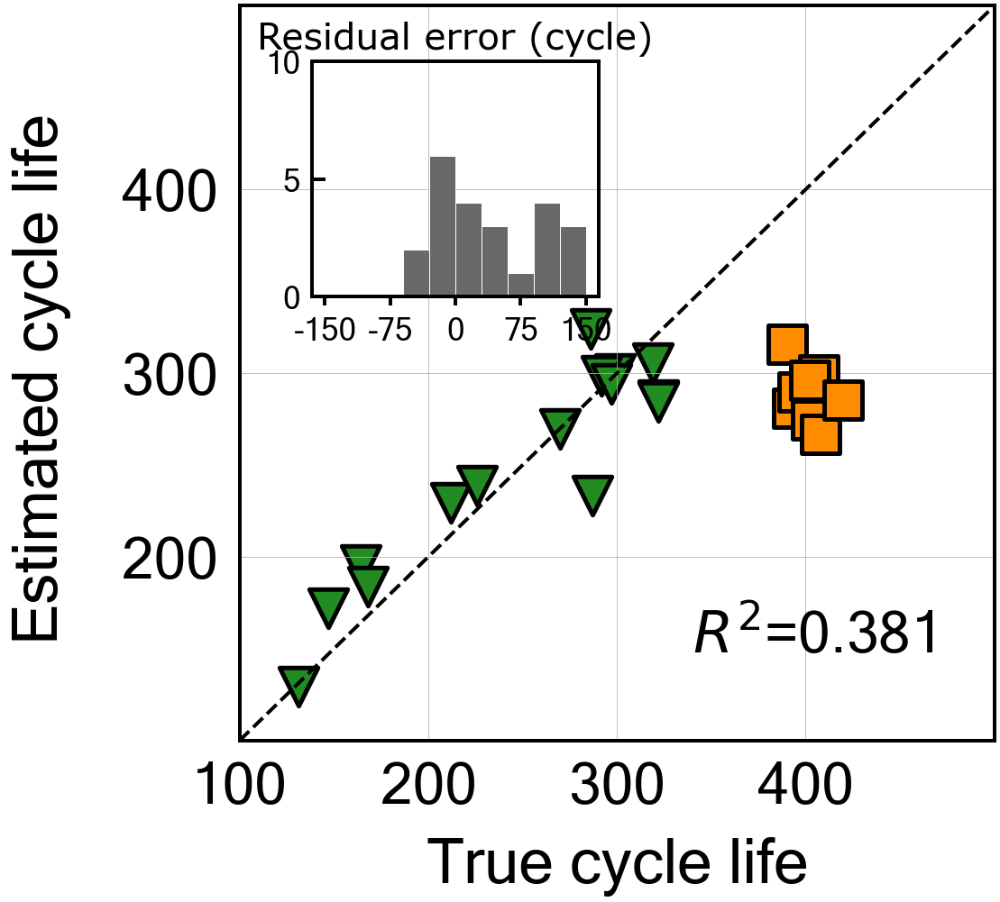

In [ ]:
# To store the output and save, if necessary
stringOutputList = []
# Define modes for feature extraction
modeList = ['Charge', 'Discharge']
# Here, we iterate until cycle xxx (e.g., 110) to extract features
for setCycleNo in [str(x) for x in range(2,111,1)]:
    # Initialize an empty DataFrame to store feature metadata and scores for every iteration
    feat_df = pd.DataFrame(columns=['dictionary', 'featName', 'valueArray', 'rScore'])

    ## 1. T(V)
    featureDict = T_V.copy() # Copy the T(V) feature dictionary
    featureKeynameUniqueList = TVKeynameUnique.copy()# Copy unique keynames for T(V)
    keyCycle = setCycleNo # Use predefined cycle range
    sample_size = featureDict[('Charge', 'Maximum', keyCycle)].size # Determine sample size from one feature

    featureKeynameList = []

    # Prepare target variable
    X = np.empty((sample_size,0))
    y = featureDict['cycleLife'].ravel()

    # Generate feature keys for both modes and selected statistics
    for keyMode in modeList:
        for keyStat in featureKeynameUniqueList[1][:-1]:
            featureKeynameList.append((keyMode, keyStat, keyCycle))
            
    # Build feature matrix X by stacking each feature column
    for feat in featureKeynameList: 
        # Check for -inf values and replace them with the average of the previous cycle
        if -np.inf in featureDict[feat]:
            print("Found -inf in T(V)", feat)
            for infIdx in np.where(featureDict[feat] == -np.inf)[0]: featureDict[feat][infIdx] = featureDict[(feat[0], feat[1], str(int(setCycleNo)-1))][infIdx]    
        X = np.append(X, featureDict[feat].reshape(-1,1), axis=1)
    # Evaluate feature relevance using rScore
    rScore = evaluation_utils.rScore(X, y, featureKeynameList, toPrint=False)

    # Append results to the feature DataFrame
    for i in range(len(featureKeynameList)):
        newRow = {'dictionary': 'T_V', 'featName': featureKeynameList[i], 'valueArray': X[:, i], 'rScore': rScore[i]}
        feat_df = feat_df.append(newRow, ignore_index=True)
        
        
    ## 2. dT/dV
    featureDict = dTdV.copy() # Copy dT/dV feature dictionary
    X = np.empty((sample_size,0)) # Reset feature matrix
    # Reuse same feature keys from T(V) for consistency
    for feat in featureKeynameList: 
        # Check for -inf values and replace them with the average of the previous cycle
        if -np.inf in featureDict[feat]:
            print("Found -inf in dT/dV", feat)
            for infIdx in np.where(featureDict[feat] == -np.inf)[0]: 
                featureDict[feat][infIdx] = featureDict[(feat[0], feat[1], str(int(setCycleNo)-1))][infIdx]     
        X = np.append(X, featureDict[feat].reshape(-1,1), axis=1)
        # Evaluate rScores for dT/dV features
    rScore = evaluation_utils.rScore(X, y, featureKeynameList, toPrint=False)

    # Append results to the feature DataFrame
    for i in range(len(featureKeynameList)):
        newRow = {'dictionary': 'dTdV', 'featName': featureKeynameList[i], 'valueArray': X[:, i], 'rScore': rScore[i]}
        feat_df = feat_df.append(newRow, ignore_index=True)
        
    # Use the same feature subset, combo. Obtained by optimal search from exhaustive search
    combo = [3, 4, 5, 14, 18, 20]
    i = len(combo)
    # # Initiate savepath variable
    savepath = os.path.join('.', 'folder', 'fileName_avg3to100_'+str(i)+'feat')
    # Set model name and feature column indices
    modelName = "Temperature model"
    columnIdx = combo
        
    # Stack all feature arrays into a 2D array and transpose to shape (samples, features)
    X_array = np.vstack(feat_df.loc[:, 'valueArray']).transpose()

    print("\nTemperature model\nrScore compared --> Test set")

    startTime = time.time()

    featureKeynameListBest = []
    saveFilePath = os.path.join(savepath, 'cycleNo'+setCycleNo+'_feat'+str(i)+'.png')

    # Extract selected features from full feature array
    featureKeynameList = []
    X_all = X_array[:, combo]

    # Build list of feature names for reporting
    for j in combo:
        featureKeynameList.append(feat_df.loc[j, 'dictionary'] + str(feat_df.loc[j, 'featName']))

    # Split data into training and testing sets
    X_train  = X_all[train_index]
    X_test = X_all[test_index]

    # Standardize features using training set statistics
    scaler = StandardScaler().fit(X_train)
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    X_all_scaled = np.concatenate((X_train_scaled, X_test_scaled))

    # Initialize and train ElasticNet model with cross-validation
    regEN = ElasticNetCV(l1_ratio=np.linspace(0.01,1,100), cv=4, random_state=20, max_iter=100000, n_jobs=3, tol=1e-2, verbose=0, selection='random')
    model = regEN
    model.fit(X_train_scaled, y_train_scaled)

    # Evaluate model performance on test set
    r2ScoreBest = model.score(X_test_scaled, y_test_scaled)
    
    # Store best model and associated data
    featureKeynameListBest = featureKeynameList
    modelBest = model
    X_all_scaled_best = X_all_scaled
                
    # Print summary of training time and best score
    stringOutputManual = ("\n------------------------------------------------------------------------\n" + 
                    "Time elapsed: {:.1f}".format(time.time() - startTime) + 
                    "\nBest score obtained was: " + str(r2ScoreBest))
    print(stringOutputManual)
    # Print detailed model evaluation and generate comparison plots
    stringOutput = train_utils.print_result(setCycleNo, modelBest, X_all_scaled_best, y_all_scaled, featureKeynameListBest, idlst=lengthList, yScaler=yScaler)
    stringOutput += plot_utils.build_all_comparison_graph(X_all_scaled_best, y_all_scaled, modelBest, len_list = [len(train_index), len(test_index)], yScaler=yScaler, 
                                                            name=modelName, markerArr = markerArr, markerSize=1800, save = saveFilePath)
    stringOutputList.append(stringOutputManual + stringOutput)
    
# # Uncomment below to save the output to a text file
# with open(os.path.join(savepath, "output.txt"), "w") as f:
#     f.write('\n'.join(stringOutputList))
#     f.close()